# Final results collected here for further analysis

## Correlated replica method

In [1]:
import numpy as np
import pathlib
import pandas as pd 
import matplotlib.pyplot as plt

In [2]:
NDATA = 4616 #number of data in the fit
FITDATA = 3438
VALDATA = NDATA - FITDATA
VARCHI2 = 1.0 / NDATA #Varchi2 normalized to ndata
raw_data_path = pathlib.Path('raw_data')
TRUE_VALUE = 0.118

## Definition of functions

In [48]:
def measure(replica_data):
    return replica_data.training*(FITDATA/NDATA) + replica_data.validation*(VALDATA/NDATA)
def fit_parabola(data, log=False, exp=False, bootstrap_err=None, namefig=None):
    mins = {}
    for ind, row in data.iterrows():
        if bootstrap_err is not None:
            weights = [1./std for std in bootstrap_err.values[0]]
            a, b, c = np.polyfit(data.columns.astype(float), row, 2, w=weights)
        else:
            if log:
                a, b, c = np.polyfit(np.log(data.columns.astype(float)), row, 2)      
            else:
                a, b, c = np.polyfit(data.columns.astype(float), row, 2)
        if not np.isnan(b): # NaN if not all replicas passed postfit
            mins[ind] = -b / 2 / a
    mins = pd.Series(mins)
    if exp: 
        uncer = np.sqrt(VARCHI2/a)
        if bootstrap_err is not None:
            plt.scatter(data.columns.astype(float),data.values,  color="blue" )
            plt.errorbar(data.columns.astype(float), data.values[0], yerr=bootstrap_err.values[0], fmt="o")
            plt.plot(np.linspace(0.106, 0.130), [a*x*x + b*x + c for x in np.linspace(0.106, 0.130)], color="black", linestyle="--")
        else:
            plt.scatter(data.columns.astype(float),data.values, color="blue", label="DATA" )
            plt.plot(np.linspace(0.106, 0.130), [a*x*x + b*x + c for x in np.linspace(0.106, 0.130)], color="black", linestyle="--", label="FIT")
            plt.title(f"cv±std = {mins[0]:.5f} ± {uncer:.5f} ")
            plt.legend()
        if namefig is not None:
            plt.savefig(namefig)
        else:
            plt.show()
        plt.close()
        return mins[0], uncer
    return mins
def describe_results(mins, namefig=None):
    print(mins.describe(percentiles=[0.16,0.84]))
    print("")
    print(f"cv±std = {mins.mean():.5f} ± {mins.std():.5f} ")
    print(f"1std interval:  {mins.mean()-mins.std():.5f} to {mins.mean()+mins.std():.5f} ")
    print(f"68% c.i:        {mins.describe(percentiles=[0.16,0.84])[4]:.5f} to {mins.describe(percentiles=[0.16,0.84])[6]:.5f} ")
    from validphys.plotutils import kde_plot
    fig, ax = plt.subplots()
    kde_plot(mins,ax=ax)
    central = (mins.describe(percentiles=[0.16,0.84])[6] + mins.describe(percentiles=[0.16,0.84])[4])/2
    unc = (mins.describe(percentiles=[0.16,0.84])[6] - mins.describe(percentiles=[0.16,0.84])[4])/2
    ax.set_title(f"68% c.i: {central:.5f}  ± {unc:.5f}")
    ax.set_xlabel(r"$\alpha_s$")
    if namefig is not None:
        plt.savefig(namefig)
    else:
        plt.show()
    plt.close()
    return mins.mean(), mins.std()
def hist_results(mins, data, namefig=None):
    plt.hist(mins,bins=data.columns.astype(float)-0.0005,edgecolor='black',density=True)
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    from scipy.stats import norm
    p = norm.pdf(x, mins.mean(), mins.std())
    plt.plot(x,p,'k',label=f"{mins.mean():.5f} +/- {mins.std():.5f}")
    plt.yticks([])
    plt.legend()
    if namefig is not None:
        plt.savefig(namefig)
    else:
        plt.show()
    plt.close()
def hist_multict_alphas(alphas_measured, namefig=None):
    plt.hist(np.array(alphas_measured).T[0],bins=6, edgecolor='black',density=True)
    plt.title(f"cv±std = {np.average(np.array(alphas_measured).T[0], weights=1./np.array(alphas_measured).T[1]):.5f} ± {np.std(np.array(alphas_measured).T[0]):.5f}")
    if namefig is not None:
        plt.savefig(namefig)
    else:
        plt.show()
    plt.close()
    return np.average(np.array(alphas_measured).T[0], weights=1./np.array(alphas_measured).T[1]), np.std(np.array(alphas_measured).T[0])
def bias(measured_value, true_value):
    return ((measured_value[0] - true_value)*(measured_value[0] - true_value))/ (measured_value[1]**2)
def bootstrap_bias(measured_values, Nsample=100, to_keep=1.0):
    bootstrap_biases = []
    for _ in range(Nsample):
        biases = []
        measured_values = np.array(measured_values)
        sample_bootstrap = measured_values[np.random.choice(len(measured_values), int(len(measured_values)*to_keep), replace=True)]
        for val in sample_bootstrap:
            biases.append(bias(val, TRUE_VALUE))
        bootstrap_biases.append(np.average(biases))
    return (np.average(bootstrap_biases), np.std(bootstrap_biases))
def prop_unc_ratio(bias_boot):
    return (np.sqrt(bias_boot[0]), (bias_boot[1]/(2*bias_boot[0]))*np.sqrt(bias_boot[0]))
def apply_bootstrap(replicas_chi2, Npart=10):
    #shuffle the array
    np.random.shuffle(replicas_chi2)
    #split the shuffled array
    splitted_replicas_chi2s = np.split(replicas_chi2, Npart)
    #compute the chi2 mean for each of the splits
    means_replicas_chi2s = [np.mean(entry) for entry in splitted_replicas_chi2s]
    #compute the variance of the ensable
    return np.std(means_replicas_chi2s)
def hist_comparison(list_results, dict_res, namefig=None):
    from scipy.stats import norm
    colors = ["blue", "orange", "green", "magenta", "yellow", "cyan", "salmon"]
    for meth, tohist, col in zip(dict_res.keys(), list_results, colors):
        plt.hist(np.array(tohist).T[0], bins = 8, label=f"{meth}={dict_res[meth][0]:.5f} +/- {dict_res[meth][1]:.5f}", color=col ,alpha=0.5, density=True, edgecolor="black")
        xmin, xmax = plt.xlim()
        x = np.linspace(xmin, xmax, 100)
        normpdf = norm.pdf(x, dict_res[meth][0], dict_res[meth][1])
        plt.plot(x,normpdf,'k', color=col)
    plt.title("Comparison of distributions for different methods.")
    plt.yticks([])
    plt.legend()
    if namefig is not None:
        plt.savefig(namefig)
    else:
        plt.show()
    plt.close()
def compare_methodologies(dict_res, list_results):
    from tabulate import tabulate
    print(tabulate(np.array(list(dict_res.values())), headers=["alpha_s", "uncertainty", "R_bv", "Bootstrap uncertainty"], tablefmt='fancy_grid', showindex=list(dict_res.keys())))
    hist_comparison(list_results, dict_res)

In [4]:
data_crm_min = []
data_crm_mean = []
data_crm_all_batches = []
for i_seed in range(25):
    data_crm_min.append(pd.read_csv(raw_data_path / f'{i_seed}_min.csv', usecols=[i for i in range(1, 15)]))
    data_crm_mean.append(pd.read_csv(raw_data_path / f'{i_seed}_mean.csv', usecols=[i for i in range(1, 15)]))
    data_crm_all_batches.append([pd.read_csv(raw_data_path / f'{i_seed}_mean_after_batch{batch}.csv', usecols=[i for i in range(1, 15)]) for batch in ['1','2','3']])

## Getting $\alpha_s$ values

count    103.000000
mean       0.118410
std        0.000340
min        0.117560
16%        0.118033
50%        0.118414
84%        0.118739
max        0.119305
dtype: float64

cv±std = 0.11841 ± 0.00034 
1std interval:  0.11807 to 0.11875 
68% c.i:        0.11803 to 0.11874 


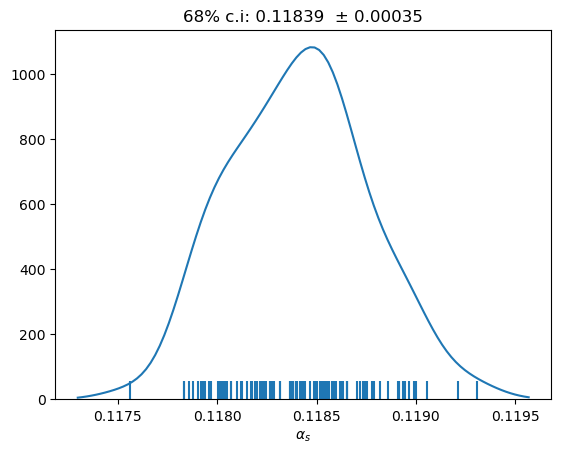

count    104.000000
mean       0.118600
std        0.000354
min        0.117607
16%        0.118265
50%        0.118592
84%        0.118944
max        0.119563
dtype: float64

cv±std = 0.11860 ± 0.00035 
1std interval:  0.11825 to 0.11895 
68% c.i:        0.11827 to 0.11894 


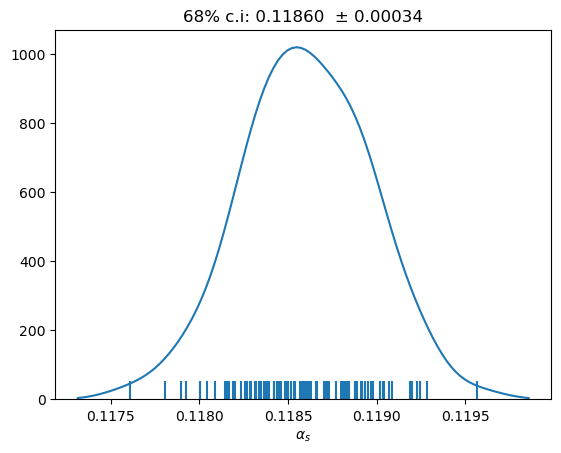

count    102.000000
mean       0.118245
std        0.000313
min        0.117527
16%        0.117934
50%        0.118215
84%        0.118565
max        0.118987
dtype: float64

cv±std = 0.11824 ± 0.00031 
1std interval:  0.11793 to 0.11856 
68% c.i:        0.11793 to 0.11857 


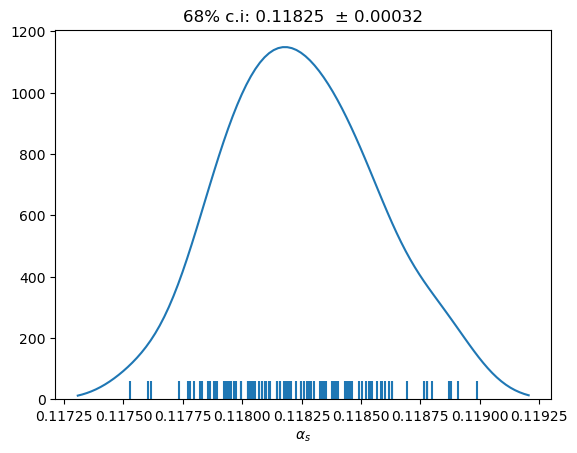

count    103.000000
mean       0.118561
std        0.000366
min        0.117761
16%        0.118240
50%        0.118518
84%        0.118952
max        0.119489
dtype: float64

cv±std = 0.11856 ± 0.00037 
1std interval:  0.11820 to 0.11893 
68% c.i:        0.11824 to 0.11895 


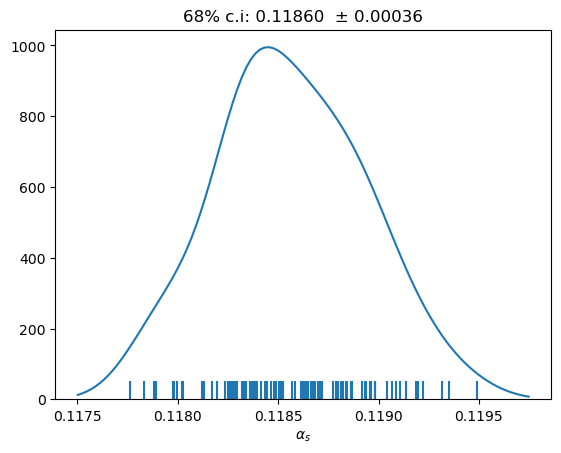

count    100.000000
mean       0.118240
std        0.000329
min        0.117482
16%        0.117954
50%        0.118207
84%        0.118526
max        0.119239
dtype: float64

cv±std = 0.11824 ± 0.00033 
1std interval:  0.11791 to 0.11857 
68% c.i:        0.11795 to 0.11853 


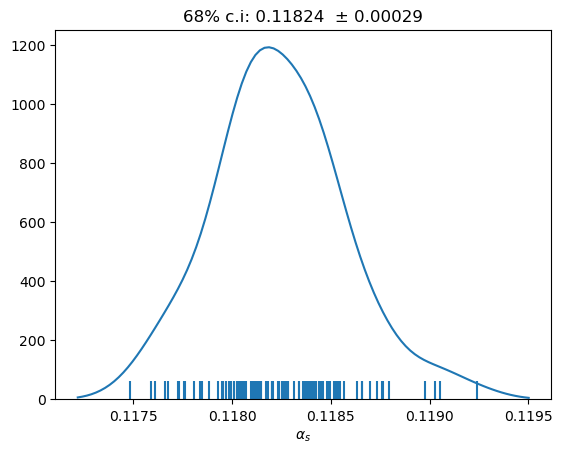

count    102.000000
mean       0.117854
std        0.000343
min        0.117014
16%        0.117489
50%        0.117859
84%        0.118220
max        0.118659
dtype: float64

cv±std = 0.11785 ± 0.00034 
1std interval:  0.11751 to 0.11820 
68% c.i:        0.11749 to 0.11822 


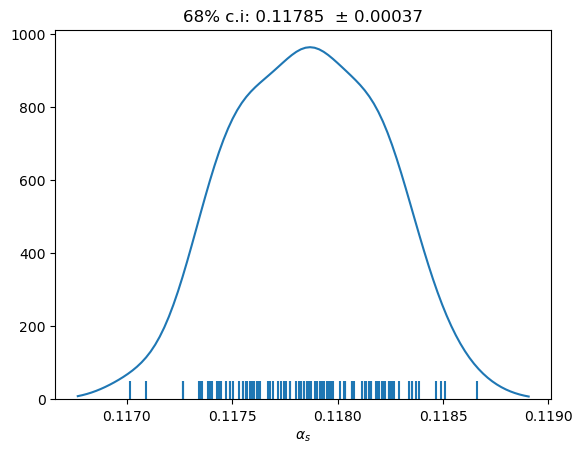

count    101.000000
mean       0.118101
std        0.000360
min        0.117184
16%        0.117792
50%        0.118130
84%        0.118416
max        0.119034
dtype: float64

cv±std = 0.11810 ± 0.00036 
1std interval:  0.11774 to 0.11846 
68% c.i:        0.11779 to 0.11842 


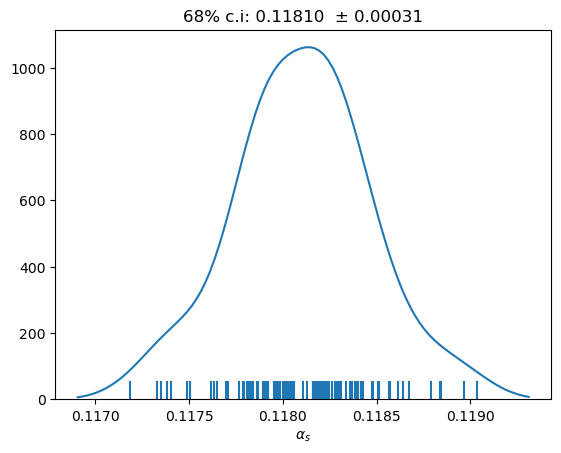

count    101.000000
mean       0.118107
std        0.000325
min        0.117372
16%        0.117815
50%        0.118113
84%        0.118389
max        0.118949
dtype: float64

cv±std = 0.11811 ± 0.00032 
1std interval:  0.11778 to 0.11843 
68% c.i:        0.11781 to 0.11839 


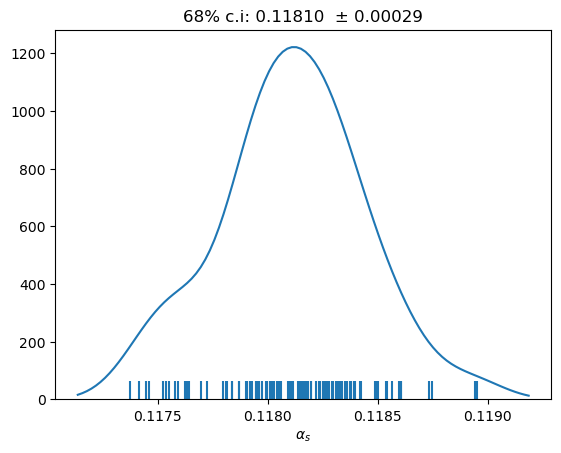

count    102.000000
mean       0.117461
std        0.000318
min        0.116778
16%        0.117134
50%        0.117436
84%        0.117823
max        0.118166
dtype: float64

cv±std = 0.11746 ± 0.00032 
1std interval:  0.11714 to 0.11778 
68% c.i:        0.11713 to 0.11782 


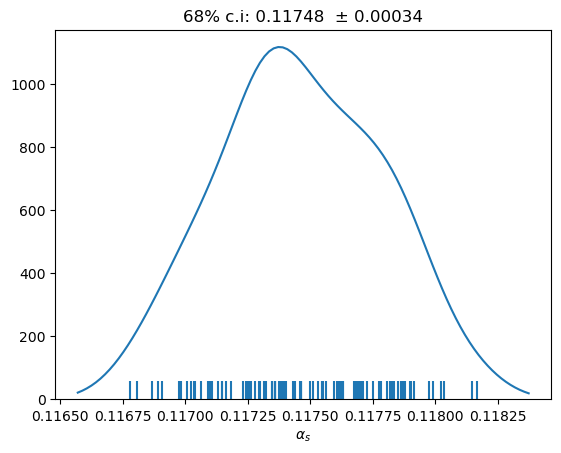

count    102.000000
mean       0.118087
std        0.000331
min        0.117127
16%        0.117775
50%        0.118076
84%        0.118445
max        0.119026
dtype: float64

cv±std = 0.11809 ± 0.00033 
1std interval:  0.11776 to 0.11842 
68% c.i:        0.11777 to 0.11845 


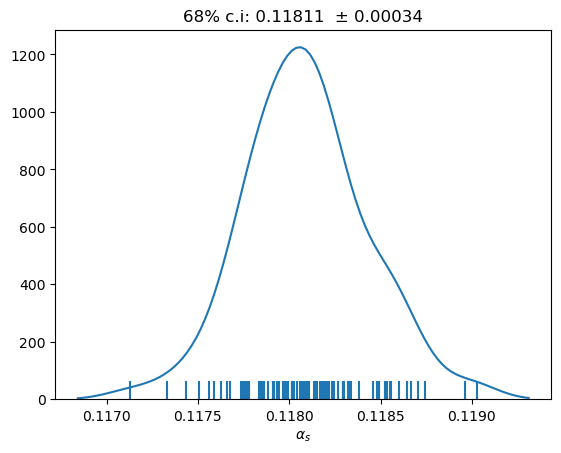

count    101.000000
mean       0.117945
std        0.000308
min        0.117262
16%        0.117621
50%        0.117920
84%        0.118279
max        0.118577
dtype: float64

cv±std = 0.11795 ± 0.00031 
1std interval:  0.11764 to 0.11825 
68% c.i:        0.11762 to 0.11828 


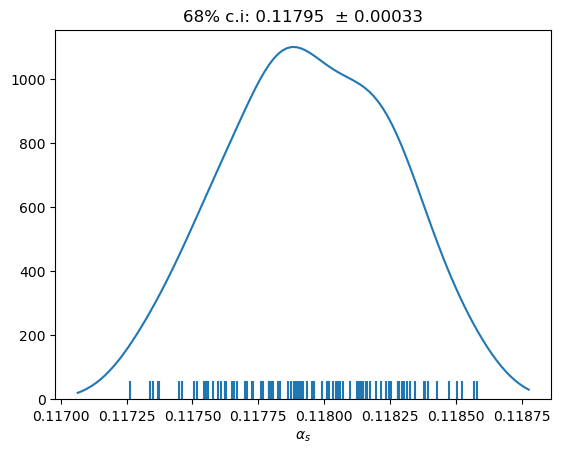

count    101.000000
mean       0.118085
std        0.000336
min        0.117325
16%        0.117756
50%        0.118088
84%        0.118393
max        0.118965
dtype: float64

cv±std = 0.11808 ± 0.00034 
1std interval:  0.11775 to 0.11842 
68% c.i:        0.11776 to 0.11839 


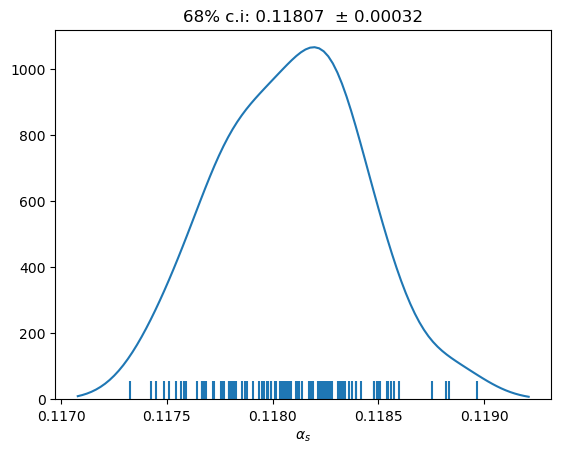

count    103.000000
mean       0.118206
std        0.000345
min        0.117276
16%        0.117867
50%        0.118203
84%        0.118552
max        0.118952
dtype: float64

cv±std = 0.11821 ± 0.00034 
1std interval:  0.11786 to 0.11855 
68% c.i:        0.11787 to 0.11855 


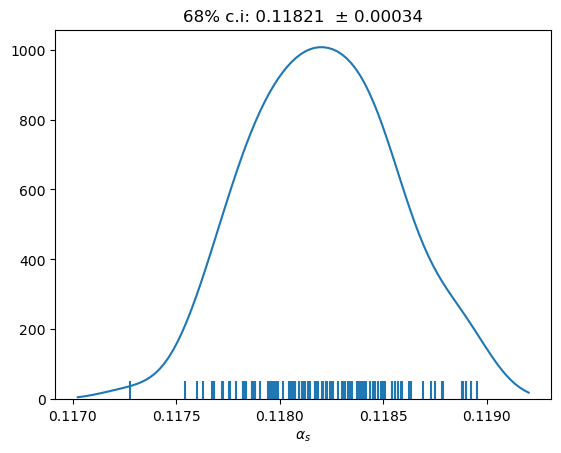

count    102.000000
mean       0.117942
std        0.000294
min        0.116993
16%        0.117664
50%        0.117924
84%        0.118225
max        0.118763
dtype: float64

cv±std = 0.11794 ± 0.00029 
1std interval:  0.11765 to 0.11824 
68% c.i:        0.11766 to 0.11822 


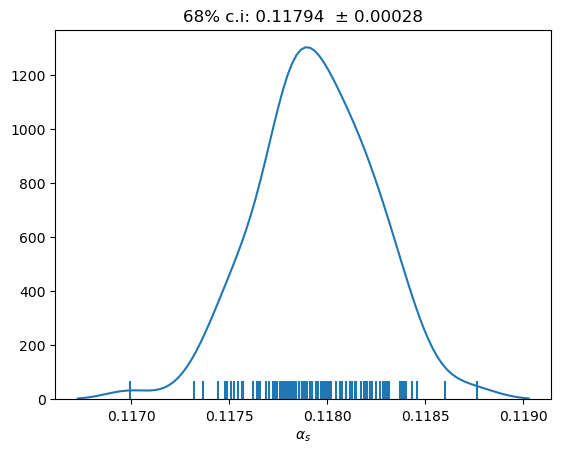

count    102.000000
mean       0.118427
std        0.000341
min        0.117339
16%        0.118085
50%        0.118398
84%        0.118779
max        0.119215
dtype: float64

cv±std = 0.11843 ± 0.00034 
1std interval:  0.11809 to 0.11877 
68% c.i:        0.11809 to 0.11878 


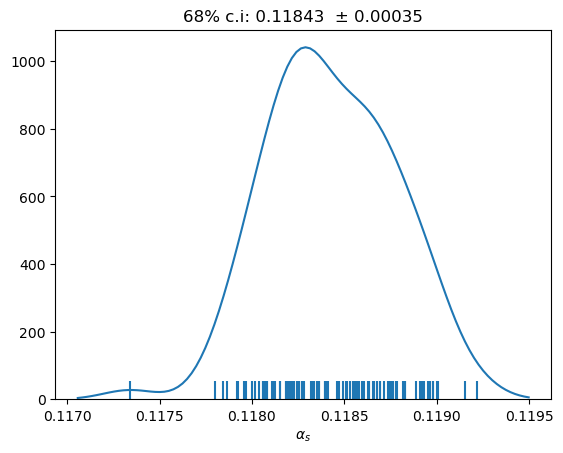

count    104.000000
mean       0.118317
std        0.000349
min        0.117535
16%        0.117959
50%        0.118323
84%        0.118645
max        0.119084
dtype: float64

cv±std = 0.11832 ± 0.00035 
1std interval:  0.11797 to 0.11867 
68% c.i:        0.11796 to 0.11864 


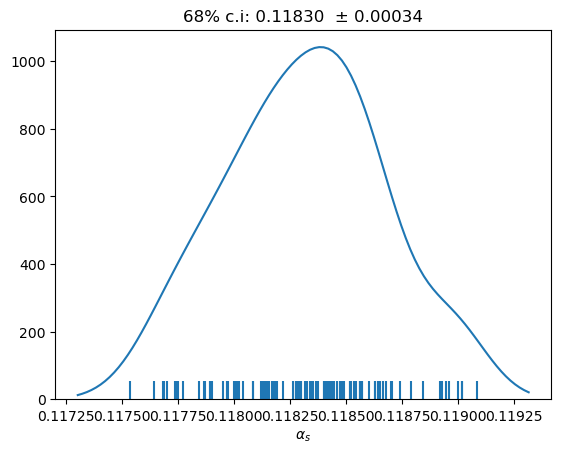

count    101.000000
mean       0.118253
std        0.000346
min        0.117321
16%        0.117930
50%        0.118258
84%        0.118597
max        0.118959
dtype: float64

cv±std = 0.11825 ± 0.00035 
1std interval:  0.11791 to 0.11860 
68% c.i:        0.11793 to 0.11860 


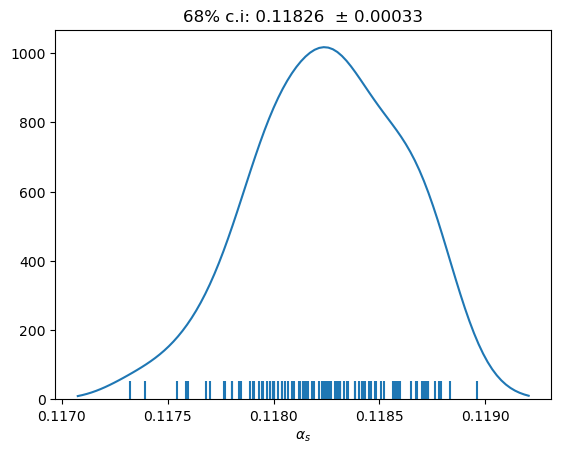

count    100.000000
mean       0.117994
std        0.000361
min        0.117028
16%        0.117630
50%        0.117999
84%        0.118337
max        0.118990
dtype: float64

cv±std = 0.11799 ± 0.00036 
1std interval:  0.11763 to 0.11836 
68% c.i:        0.11763 to 0.11834 


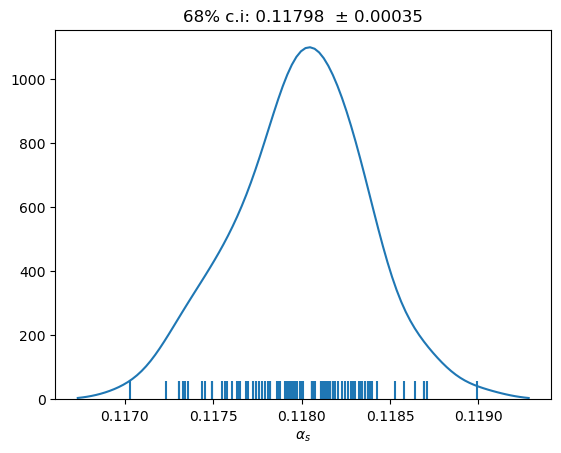

count    104.000000
mean       0.118140
std        0.000348
min        0.117344
16%        0.117773
50%        0.118115
84%        0.118501
max        0.118932
dtype: float64

cv±std = 0.11814 ± 0.00035 
1std interval:  0.11779 to 0.11849 
68% c.i:        0.11777 to 0.11850 


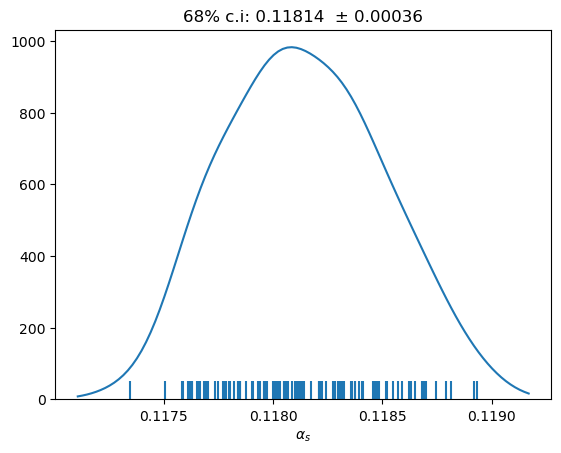

count    101.000000
mean       0.118585
std        0.000336
min        0.117670
16%        0.118203
50%        0.118627
84%        0.118938
max        0.119292
dtype: float64

cv±std = 0.11858 ± 0.00034 
1std interval:  0.11825 to 0.11892 
68% c.i:        0.11820 to 0.11894 


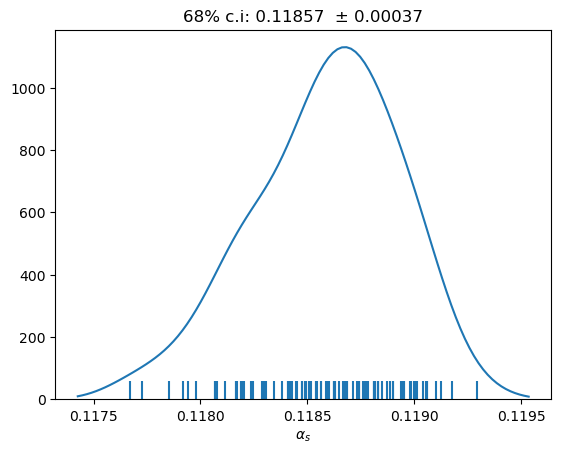

count    103.000000
mean       0.118325
std        0.000375
min        0.117558
16%        0.117991
50%        0.118312
84%        0.118722
max        0.119306
dtype: float64

cv±std = 0.11833 ± 0.00038 
1std interval:  0.11795 to 0.11870 
68% c.i:        0.11799 to 0.11872 


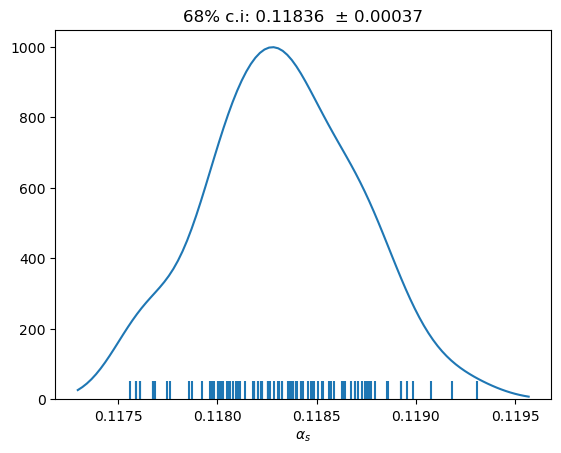

count    101.000000
mean       0.118515
std        0.000338
min        0.117767
16%        0.118215
50%        0.118530
84%        0.118833
max        0.119484
dtype: float64

cv±std = 0.11851 ± 0.00034 
1std interval:  0.11818 to 0.11885 
68% c.i:        0.11822 to 0.11883 


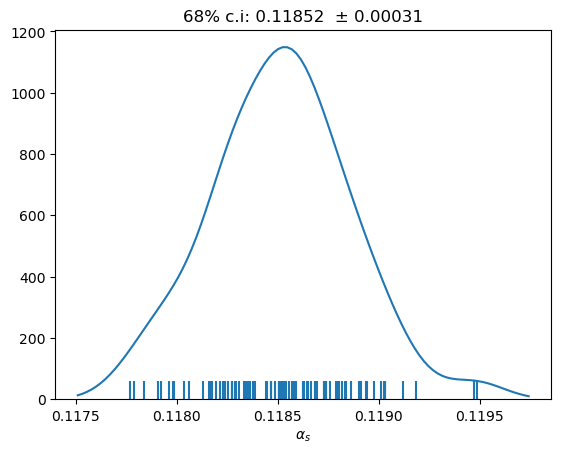

count    103.000000
mean       0.118330
std        0.000361
min        0.117187
16%        0.117979
50%        0.118315
84%        0.118736
max        0.119084
dtype: float64

cv±std = 0.11833 ± 0.00036 
1std interval:  0.11797 to 0.11869 
68% c.i:        0.11798 to 0.11874 


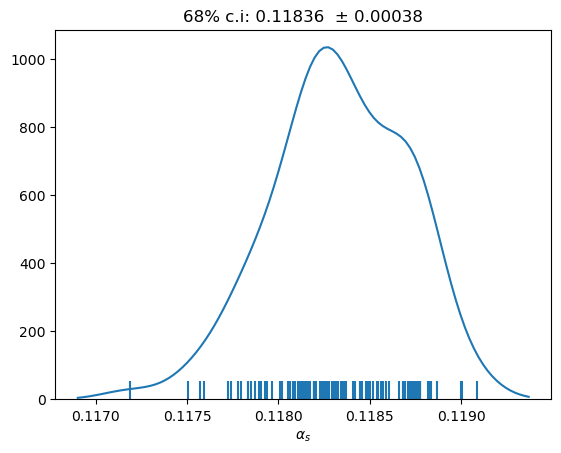

count    101.000000
mean       0.118155
std        0.000326
min        0.117377
16%        0.117799
50%        0.118135
84%        0.118469
max        0.118909
dtype: float64

cv±std = 0.11815 ± 0.00033 
1std interval:  0.11783 to 0.11848 
68% c.i:        0.11780 to 0.11847 


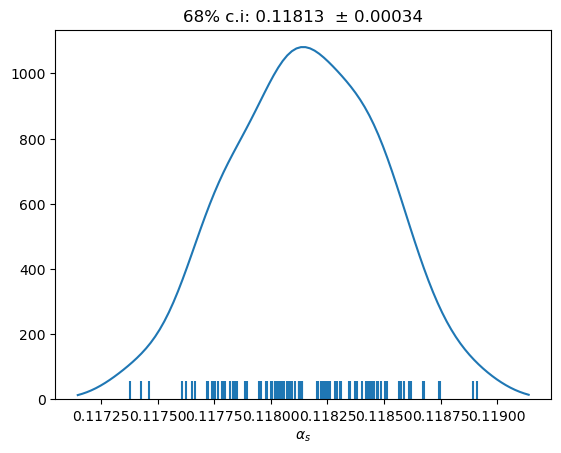

count    101.000000
mean       0.117891
std        0.000351
min        0.116989
16%        0.117514
50%        0.117897
84%        0.118250
max        0.118694
dtype: float64

cv±std = 0.11789 ± 0.00035 
1std interval:  0.11754 to 0.11824 
68% c.i:        0.11751 to 0.11825 


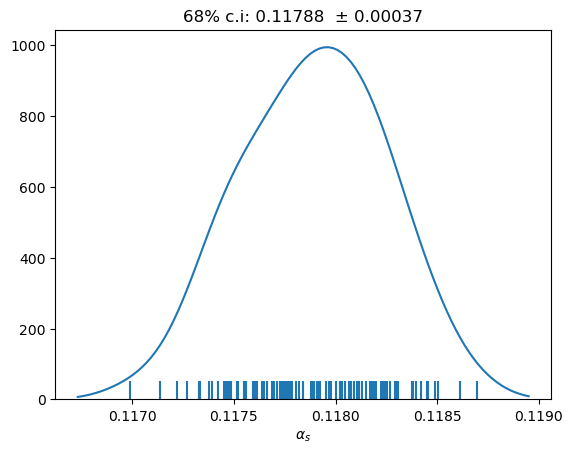

count    58.000000
mean      0.118392
std       0.000332
min       0.117610
16%       0.118097
50%       0.118421
84%       0.118684
max       0.119225
dtype: float64

cv±std = 0.11839 ± 0.00033 
1std interval:  0.11806 to 0.11872 
68% c.i:        0.11810 to 0.11868 


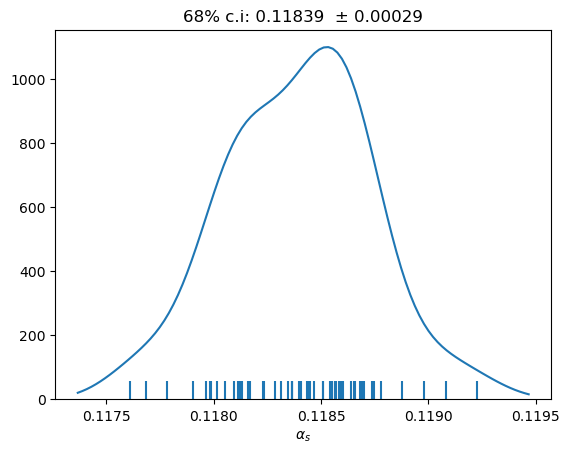

count    65.000000
mean      0.118596
std       0.000344
min       0.117692
16%       0.118324
50%       0.118607
84%       0.118921
max       0.119378
dtype: float64

cv±std = 0.11860 ± 0.00034 
1std interval:  0.11825 to 0.11894 
68% c.i:        0.11832 to 0.11892 


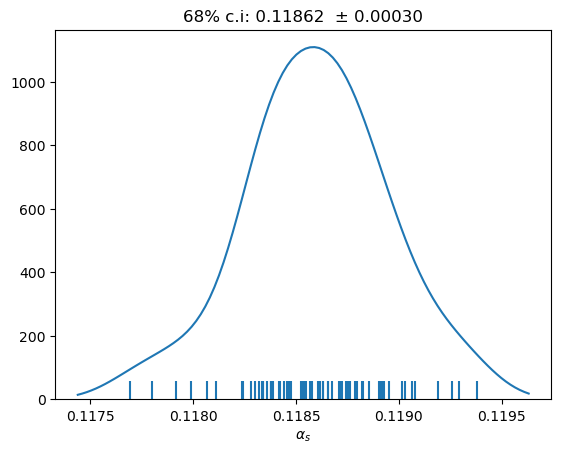

count    64.000000
mean      0.118252
std       0.000344
min       0.117483
16%       0.117884
50%       0.118309
84%       0.118574
max       0.118913
dtype: float64

cv±std = 0.11825 ± 0.00034 
1std interval:  0.11791 to 0.11860 
68% c.i:        0.11788 to 0.11857 


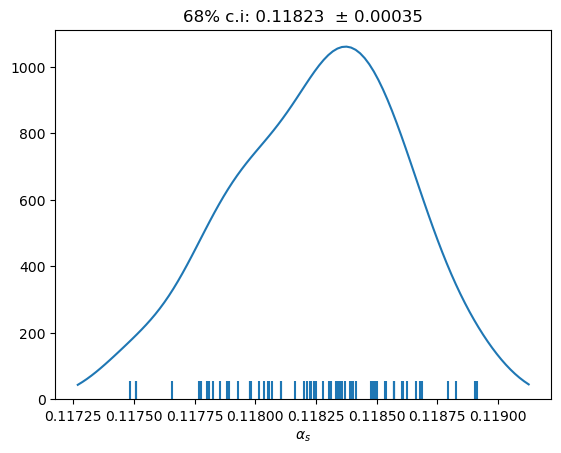

count    60.000000
mean      0.118569
std       0.000406
min       0.117755
16%       0.118153
50%       0.118535
84%       0.119024
max       0.119414
dtype: float64

cv±std = 0.11857 ± 0.00041 
1std interval:  0.11816 to 0.11898 
68% c.i:        0.11815 to 0.11902 


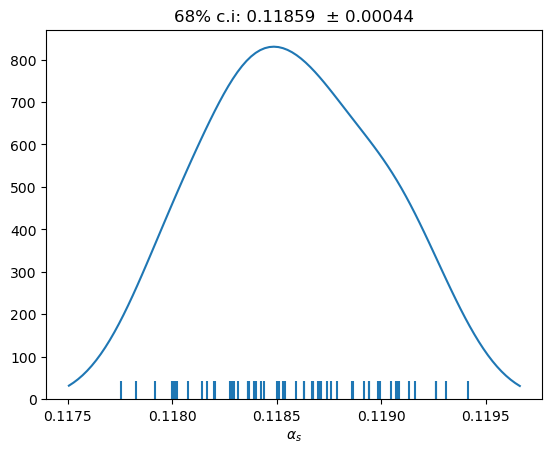

count    61.000000
mean      0.118267
std       0.000293
min       0.117591
16%       0.118026
50%       0.118219
84%       0.118543
max       0.119087
dtype: float64

cv±std = 0.11827 ± 0.00029 
1std interval:  0.11797 to 0.11856 
68% c.i:        0.11803 to 0.11854 


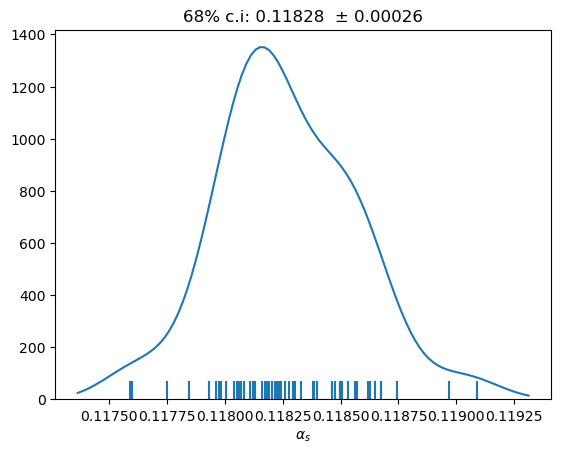

count    62.000000
mean      0.117834
std       0.000364
min       0.117027
16%       0.117471
50%       0.117841
84%       0.118213
max       0.118534
dtype: float64

cv±std = 0.11783 ± 0.00036 
1std interval:  0.11747 to 0.11820 
68% c.i:        0.11747 to 0.11821 


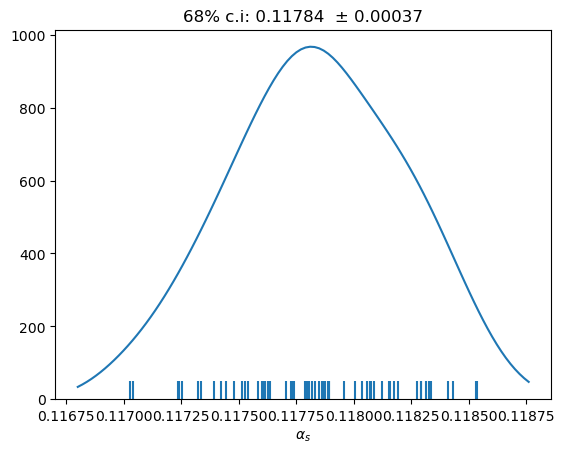

count    62.000000
mean      0.118132
std       0.000326
min       0.117343
16%       0.117864
50%       0.118125
84%       0.118390
max       0.118855
dtype: float64

cv±std = 0.11813 ± 0.00033 
1std interval:  0.11781 to 0.11846 
68% c.i:        0.11786 to 0.11839 


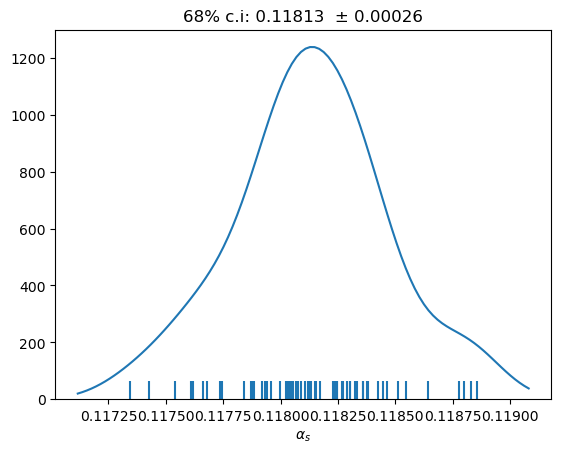

count    66.000000
mean      0.118118
std       0.000354
min       0.117246
16%       0.117751
50%       0.118118
84%       0.118464
max       0.118883
dtype: float64

cv±std = 0.11812 ± 0.00035 
1std interval:  0.11776 to 0.11847 
68% c.i:        0.11775 to 0.11846 


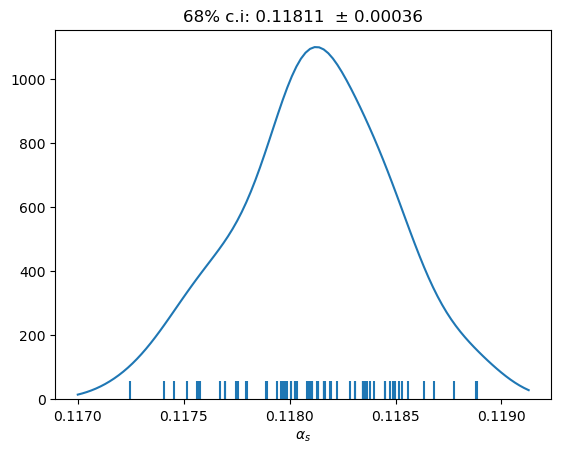

count    63.000000
mean      0.117488
std       0.000348
min       0.116569
16%       0.117127
50%       0.117540
84%       0.117773
max       0.118282
dtype: float64

cv±std = 0.11749 ± 0.00035 
1std interval:  0.11714 to 0.11784 
68% c.i:        0.11713 to 0.11777 


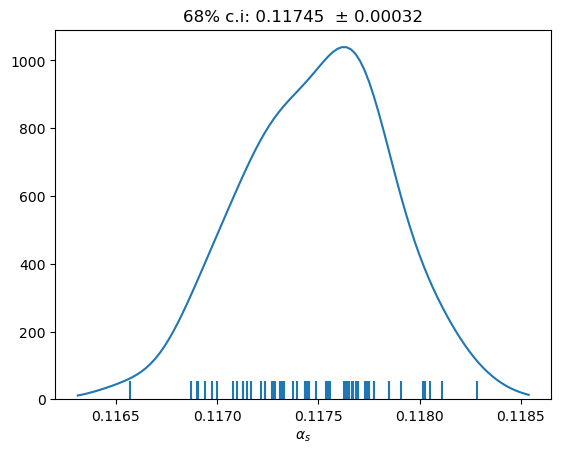

count    60.000000
mean      0.118051
std       0.000307
min       0.117292
16%       0.117745
50%       0.118054
84%       0.118358
max       0.118653
dtype: float64

cv±std = 0.11805 ± 0.00031 
1std interval:  0.11774 to 0.11836 
68% c.i:        0.11774 to 0.11836 


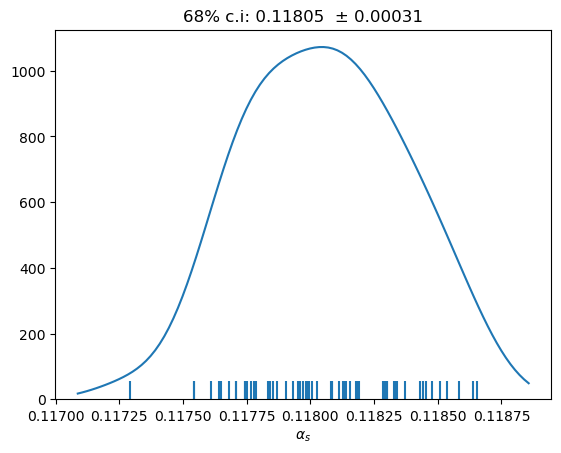

count    58.000000
mean      0.117961
std       0.000324
min       0.117284
16%       0.117609
50%       0.117934
84%       0.118310
max       0.118683
dtype: float64

cv±std = 0.11796 ± 0.00032 
1std interval:  0.11764 to 0.11829 
68% c.i:        0.11761 to 0.11831 


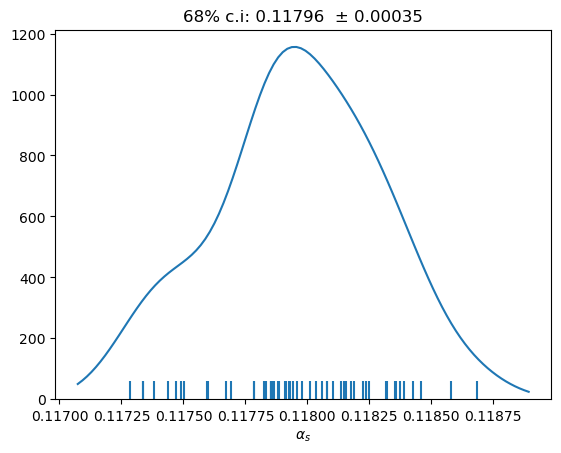

count    64.000000
mean      0.118080
std       0.000328
min       0.117353
16%       0.117751
50%       0.118153
84%       0.118405
max       0.118718
dtype: float64

cv±std = 0.11808 ± 0.00033 
1std interval:  0.11775 to 0.11841 
68% c.i:        0.11775 to 0.11840 


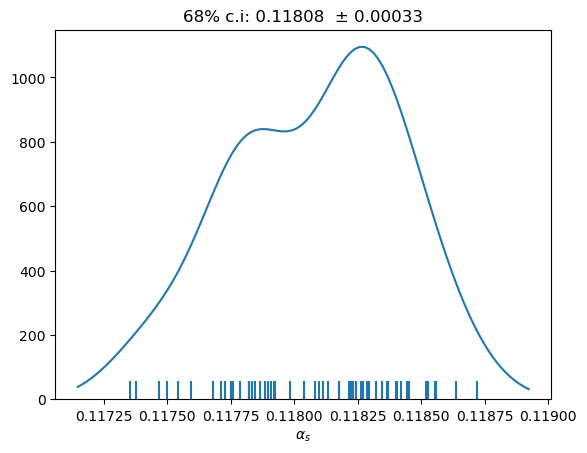

count    62.000000
mean      0.118247
std       0.000322
min       0.117420
16%       0.117961
50%       0.118224
84%       0.118601
max       0.118885
dtype: float64

cv±std = 0.11825 ± 0.00032 
1std interval:  0.11793 to 0.11857 
68% c.i:        0.11796 to 0.11860 


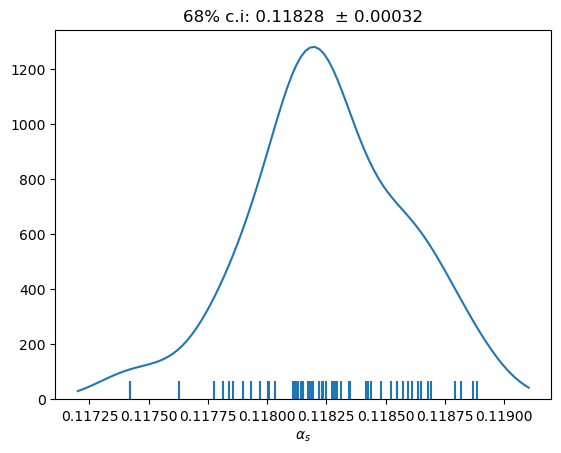

count    67.000000
mean      0.117965
std       0.000320
min       0.117287
16%       0.117676
50%       0.117958
84%       0.118268
max       0.118835
dtype: float64

cv±std = 0.11796 ± 0.00032 
1std interval:  0.11765 to 0.11828 
68% c.i:        0.11768 to 0.11827 


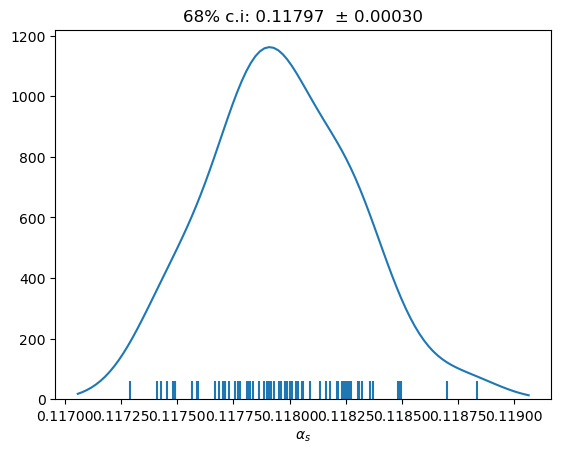

count    63.000000
mean      0.118454
std       0.000346
min       0.117230
16%       0.118152
50%       0.118414
84%       0.118741
max       0.119263
dtype: float64

cv±std = 0.11845 ± 0.00035 
1std interval:  0.11811 to 0.11880 
68% c.i:        0.11815 to 0.11874 


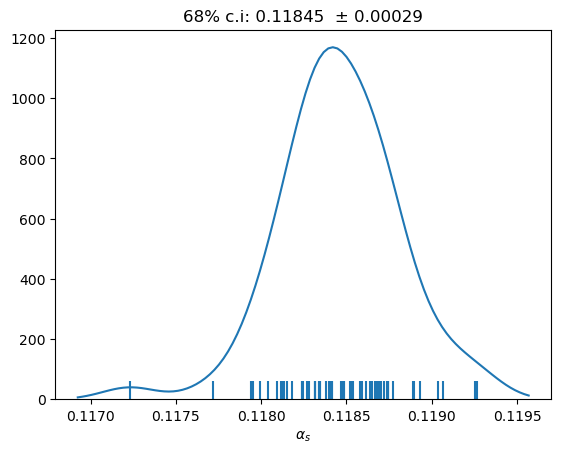

count    59.000000
mean      0.118316
std       0.000338
min       0.117515
16%       0.118005
50%       0.118294
84%       0.118595
max       0.119183
dtype: float64

cv±std = 0.11832 ± 0.00034 
1std interval:  0.11798 to 0.11865 
68% c.i:        0.11800 to 0.11860 


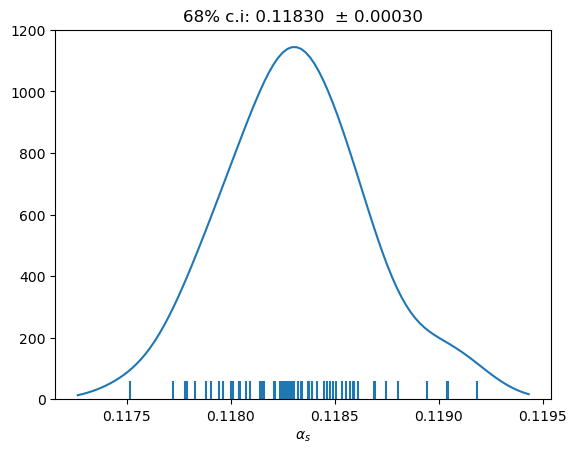

count    58.000000
mean      0.118294
std       0.000368
min       0.117262
16%       0.117965
50%       0.118271
84%       0.118636
max       0.118998
dtype: float64

cv±std = 0.11829 ± 0.00037 
1std interval:  0.11793 to 0.11866 
68% c.i:        0.11796 to 0.11864 


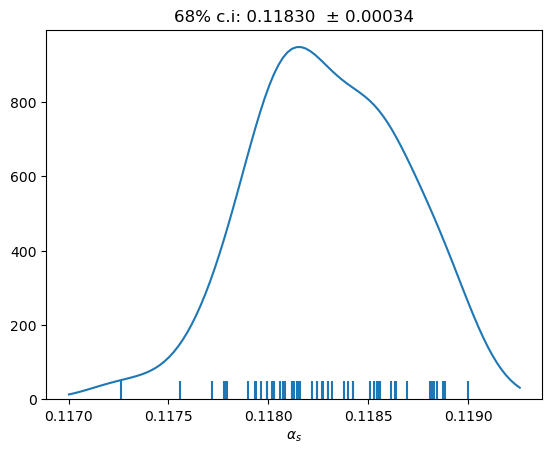

count    60.000000
mean      0.118004
std       0.000371
min       0.117016
16%       0.117657
50%       0.118068
84%       0.118346
max       0.118781
dtype: float64

cv±std = 0.11800 ± 0.00037 
1std interval:  0.11763 to 0.11837 
68% c.i:        0.11766 to 0.11835 


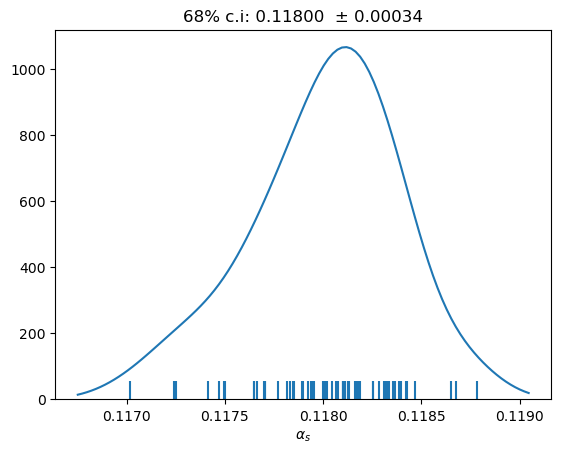

count    68.000000
mean      0.118179
std       0.000341
min       0.117598
16%       0.117796
50%       0.118133
84%       0.118566
max       0.118942
dtype: float64

cv±std = 0.11818 ± 0.00034 
1std interval:  0.11784 to 0.11852 
68% c.i:        0.11780 to 0.11857 


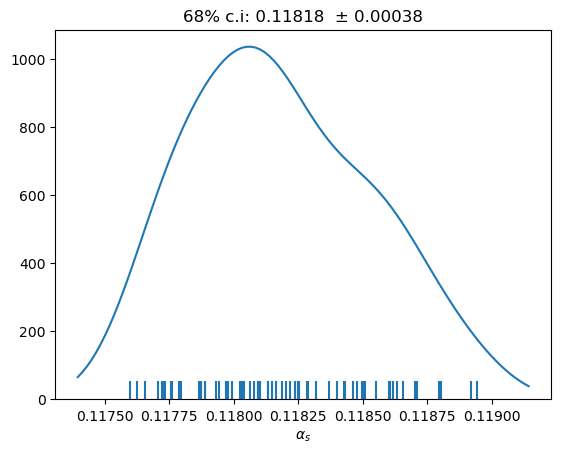

count    61.000000
mean      0.118590
std       0.000337
min       0.117906
16%       0.118224
50%       0.118623
84%       0.118856
max       0.119486
dtype: float64

cv±std = 0.11859 ± 0.00034 
1std interval:  0.11825 to 0.11893 
68% c.i:        0.11822 to 0.11886 


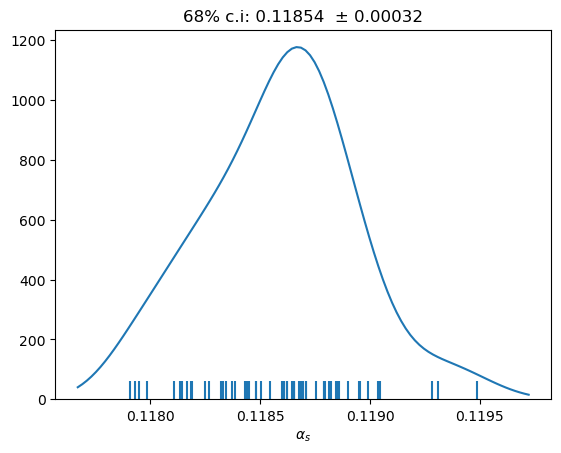

count    58.000000
mean      0.118345
std       0.000356
min       0.117548
16%       0.117959
50%       0.118377
84%       0.118688
max       0.119122
dtype: float64

cv±std = 0.11835 ± 0.00036 
1std interval:  0.11799 to 0.11870 
68% c.i:        0.11796 to 0.11869 


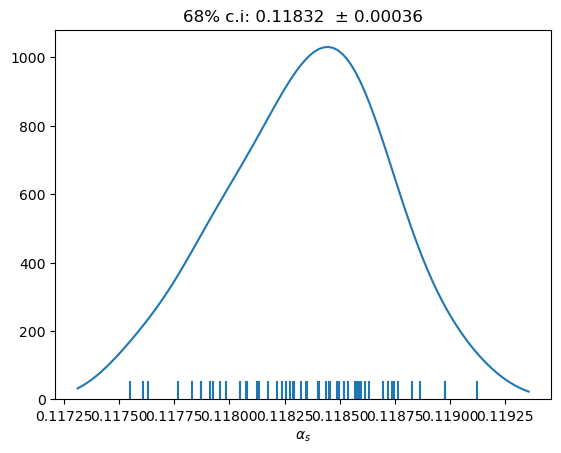

count    67.000000
mean      0.118524
std       0.000349
min       0.117720
16%       0.118239
50%       0.118530
84%       0.118822
max       0.119429
dtype: float64

cv±std = 0.11852 ± 0.00035 
1std interval:  0.11818 to 0.11887 
68% c.i:        0.11824 to 0.11882 


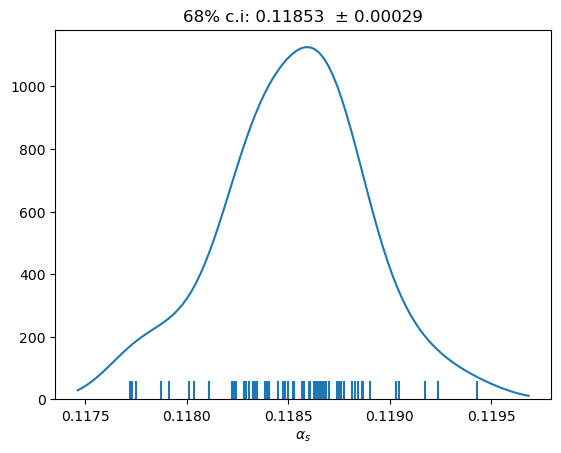

count    61.000000
mean      0.118314
std       0.000384
min       0.117157
16%       0.117983
50%       0.118335
84%       0.118717
max       0.119191
dtype: float64

cv±std = 0.11831 ± 0.00038 
1std interval:  0.11793 to 0.11870 
68% c.i:        0.11798 to 0.11872 


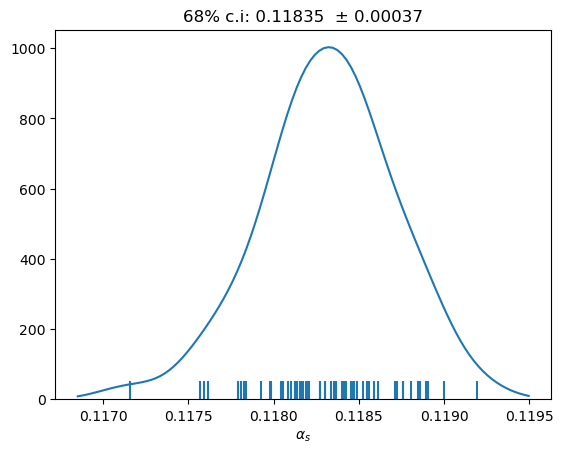

count    60.000000
mean      0.118188
std       0.000340
min       0.117407
16%       0.117852
50%       0.118221
84%       0.118518
max       0.118961
dtype: float64

cv±std = 0.11819 ± 0.00034 
1std interval:  0.11785 to 0.11853 
68% c.i:        0.11785 to 0.11852 


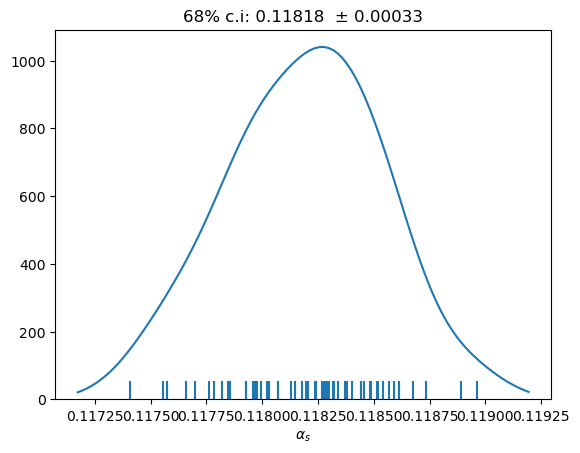

count    58.000000
mean      0.117979
std       0.000310
min       0.117227
16%       0.117674
50%       0.117979
84%       0.118227
max       0.118764
dtype: float64

cv±std = 0.11798 ± 0.00031 
1std interval:  0.11767 to 0.11829 
68% c.i:        0.11767 to 0.11823 


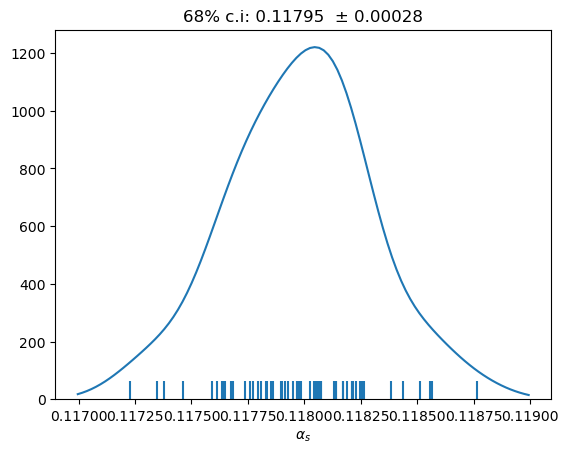

count    103.000000
mean       0.118392
std        0.000327
min        0.117528
16%        0.118054
50%        0.118399
84%        0.118714
max        0.119239
dtype: float64

cv±std = 0.11839 ± 0.00033 
1std interval:  0.11807 to 0.11872 
68% c.i:        0.11805 to 0.11871 


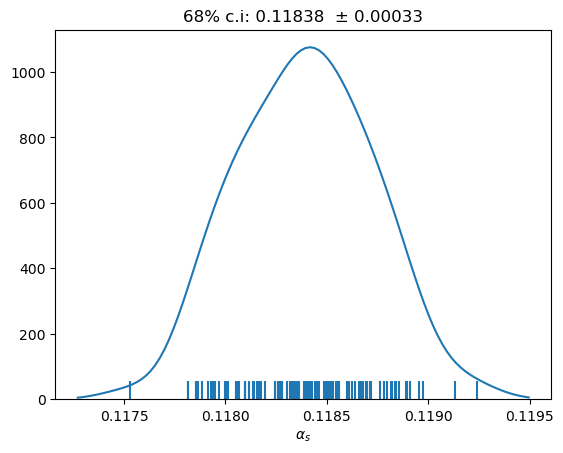

count    104.000000
mean       0.118574
std        0.000350
min        0.117653
16%        0.118246
50%        0.118557
84%        0.118933
max        0.119471
dtype: float64

cv±std = 0.11857 ± 0.00035 
1std interval:  0.11822 to 0.11892 
68% c.i:        0.11825 to 0.11893 


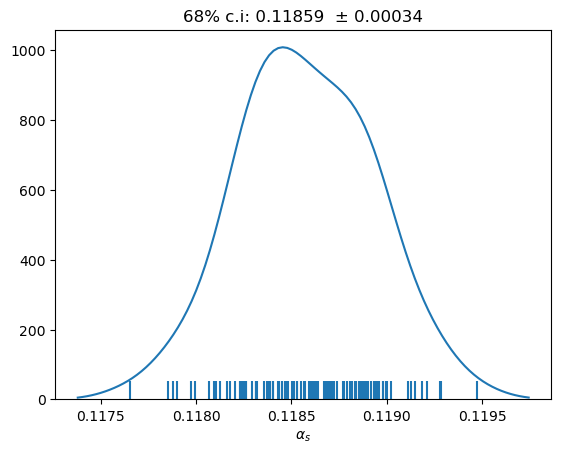

count    102.000000
mean       0.118248
std        0.000320
min        0.117542
16%        0.117924
50%        0.118215
84%        0.118573
max        0.118992
dtype: float64

cv±std = 0.11825 ± 0.00032 
1std interval:  0.11793 to 0.11857 
68% c.i:        0.11792 to 0.11857 


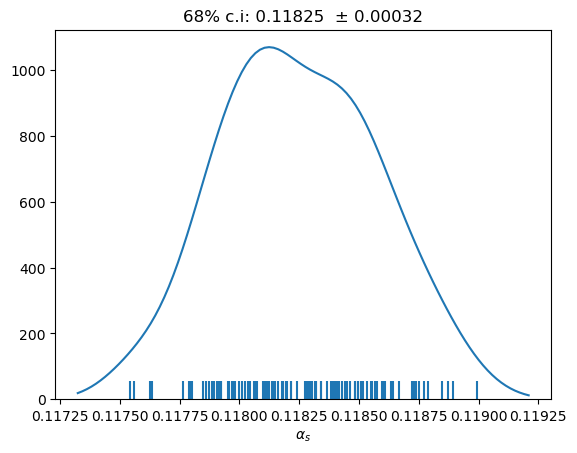

count    103.000000
mean       0.118526
std        0.000353
min        0.117771
16%        0.118197
50%        0.118524
84%        0.118899
max        0.119498
dtype: float64

cv±std = 0.11853 ± 0.00035 
1std interval:  0.11817 to 0.11888 
68% c.i:        0.11820 to 0.11890 


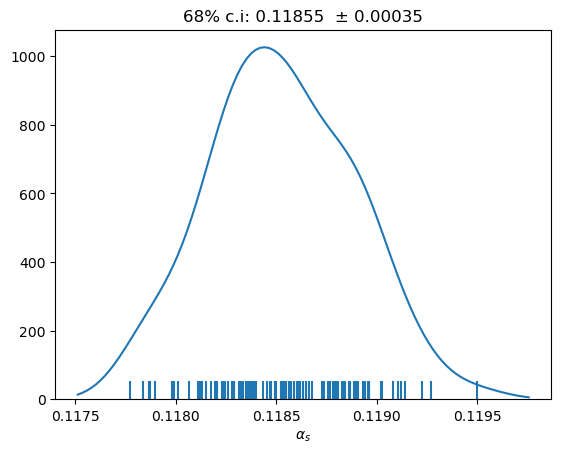

count    100.000000
mean       0.118260
std        0.000305
min        0.117481
16%        0.117974
50%        0.118268
84%        0.118511
max        0.119144
dtype: float64

cv±std = 0.11826 ± 0.00031 
1std interval:  0.11795 to 0.11857 
68% c.i:        0.11797 to 0.11851 


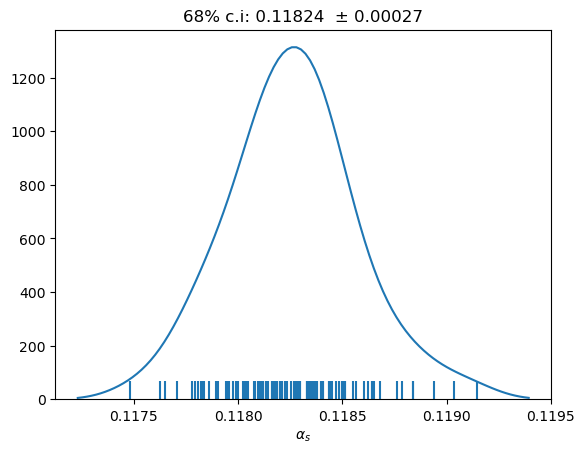

count    102.000000
mean       0.117845
std        0.000341
min        0.117016
16%        0.117480
50%        0.117859
84%        0.118177
max        0.118619
dtype: float64

cv±std = 0.11785 ± 0.00034 
1std interval:  0.11750 to 0.11819 
68% c.i:        0.11748 to 0.11818 


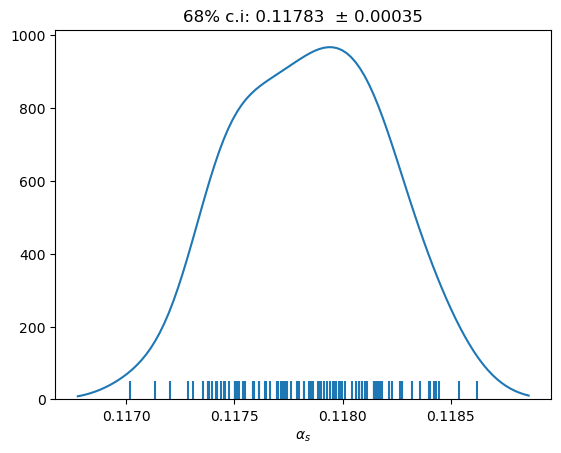

count    101.000000
mean       0.118107
std        0.000346
min        0.117265
16%        0.117780
50%        0.118094
84%        0.118408
max        0.118987
dtype: float64

cv±std = 0.11811 ± 0.00035 
1std interval:  0.11776 to 0.11845 
68% c.i:        0.11778 to 0.11841 


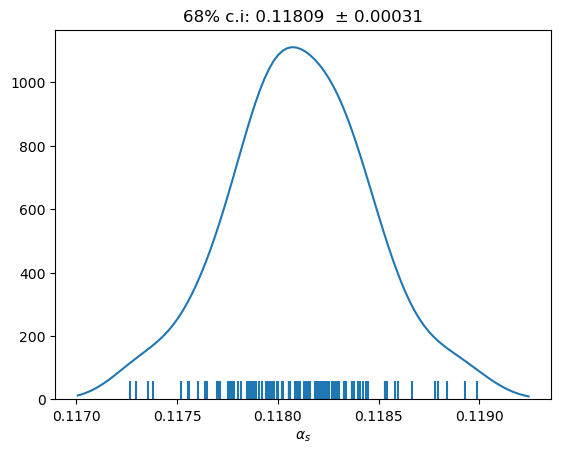

count    101.000000
mean       0.118123
std        0.000311
min        0.117402
16%        0.117833
50%        0.118169
84%        0.118410
max        0.118902
dtype: float64

cv±std = 0.11812 ± 0.00031 
1std interval:  0.11781 to 0.11843 
68% c.i:        0.11783 to 0.11841 


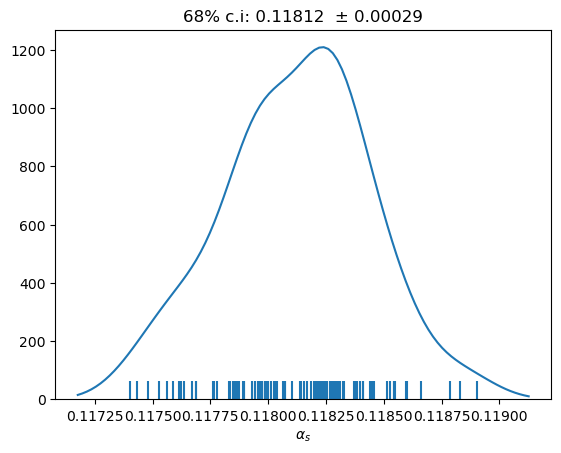

count    102.000000
mean       0.117456
std        0.000308
min        0.116719
16%        0.117131
50%        0.117444
84%        0.117765
max        0.118211
dtype: float64

cv±std = 0.11746 ± 0.00031 
1std interval:  0.11715 to 0.11776 
68% c.i:        0.11713 to 0.11777 


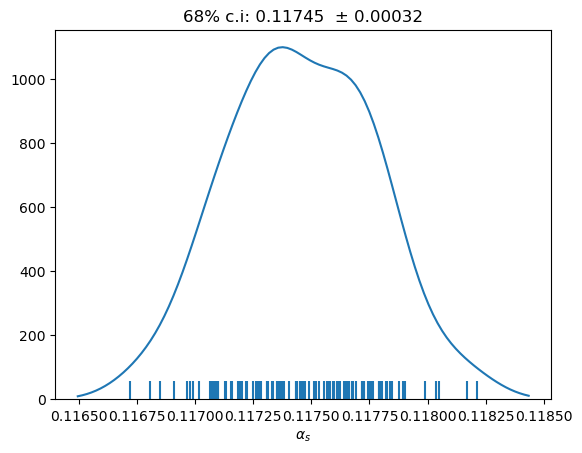

count    102.000000
mean       0.118066
std        0.000320
min        0.117235
16%        0.117743
50%        0.118060
84%        0.118352
max        0.118959
dtype: float64

cv±std = 0.11807 ± 0.00032 
1std interval:  0.11775 to 0.11839 
68% c.i:        0.11774 to 0.11835 


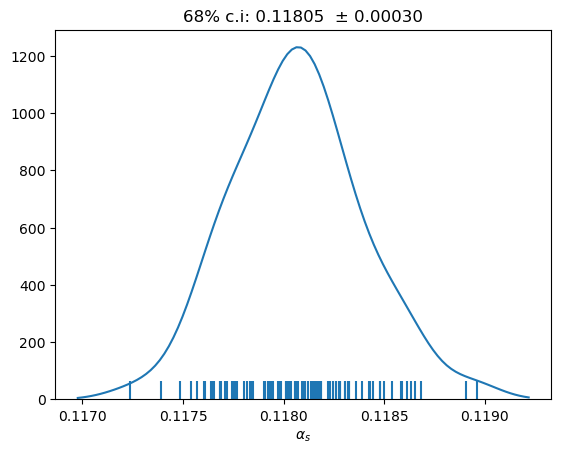

count    101.000000
mean       0.117950
std        0.000304
min        0.117253
16%        0.117611
50%        0.117942
84%        0.118281
max        0.118669
dtype: float64

cv±std = 0.11795 ± 0.00030 
1std interval:  0.11765 to 0.11825 
68% c.i:        0.11761 to 0.11828 


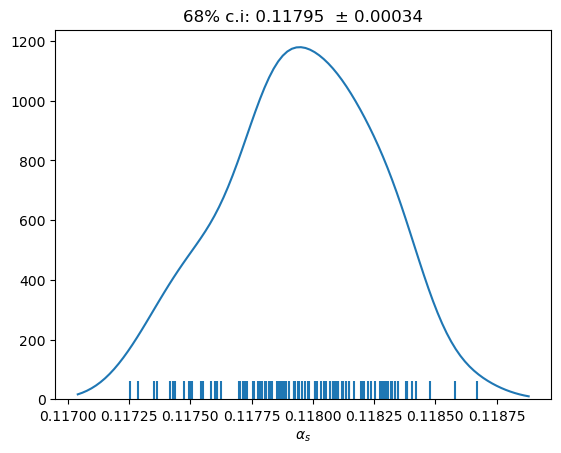

count    101.000000
mean       0.118068
std        0.000327
min        0.117254
16%        0.117737
50%        0.118108
84%        0.118410
max        0.118812
dtype: float64

cv±std = 0.11807 ± 0.00033 
1std interval:  0.11774 to 0.11840 
68% c.i:        0.11774 to 0.11841 


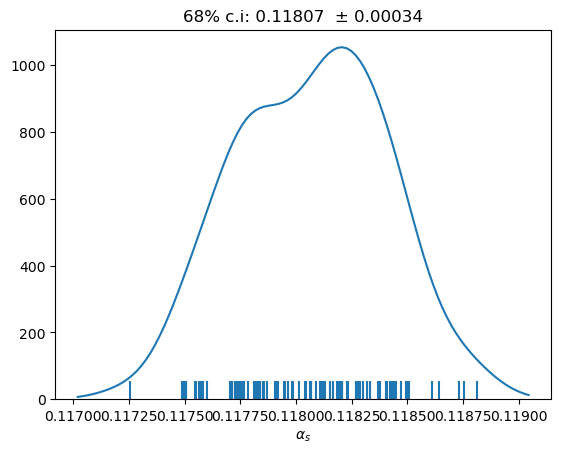

count    103.000000
mean       0.118214
std        0.000326
min        0.117434
16%        0.117887
50%        0.118206
84%        0.118536
max        0.118928
dtype: float64

cv±std = 0.11821 ± 0.00033 
1std interval:  0.11789 to 0.11854 
68% c.i:        0.11789 to 0.11854 


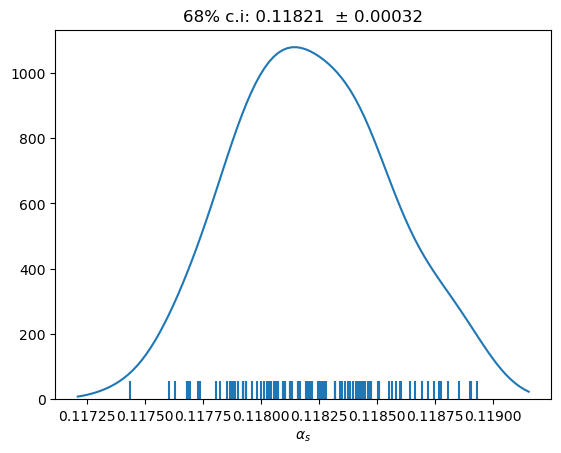

count    102.000000
mean       0.117946
std        0.000270
min        0.117268
16%        0.117688
50%        0.117939
84%        0.118236
max        0.118805
dtype: float64

cv±std = 0.11795 ± 0.00027 
1std interval:  0.11768 to 0.11822 
68% c.i:        0.11769 to 0.11824 


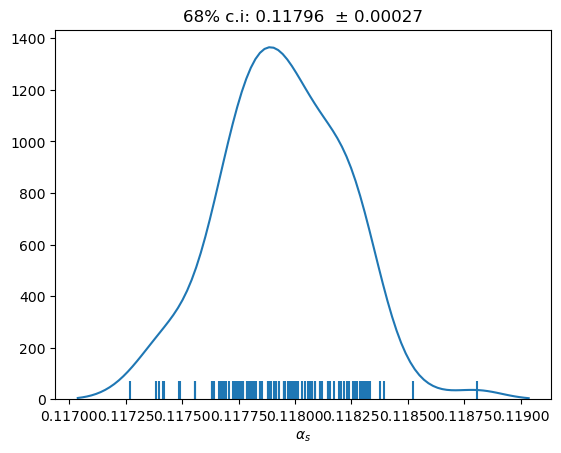

count    102.000000
mean       0.118423
std        0.000336
min        0.117332
16%        0.118090
50%        0.118404
84%        0.118736
max        0.119238
dtype: float64

cv±std = 0.11842 ± 0.00034 
1std interval:  0.11809 to 0.11876 
68% c.i:        0.11809 to 0.11874 


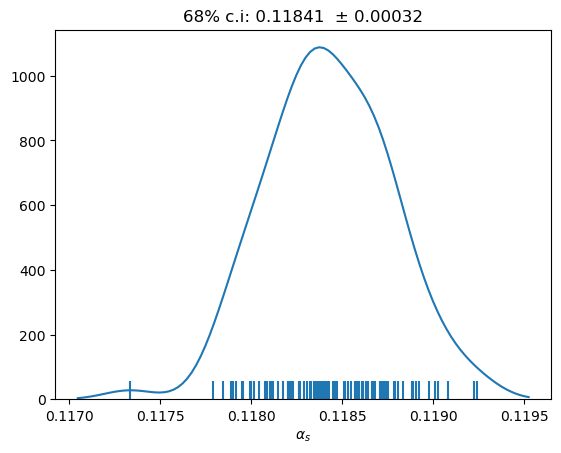

count    104.000000
mean       0.118322
std        0.000337
min        0.117493
16%        0.117977
50%        0.118317
84%        0.118614
max        0.119124
dtype: float64

cv±std = 0.11832 ± 0.00034 
1std interval:  0.11799 to 0.11866 
68% c.i:        0.11798 to 0.11861 


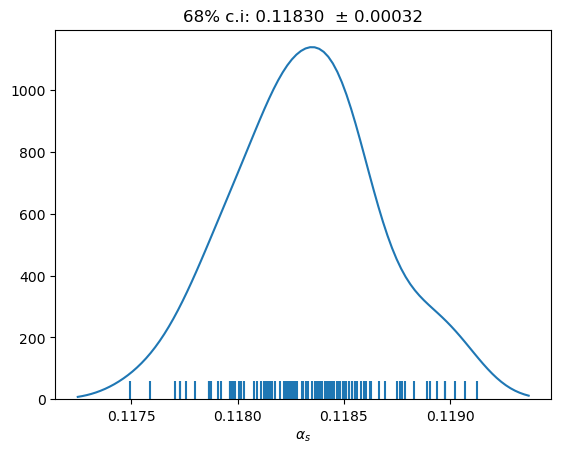

count    101.000000
mean       0.118264
std        0.000334
min        0.117252
16%        0.117938
50%        0.118251
84%        0.118662
max        0.118936
dtype: float64

cv±std = 0.11826 ± 0.00033 
1std interval:  0.11793 to 0.11860 
68% c.i:        0.11794 to 0.11866 


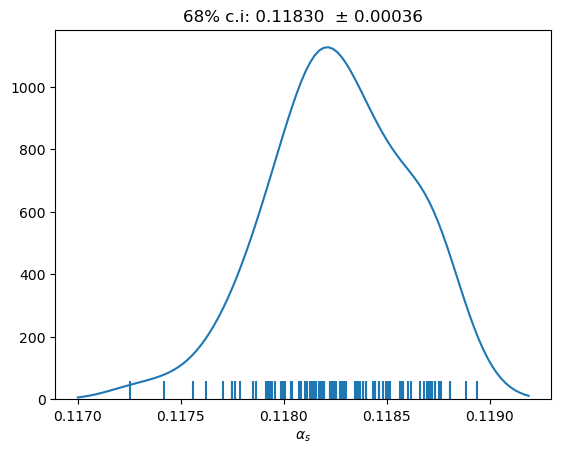

count    100.000000
mean       0.118021
std        0.000351
min        0.116955
16%        0.117653
50%        0.118072
84%        0.118349
max        0.118867
dtype: float64

cv±std = 0.11802 ± 0.00035 
1std interval:  0.11767 to 0.11837 
68% c.i:        0.11765 to 0.11835 


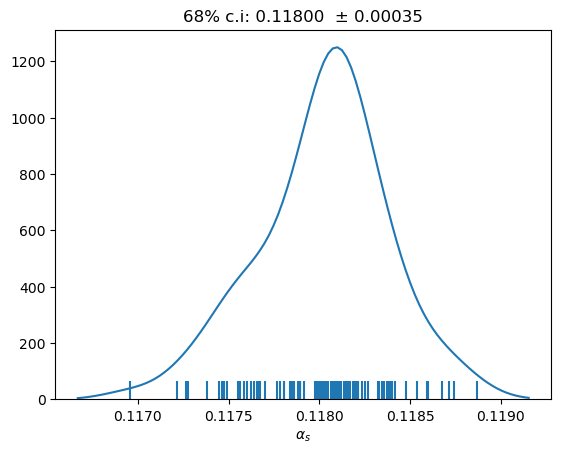

count    104.000000
mean       0.118135
std        0.000344
min        0.117456
16%        0.117729
50%        0.118118
84%        0.118490
max        0.118940
dtype: float64

cv±std = 0.11814 ± 0.00034 
1std interval:  0.11779 to 0.11848 
68% c.i:        0.11773 to 0.11849 


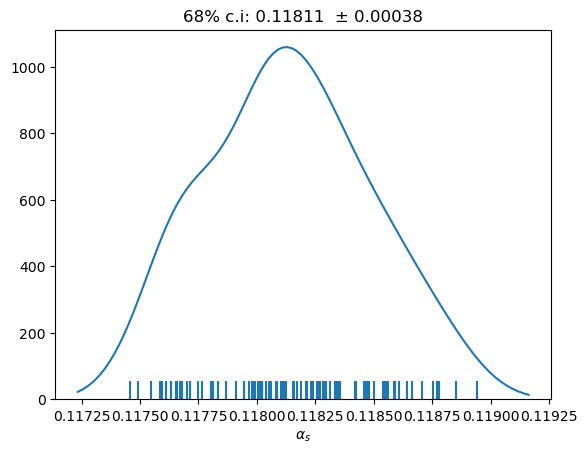

count    101.000000
mean       0.118559
std        0.000313
min        0.117714
16%        0.118237
50%        0.118601
84%        0.118879
max        0.119130
dtype: float64

cv±std = 0.11856 ± 0.00031 
1std interval:  0.11825 to 0.11887 
68% c.i:        0.11824 to 0.11888 


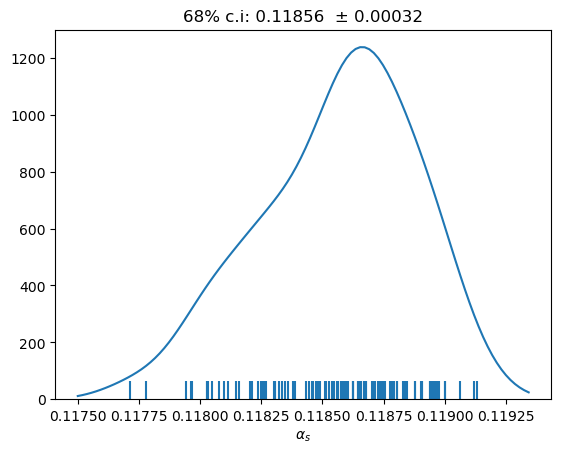

count    103.000000
mean       0.118337
std        0.000367
min        0.117490
16%        0.117998
50%        0.118348
84%        0.118715
max        0.119184
dtype: float64

cv±std = 0.11834 ± 0.00037 
1std interval:  0.11797 to 0.11870 
68% c.i:        0.11800 to 0.11871 


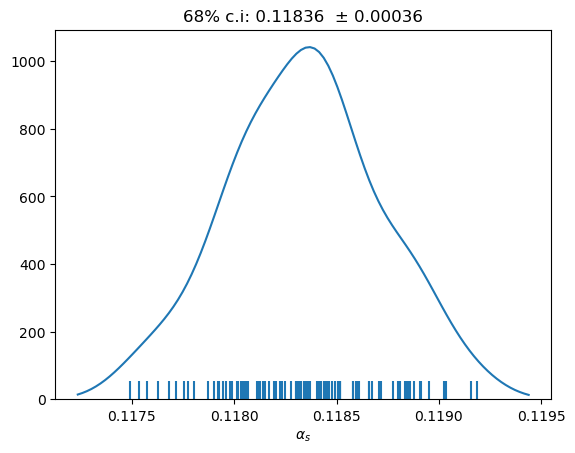

count    101.000000
mean       0.118539
std        0.000325
min        0.117811
16%        0.118213
50%        0.118555
84%        0.118843
max        0.119493
dtype: float64

cv±std = 0.11854 ± 0.00033 
1std interval:  0.11821 to 0.11886 
68% c.i:        0.11821 to 0.11884 


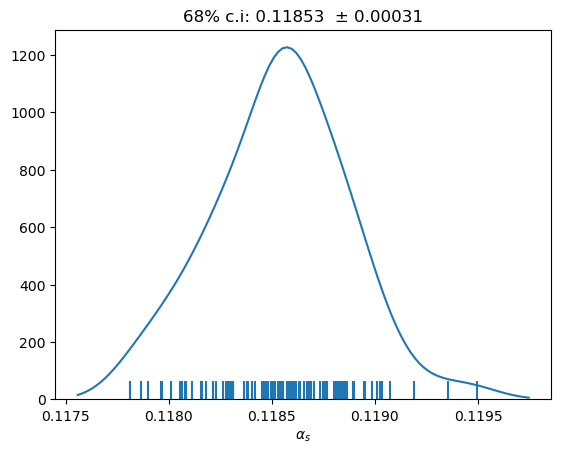

count    103.000000
mean       0.118290
std        0.000348
min        0.117239
16%        0.117956
50%        0.118277
84%        0.118680
max        0.119029
dtype: float64

cv±std = 0.11829 ± 0.00035 
1std interval:  0.11794 to 0.11864 
68% c.i:        0.11796 to 0.11868 


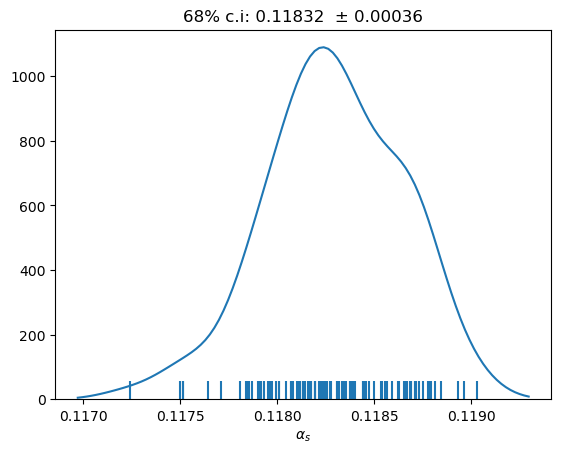

count    101.000000
mean       0.118136
std        0.000323
min        0.117355
16%        0.117809
50%        0.118169
84%        0.118442
max        0.118891
dtype: float64

cv±std = 0.11814 ± 0.00032 
1std interval:  0.11781 to 0.11846 
68% c.i:        0.11781 to 0.11844 


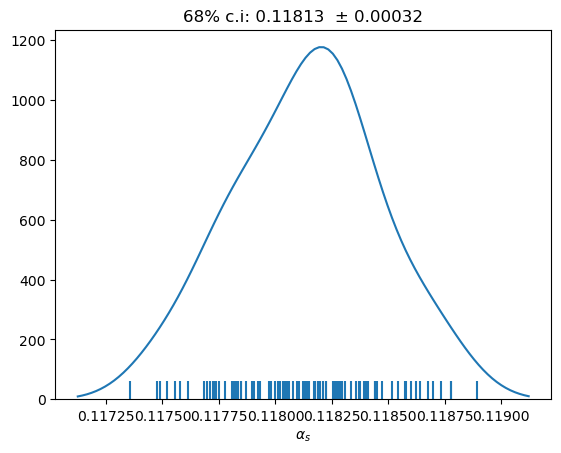

count    101.000000
mean       0.117889
std        0.000342
min        0.116997
16%        0.117541
50%        0.117871
84%        0.118240
max        0.118711
dtype: float64

cv±std = 0.11789 ± 0.00034 
1std interval:  0.11755 to 0.11823 
68% c.i:        0.11754 to 0.11824 


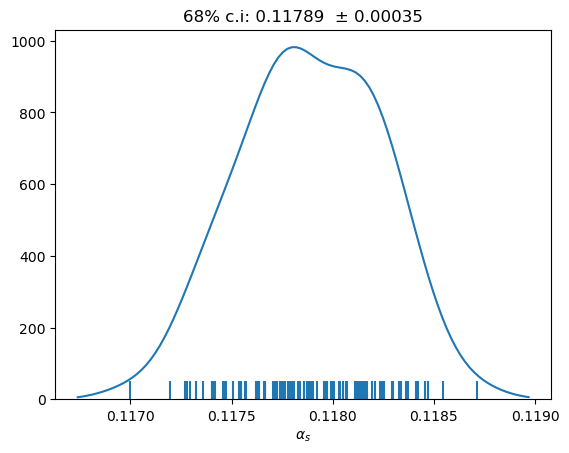

count    3.000000
mean     0.118386
std      0.000024
min      0.118359
16%      0.118370
50%      0.118392
84%      0.118402
max      0.118406
dtype: float64

cv±std = 0.11839 ± 0.00002 
1std interval:  0.11836 to 0.11841 
68% c.i:        0.11837 to 0.11840 


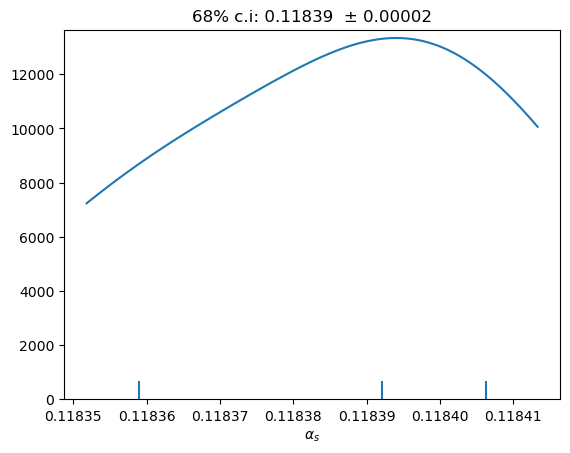

count    3.000000
mean     0.118574
std      0.000022
min      0.118551
16%      0.118559
50%      0.118577
84%      0.118590
max      0.118596
dtype: float64

cv±std = 0.11857 ± 0.00002 
1std interval:  0.11855 to 0.11860 
68% c.i:        0.11856 to 0.11859 


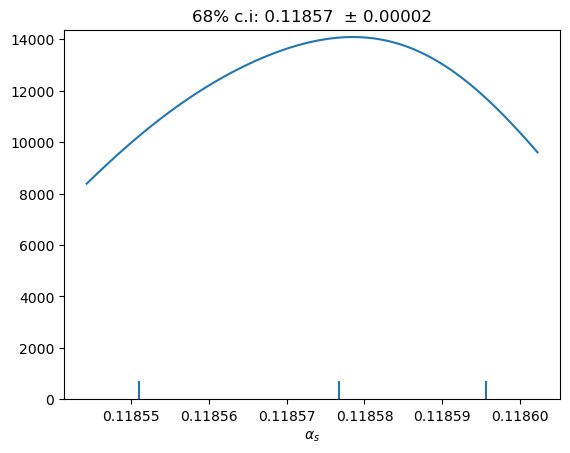

count    3.000000
mean     0.118250
std      0.000007
min      0.118241
16%      0.118245
50%      0.118252
84%      0.118254
max      0.118256
dtype: float64

cv±std = 0.11825 ± 0.00001 
1std interval:  0.11824 to 0.11826 
68% c.i:        0.11824 to 0.11825 


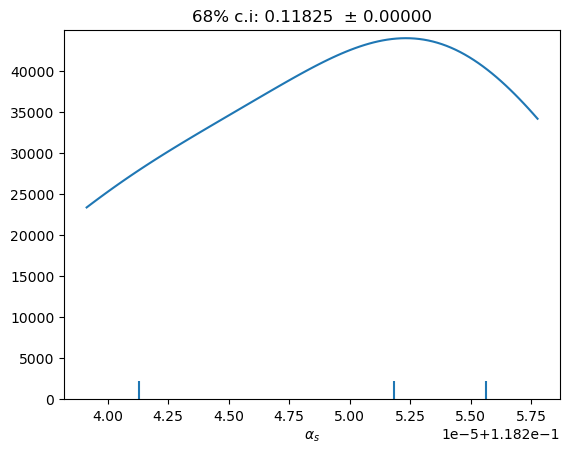

count    3.000000
mean     0.118545
std      0.000030
min      0.118511
16%      0.118525
50%      0.118554
84%      0.118564
max      0.118569
dtype: float64

cv±std = 0.11854 ± 0.00003 
1std interval:  0.11851 to 0.11857 
68% c.i:        0.11852 to 0.11856 


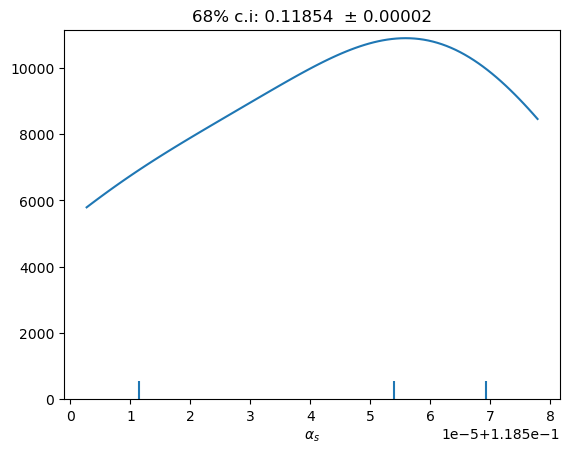

count    3.000000
mean     0.118247
std      0.000025
min      0.118218
16%      0.118230
50%      0.118256
84%      0.118263
max      0.118267
dtype: float64

cv±std = 0.11825 ± 0.00003 
1std interval:  0.11822 to 0.11827 
68% c.i:        0.11823 to 0.11826 


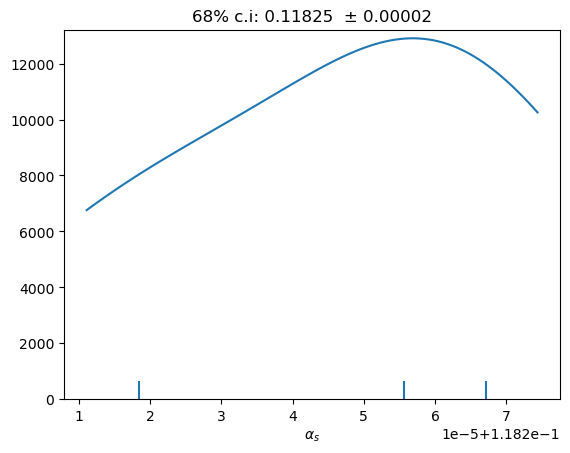

count    3.000000
mean     0.117836
std      0.000023
min      0.117813
16%      0.117820
50%      0.117834
84%      0.117852
max      0.117860
dtype: float64

cv±std = 0.11784 ± 0.00002 
1std interval:  0.11781 to 0.11786 
68% c.i:        0.11782 to 0.11785 


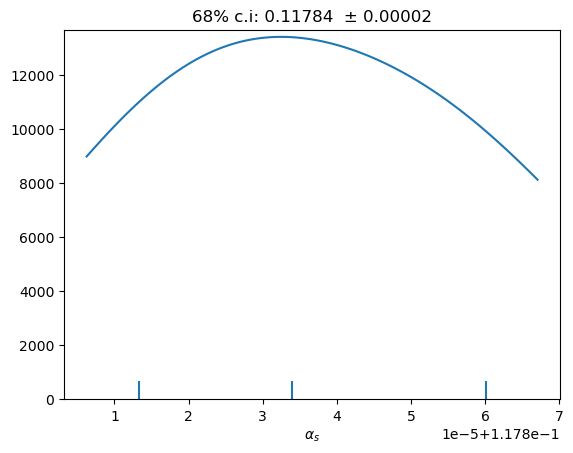

count    3.000000
mean     0.118107
std      0.000027
min      0.118078
16%      0.118088
50%      0.118111
84%      0.118125
max      0.118132
dtype: float64

cv±std = 0.11811 ± 0.00003 
1std interval:  0.11808 to 0.11813 
68% c.i:        0.11809 to 0.11813 


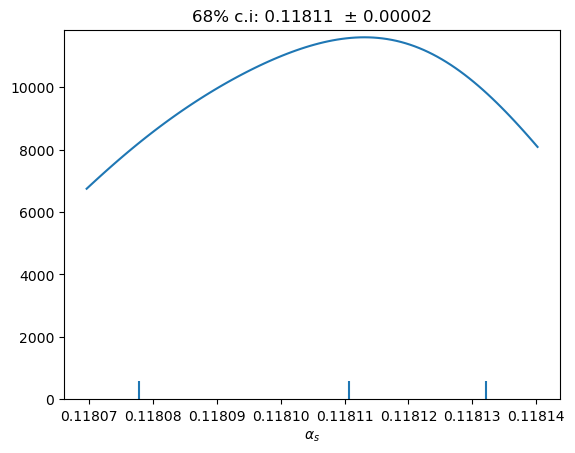

count    3.000000
mean     0.118111
std      0.000029
min      0.118079
16%      0.118091
50%      0.118118
84%      0.118130
max      0.118136
dtype: float64

cv±std = 0.11811 ± 0.00003 
1std interval:  0.11808 to 0.11814 
68% c.i:        0.11809 to 0.11813 


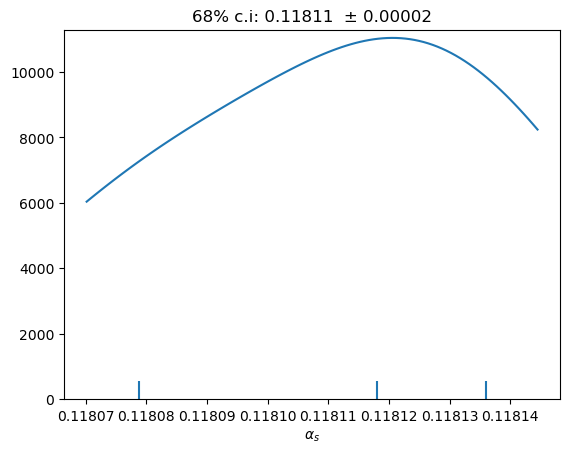

count    3.000000
mean     0.117462
std      0.000023
min      0.117446
16%      0.117448
50%      0.117452
84%      0.117477
max      0.117488
dtype: float64

cv±std = 0.11746 ± 0.00002 
1std interval:  0.11744 to 0.11749 
68% c.i:        0.11745 to 0.11748 


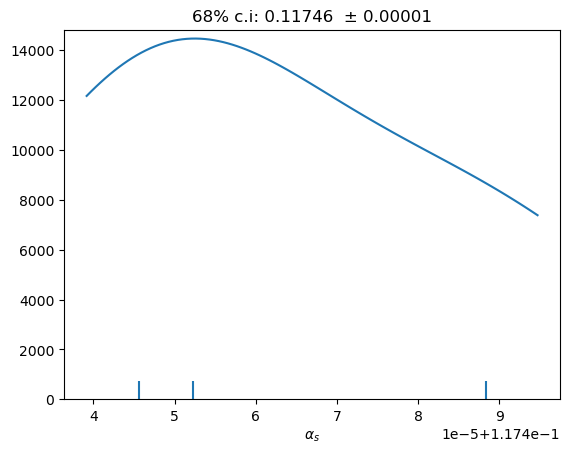

count    3.000000
mean     0.118062
std      0.000030
min      0.118039
16%      0.118043
50%      0.118051
84%      0.118082
max      0.118096
dtype: float64

cv±std = 0.11806 ± 0.00003 
1std interval:  0.11803 to 0.11809 
68% c.i:        0.11804 to 0.11808 


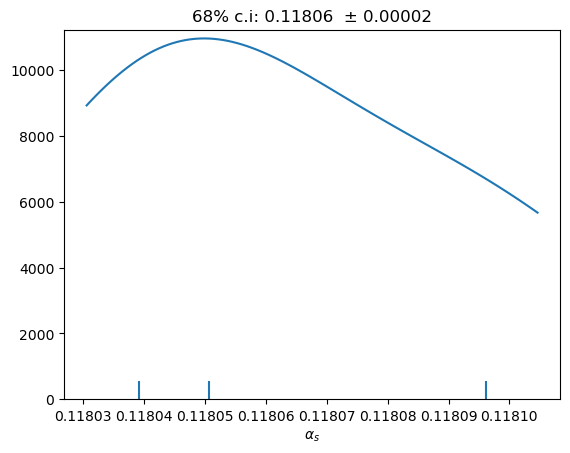

count    3.000000
mean     0.117939
std      0.000020
min      0.117921
16%      0.117926
50%      0.117935
84%      0.117953
max      0.117961
dtype: float64

cv±std = 0.11794 ± 0.00002 
1std interval:  0.11792 to 0.11796 
68% c.i:        0.11793 to 0.11795 


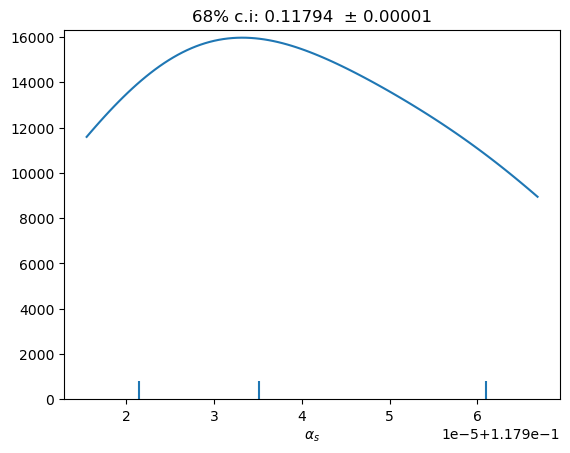

count    3.000000
mean     0.118077
std      0.000010
min      0.118066
16%      0.118070
50%      0.118080
84%      0.118084
max      0.118086
dtype: float64

cv±std = 0.11808 ± 0.00001 
1std interval:  0.11807 to 0.11809 
68% c.i:        0.11807 to 0.11808 


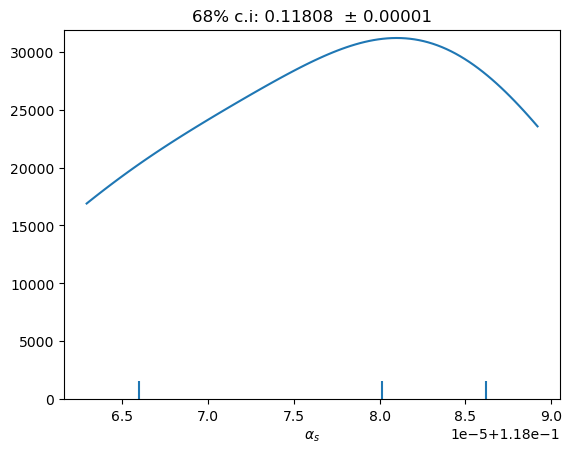

count    3.000000
mean     0.118203
std      0.000043
min      0.118162
16%      0.118174
50%      0.118198
84%      0.118232
max      0.118247
dtype: float64

cv±std = 0.11820 ± 0.00004 
1std interval:  0.11816 to 0.11825 
68% c.i:        0.11817 to 0.11823 


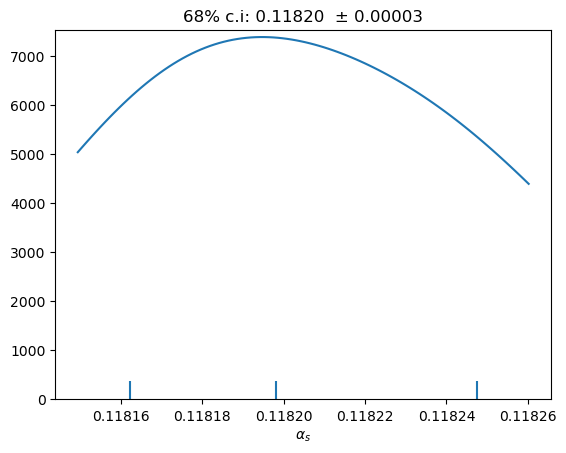

count    3.000000
mean     0.117944
std      0.000019
min      0.117931
16%      0.117932
50%      0.117936
84%      0.117956
max      0.117965
dtype: float64

cv±std = 0.11794 ± 0.00002 
1std interval:  0.11793 to 0.11796 
68% c.i:        0.11793 to 0.11796 


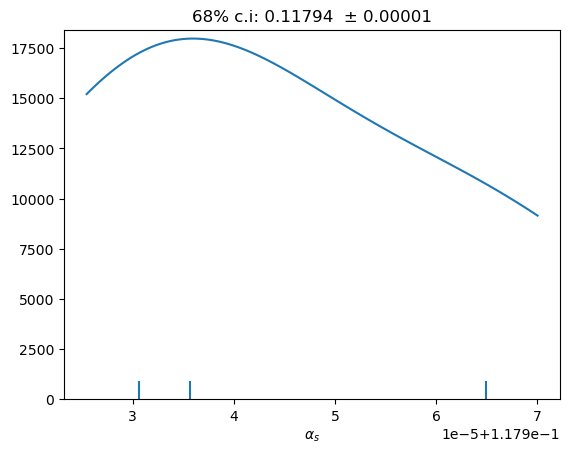

count    3.000000
mean     0.118421
std      0.000028
min      0.118402
16%      0.118404
50%      0.118408
84%      0.118439
max      0.118454
dtype: float64

cv±std = 0.11842 ± 0.00003 
1std interval:  0.11839 to 0.11845 
68% c.i:        0.11840 to 0.11844 


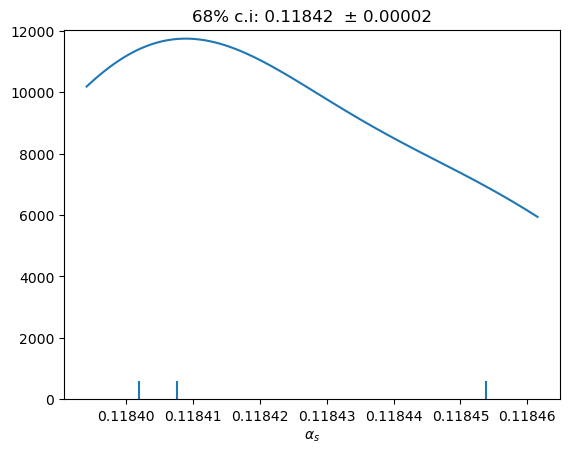

count    3.000000
mean     0.118290
std      0.000023
min      0.118275
16%      0.118276
50%      0.118278
84%      0.118304
max      0.118316
dtype: float64

cv±std = 0.11829 ± 0.00002 
1std interval:  0.11827 to 0.11831 
68% c.i:        0.11828 to 0.11830 


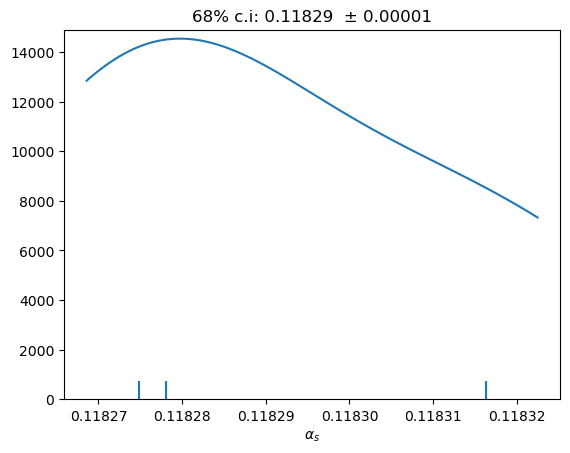

count    3.000000
mean     0.118266
std      0.000025
min      0.118245
16%      0.118250
50%      0.118260
84%      0.118283
max      0.118294
dtype: float64

cv±std = 0.11827 ± 0.00003 
1std interval:  0.11824 to 0.11829 
68% c.i:        0.11825 to 0.11828 


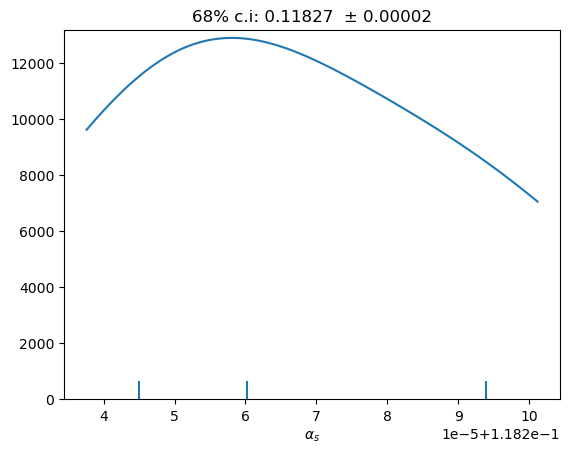

count    3.000000
mean     0.118003
std      0.000001
min      0.118002
16%      0.118002
50%      0.118003
84%      0.118004
max      0.118004
dtype: float64

cv±std = 0.11800 ± 0.00000 
1std interval:  0.11800 to 0.11800 
68% c.i:        0.11800 to 0.11800 


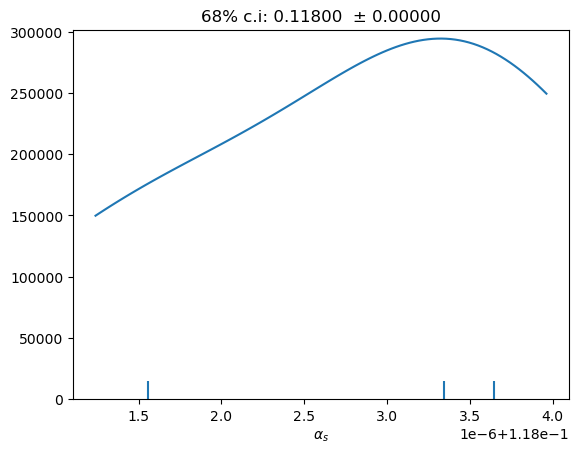

count    3.000000
mean     0.118131
std      0.000043
min      0.118099
16%      0.118104
50%      0.118114
84%      0.118159
max      0.118179
dtype: float64

cv±std = 0.11813 ± 0.00004 
1std interval:  0.11809 to 0.11817 
68% c.i:        0.11810 to 0.11816 


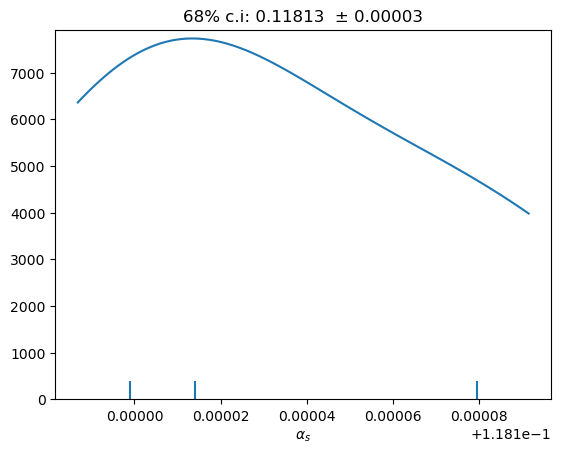

count    3.000000
mean     0.118563
std      0.000025
min      0.118540
16%      0.118546
50%      0.118558
84%      0.118580
max      0.118590
dtype: float64

cv±std = 0.11856 ± 0.00003 
1std interval:  0.11854 to 0.11859 
68% c.i:        0.11855 to 0.11858 


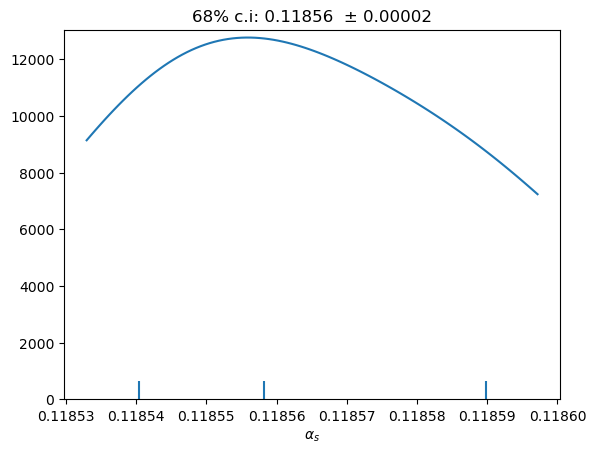

count    3.000000
mean     0.118338
std      0.000012
min      0.118324
16%      0.118331
50%      0.118345
84%      0.118345
max      0.118345
dtype: float64

cv±std = 0.11834 ± 0.00001 
1std interval:  0.11833 to 0.11835 
68% c.i:        0.11833 to 0.11835 


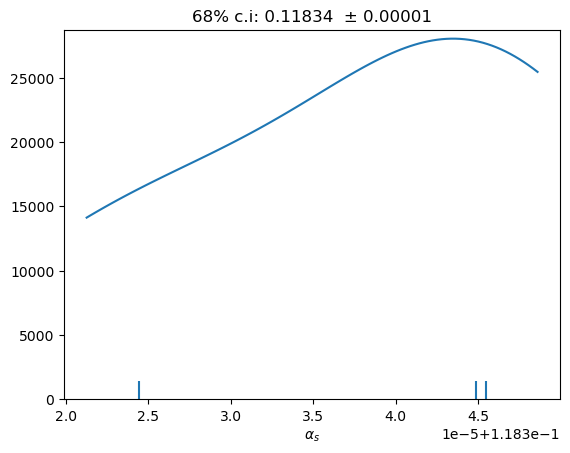

count    3.000000
mean     0.118515
std      0.000008
min      0.118510
16%      0.118511
50%      0.118511
84%      0.118520
max      0.118524
dtype: float64

cv±std = 0.11852 ± 0.00001 
1std interval:  0.11851 to 0.11852 
68% c.i:        0.11851 to 0.11852 


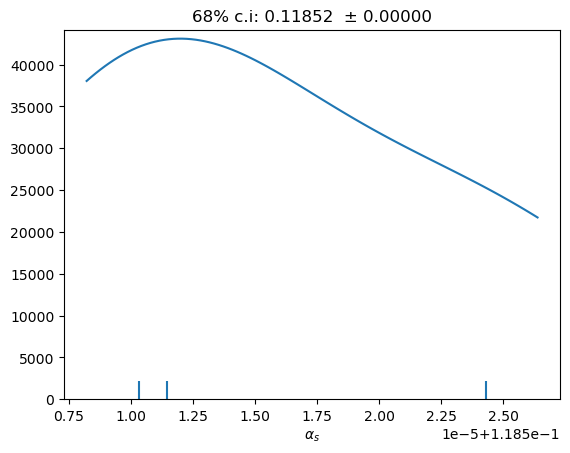

count    3.000000
mean     0.118292
std      0.000031
min      0.118256
16%      0.118272
50%      0.118306
84%      0.118311
max      0.118314
dtype: float64

cv±std = 0.11829 ± 0.00003 
1std interval:  0.11826 to 0.11832 
68% c.i:        0.11827 to 0.11831 


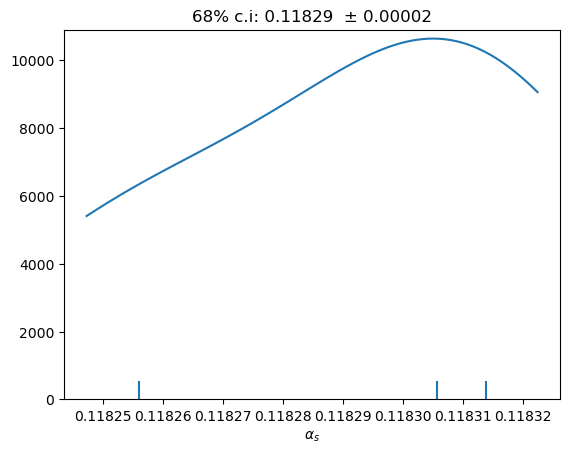

count    3.000000
mean     0.118148
std      0.000038
min      0.118111
16%      0.118122
50%      0.118144
84%      0.118174
max      0.118188
dtype: float64

cv±std = 0.11815 ± 0.00004 
1std interval:  0.11811 to 0.11819 
68% c.i:        0.11812 to 0.11817 


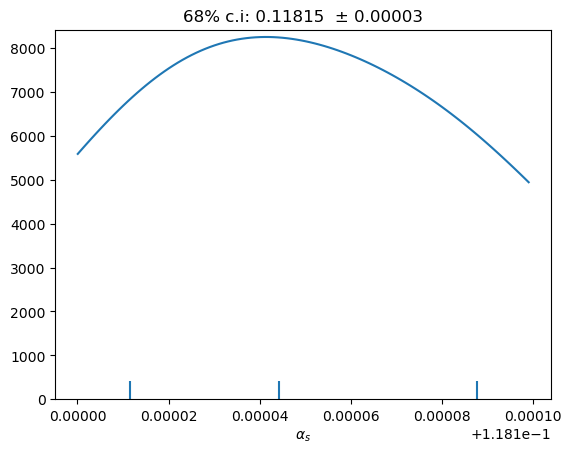

count    3.000000
mean     0.117897
std      0.000072
min      0.117848
16%      0.117853
50%      0.117864
84%      0.117942
max      0.117979
dtype: float64

cv±std = 0.11790 ± 0.00007 
1std interval:  0.11783 to 0.11797 
68% c.i:        0.11785 to 0.11794 


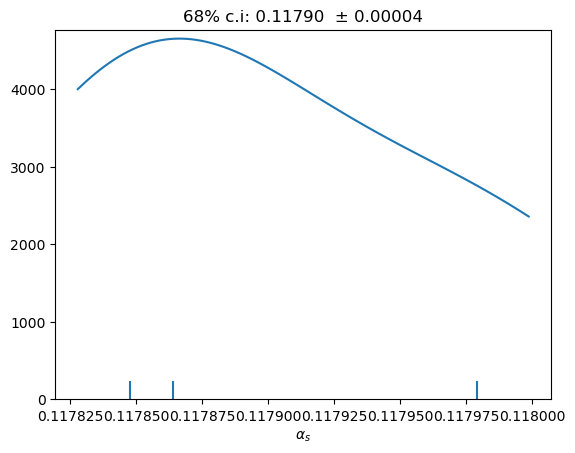

count    58.000000
mean      0.118392
std       0.000332
min       0.117610
16%       0.118097
50%       0.118421
84%       0.118684
max       0.119225
dtype: float64

cv±std = 0.11839 ± 0.00033 
1std interval:  0.11806 to 0.11872 
68% c.i:        0.11810 to 0.11868 


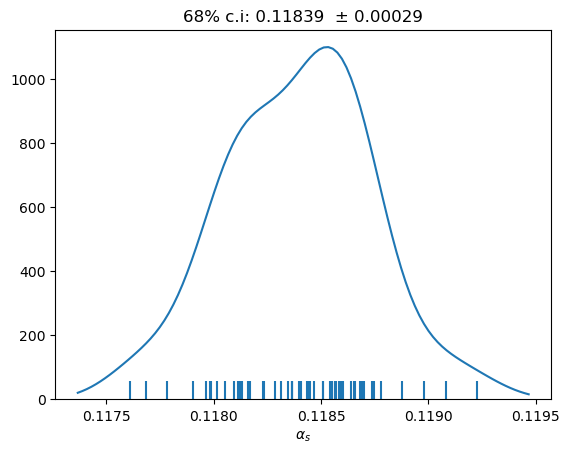

count    71.000000
mean      0.118406
std       0.000336
min       0.117688
16%       0.118080
50%       0.118407
84%       0.118786
max       0.119110
dtype: float64

cv±std = 0.11841 ± 0.00034 
1std interval:  0.11807 to 0.11874 
68% c.i:        0.11808 to 0.11879 


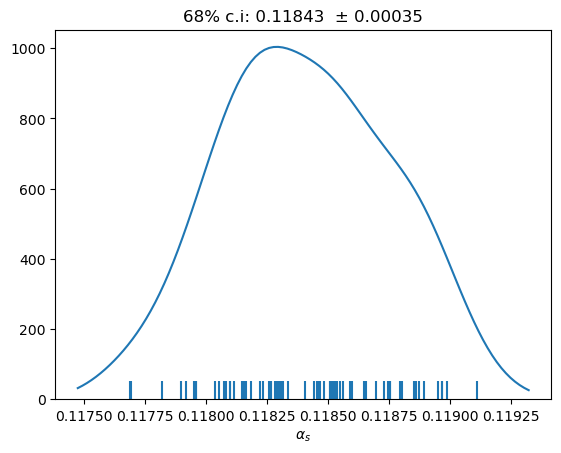

count    74.000000
mean      0.118359
std       0.000366
min       0.117319
16%       0.117982
50%       0.118396
84%       0.118751
max       0.119137
dtype: float64

cv±std = 0.11836 ± 0.00037 
1std interval:  0.11799 to 0.11873 
68% c.i:        0.11798 to 0.11875 


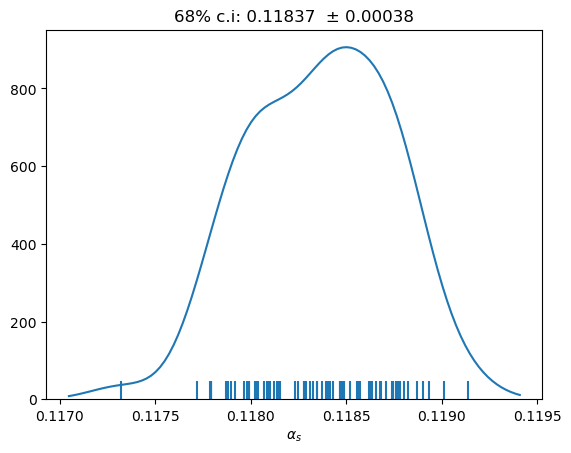

count    65.000000
mean      0.118596
std       0.000344
min       0.117692
16%       0.118324
50%       0.118607
84%       0.118921
max       0.119378
dtype: float64

cv±std = 0.11860 ± 0.00034 
1std interval:  0.11825 to 0.11894 
68% c.i:        0.11832 to 0.11892 


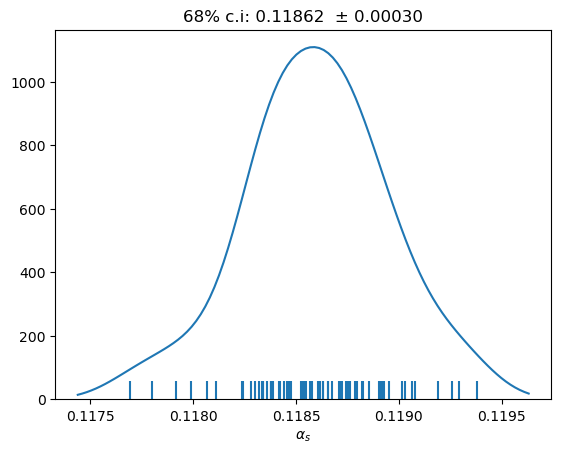

count    83.000000
mean      0.118551
std       0.000399
min       0.117454
16%       0.118142
50%       0.118527
84%       0.118968
max       0.119563
dtype: float64

cv±std = 0.11855 ± 0.00040 
1std interval:  0.11815 to 0.11895 
68% c.i:        0.11814 to 0.11897 


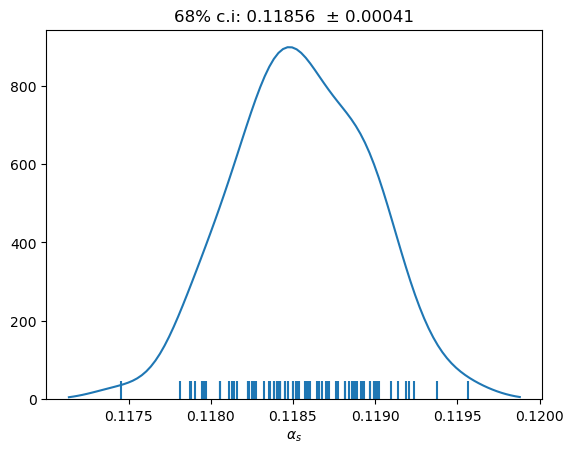

count    81.000000
mean      0.118577
std       0.000365
min       0.117802
16%       0.118211
50%       0.118588
84%       0.118945
max       0.119365
dtype: float64

cv±std = 0.11858 ± 0.00037 
1std interval:  0.11821 to 0.11894 
68% c.i:        0.11821 to 0.11895 


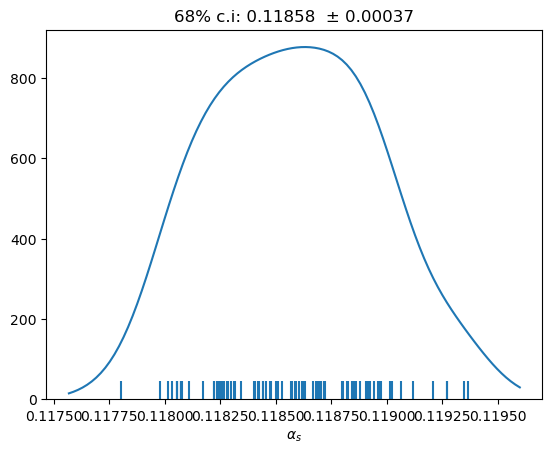

count    64.000000
mean      0.118252
std       0.000344
min       0.117483
16%       0.117884
50%       0.118309
84%       0.118574
max       0.118913
dtype: float64

cv±std = 0.11825 ± 0.00034 
1std interval:  0.11791 to 0.11860 
68% c.i:        0.11788 to 0.11857 


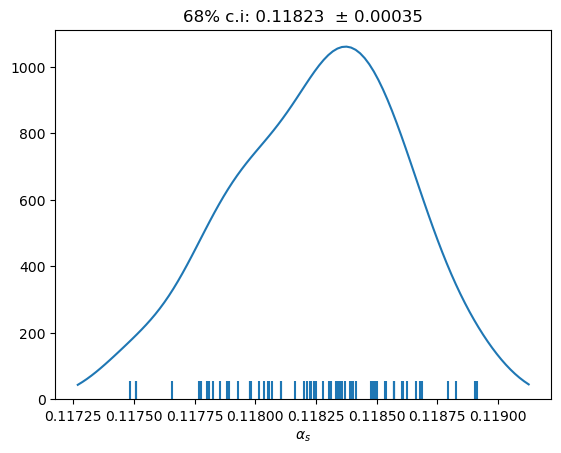

count    88.000000
mean      0.118241
std       0.000342
min       0.117392
16%       0.117881
50%       0.118233
84%       0.118619
max       0.118954
dtype: float64

cv±std = 0.11824 ± 0.00034 
1std interval:  0.11790 to 0.11858 
68% c.i:        0.11788 to 0.11862 


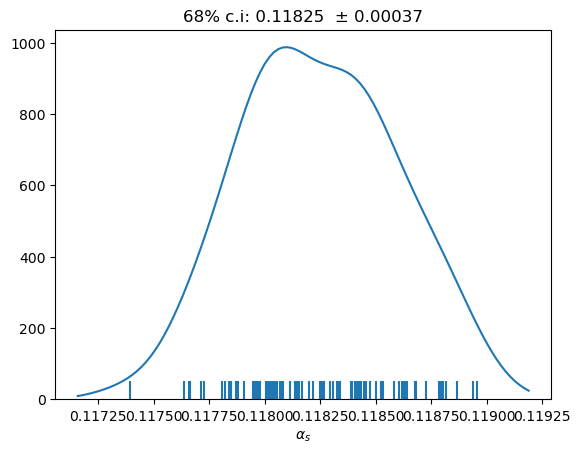

count    84.000000
mean      0.118256
std       0.000333
min       0.117690
16%       0.117929
50%       0.118219
84%       0.118570
max       0.119202
dtype: float64

cv±std = 0.11826 ± 0.00033 
1std interval:  0.11792 to 0.11859 
68% c.i:        0.11793 to 0.11857 


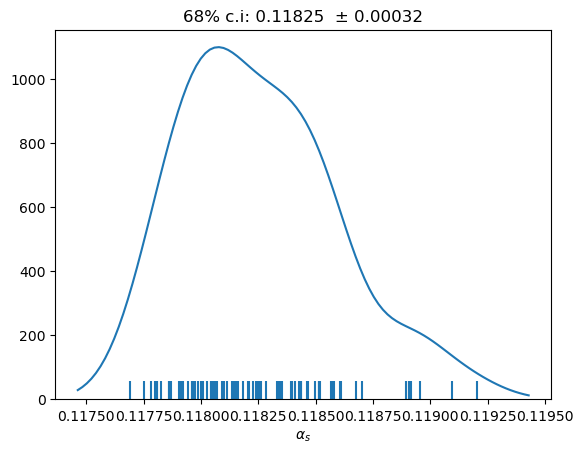

count    60.000000
mean      0.118569
std       0.000406
min       0.117755
16%       0.118153
50%       0.118535
84%       0.119024
max       0.119414
dtype: float64

cv±std = 0.11857 ± 0.00041 
1std interval:  0.11816 to 0.11898 
68% c.i:        0.11815 to 0.11902 


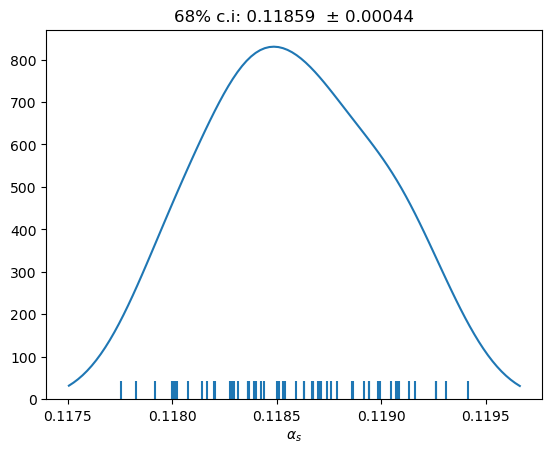

count    80.000000
mean      0.118511
std       0.000387
min       0.117620
16%       0.118109
50%       0.118562
84%       0.118867
max       0.119524
dtype: float64

cv±std = 0.11851 ± 0.00039 
1std interval:  0.11812 to 0.11890 
68% c.i:        0.11811 to 0.11887 


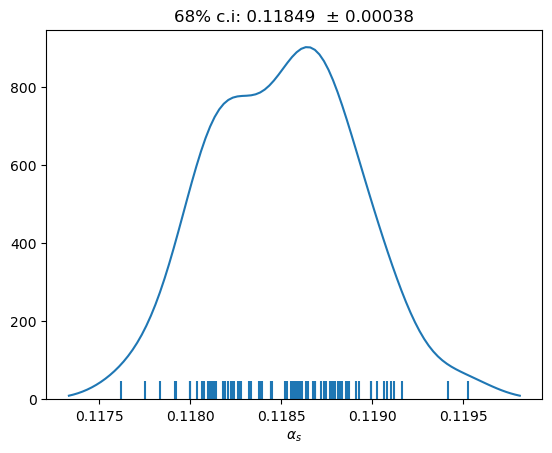

count    83.000000
mean      0.118554
std       0.000343
min       0.117790
16%       0.118193
50%       0.118563
84%       0.118917
max       0.119415
dtype: float64

cv±std = 0.11855 ± 0.00034 
1std interval:  0.11821 to 0.11890 
68% c.i:        0.11819 to 0.11892 


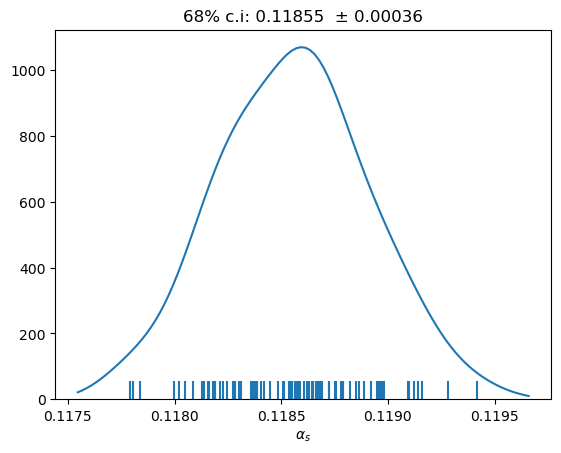

count    61.000000
mean      0.118267
std       0.000293
min       0.117591
16%       0.118026
50%       0.118219
84%       0.118543
max       0.119087
dtype: float64

cv±std = 0.11827 ± 0.00029 
1std interval:  0.11797 to 0.11856 
68% c.i:        0.11803 to 0.11854 


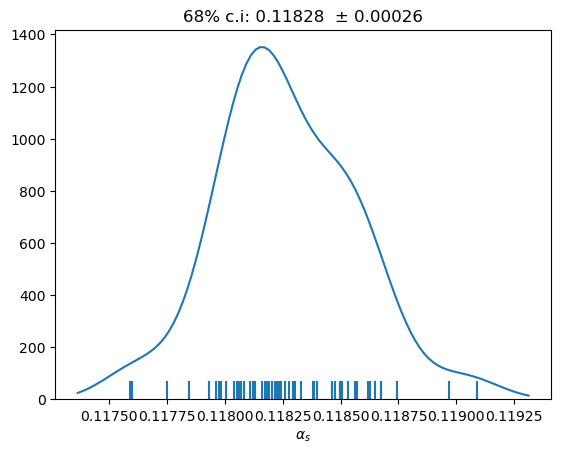

count    79.000000
mean      0.118218
std       0.000328
min       0.117618
16%       0.117844
50%       0.118232
84%       0.118492
max       0.119248
dtype: float64

cv±std = 0.11822 ± 0.00033 
1std interval:  0.11789 to 0.11855 
68% c.i:        0.11784 to 0.11849 


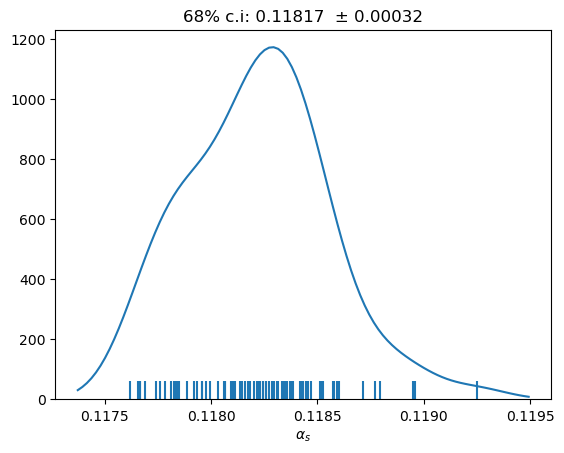

count    76.000000
mean      0.118256
std       0.000305
min       0.117559
16%       0.118002
50%       0.118237
84%       0.118513
max       0.119012
dtype: float64

cv±std = 0.11826 ± 0.00031 
1std interval:  0.11795 to 0.11856 
68% c.i:        0.11800 to 0.11851 


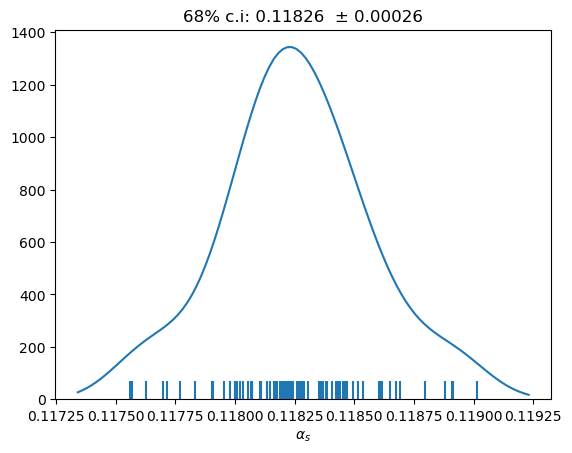

count    62.000000
mean      0.117834
std       0.000364
min       0.117027
16%       0.117471
50%       0.117841
84%       0.118213
max       0.118534
dtype: float64

cv±std = 0.11783 ± 0.00036 
1std interval:  0.11747 to 0.11820 
68% c.i:        0.11747 to 0.11821 


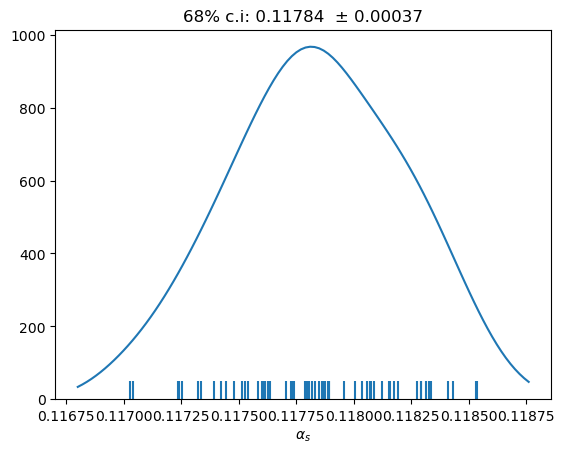

count    87.000000
mean      0.117860
std       0.000377
min       0.117132
16%       0.117503
50%       0.117822
84%       0.118285
max       0.118646
dtype: float64

cv±std = 0.11786 ± 0.00038 
1std interval:  0.11748 to 0.11824 
68% c.i:        0.11750 to 0.11828 


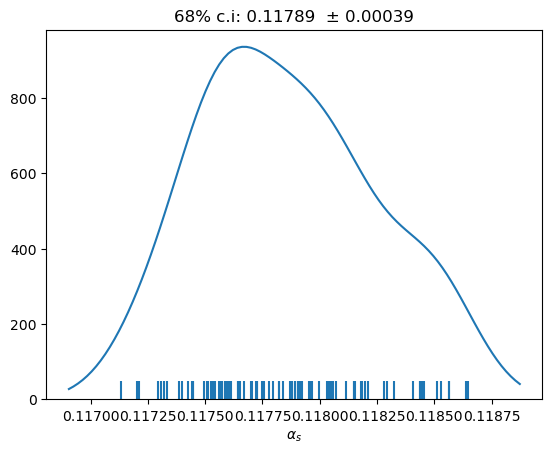

count    80.000000
mean      0.117813
std       0.000358
min       0.116880
16%       0.117470
50%       0.117839
84%       0.118134
max       0.118590
dtype: float64

cv±std = 0.11781 ± 0.00036 
1std interval:  0.11746 to 0.11817 
68% c.i:        0.11747 to 0.11813 


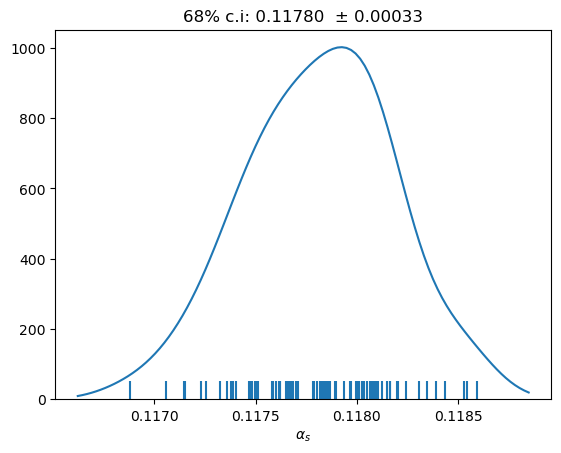

count    62.000000
mean      0.118132
std       0.000326
min       0.117343
16%       0.117864
50%       0.118125
84%       0.118390
max       0.118855
dtype: float64

cv±std = 0.11813 ± 0.00033 
1std interval:  0.11781 to 0.11846 
68% c.i:        0.11786 to 0.11839 


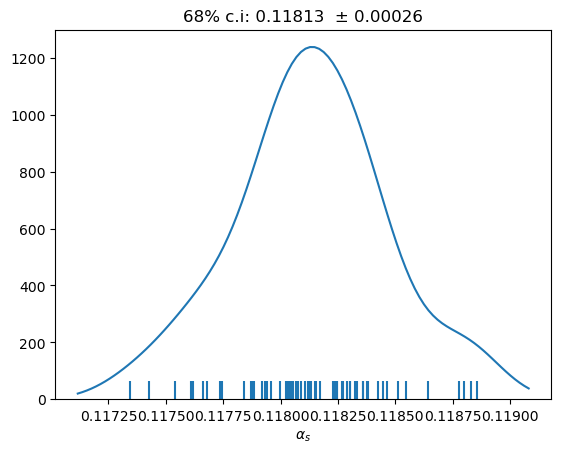

count    81.000000
mean      0.118078
std       0.000384
min       0.117211
16%       0.117753
50%       0.118094
84%       0.118448
max       0.119092
dtype: float64

cv±std = 0.11808 ± 0.00038 
1std interval:  0.11769 to 0.11846 
68% c.i:        0.11775 to 0.11845 


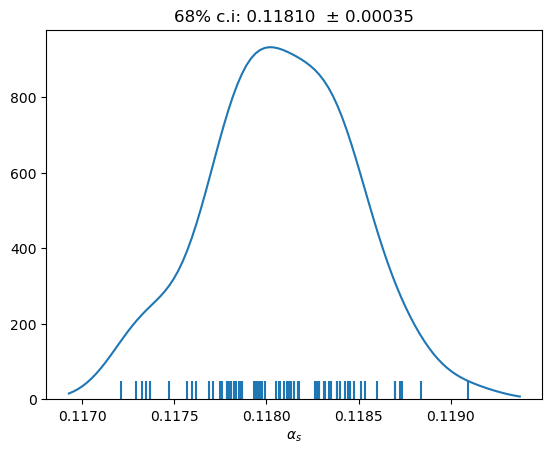

count    80.000000
mean      0.118111
std       0.000336
min       0.117087
16%       0.117848
50%       0.118156
84%       0.118381
max       0.118884
dtype: float64

cv±std = 0.11811 ± 0.00034 
1std interval:  0.11777 to 0.11845 
68% c.i:        0.11785 to 0.11838 


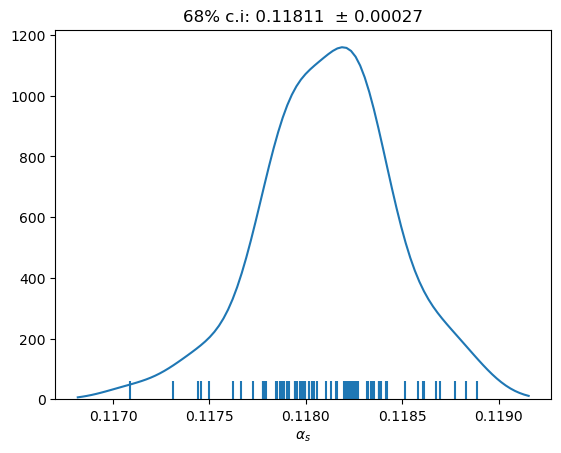

count    66.000000
mean      0.118118
std       0.000354
min       0.117246
16%       0.117751
50%       0.118118
84%       0.118464
max       0.118883
dtype: float64

cv±std = 0.11812 ± 0.00035 
1std interval:  0.11776 to 0.11847 
68% c.i:        0.11775 to 0.11846 


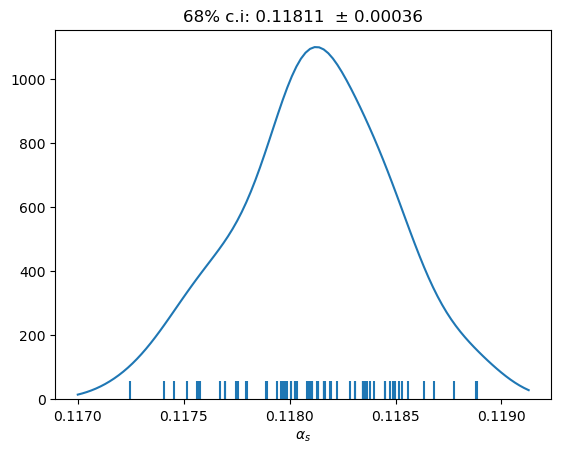

count    74.000000
mean      0.118079
std       0.000368
min       0.117291
16%       0.117693
50%       0.118123
84%       0.118417
max       0.118819
dtype: float64

cv±std = 0.11808 ± 0.00037 
1std interval:  0.11771 to 0.11845 
68% c.i:        0.11769 to 0.11842 


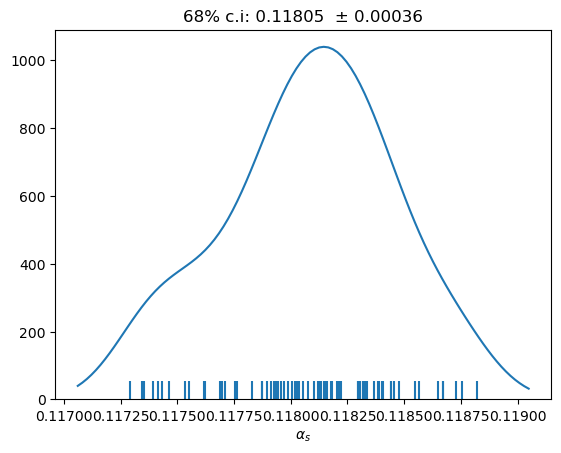

count    79.000000
mean      0.118136
std       0.000328
min       0.117431
16%       0.117810
50%       0.118133
84%       0.118434
max       0.119005
dtype: float64

cv±std = 0.11814 ± 0.00033 
1std interval:  0.11781 to 0.11846 
68% c.i:        0.11781 to 0.11843 


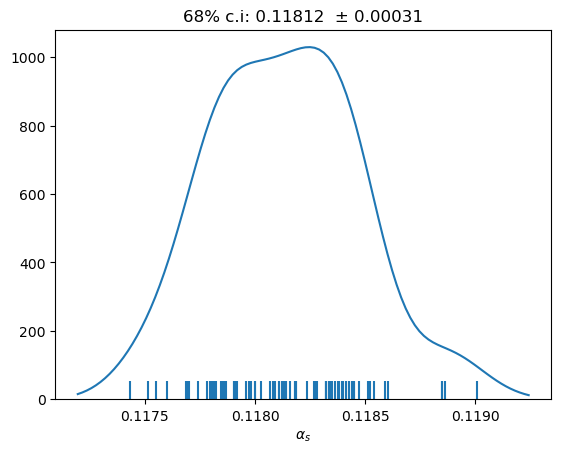

count    63.000000
mean      0.117488
std       0.000348
min       0.116569
16%       0.117127
50%       0.117540
84%       0.117773
max       0.118282
dtype: float64

cv±std = 0.11749 ± 0.00035 
1std interval:  0.11714 to 0.11784 
68% c.i:        0.11713 to 0.11777 


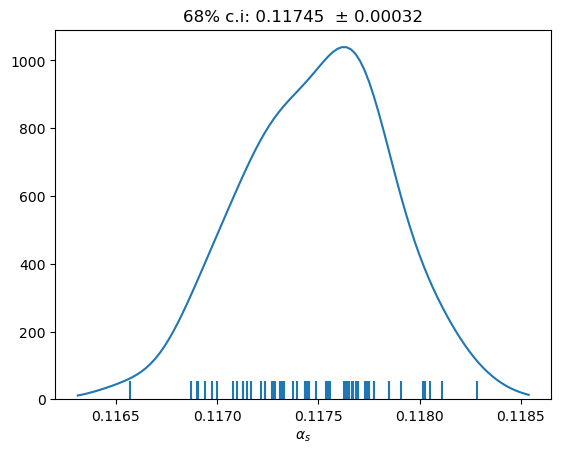

count    80.000000
mean      0.117446
std       0.000345
min       0.116672
16%       0.117066
50%       0.117492
84%       0.117797
max       0.118241
dtype: float64

cv±std = 0.11745 ± 0.00035 
1std interval:  0.11710 to 0.11779 
68% c.i:        0.11707 to 0.11780 


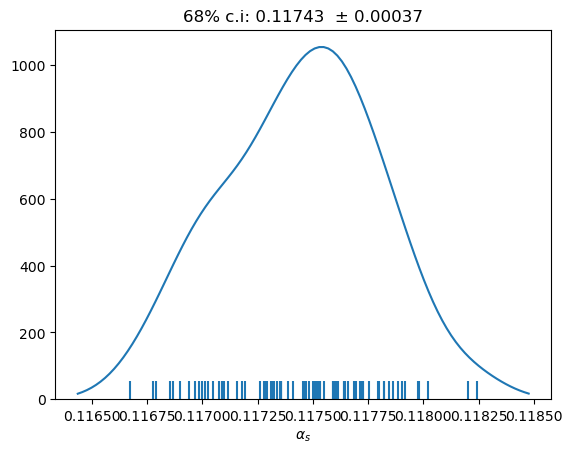

count    83.000000
mean      0.117452
std       0.000335
min       0.116739
16%       0.117108
50%       0.117401
84%       0.117792
max       0.118373
dtype: float64

cv±std = 0.11745 ± 0.00034 
1std interval:  0.11712 to 0.11779 
68% c.i:        0.11711 to 0.11779 


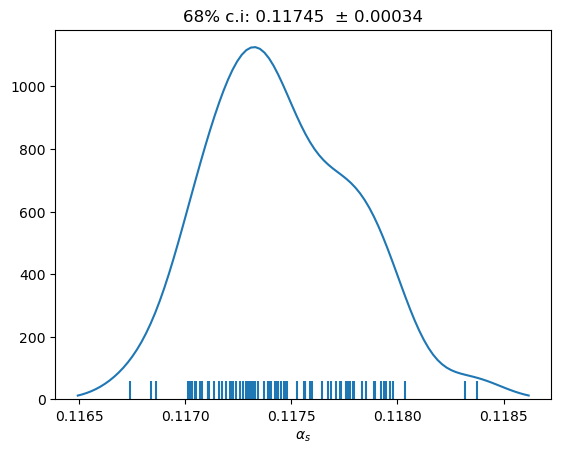

count    60.000000
mean      0.118051
std       0.000307
min       0.117292
16%       0.117745
50%       0.118054
84%       0.118358
max       0.118653
dtype: float64

cv±std = 0.11805 ± 0.00031 
1std interval:  0.11774 to 0.11836 
68% c.i:        0.11774 to 0.11836 


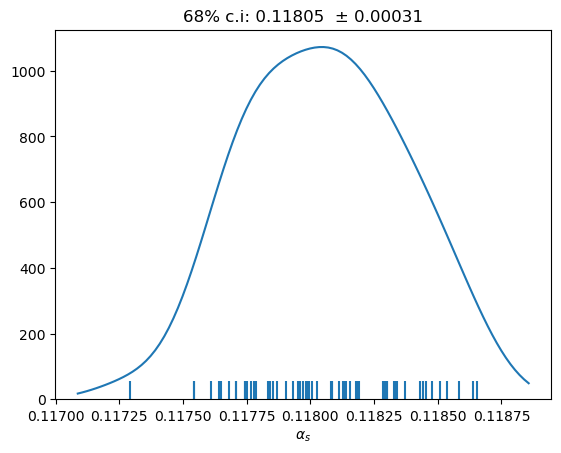

count    79.000000
mean      0.118039
std       0.000320
min       0.117263
16%       0.117738
50%       0.118014
84%       0.118337
max       0.118875
dtype: float64

cv±std = 0.11804 ± 0.00032 
1std interval:  0.11772 to 0.11836 
68% c.i:        0.11774 to 0.11834 


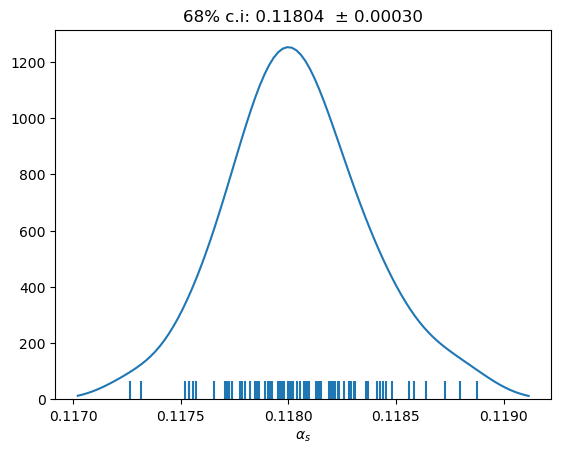

count    84.000000
mean      0.118096
std       0.000349
min       0.117113
16%       0.117769
50%       0.118118
84%       0.118409
max       0.118958
dtype: float64

cv±std = 0.11810 ± 0.00035 
1std interval:  0.11775 to 0.11845 
68% c.i:        0.11777 to 0.11841 


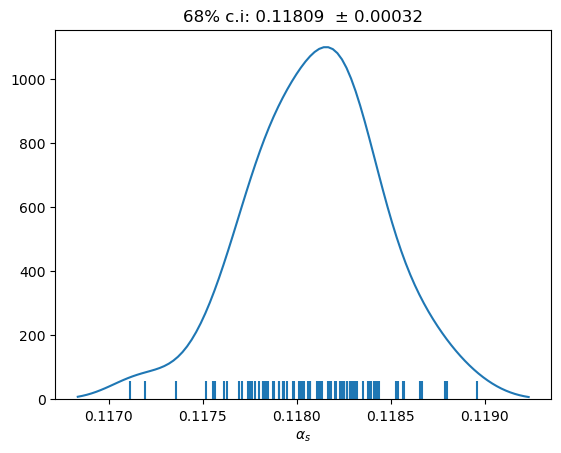

count    58.000000
mean      0.117961
std       0.000324
min       0.117284
16%       0.117609
50%       0.117934
84%       0.118310
max       0.118683
dtype: float64

cv±std = 0.11796 ± 0.00032 
1std interval:  0.11764 to 0.11829 
68% c.i:        0.11761 to 0.11831 


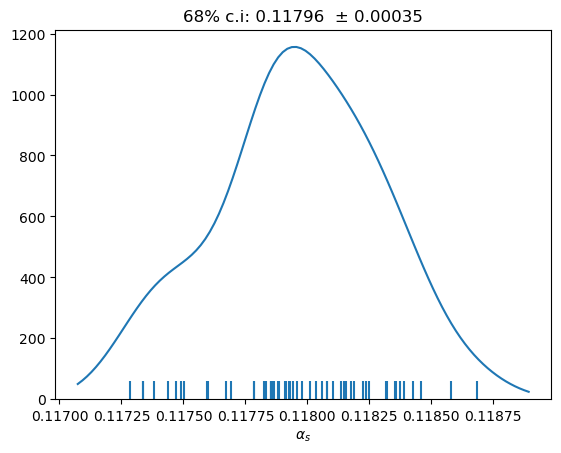

count    78.000000
mean      0.117935
std       0.000326
min       0.117083
16%       0.117573
50%       0.117963
84%       0.118254
max       0.118552
dtype: float64

cv±std = 0.11794 ± 0.00033 
1std interval:  0.11761 to 0.11826 
68% c.i:        0.11757 to 0.11825 


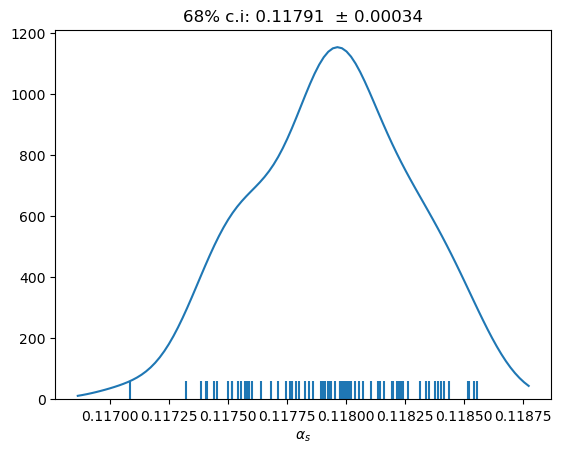

count    76.000000
mean      0.117921
std       0.000351
min       0.117150
16%       0.117523
50%       0.117907
84%       0.118331
max       0.118768
dtype: float64

cv±std = 0.11792 ± 0.00035 
1std interval:  0.11757 to 0.11827 
68% c.i:        0.11752 to 0.11833 


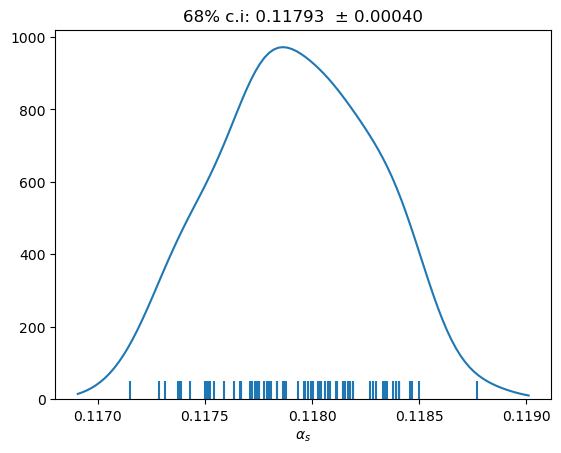

count    64.000000
mean      0.118080
std       0.000328
min       0.117353
16%       0.117751
50%       0.118153
84%       0.118405
max       0.118718
dtype: float64

cv±std = 0.11808 ± 0.00033 
1std interval:  0.11775 to 0.11841 
68% c.i:        0.11775 to 0.11840 


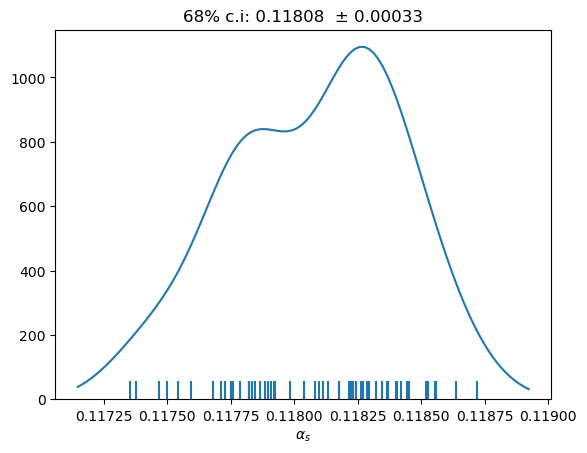

count    74.000000
mean      0.118086
std       0.000330
min       0.117303
16%       0.117758
50%       0.118082
84%       0.118401
max       0.119019
dtype: float64

cv±std = 0.11809 ± 0.00033 
1std interval:  0.11776 to 0.11842 
68% c.i:        0.11776 to 0.11840 


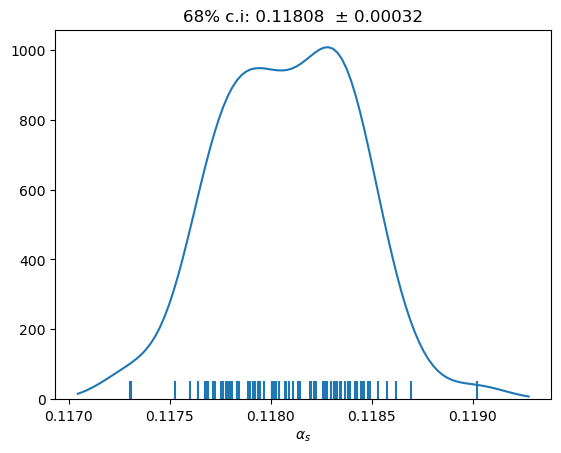

count    81.000000
mean      0.118066
std       0.000341
min       0.117367
16%       0.117664
50%       0.118092
84%       0.118396
max       0.118906
dtype: float64

cv±std = 0.11807 ± 0.00034 
1std interval:  0.11772 to 0.11841 
68% c.i:        0.11766 to 0.11840 


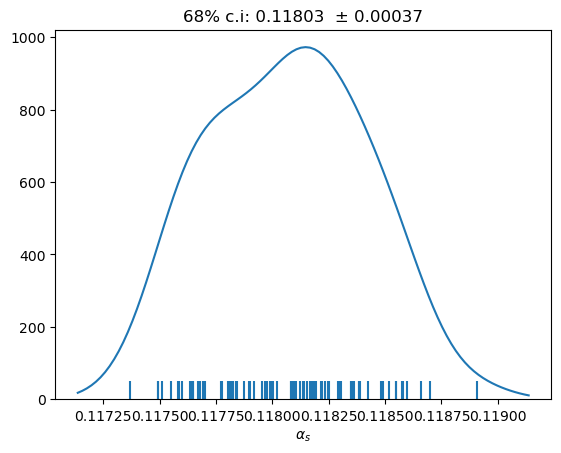

count    62.000000
mean      0.118247
std       0.000322
min       0.117420
16%       0.117961
50%       0.118224
84%       0.118601
max       0.118885
dtype: float64

cv±std = 0.11825 ± 0.00032 
1std interval:  0.11793 to 0.11857 
68% c.i:        0.11796 to 0.11860 


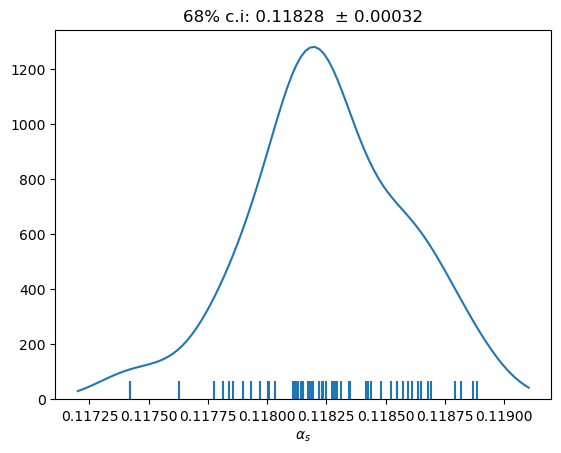

count    82.000000
mean      0.118162
std       0.000349
min       0.117480
16%       0.117801
50%       0.118168
84%       0.118482
max       0.119143
dtype: float64

cv±std = 0.11816 ± 0.00035 
1std interval:  0.11781 to 0.11851 
68% c.i:        0.11780 to 0.11848 


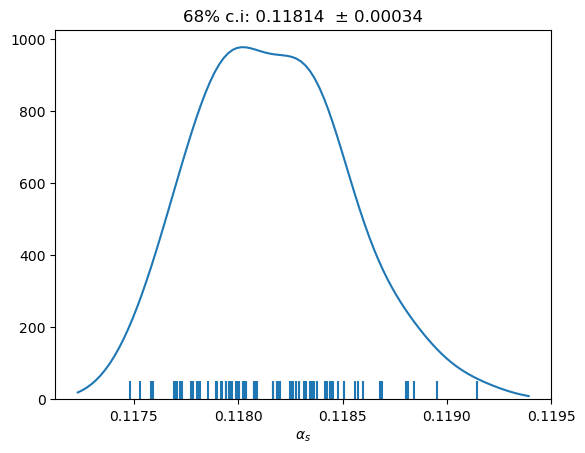

count    80.000000
mean      0.118198
std       0.000324
min       0.117580
16%       0.117866
50%       0.118133
84%       0.118523
max       0.118950
dtype: float64

cv±std = 0.11820 ± 0.00032 
1std interval:  0.11787 to 0.11852 
68% c.i:        0.11787 to 0.11852 


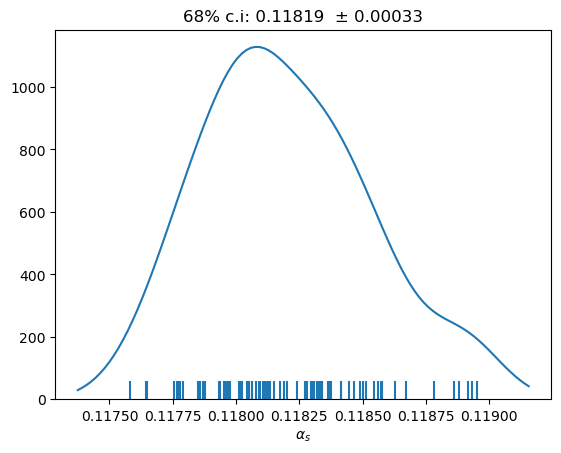

count    67.000000
mean      0.117965
std       0.000320
min       0.117287
16%       0.117676
50%       0.117958
84%       0.118268
max       0.118835
dtype: float64

cv±std = 0.11796 ± 0.00032 
1std interval:  0.11765 to 0.11828 
68% c.i:        0.11768 to 0.11827 


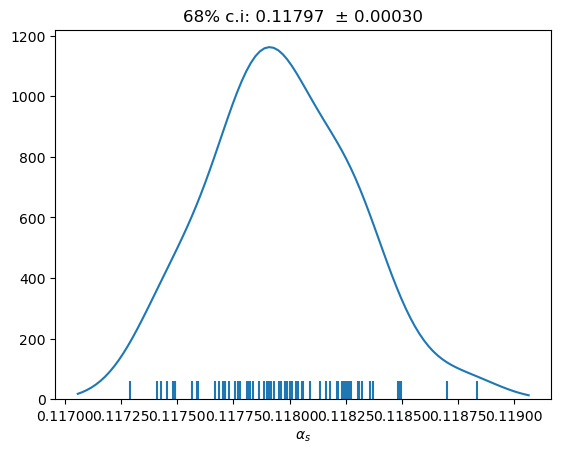

count    91.000000
mean      0.117936
std       0.000278
min       0.117260
16%       0.117660
50%       0.117951
84%       0.118158
max       0.118784
dtype: float64

cv±std = 0.11794 ± 0.00028 
1std interval:  0.11766 to 0.11821 
68% c.i:        0.11766 to 0.11816 


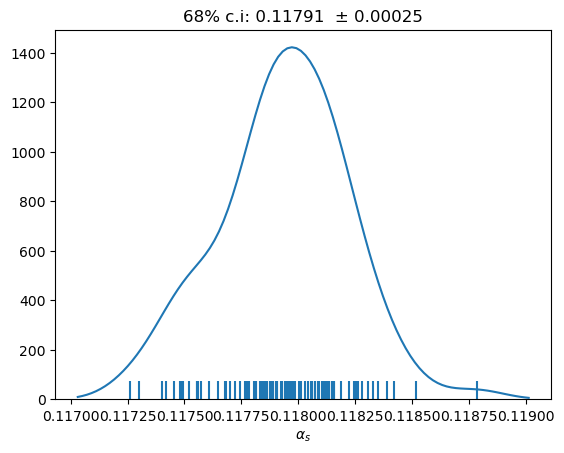

count    78.000000
mean      0.117931
std       0.000302
min       0.116992
16%       0.117670
50%       0.117911
84%       0.118232
max       0.118795
dtype: float64

cv±std = 0.11793 ± 0.00030 
1std interval:  0.11763 to 0.11823 
68% c.i:        0.11767 to 0.11823 


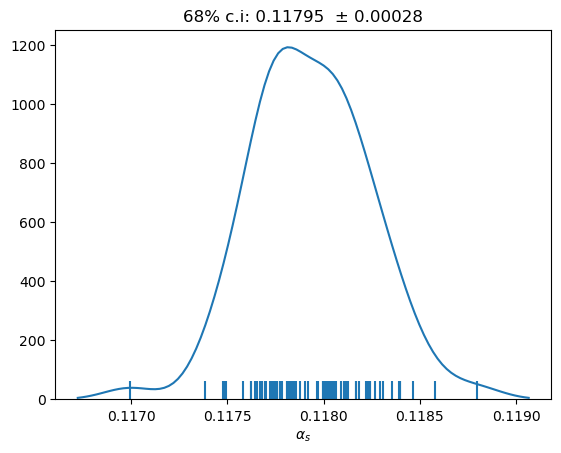

count    63.000000
mean      0.118454
std       0.000346
min       0.117230
16%       0.118152
50%       0.118414
84%       0.118741
max       0.119263
dtype: float64

cv±std = 0.11845 ± 0.00035 
1std interval:  0.11811 to 0.11880 
68% c.i:        0.11815 to 0.11874 


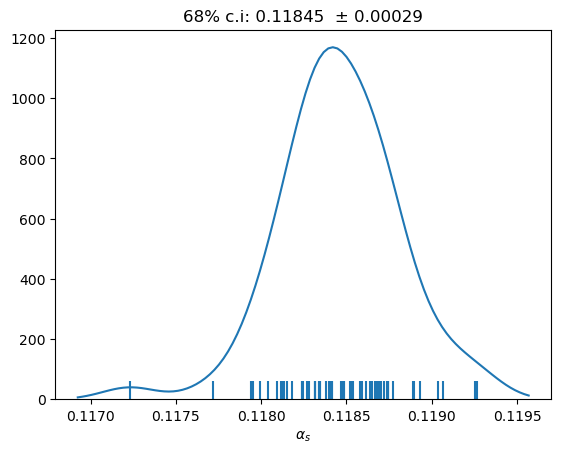

count    87.000000
mean      0.118402
std       0.000365
min       0.117419
16%       0.118011
50%       0.118428
84%       0.118764
max       0.119167
dtype: float64

cv±std = 0.11840 ± 0.00037 
1std interval:  0.11804 to 0.11877 
68% c.i:        0.11801 to 0.11876 


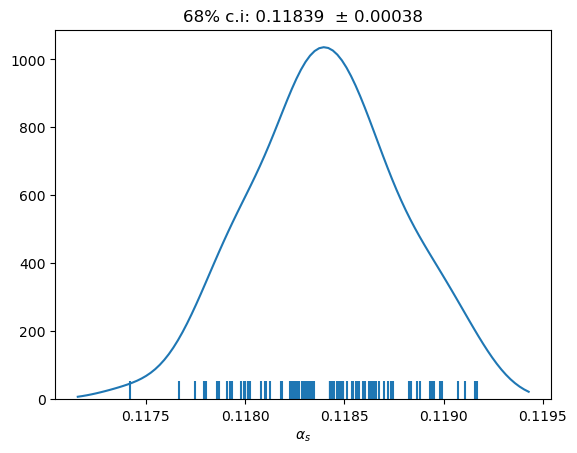

count    73.000000
mean      0.118408
std       0.000347
min       0.117350
16%       0.118078
50%       0.118399
84%       0.118763
max       0.119284
dtype: float64

cv±std = 0.11841 ± 0.00035 
1std interval:  0.11806 to 0.11875 
68% c.i:        0.11808 to 0.11876 


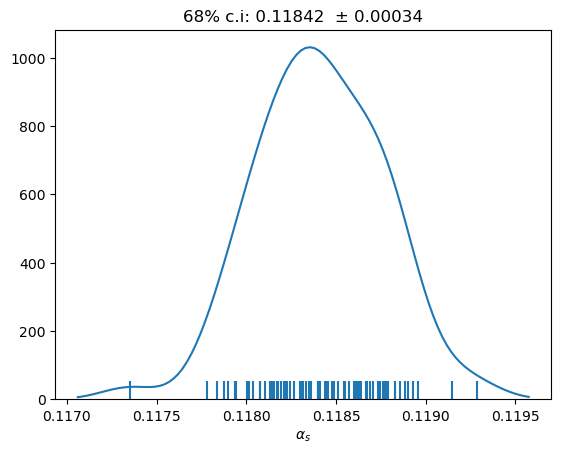

count    59.000000
mean      0.118316
std       0.000338
min       0.117515
16%       0.118005
50%       0.118294
84%       0.118595
max       0.119183
dtype: float64

cv±std = 0.11832 ± 0.00034 
1std interval:  0.11798 to 0.11865 
68% c.i:        0.11800 to 0.11860 


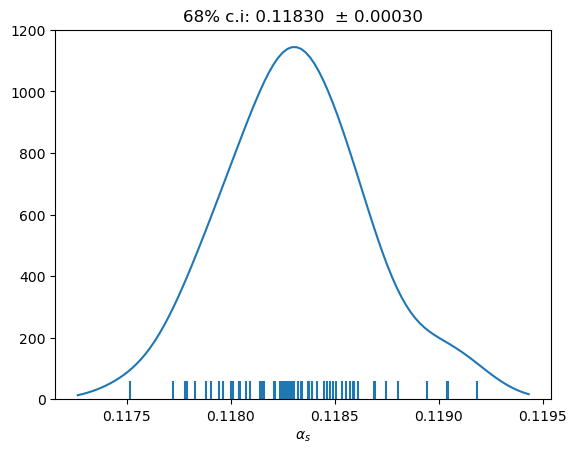

count    81.000000
mean      0.118278
std       0.000342
min       0.117456
16%       0.117936
50%       0.118252
84%       0.118623
max       0.119050
dtype: float64

cv±std = 0.11828 ± 0.00034 
1std interval:  0.11794 to 0.11862 
68% c.i:        0.11794 to 0.11862 


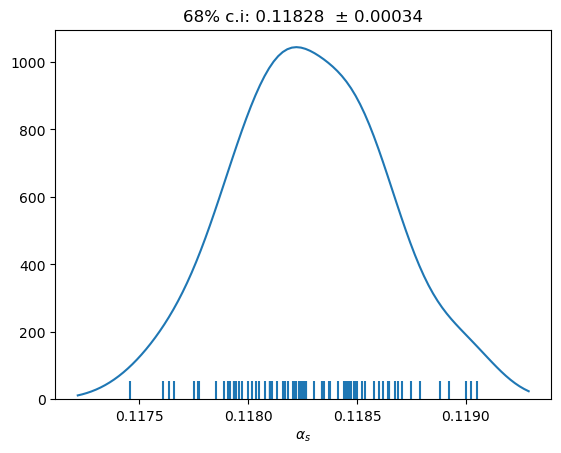

count    74.000000
mean      0.118275
std       0.000371
min       0.117400
16%       0.117930
50%       0.118279
84%       0.118584
max       0.119091
dtype: float64

cv±std = 0.11827 ± 0.00037 
1std interval:  0.11790 to 0.11865 
68% c.i:        0.11793 to 0.11858 


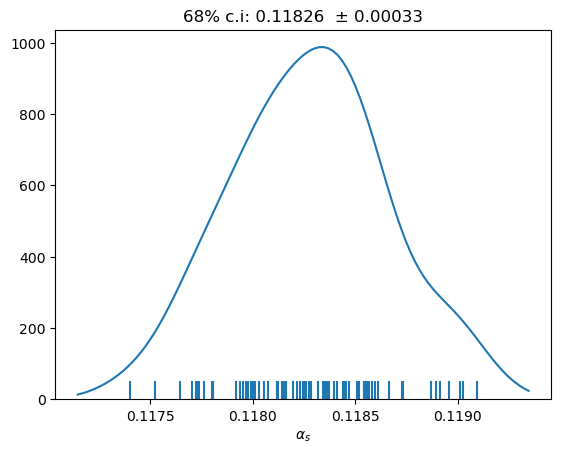

count    58.000000
mean      0.118294
std       0.000368
min       0.117262
16%       0.117965
50%       0.118271
84%       0.118636
max       0.118998
dtype: float64

cv±std = 0.11829 ± 0.00037 
1std interval:  0.11793 to 0.11866 
68% c.i:        0.11796 to 0.11864 


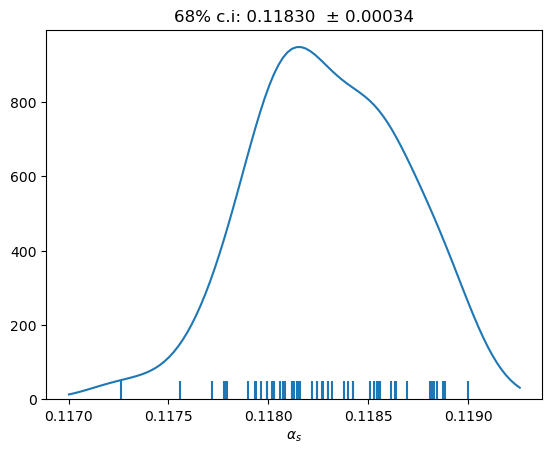

count    89.000000
mean      0.118260
std       0.000329
min       0.117391
16%       0.117977
50%       0.118271
84%       0.118634
max       0.119002
dtype: float64

cv±std = 0.11826 ± 0.00033 
1std interval:  0.11793 to 0.11859 
68% c.i:        0.11798 to 0.11863 


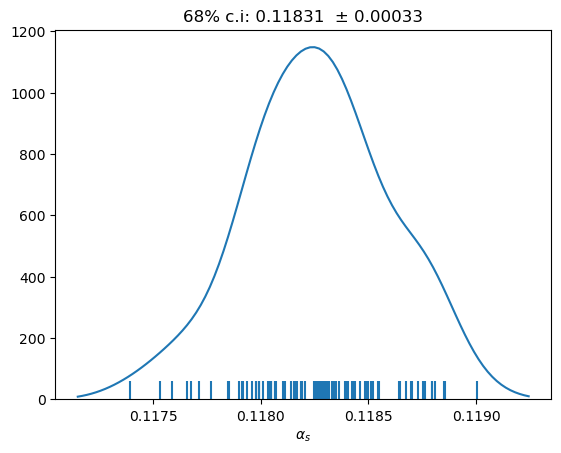

count    79.000000
mean      0.118245
std       0.000370
min       0.117023
16%       0.117874
50%       0.118267
84%       0.118637
max       0.118957
dtype: float64

cv±std = 0.11824 ± 0.00037 
1std interval:  0.11788 to 0.11861 
68% c.i:        0.11787 to 0.11864 


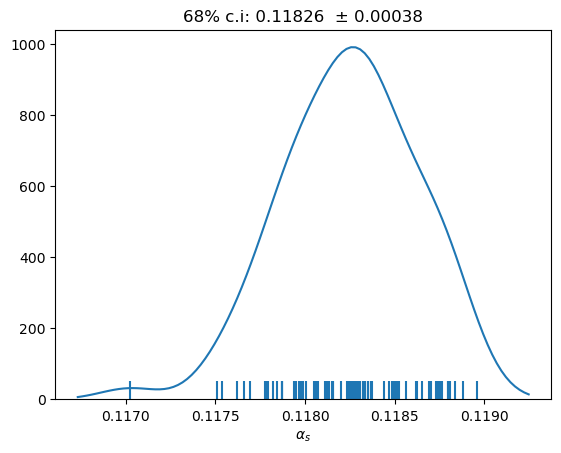

count    60.000000
mean      0.118004
std       0.000371
min       0.117016
16%       0.117657
50%       0.118068
84%       0.118346
max       0.118781
dtype: float64

cv±std = 0.11800 ± 0.00037 
1std interval:  0.11763 to 0.11837 
68% c.i:        0.11766 to 0.11835 


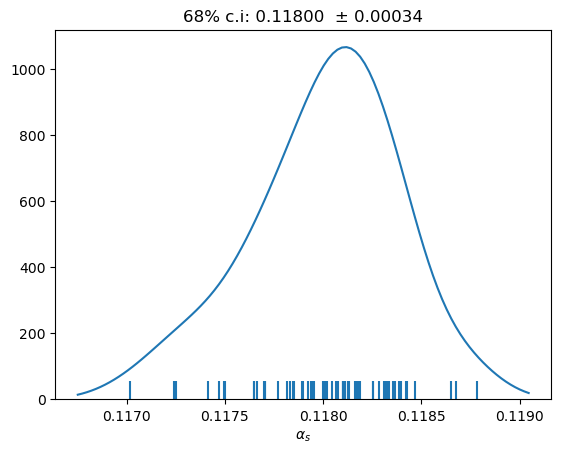

count    66.000000
mean      0.118002
std       0.000378
min       0.116906
16%       0.117667
50%       0.117995
84%       0.118390
max       0.118818
dtype: float64

cv±std = 0.11800 ± 0.00038 
1std interval:  0.11762 to 0.11838 
68% c.i:        0.11767 to 0.11839 


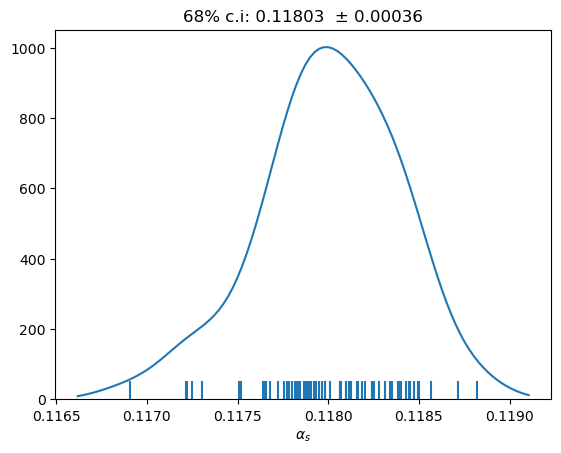

count    82.000000
mean      0.118003
std       0.000351
min       0.117249
16%       0.117631
50%       0.118055
84%       0.118268
max       0.118848
dtype: float64

cv±std = 0.11800 ± 0.00035 
1std interval:  0.11765 to 0.11835 
68% c.i:        0.11763 to 0.11827 


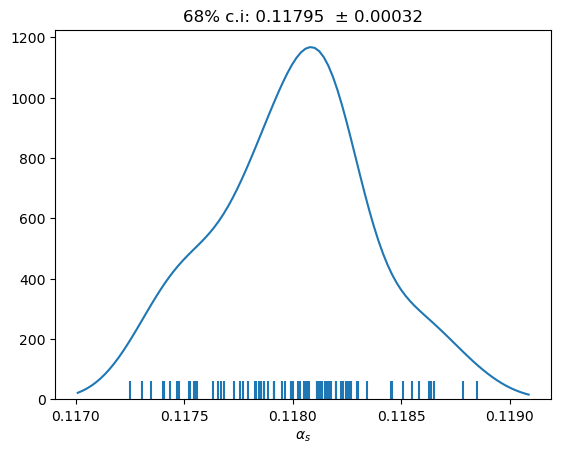

count    68.000000
mean      0.118179
std       0.000341
min       0.117598
16%       0.117796
50%       0.118133
84%       0.118566
max       0.118942
dtype: float64

cv±std = 0.11818 ± 0.00034 
1std interval:  0.11784 to 0.11852 
68% c.i:        0.11780 to 0.11857 


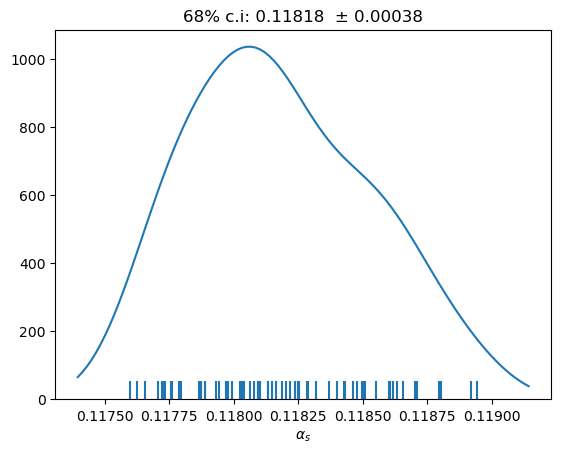

count    79.000000
mean      0.118114
std       0.000355
min       0.117316
16%       0.117773
50%       0.118097
84%       0.118486
max       0.118928
dtype: float64

cv±std = 0.11811 ± 0.00035 
1std interval:  0.11776 to 0.11847 
68% c.i:        0.11777 to 0.11849 


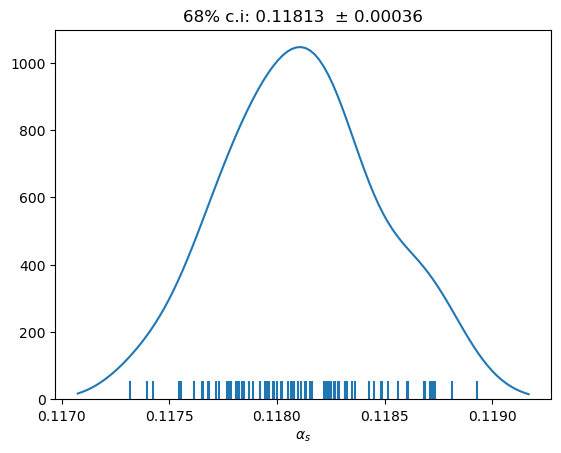

count    81.000000
mean      0.118099
std       0.000335
min       0.117444
16%       0.117715
50%       0.118126
84%       0.118453
max       0.118827
dtype: float64

cv±std = 0.11810 ± 0.00034 
1std interval:  0.11776 to 0.11843 
68% c.i:        0.11771 to 0.11845 


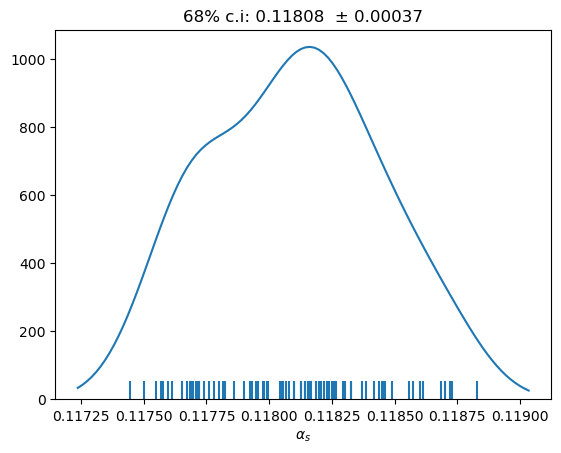

count    61.000000
mean      0.118590
std       0.000337
min       0.117906
16%       0.118224
50%       0.118623
84%       0.118856
max       0.119486
dtype: float64

cv±std = 0.11859 ± 0.00034 
1std interval:  0.11825 to 0.11893 
68% c.i:        0.11822 to 0.11886 


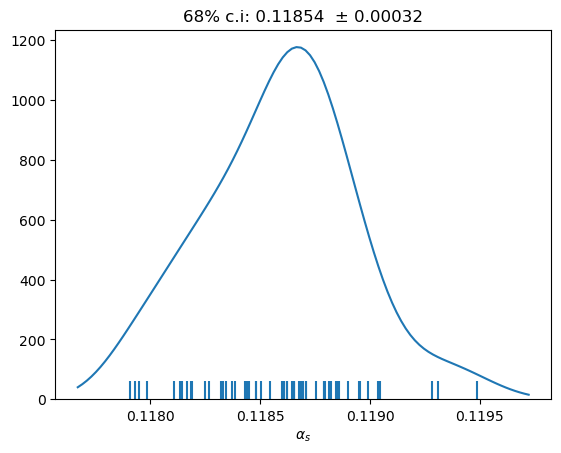

count    87.000000
mean      0.118558
std       0.000346
min       0.117511
16%       0.118229
50%       0.118601
84%       0.118894
max       0.119254
dtype: float64

cv±std = 0.11856 ± 0.00035 
1std interval:  0.11821 to 0.11890 
68% c.i:        0.11823 to 0.11889 


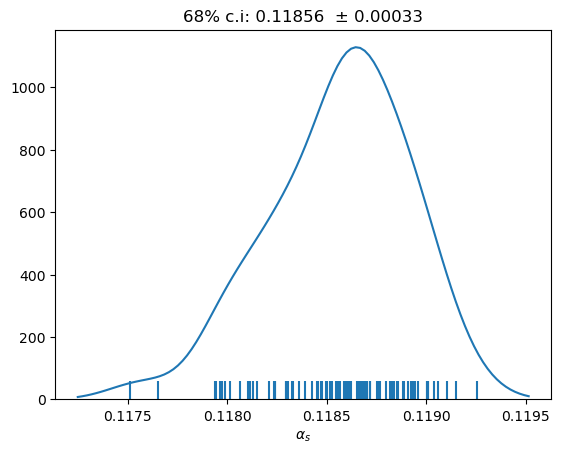

count    81.000000
mean      0.118540
std       0.000312
min       0.117734
16%       0.118202
50%       0.118612
84%       0.118854
max       0.119122
dtype: float64

cv±std = 0.11854 ± 0.00031 
1std interval:  0.11823 to 0.11885 
68% c.i:        0.11820 to 0.11885 


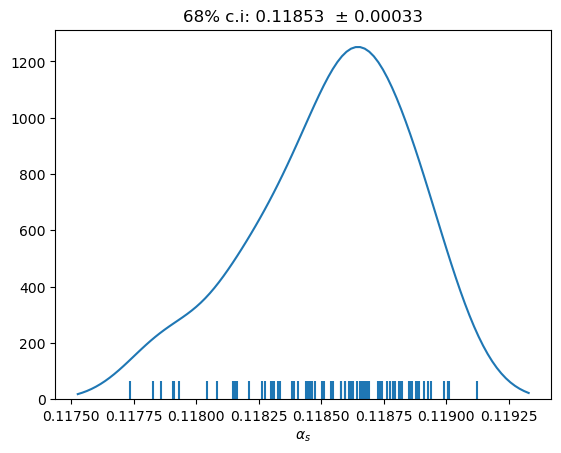

count    58.000000
mean      0.118345
std       0.000356
min       0.117548
16%       0.117959
50%       0.118377
84%       0.118688
max       0.119122
dtype: float64

cv±std = 0.11835 ± 0.00036 
1std interval:  0.11799 to 0.11870 
68% c.i:        0.11796 to 0.11869 


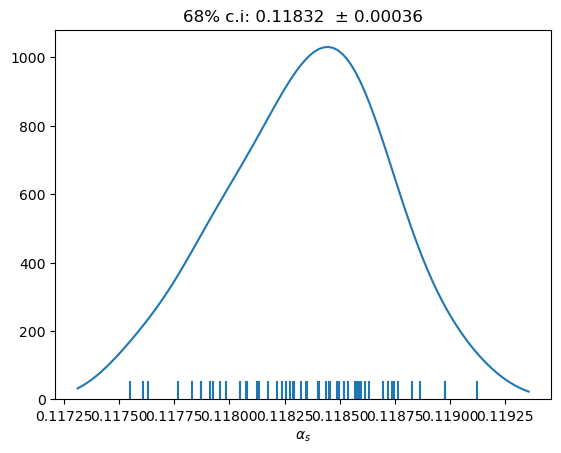

count    79.000000
mean      0.118324
std       0.000423
min       0.117359
16%       0.117908
50%       0.118321
84%       0.118778
max       0.119297
dtype: float64

cv±std = 0.11832 ± 0.00042 
1std interval:  0.11790 to 0.11875 
68% c.i:        0.11791 to 0.11878 


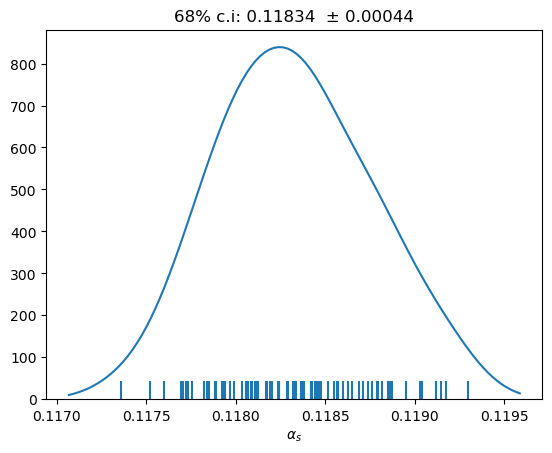

count    81.000000
mean      0.118345
std       0.000382
min       0.117413
16%       0.118021
50%       0.118337
84%       0.118706
max       0.119312
dtype: float64

cv±std = 0.11834 ± 0.00038 
1std interval:  0.11796 to 0.11873 
68% c.i:        0.11802 to 0.11871 


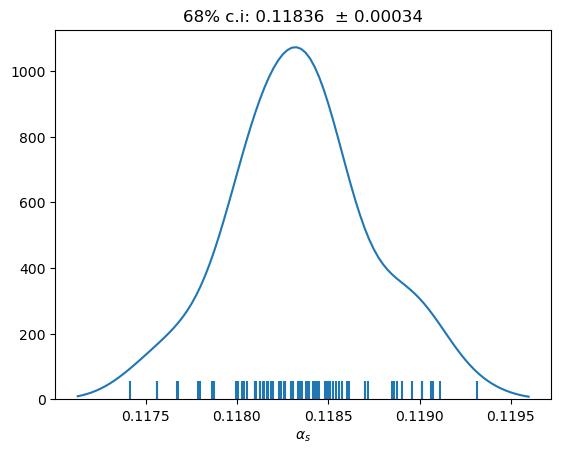

count    67.000000
mean      0.118524
std       0.000349
min       0.117720
16%       0.118239
50%       0.118530
84%       0.118822
max       0.119429
dtype: float64

cv±std = 0.11852 ± 0.00035 
1std interval:  0.11818 to 0.11887 
68% c.i:        0.11824 to 0.11882 


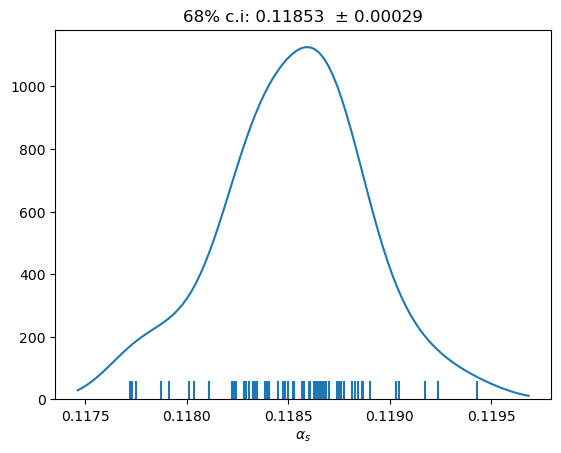

count    81.000000
mean      0.118510
std       0.000347
min       0.117735
16%       0.118086
50%       0.118549
84%       0.118820
max       0.119269
dtype: float64

cv±std = 0.11851 ± 0.00035 
1std interval:  0.11816 to 0.11886 
68% c.i:        0.11809 to 0.11882 


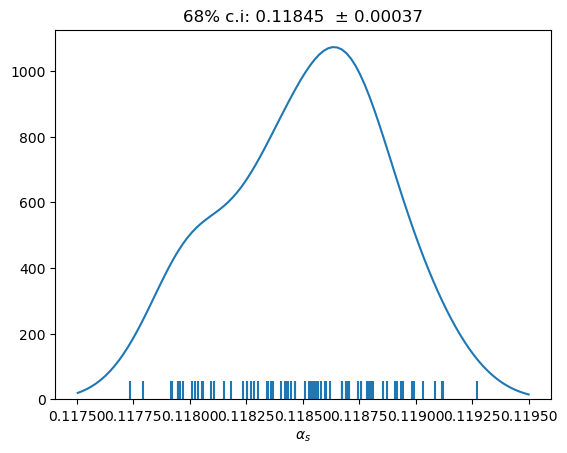

count    83.000000
mean      0.118511
std       0.000315
min       0.117713
16%       0.118194
50%       0.118501
84%       0.118816
max       0.119467
dtype: float64

cv±std = 0.11851 ± 0.00032 
1std interval:  0.11820 to 0.11883 
68% c.i:        0.11819 to 0.11882 


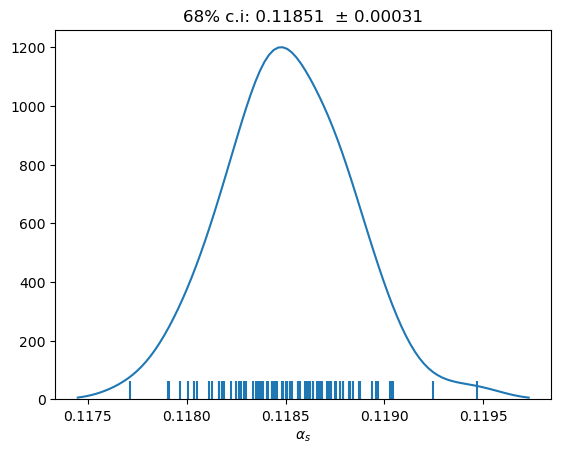

count    61.000000
mean      0.118314
std       0.000384
min       0.117157
16%       0.117983
50%       0.118335
84%       0.118717
max       0.119191
dtype: float64

cv±std = 0.11831 ± 0.00038 
1std interval:  0.11793 to 0.11870 
68% c.i:        0.11798 to 0.11872 


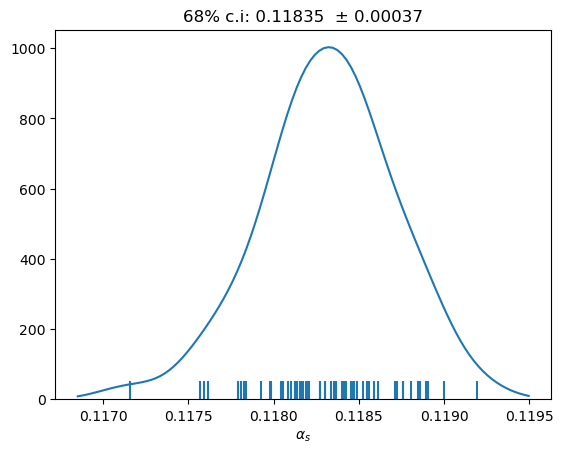

count    80.000000
mean      0.118256
std       0.000358
min       0.117488
16%       0.117950
50%       0.118234
84%       0.118653
max       0.119000
dtype: float64

cv±std = 0.11826 ± 0.00036 
1std interval:  0.11790 to 0.11861 
68% c.i:        0.11795 to 0.11865 


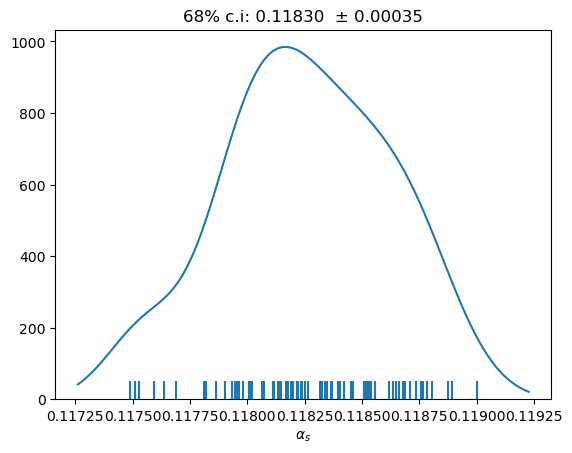

count    78.000000
mean      0.118306
std       0.000327
min       0.117433
16%       0.118048
50%       0.118268
84%       0.118637
max       0.119088
dtype: float64

cv±std = 0.11831 ± 0.00033 
1std interval:  0.11798 to 0.11863 
68% c.i:        0.11805 to 0.11864 


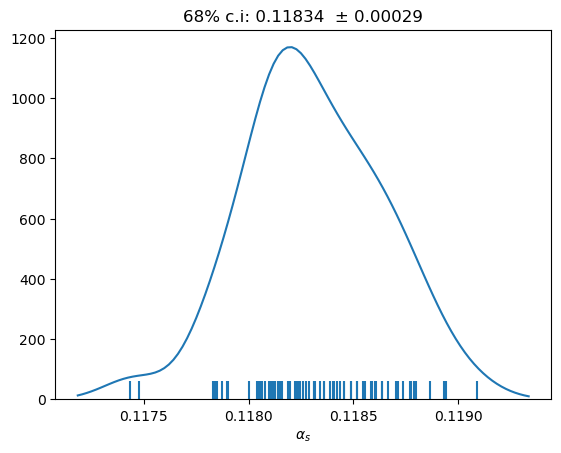

count    60.000000
mean      0.118188
std       0.000340
min       0.117407
16%       0.117852
50%       0.118221
84%       0.118518
max       0.118961
dtype: float64

cv±std = 0.11819 ± 0.00034 
1std interval:  0.11785 to 0.11853 
68% c.i:        0.11785 to 0.11852 


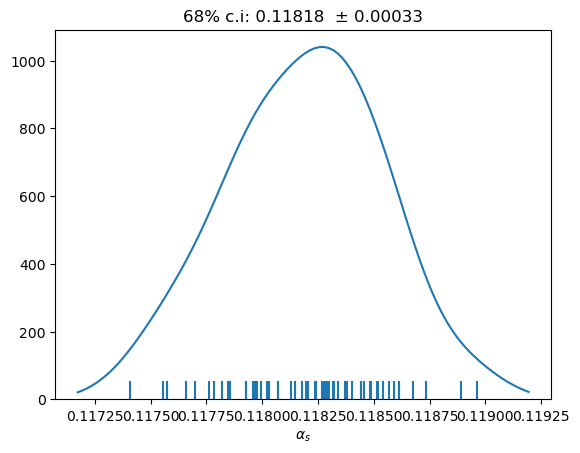

count    81.000000
mean      0.118111
std       0.000360
min       0.117153
16%       0.117724
50%       0.118099
84%       0.118441
max       0.118863
dtype: float64

cv±std = 0.11811 ± 0.00036 
1std interval:  0.11775 to 0.11847 
68% c.i:        0.11772 to 0.11844 


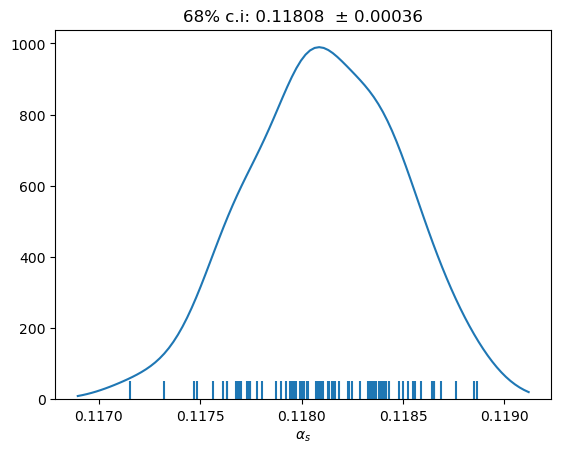

count    79.000000
mean      0.118144
std       0.000328
min       0.117345
16%       0.117841
50%       0.118142
84%       0.118453
max       0.118858
dtype: float64

cv±std = 0.11814 ± 0.00033 
1std interval:  0.11782 to 0.11847 
68% c.i:        0.11784 to 0.11845 


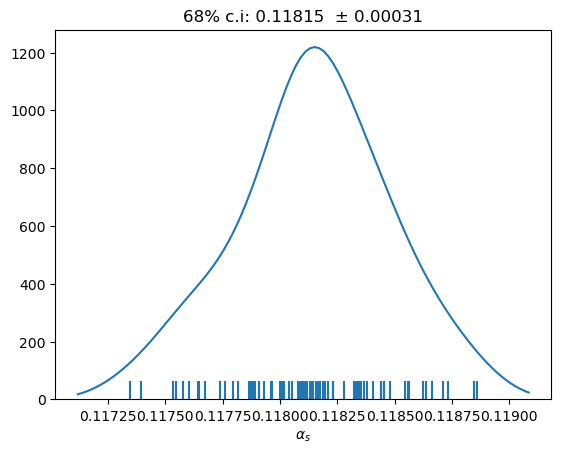

count    58.000000
mean      0.117979
std       0.000310
min       0.117227
16%       0.117674
50%       0.117979
84%       0.118227
max       0.118764
dtype: float64

cv±std = 0.11798 ± 0.00031 
1std interval:  0.11767 to 0.11829 
68% c.i:        0.11767 to 0.11823 


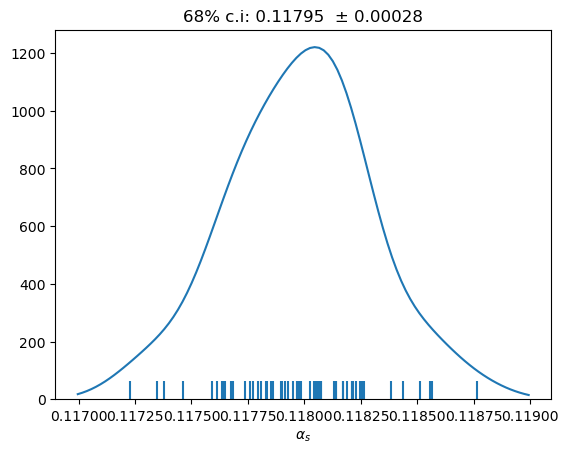

count    66.000000
mean      0.117848
std       0.000369
min       0.116972
16%       0.117470
50%       0.117827
84%       0.118214
max       0.118605
dtype: float64

cv±std = 0.11785 ± 0.00037 
1std interval:  0.11748 to 0.11822 
68% c.i:        0.11747 to 0.11821 


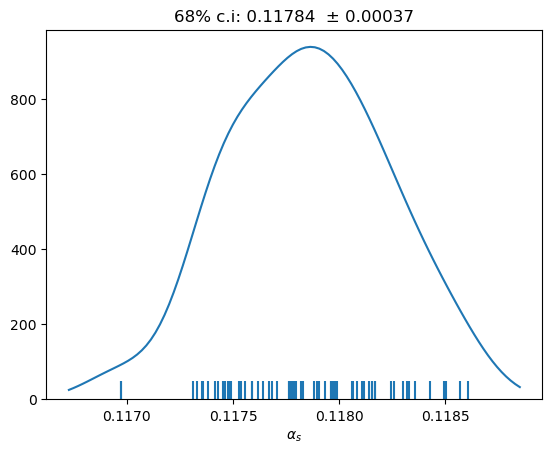

count    79.000000
mean      0.117864
std       0.000337
min       0.117145
16%       0.117487
50%       0.117849
84%       0.118250
max       0.118564
dtype: float64

cv±std = 0.11786 ± 0.00034 
1std interval:  0.11753 to 0.11820 
68% c.i:        0.11749 to 0.11825 


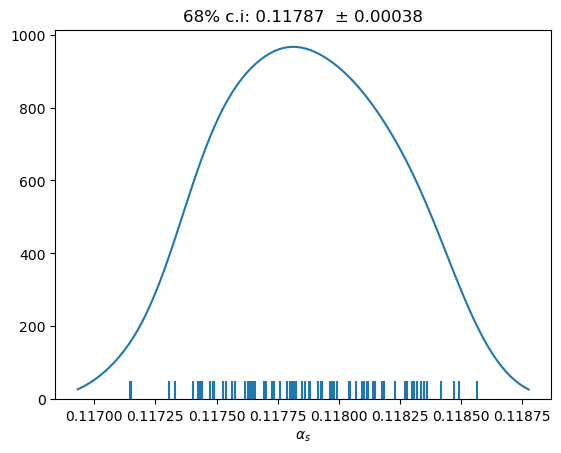

count    203.000000
mean       0.118385
std        0.000345
min        0.117319
16%        0.118035
50%        0.118404
84%        0.118745
max        0.119225
dtype: float64

cv±std = 0.11838 ± 0.00035 
1std interval:  0.11804 to 0.11873 
68% c.i:        0.11804 to 0.11874 


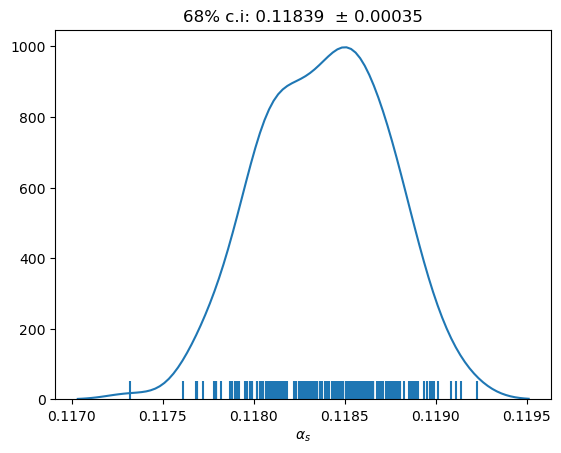

count    229.000000
mean       0.118573
std        0.000371
min        0.117454
16%        0.118227
50%        0.118573
84%        0.118947
max        0.119563
dtype: float64

cv±std = 0.11857 ± 0.00037 
1std interval:  0.11820 to 0.11894 
68% c.i:        0.11823 to 0.11895 


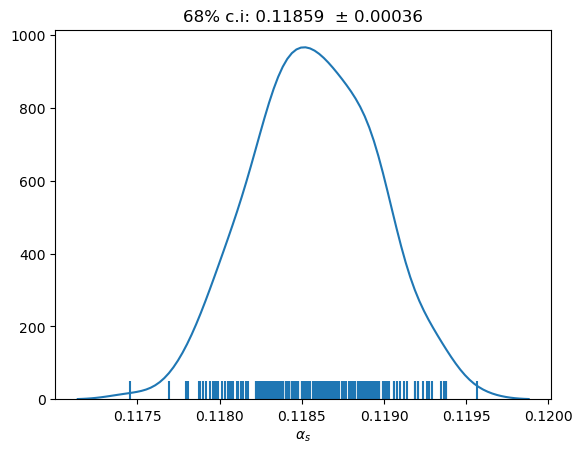

count    236.000000
mean       0.118249
std        0.000338
min        0.117392
16%        0.117898
50%        0.118246
84%        0.118579
max        0.119202
dtype: float64

cv±std = 0.11825 ± 0.00034 
1std interval:  0.11791 to 0.11859 
68% c.i:        0.11790 to 0.11858 


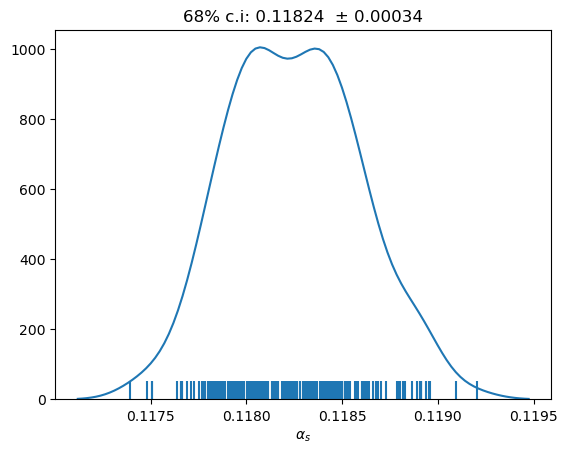

count    223.000000
mean       0.118543
std        0.000375
min        0.117620
16%        0.118151
50%        0.118559
84%        0.118941
max        0.119524
dtype: float64

cv±std = 0.11854 ± 0.00038 
1std interval:  0.11817 to 0.11892 
68% c.i:        0.11815 to 0.11894 


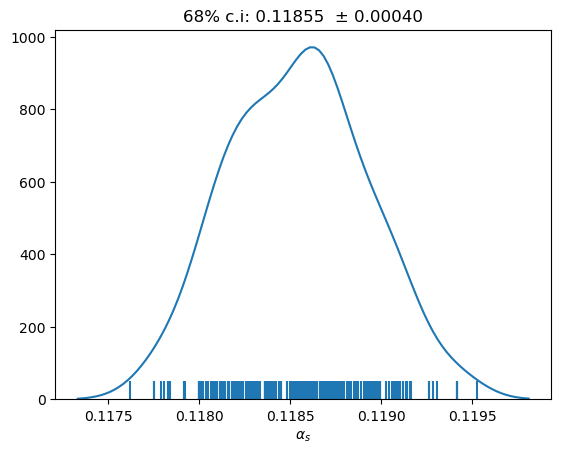

count    216.000000
mean       0.118245
std        0.000310
min        0.117559
16%        0.117960
50%        0.118231
84%        0.118515
max        0.119248
dtype: float64

cv±std = 0.11825 ± 0.00031 
1std interval:  0.11794 to 0.11856 
68% c.i:        0.11796 to 0.11851 


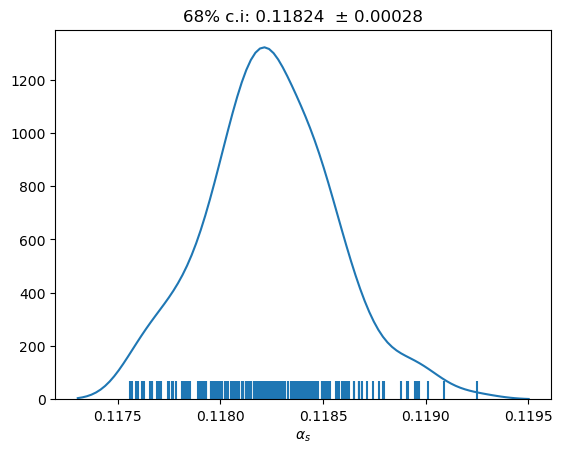

count    229.000000
mean       0.117837
std        0.000366
min        0.116880
16%        0.117471
50%        0.117838
84%        0.118196
max        0.118646
dtype: float64

cv±std = 0.11784 ± 0.00037 
1std interval:  0.11747 to 0.11820 
68% c.i:        0.11747 to 0.11820 


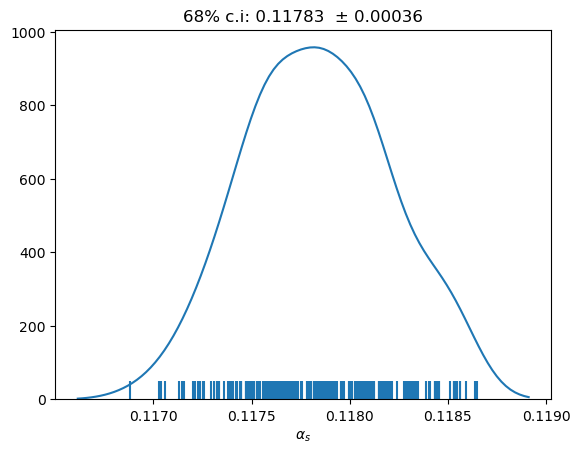

count    223.000000
mean       0.118105
std        0.000351
min        0.117087
16%        0.117787
50%        0.118121
84%        0.118417
max        0.119092
dtype: float64

cv±std = 0.11810 ± 0.00035 
1std interval:  0.11775 to 0.11846 
68% c.i:        0.11779 to 0.11842 


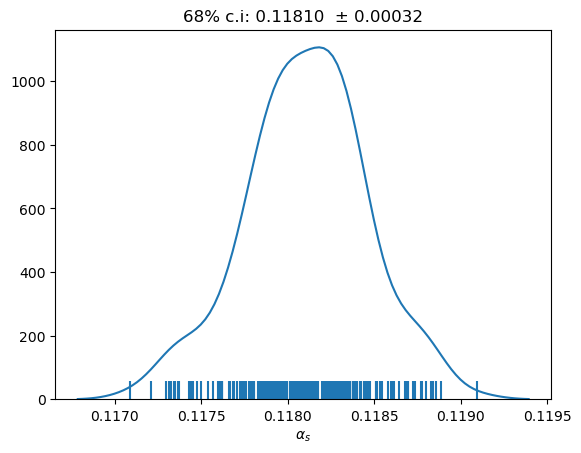

count    219.000000
mean       0.118111
std        0.000349
min        0.117246
16%        0.117757
50%        0.118126
84%        0.118444
max        0.119005
dtype: float64

cv±std = 0.11811 ± 0.00035 
1std interval:  0.11776 to 0.11846 
68% c.i:        0.11776 to 0.11844 


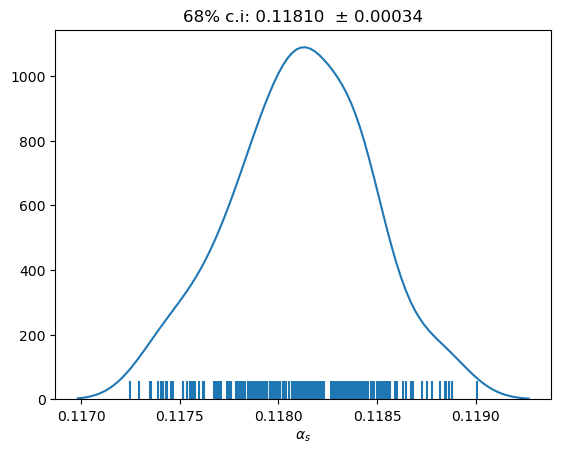

count    226.000000
mean       0.117460
std        0.000341
min        0.116569
16%        0.117101
50%        0.117455
84%        0.117793
max        0.118373
dtype: float64

cv±std = 0.11746 ± 0.00034 
1std interval:  0.11712 to 0.11780 
68% c.i:        0.11710 to 0.11779 


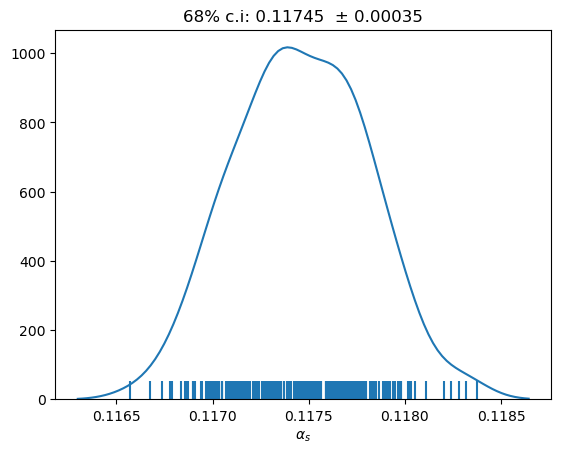

count    223.000000
mean       0.118064
std        0.000327
min        0.117113
16%        0.117746
50%        0.118071
84%        0.118381
max        0.118958
dtype: float64

cv±std = 0.11806 ± 0.00033 
1std interval:  0.11774 to 0.11839 
68% c.i:        0.11775 to 0.11838 


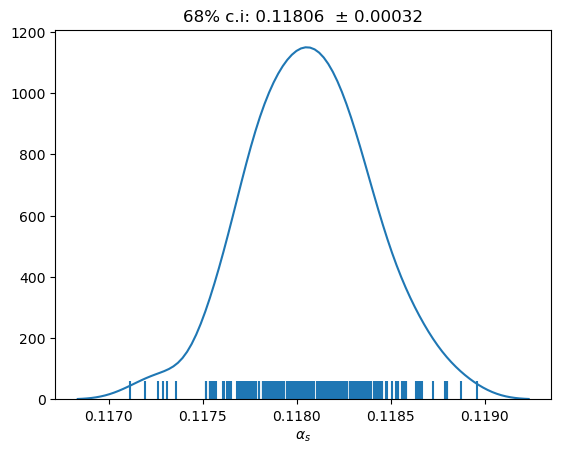

count    212.000000
mean       0.117937
std        0.000334
min        0.117083
16%        0.117566
50%        0.117938
84%        0.118313
max        0.118768
dtype: float64

cv±std = 0.11794 ± 0.00033 
1std interval:  0.11760 to 0.11827 
68% c.i:        0.11757 to 0.11831 


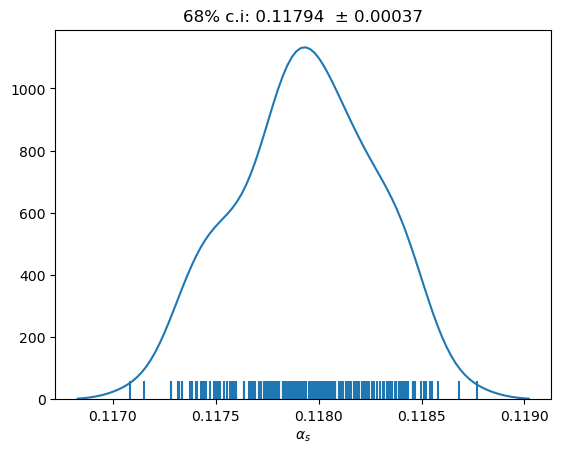

count    219.000000
mean       0.118077
std        0.000332
min        0.117303
16%        0.117723
50%        0.118096
84%        0.118406
max        0.119019
dtype: float64

cv±std = 0.11808 ± 0.00033 
1std interval:  0.11774 to 0.11841 
68% c.i:        0.11772 to 0.11841 


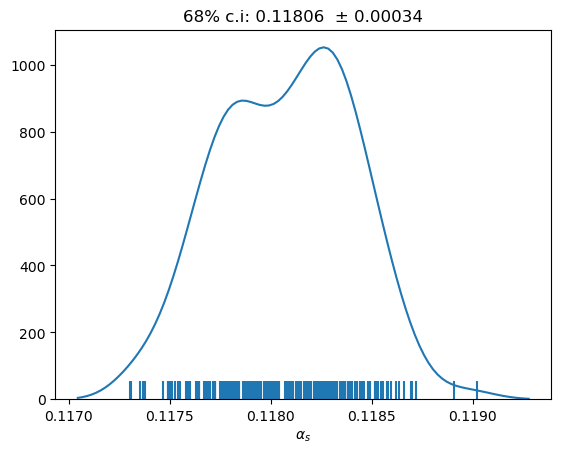

count    224.000000
mean       0.118199
std        0.000333
min        0.117420
16%        0.117857
50%        0.118181
84%        0.118549
max        0.119143
dtype: float64

cv±std = 0.11820 ± 0.00033 
1std interval:  0.11787 to 0.11853 
68% c.i:        0.11786 to 0.11855 


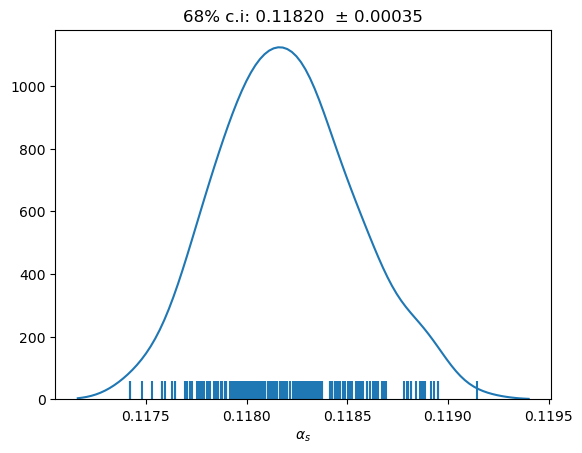

count    236.000000
mean       0.117942
std        0.000297
min        0.116992
16%        0.117668
50%        0.117951
84%        0.118240
max        0.118835
dtype: float64

cv±std = 0.11794 ± 0.00030 
1std interval:  0.11764 to 0.11824 
68% c.i:        0.11767 to 0.11824 


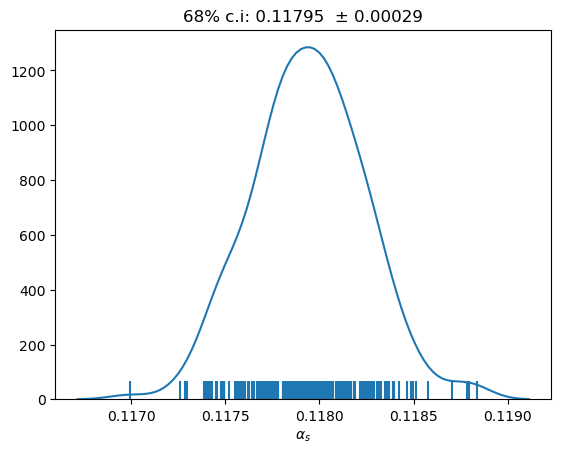

count    223.000000
mean       0.118418
std        0.000353
min        0.117230
16%        0.118080
50%        0.118411
84%        0.118745
max        0.119284
dtype: float64

cv±std = 0.11842 ± 0.00035 
1std interval:  0.11807 to 0.11877 
68% c.i:        0.11808 to 0.11874 


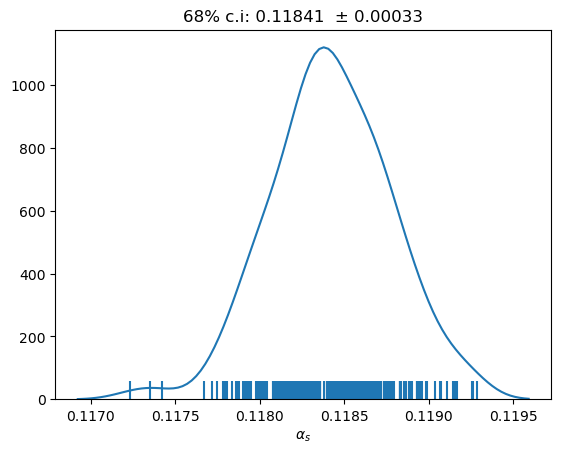

count    214.000000
mean       0.118287
std        0.000350
min        0.117400
16%        0.117944
50%        0.118276
84%        0.118602
max        0.119183
dtype: float64

cv±std = 0.11829 ± 0.00035 
1std interval:  0.11794 to 0.11864 
68% c.i:        0.11794 to 0.11860 


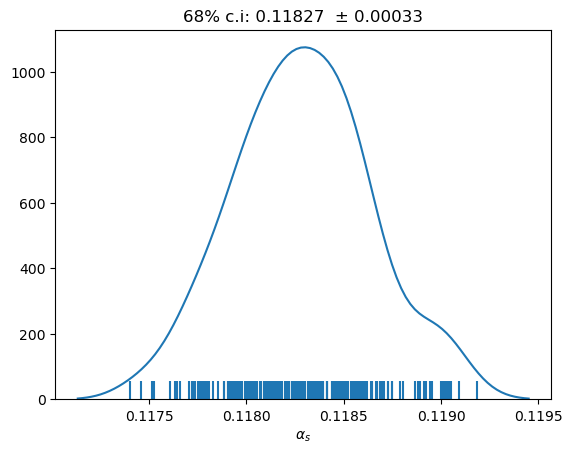

count    226.000000
mean       0.118264
std        0.000353
min        0.117023
16%        0.117940
50%        0.118269
84%        0.118641
max        0.119002
dtype: float64

cv±std = 0.11826 ± 0.00035 
1std interval:  0.11791 to 0.11862 
68% c.i:        0.11794 to 0.11864 


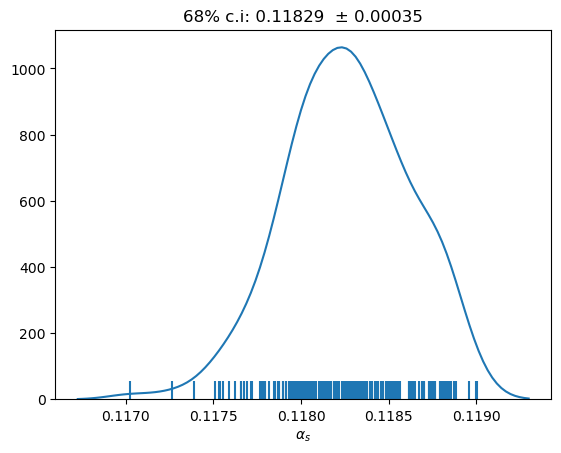

count    208.000000
mean       0.118003
std        0.000364
min        0.116906
16%        0.117651
50%        0.118055
84%        0.118341
max        0.118848
dtype: float64

cv±std = 0.11800 ± 0.00036 
1std interval:  0.11764 to 0.11837 
68% c.i:        0.11765 to 0.11834 


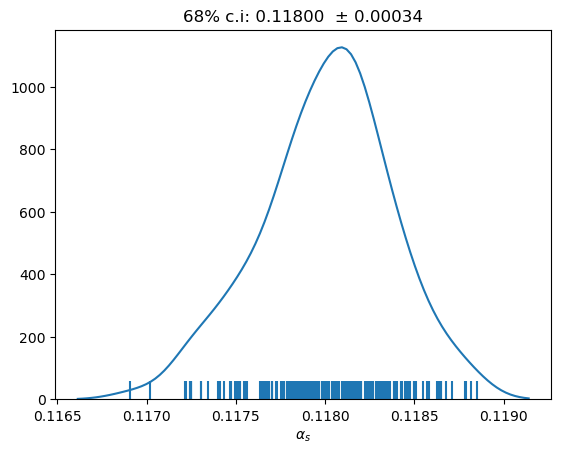

count    228.000000
mean       0.118128
std        0.000344
min        0.117316
16%        0.117760
50%        0.118118
84%        0.118490
max        0.118942
dtype: float64

cv±std = 0.11813 ± 0.00034 
1std interval:  0.11778 to 0.11847 
68% c.i:        0.11776 to 0.11849 


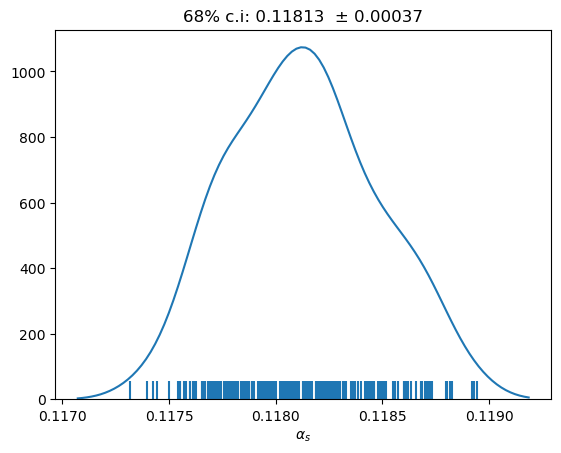

count    229.000000
mean       0.118560
std        0.000331
min        0.117511
16%        0.118211
50%        0.118609
84%        0.118863
max        0.119486
dtype: float64

cv±std = 0.11856 ± 0.00033 
1std interval:  0.11823 to 0.11889 
68% c.i:        0.11821 to 0.11886 


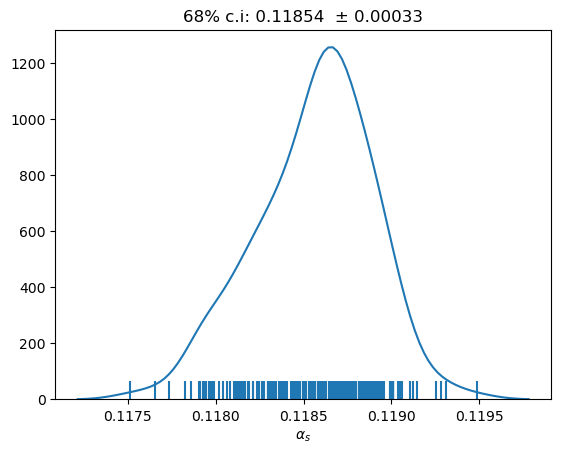

count    218.000000
mean       0.118338
std        0.000389
min        0.117359
16%        0.117951
50%        0.118338
84%        0.118739
max        0.119312
dtype: float64

cv±std = 0.11834 ± 0.00039 
1std interval:  0.11795 to 0.11873 
68% c.i:        0.11795 to 0.11874 


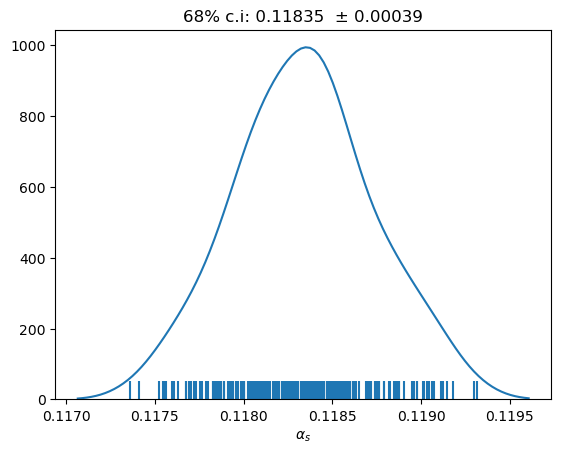

count    231.000000
mean       0.118515
std        0.000335
min        0.117713
16%        0.118179
50%        0.118529
84%        0.118821
max        0.119467
dtype: float64

cv±std = 0.11851 ± 0.00034 
1std interval:  0.11818 to 0.11885 
68% c.i:        0.11818 to 0.11882 


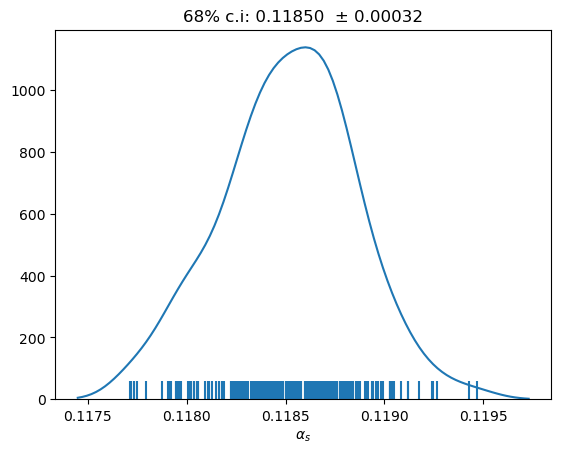

count    219.000000
mean       0.118290
std        0.000354
min        0.117157
16%        0.117965
50%        0.118271
84%        0.118663
max        0.119191
dtype: float64

cv±std = 0.11829 ± 0.00035 
1std interval:  0.11794 to 0.11864 
68% c.i:        0.11796 to 0.11866 


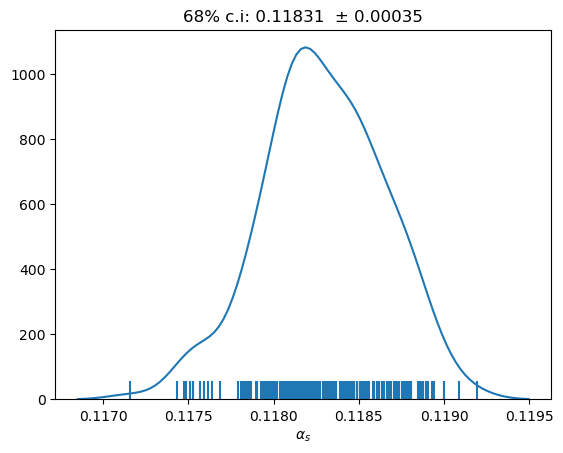

count    220.000000
mean       0.118144
std        0.000343
min        0.117153
16%        0.117780
50%        0.118148
84%        0.118482
max        0.118961
dtype: float64

cv±std = 0.11814 ± 0.00034 
1std interval:  0.11780 to 0.11849 
68% c.i:        0.11778 to 0.11848 


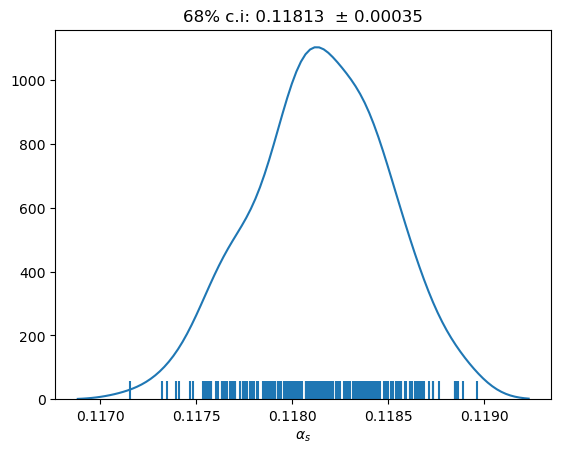

count    203.000000
mean       0.117891
std        0.000343
min        0.116972
16%        0.117528
50%        0.117901
84%        0.118238
max        0.118764
dtype: float64

cv±std = 0.11789 ± 0.00034 
1std interval:  0.11755 to 0.11823 
68% c.i:        0.11753 to 0.11824 


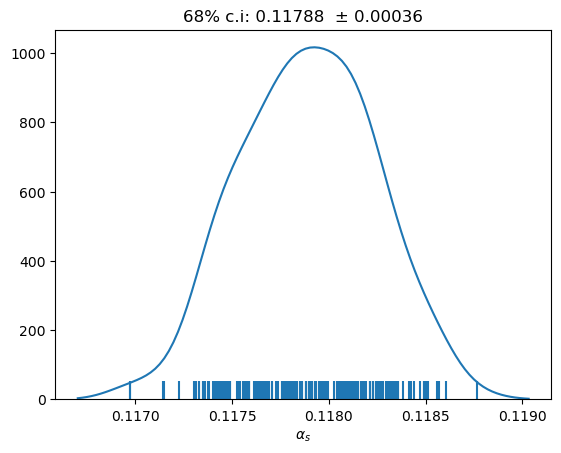

In [5]:
# Fitting parabolas
mins_crm = [fit_parabola(data) for data in data_crm_min]
mean_crm = [fit_parabola(data) for data in data_crm_mean]
mean_after_crm = [[fit_parabola(batch) for batch in data] for data in data_crm_all_batches]
# Describe results for each seed and collect alpha_s values and unc
def propagate_batches(batches_means):
    norm = 0
    up = 0
    #MEAN
    for entry in batches_means:
        norm += 1./entry[1]
        up += entry[0]*(1./entry[1])
    mean = up/norm
    #STD
    new_std_tmp = 1
    norm = 0
    for entry in batches_means[0:2]:
        new_std_tmp*=entry[1]
        norm+= entry[1]
    new_std_tmp = new_std_tmp/norm
    std = (new_std_tmp * batches_means[-1][1]) / (new_std_tmp + batches_means[-1][1])
    return (mean, std) 
def describe_and_collect(mins, singlebatch=False, all_batches=False, full_sample=False, alternative=True):
    results = []
    if all_batches:
        if singlebatch:
            for minn in mins:
                myres = describe_results(pd.Series(minn[0]))
                results.append((myres[0], myres[1]))
        elif full_sample:
            for minn in mins:
                batches_means = []
                for means in minn: # Loop over the three batches
                    batches_means.append(means) #In this case I join the three batches in a single sample
                flat_batches_means = [x for xs in batches_means for x in xs] #flatten list
                myres = describe_results(pd.Series(flat_batches_means))
                results.append((myres[0], myres[1]))
        else:
            if alternative:
                for minn in mins:
                    batches_means = []
                    for means in minn: # Loop over the three batches
                        batches_means.append((means.mean(), means.std()))
                        _ = describe_results(pd.Series(means))
                    myres = propagate_batches(batches_means) 
                    results.append((myres[0], myres[1]))
            else:
                for minn in mins:
                    batches_means = []
                    for means in minn: # Loop over the three batches
                        batches_means.append(means.mean())
                    myres = describe_results(pd.Series(batches_means))
                    results.append((myres[0], myres[1]))
    else:
        for minn in mins:
            myres = describe_results(minn)
            results.append((myres[0], myres[1]))
    return results

alphas_crm_min = describe_and_collect(mins_crm)
alphas_crm_singlebatch = describe_and_collect(mean_after_crm, singlebatch=True, all_batches=True)
alphas_crm_mean = describe_and_collect(mean_crm)
alphas_crm_mean_after = describe_and_collect(mean_after_crm, all_batches=True, alternative=False)
alphas_crm_mean_after_alternative = describe_and_collect(mean_after_crm, all_batches=True)
alphas_crm_mean_after_joined = describe_and_collect(mean_after_crm, all_batches=True, full_sample=True)

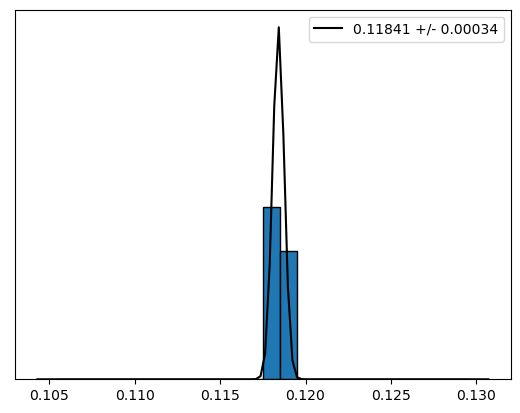

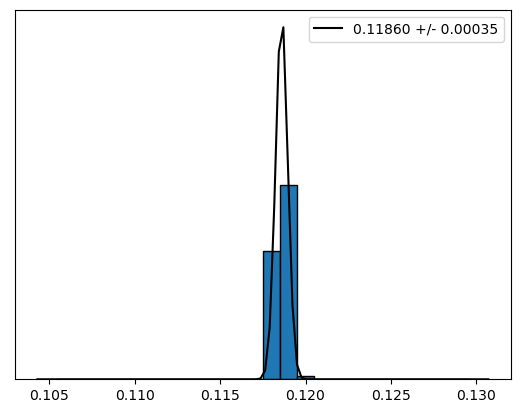

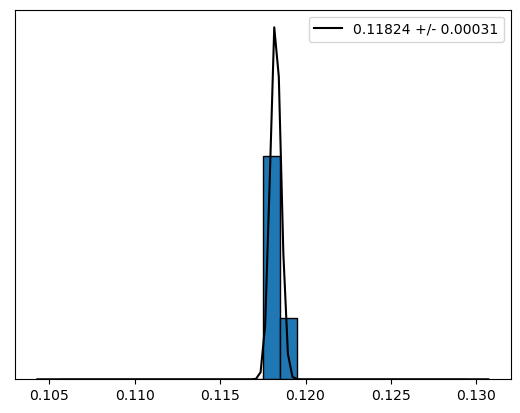

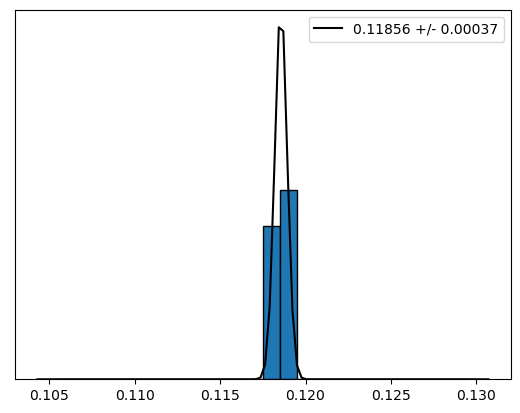

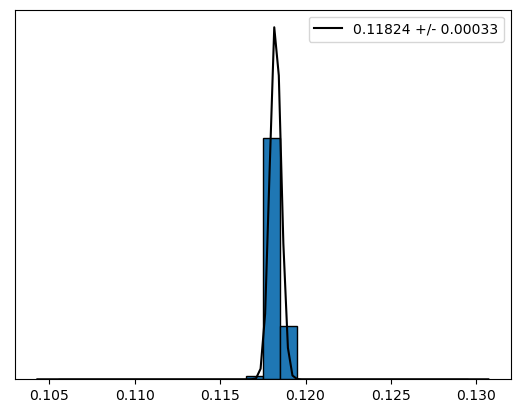

...

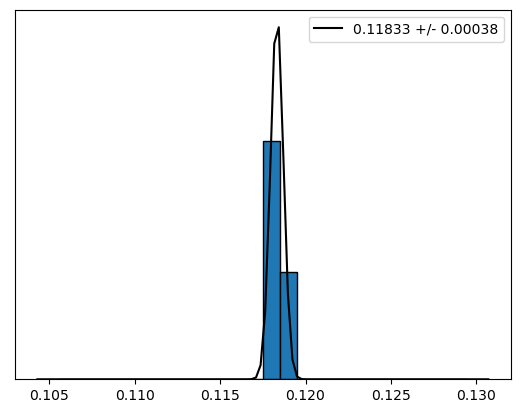

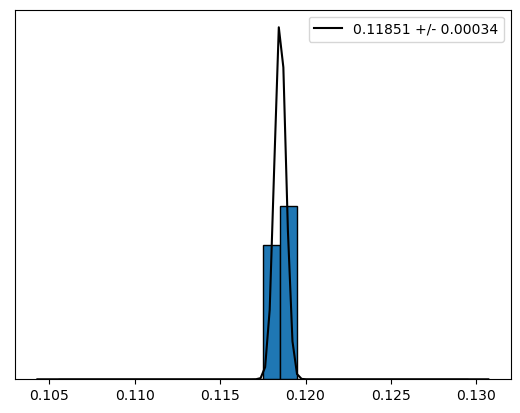

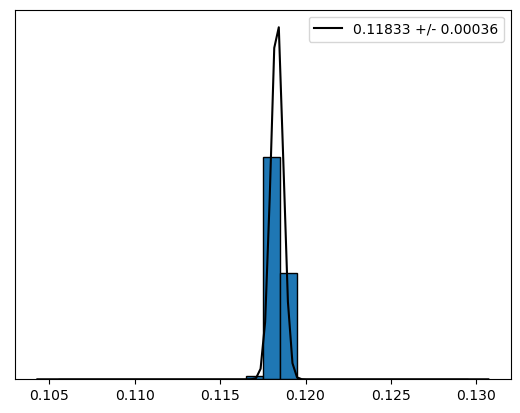

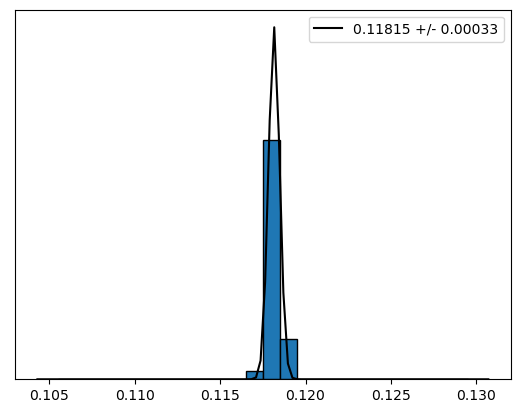

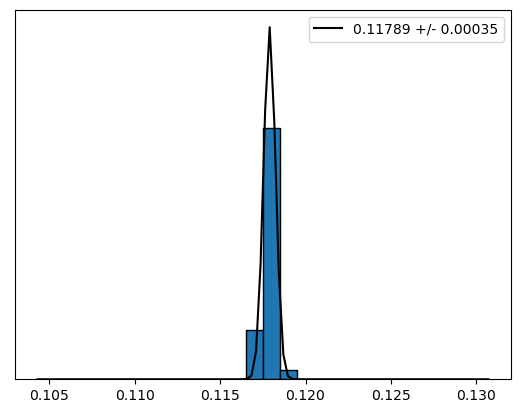

In [6]:
for mins, data in zip(mins_crm, data_crm_min):
    hist_results(mins, data)

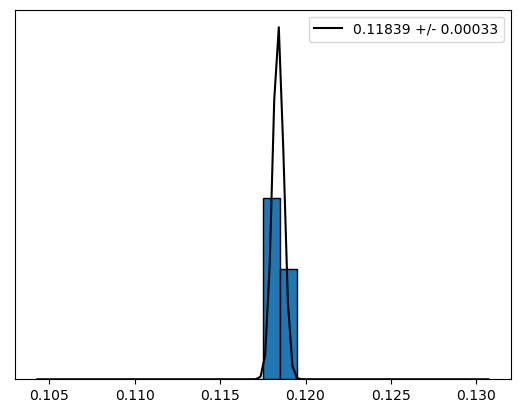

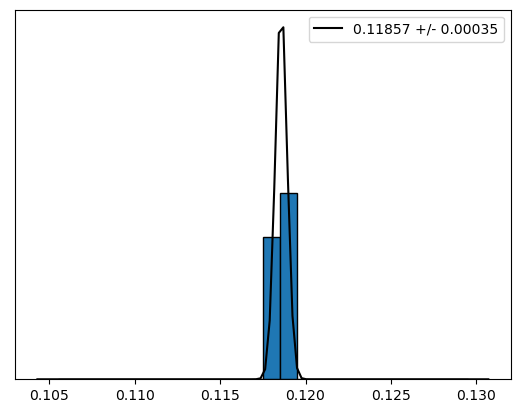

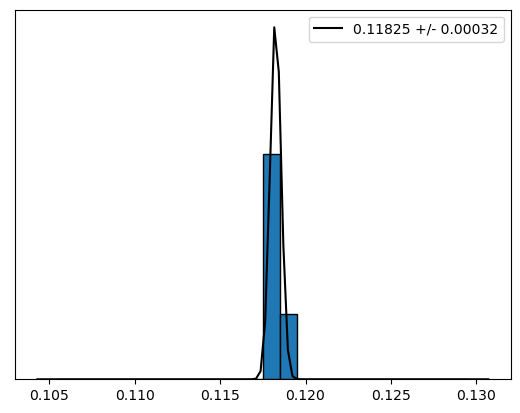

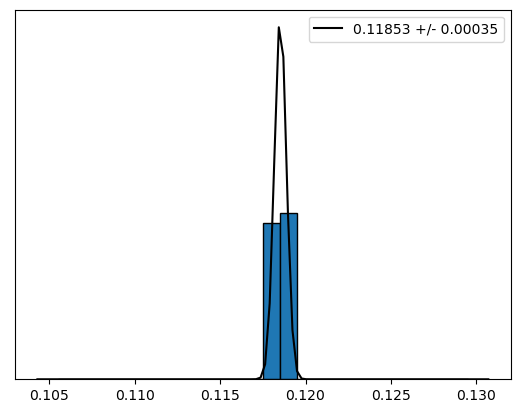

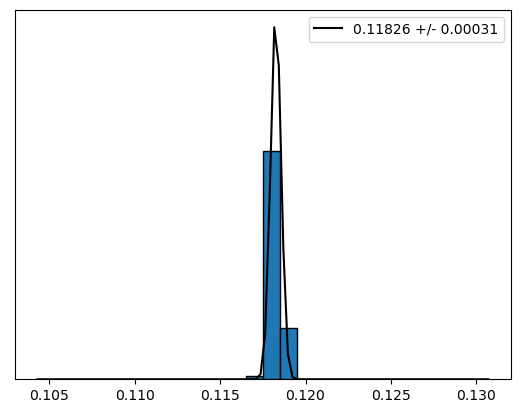

...

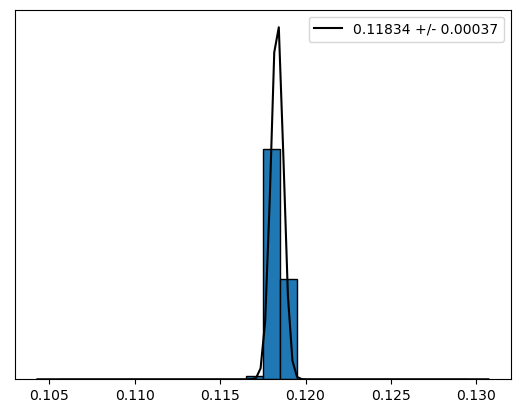

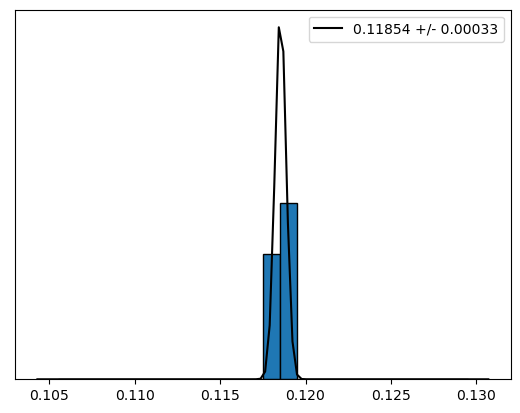

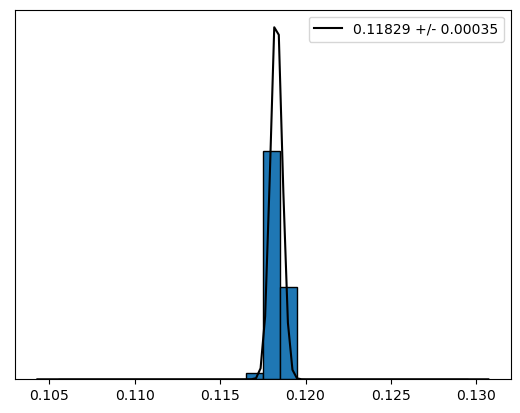

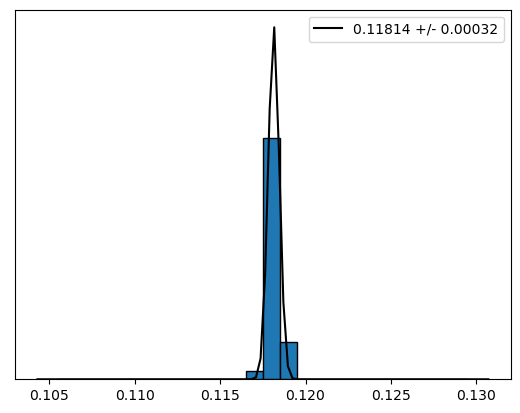

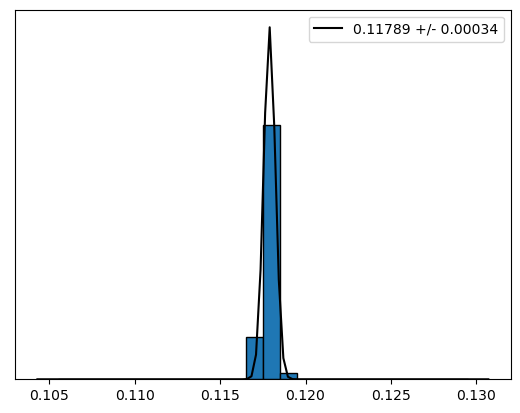

In [7]:
for means, data in zip(mean_crm, data_crm_mean):
    hist_results(means, data)

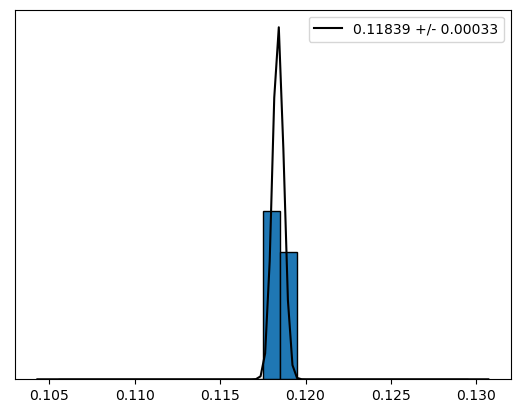

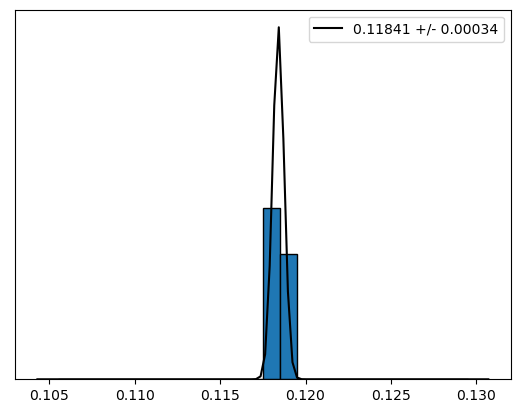

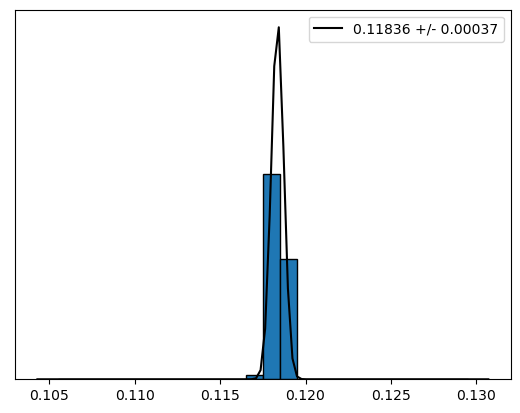

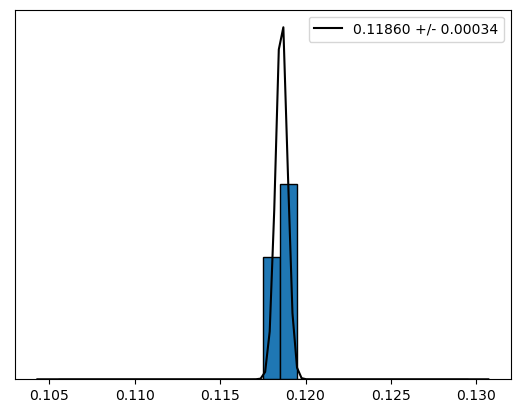

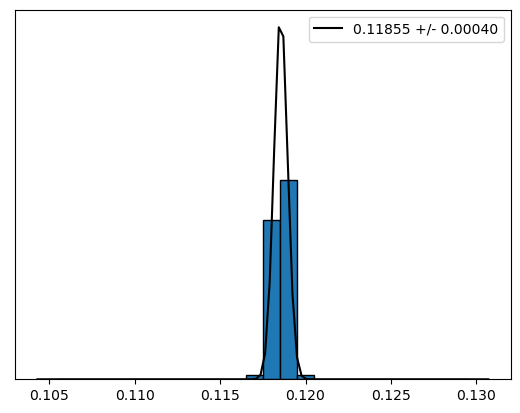

...

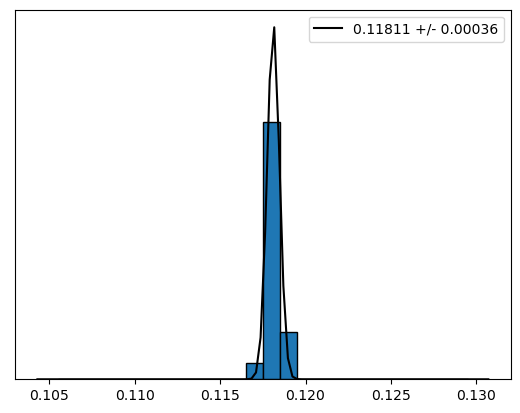

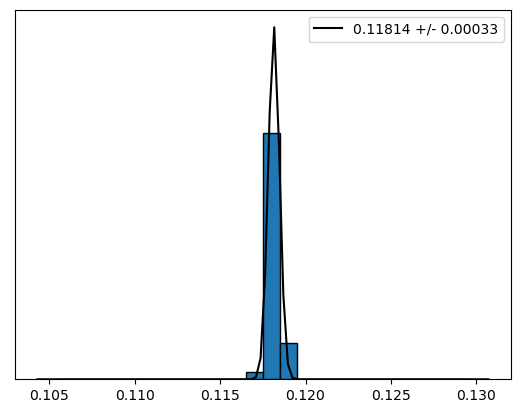

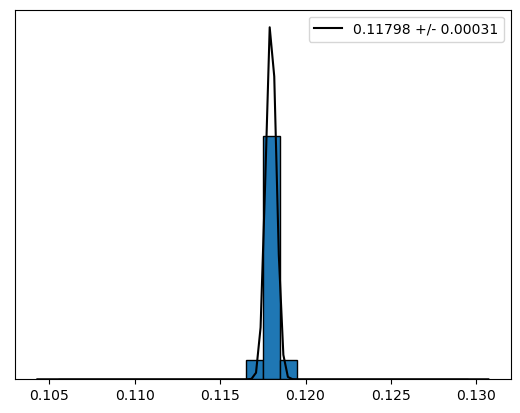

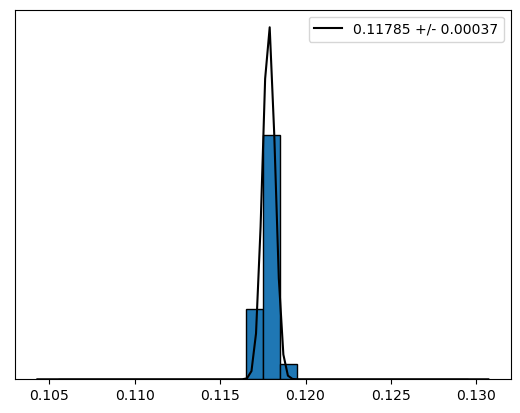

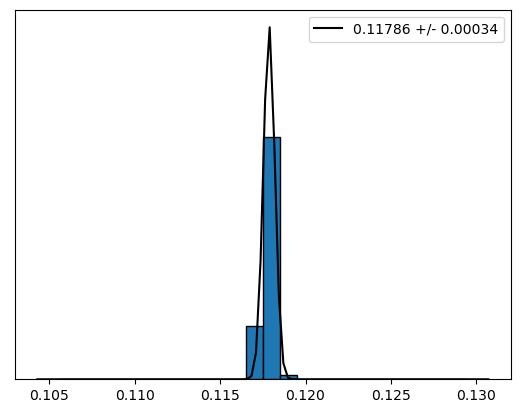

In [8]:
for batches, data_batches in zip(mean_after_crm, data_crm_all_batches):
    for batch, data in zip(batches, data_batches):
        hist_results(batch, data)

## Histograms for CRM

Result for CRM taking the MIN


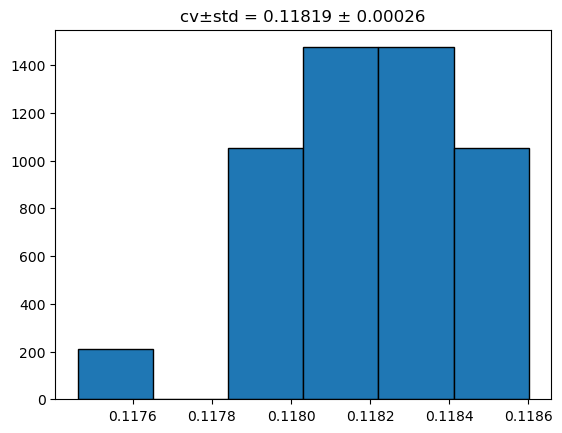

Result for CRM for only one batch


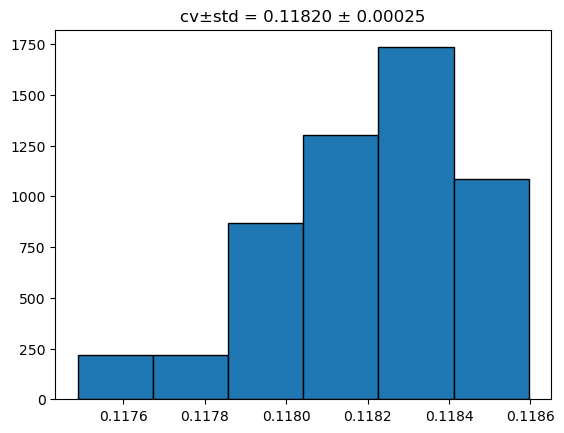

Result for CRM taking the MEAN


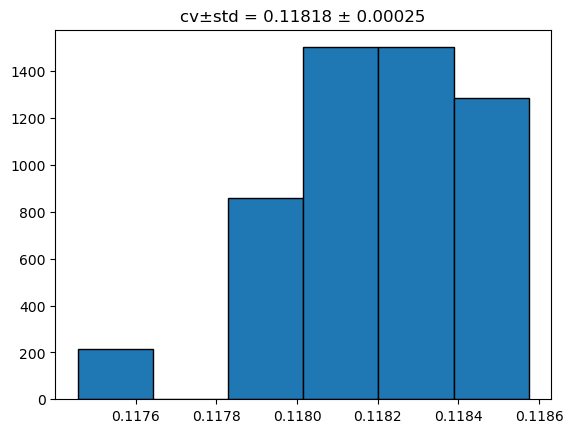

Result for CRM taking the MEAN of the alpha_s values


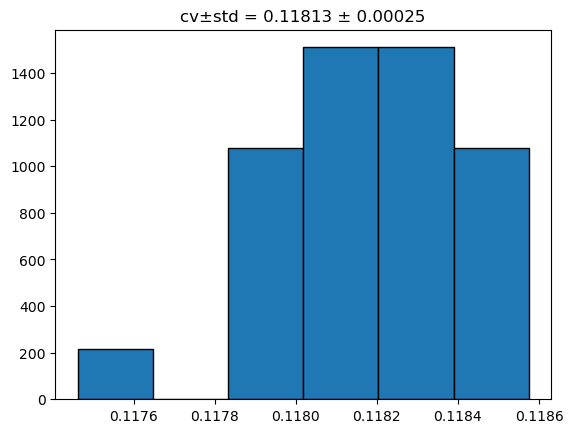

Result for CRM taking the MEAN of the alpha_s values and propagating the std


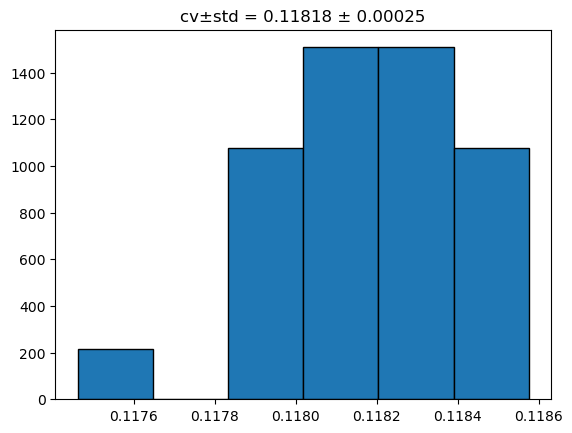

Result for CRM using the full sample


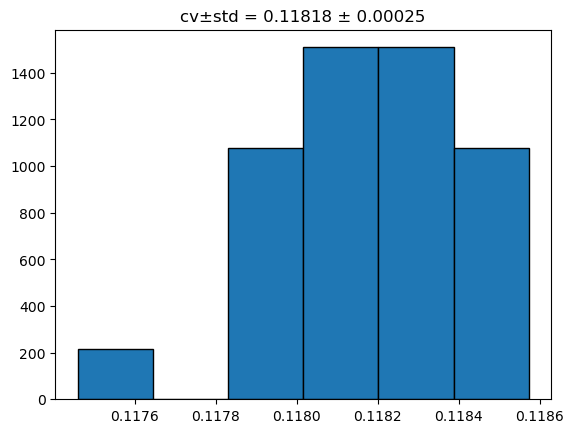

In [9]:
print("Result for CRM taking the MIN")
final_alpha_crm_min = hist_multict_alphas(alphas_crm_min)
print("Result for CRM for only one batch")
final_alpha_crm_singlebatch = hist_multict_alphas(alphas_crm_singlebatch)
print("Result for CRM taking the MEAN")
final_alpha_crm_mean = hist_multict_alphas(alphas_crm_mean)
print("Result for CRM taking the MEAN of the alpha_s values")
final_alpha_crm_mean_after = hist_multict_alphas(alphas_crm_mean_after)
print("Result for CRM taking the MEAN of the alpha_s values and propagating the std")
final_alpha_crm_mean_after_alternative = hist_multict_alphas(alphas_crm_mean_after_alternative)
print("Result for CRM using the full sample")
final_alpha_crm_mean_after_fullsample = hist_multict_alphas(alphas_crm_mean_after_joined)

## Bias to variance ratio

In [10]:
biases_crm_min_meth = []
for meas_val in alphas_crm_min:
    biases_crm_min_meth.append(bias(meas_val, TRUE_VALUE))
ratio_crm_min_meth = np.sqrt(np.average(biases_crm_min_meth))
print(f"R_bv for CRM method taking the min: {ratio_crm_min_meth}")

R_bv for CRM method taking the min: 0.9371990333599556


In [11]:
biases_crm_singlebatch_meth = []
for meas_val in alphas_crm_singlebatch:
    biases_crm_singlebatch_meth.append(bias(meas_val, TRUE_VALUE))
ratio_crm_singlebatch_meth = np.sqrt(np.average(biases_crm_singlebatch_meth))
print(f"R_bv for CRM method singlebatch: {ratio_crm_singlebatch_meth}")

R_bv for CRM method singlebatch: 0.9342211474824532


In [12]:
biases_crm_mean_meth = []
for meas_val in alphas_crm_mean:
    biases_crm_mean_meth.append(bias(meas_val, TRUE_VALUE))
ratio_crm_mean_meth = np.sqrt(np.average(biases_crm_mean_meth))
print(f"R_bv for CRM method taking the mean: {ratio_crm_mean_meth}")

R_bv for CRM method taking the mean: 0.9562807047841865


In [13]:
biases_crm_mean_after_meth = []
for meas_val in alphas_crm_mean_after:
    biases_crm_mean_after_meth.append(bias(meas_val, TRUE_VALUE))
ratio_crm_mean_after_meth = np.sqrt(np.average(biases_crm_mean_after_meth))
print(f"R_bv for CRM method taking the mean of the alpha values: {ratio_crm_mean_after_meth}")

R_bv for CRM method taking the mean of the alpha values: 19.50053793401906


In [14]:
biases_crm_mean_after_alternative_meth = []
for meas_val in alphas_crm_mean_after_alternative:
    biases_crm_mean_after_alternative_meth.append(bias(meas_val, TRUE_VALUE))
ratio_crm_mean_after_alternative_meth = np.sqrt(np.average(biases_crm_mean_after_alternative_meth))
print(f"R_bv for CRM method taking the mean of the alpha values: {ratio_crm_mean_after_alternative_meth}")

R_bv for CRM method taking the mean of the alpha values: 2.694900486126853


In [15]:
biases_crm_mean_after_fullsample_meth = []
for meas_val in alphas_crm_mean_after_joined:
    biases_crm_mean_after_fullsample_meth.append(bias(meas_val, TRUE_VALUE))
ratio_crm_mean_after_fullsample_meth = np.sqrt(np.average(biases_crm_mean_after_fullsample_meth))
print(f"R_bv for CRM method using the full sample: {ratio_crm_mean_after_fullsample_meth}")

R_bv for CRM method using the full sample: 0.894355427040072


### Bootstrap for bias to variance ratio

In [16]:
ratio_crm_min_meth_boot = prop_unc_ratio(bootstrap_bias(alphas_crm_min))
print(f"R_bv for CRM taking the MIN (bootstrap): {ratio_crm_min_meth_boot[0]} ± {ratio_crm_min_meth_boot[1]} ")

R_bv for CRM taking the MIN (bootstrap): 0.9355547109502396 ± 0.1153655832583468 


In [17]:
ratio_crm_singlebatch_meth_boot = prop_unc_ratio(bootstrap_bias(alphas_crm_singlebatch))
print(f"R_bv for CRM singlebatch (bootstrap): {ratio_crm_singlebatch_meth_boot[0]} ± {ratio_crm_singlebatch_meth_boot[1]} ")

R_bv for CRM singlebatch (bootstrap): 0.929082179012128 ± 0.0999007264332355 


In [18]:
ratio_crm_mean_meth_boot = prop_unc_ratio(bootstrap_bias(alphas_crm_mean))
print(f"R_bv for CRM taking the MEAN (bootstrap): {ratio_crm_mean_meth_boot[0]} ± {ratio_crm_mean_meth_boot[1]} ")

R_bv for CRM taking the MEAN (bootstrap): 0.938961601958672 ± 0.1017233422647232 


In [19]:
ratio_crm_mean_after_meth_boot = prop_unc_ratio(bootstrap_bias(alphas_crm_mean_after))
print(f"R_bv for CRM taking the MEAN of the alpha_s values (bootstrap): {ratio_crm_mean_after_meth_boot[0]} ± {ratio_crm_mean_after_meth_boot[1]} ")

R_bv for CRM taking the MEAN of the alpha_s values (bootstrap): 19.70105202837116 ± 4.31055043625741 


In [20]:
ratio_crm_mean_after_alternative_meth_boot = prop_unc_ratio(bootstrap_bias(alphas_crm_mean_after_alternative))
print(f"R_bv for CRM taking the MEAN of the alpha_s values and propagating the std (bootstrap): {ratio_crm_mean_after_alternative_meth_boot[0]} ± {ratio_crm_mean_after_alternative_meth_boot[1]} ")

R_bv for CRM taking the MEAN of the alpha_s values and propagating the std (bootstrap): 2.6835649003399387 ± 0.29546888977662245 


In [21]:
ratio_crm_mean_after_fullsample_meth_boot = prop_unc_ratio(bootstrap_bias(alphas_crm_mean_after_joined))
print(f"R_bv for CRM using the full sample (bootstrap): {ratio_crm_mean_after_fullsample_meth_boot[0]} ± {ratio_crm_mean_after_fullsample_meth_boot[1]} ")

R_bv for CRM using the full sample (bootstrap): 0.8939561639269896 ± 0.09488230464619359 


## Here we try the same but fitting the log of the chi2s

count    103.000000
mean      -2.137375
std        0.002921
min       -2.144628
16%       -2.140607
50%       -2.137345
84%       -2.134543
max       -2.129621
dtype: float64

cv±std = -2.13738 ± 0.00292 
1std interval:  -2.14030 to -2.13445 
68% c.i:        -2.14061 to -2.13454 


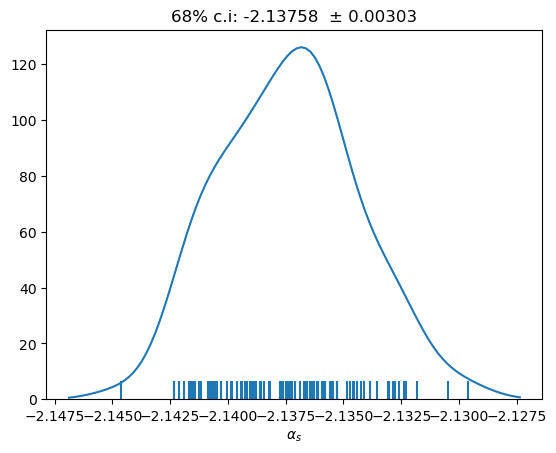

count    104.000000
mean      -2.135730
std        0.003055
min       -2.144230
16%       -2.138624
50%       -2.135817
84%       -2.132762
max       -2.127378
dtype: float64

cv±std = -2.13573 ± 0.00305 
1std interval:  -2.13879 to -2.13268 
68% c.i:        -2.13862 to -2.13276 


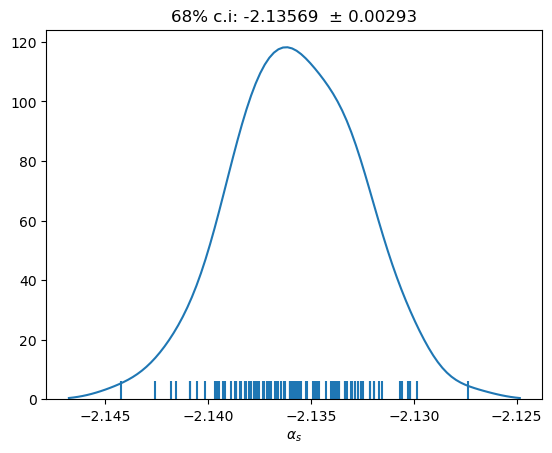

count    102.000000
mean      -2.138792
std        0.002682
min       -2.144919
16%       -2.141451
50%       -2.139053
84%       -2.136040
max       -2.132397
dtype: float64

cv±std = -2.13879 ± 0.00268 
1std interval:  -2.14147 to -2.13611 
68% c.i:        -2.14145 to -2.13604 


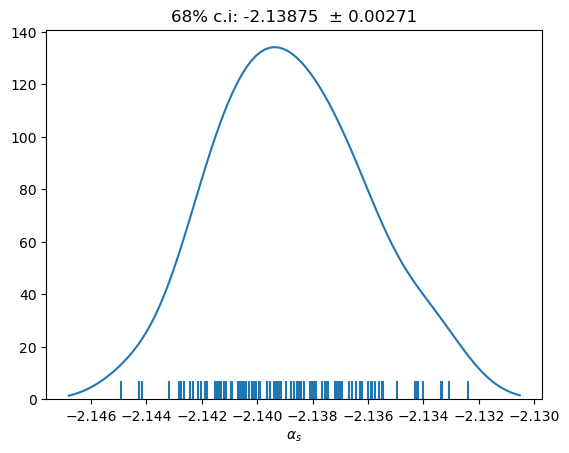

count    103.000000
mean      -2.136072
std        0.003149
min       -2.142924
16%       -2.138837
50%       -2.136444
84%       -2.132707
max       -2.128034
dtype: float64

cv±std = -2.13607 ± 0.00315 
1std interval:  -2.13922 to -2.13292 
68% c.i:        -2.13884 to -2.13271 


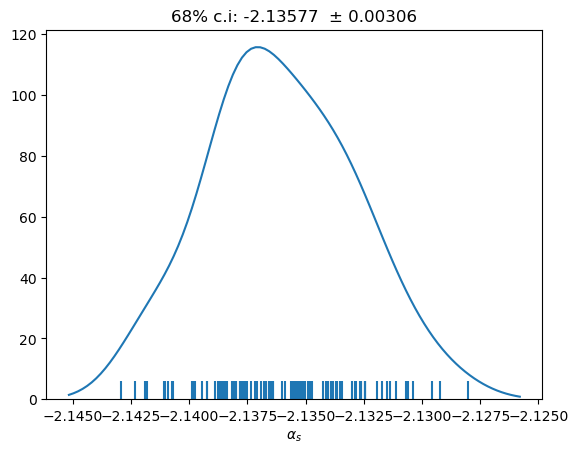

count    100.000000
mean      -2.138828
std        0.002819
min       -2.145290
16%       -2.141287
50%       -2.139123
84%       -2.136380
max       -2.130223
dtype: float64

cv±std = -2.13883 ± 0.00282 
1std interval:  -2.14165 to -2.13601 
68% c.i:        -2.14129 to -2.13638 


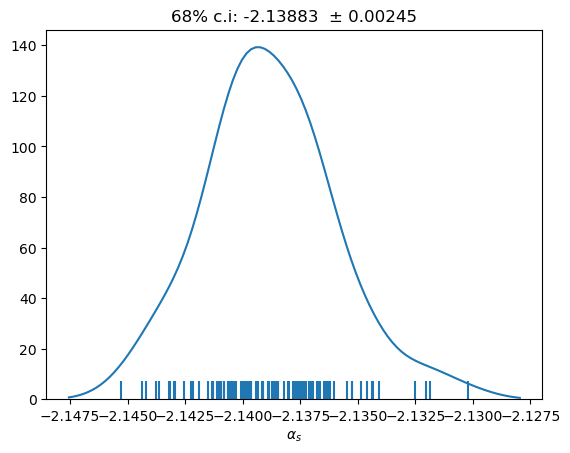

count    102.000000
mean      -2.142128
std        0.002918
min       -2.149227
16%       -2.145241
50%       -2.142089
84%       -2.139016
max       -2.135232
dtype: float64

cv±std = -2.14213 ± 0.00292 
1std interval:  -2.14505 to -2.13921 
68% c.i:        -2.14524 to -2.13902 


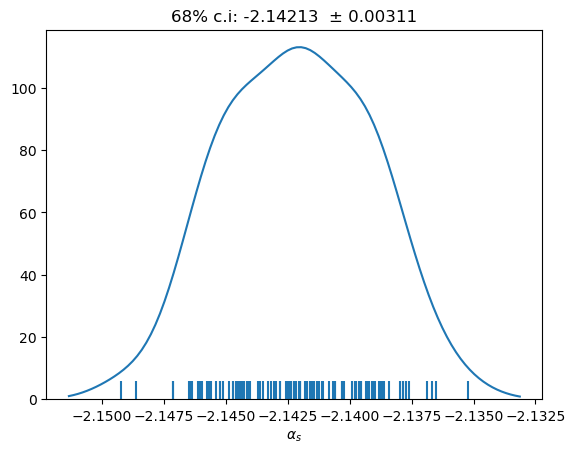

count    101.000000
mean      -2.140019
std        0.003081
min       -2.147819
16%       -2.142665
50%       -2.139784
84%       -2.137328
max       -2.132006
dtype: float64

cv±std = -2.14002 ± 0.00308 
1std interval:  -2.14310 to -2.13694 
68% c.i:        -2.14267 to -2.13733 


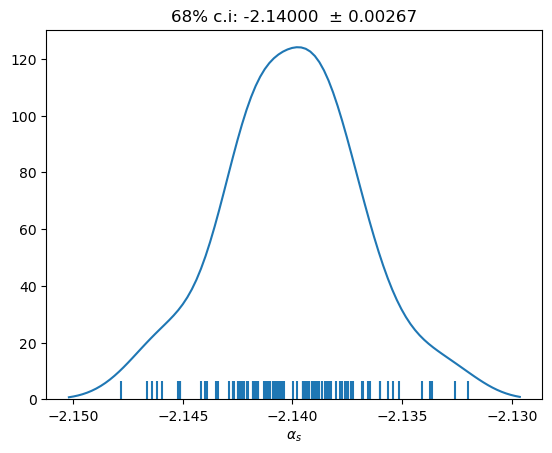

count    101.000000
mean      -2.139970
std        0.002778
min       -2.146229
16%       -2.142469
50%       -2.139929
84%       -2.137562
max       -2.132734
dtype: float64

cv±std = -2.13997 ± 0.00278 
1std interval:  -2.14275 to -2.13719 
68% c.i:        -2.14247 to -2.13756 


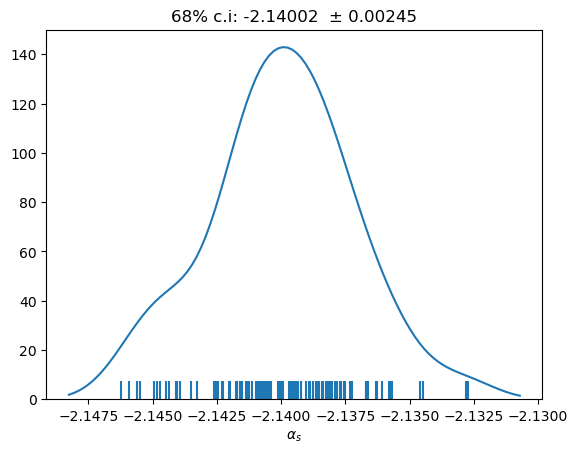

count    102.000000
mean      -2.145462
std        0.002688
min       -2.151181
16%       -2.148225
50%       -2.145685
84%       -2.142402
max       -2.139473
dtype: float64

cv±std = -2.14546 ± 0.00269 
1std interval:  -2.14815 to -2.14277 
68% c.i:        -2.14822 to -2.14240 


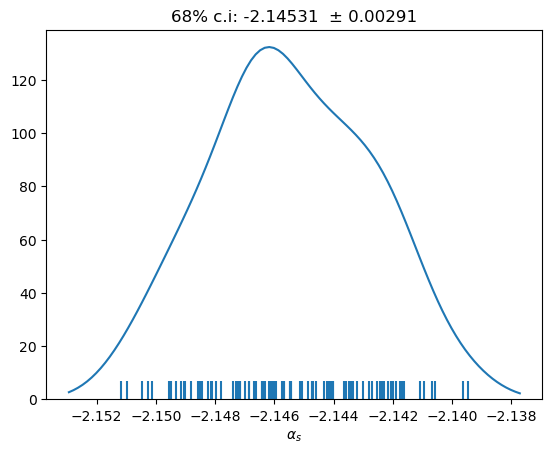

count    102.000000
mean      -2.140141
std        0.002834
min       -2.148299
16%       -2.142810
50%       -2.140238
84%       -2.137074
max       -2.132073
dtype: float64

cv±std = -2.14014 ± 0.00283 
1std interval:  -2.14297 to -2.13731 
68% c.i:        -2.14281 to -2.13707 


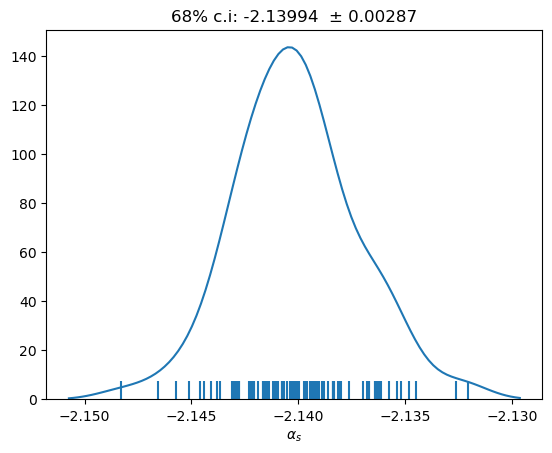

count    101.000000
mean      -2.141351
std        0.002628
min       -2.147156
16%       -2.144111
50%       -2.141569
84%       -2.138502
max       -2.135936
dtype: float64

cv±std = -2.14135 ± 0.00263 
1std interval:  -2.14398 to -2.13872 
68% c.i:        -2.14411 to -2.13850 


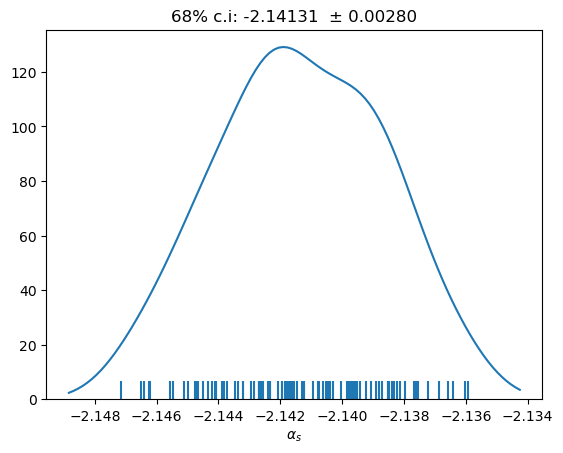

count    101.000000
mean      -2.140158
std        0.002872
min       -2.146630
16%       -2.142962
50%       -2.140142
84%       -2.137529
max       -2.132602
dtype: float64

cv±std = -2.14016 ± 0.00287 
1std interval:  -2.14303 to -2.13729 
68% c.i:        -2.14296 to -2.13753 


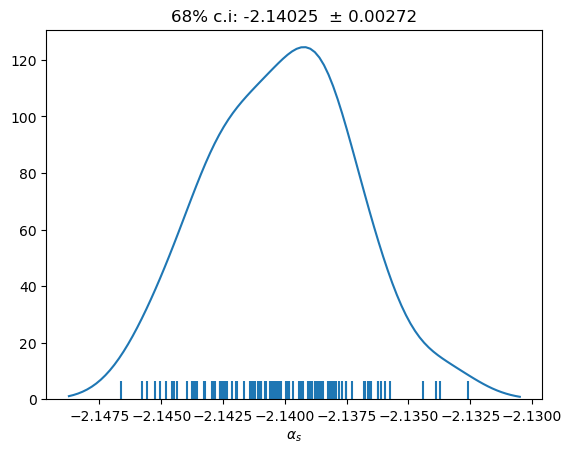

count    103.000000
mean      -2.139120
std        0.002955
min       -2.147043
16%       -2.142028
50%       -2.139155
84%       -2.136157
max       -2.132714
dtype: float64

cv±std = -2.13912 ± 0.00295 
1std interval:  -2.14207 to -2.13616 
68% c.i:        -2.14203 to -2.13616 


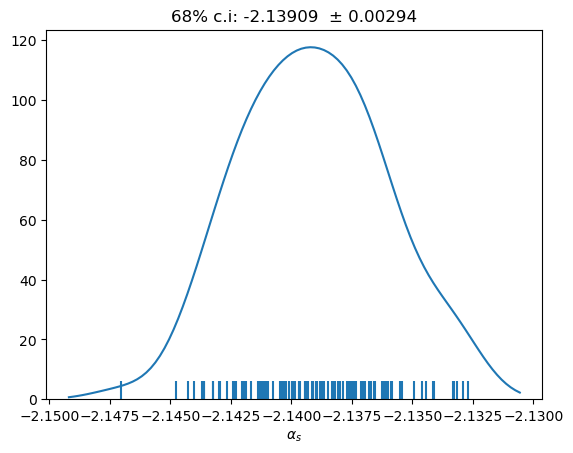

count    102.000000
mean      -2.141377
std        0.002511
min       -2.149429
16%       -2.143752
50%       -2.141539
84%       -2.138971
max       -2.134334
dtype: float64

cv±std = -2.14138 ± 0.00251 
1std interval:  -2.14389 to -2.13887 
68% c.i:        -2.14375 to -2.13897 


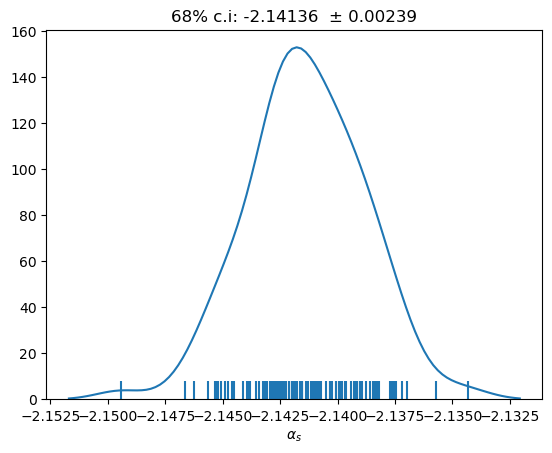

count    102.000000
mean      -2.137226
std        0.002930
min       -2.146501
16%       -2.140164
50%       -2.137482
84%       -2.134201
max       -2.130407
dtype: float64

cv±std = -2.13723 ± 0.00293 
1std interval:  -2.14016 to -2.13430 
68% c.i:        -2.14016 to -2.13420 


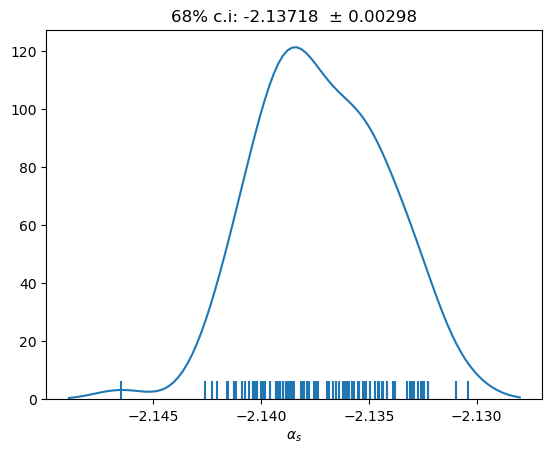

count    104.000000
mean      -2.138171
std        0.002997
min       -2.144836
16%       -2.141241
50%       -2.138126
84%       -2.135355
max       -2.131562
dtype: float64

cv±std = -2.13817 ± 0.00300 
1std interval:  -2.14117 to -2.13517 
68% c.i:        -2.14124 to -2.13536 


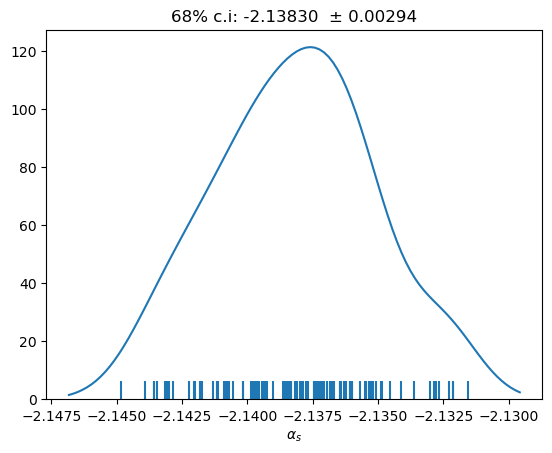

count    101.000000
mean      -2.138722
std        0.002964
min       -2.146650
16%       -2.141486
50%       -2.138680
84%       -2.135774
max       -2.132628
dtype: float64

cv±std = -2.13872 ± 0.00296 
1std interval:  -2.14169 to -2.13576 
68% c.i:        -2.14149 to -2.13577 


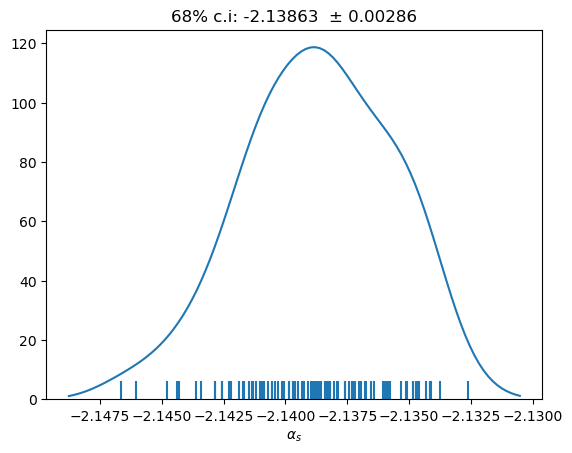

count    100.000000
mean      -2.140934
std        0.003081
min       -2.149112
16%       -2.144052
50%       -2.140901
84%       -2.138006
max       -2.132391
dtype: float64

cv±std = -2.14093 ± 0.00308 
1std interval:  -2.14402 to -2.13785 
68% c.i:        -2.14405 to -2.13801 


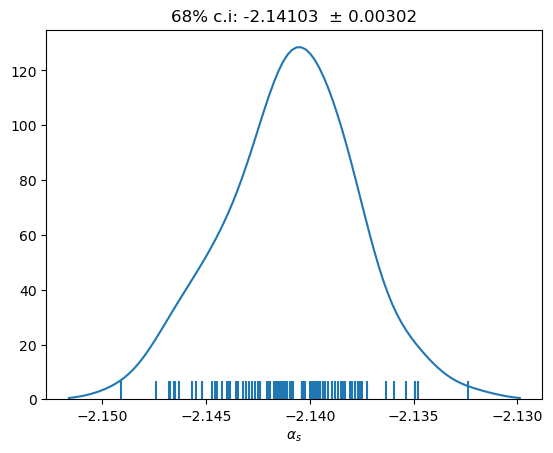

count    104.000000
mean      -2.139689
std        0.002981
min       -2.146461
16%       -2.142825
50%       -2.139905
84%       -2.136595
max       -2.132881
dtype: float64

cv±std = -2.13969 ± 0.00298 
1std interval:  -2.14267 to -2.13671 
68% c.i:        -2.14282 to -2.13660 


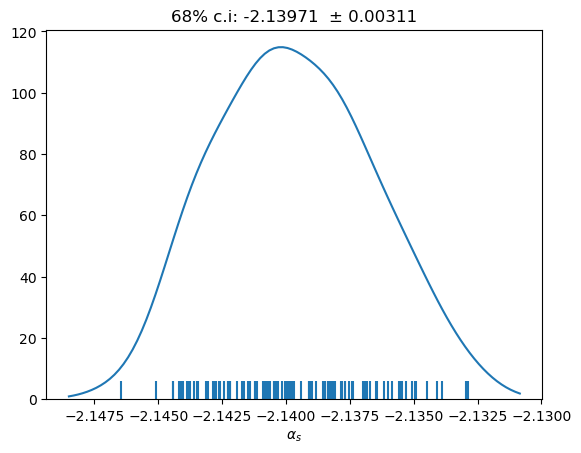

count    101.000000
mean      -2.135870
std        0.002894
min       -2.143706
16%       -2.139155
50%       -2.135506
84%       -2.132822
max       -2.129748
dtype: float64

cv±std = -2.13587 ± 0.00289 
1std interval:  -2.13876 to -2.13298 
68% c.i:        -2.13915 to -2.13282 


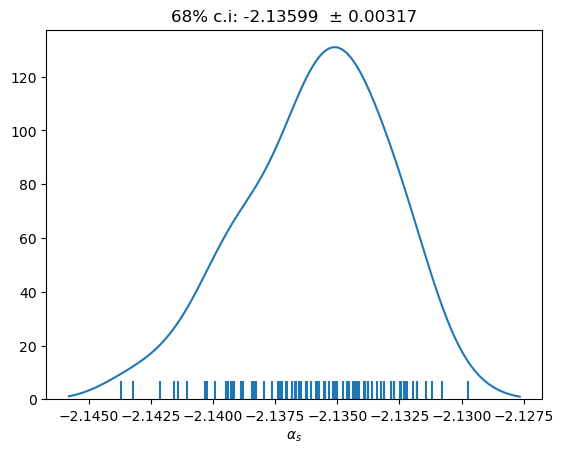

count    103.000000
mean      -2.138099
std        0.003222
min       -2.144651
16%       -2.140971
50%       -2.138220
84%       -2.134697
max       -2.129632
dtype: float64

cv±std = -2.13810 ± 0.00322 
1std interval:  -2.14132 to -2.13488 
68% c.i:        -2.14097 to -2.13470 


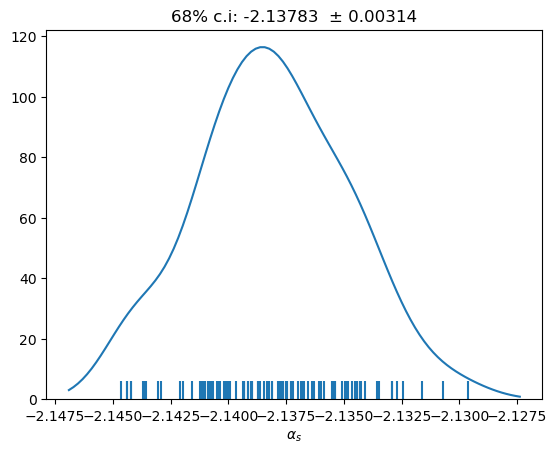

count    101.000000
mean      -2.136470
std        0.002914
min       -2.142873
16%       -2.139049
50%       -2.136354
84%       -2.133730
max       -2.128057
dtype: float64

cv±std = -2.13647 ± 0.00291 
1std interval:  -2.13938 to -2.13356 
68% c.i:        -2.13905 to -2.13373 


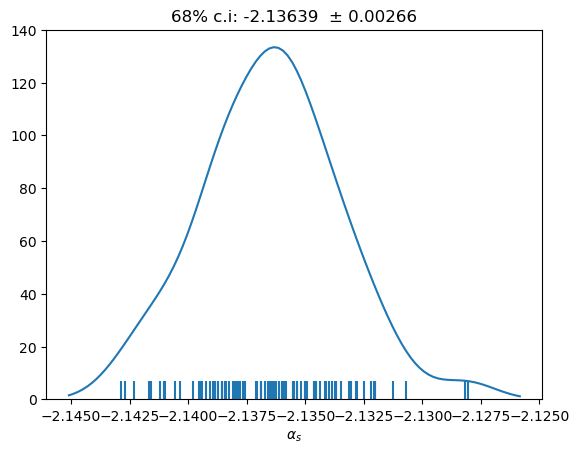

count    103.000000
mean      -2.138063
std        0.003096
min       -2.147786
16%       -2.141069
50%       -2.138192
84%       -2.134581
max       -2.131587
dtype: float64

cv±std = -2.13806 ± 0.00310 
1std interval:  -2.14116 to -2.13497 
68% c.i:        -2.14107 to -2.13458 


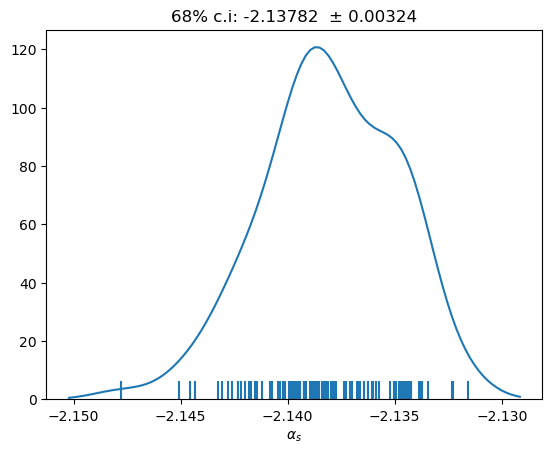

count    101.000000
mean      -2.139559
std        0.002785
min       -2.146172
16%       -2.142608
50%       -2.139736
84%       -2.136873
max       -2.133085
dtype: float64

cv±std = -2.13956 ± 0.00278 
1std interval:  -2.14234 to -2.13677 
68% c.i:        -2.14261 to -2.13687 


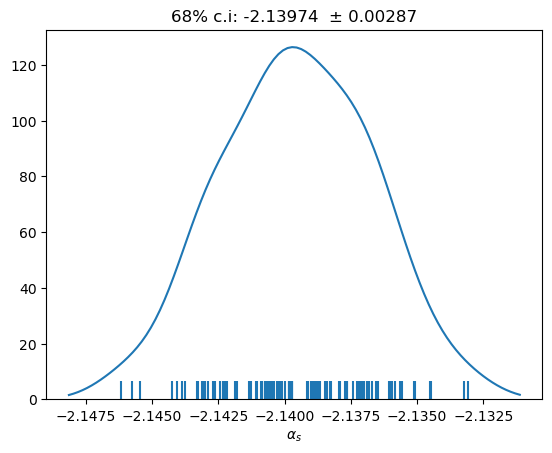

count    101.000000
mean      -2.141813
std        0.002990
min       -2.149463
16%       -2.145029
50%       -2.141774
84%       -2.138757
max       -2.134935
dtype: float64

cv±std = -2.14181 ± 0.00299 
1std interval:  -2.14480 to -2.13882 
68% c.i:        -2.14503 to -2.13876 


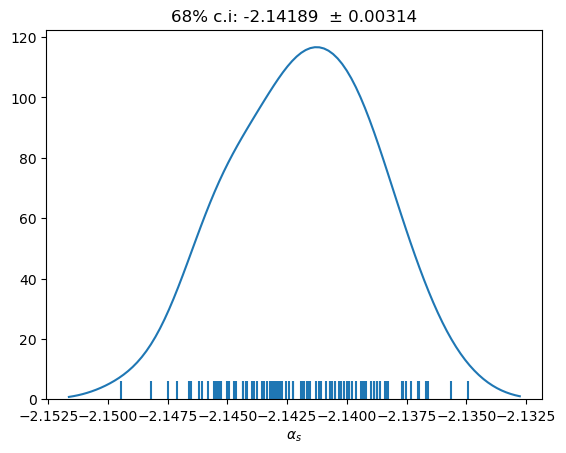

count    103.000000
mean      -2.137523
std        0.002814
min       -2.144900
16%       -2.140431
50%       -2.137474
84%       -2.134763
max       -2.130197
dtype: float64

cv±std = -2.13752 ± 0.00281 
1std interval:  -2.14034 to -2.13471 
68% c.i:        -2.14043 to -2.13476 


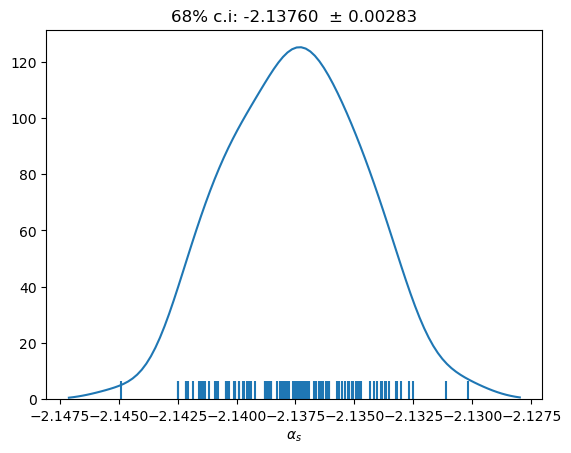

count    104.000000
mean      -2.135957
std        0.003015
min       -2.143847
16%       -2.138784
50%       -2.136111
84%       -2.132869
max       -2.128183
dtype: float64

cv±std = -2.13596 ± 0.00301 
1std interval:  -2.13897 to -2.13294 
68% c.i:        -2.13878 to -2.13287 


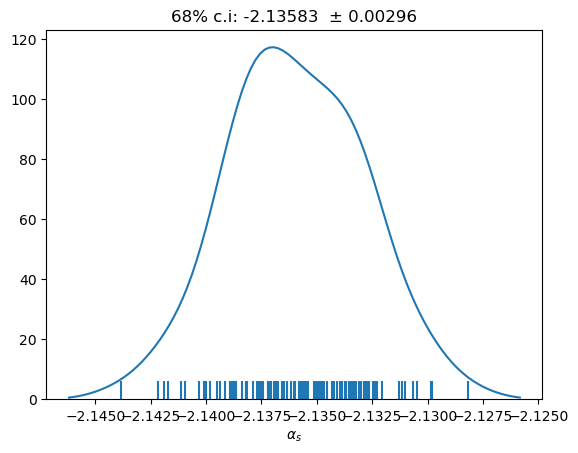

count    102.000000
mean      -2.138761
std        0.002743
min       -2.144795
16%       -2.141541
50%       -2.139050
84%       -2.135970
max       -2.132346
dtype: float64

cv±std = -2.13876 ± 0.00274 
1std interval:  -2.14150 to -2.13602 
68% c.i:        -2.14154 to -2.13597 


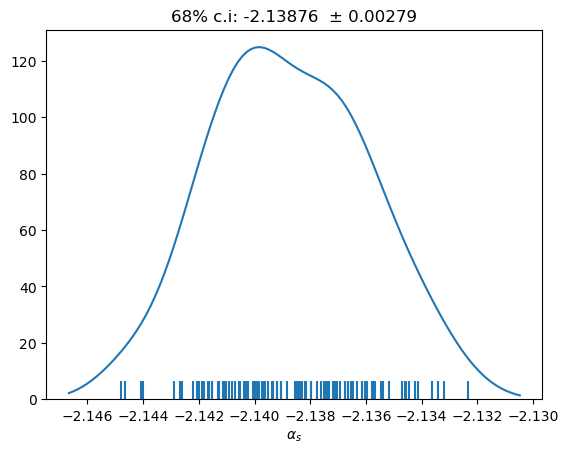

count    103.000000
mean      -2.136375
std        0.003044
min       -2.142846
16%       -2.139208
50%       -2.136397
84%       -2.133167
max       -2.127958
dtype: float64

cv±std = -2.13638 ± 0.00304 
1std interval:  -2.13942 to -2.13333 
68% c.i:        -2.13921 to -2.13317 


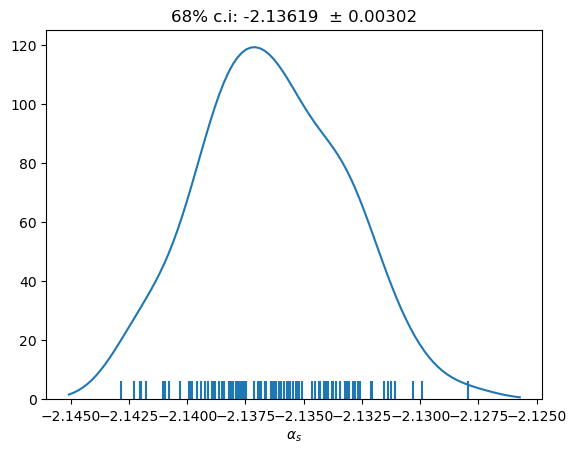

count    100.000000
mean      -2.138661
std        0.002621
min       -2.145301
16%       -2.141111
50%       -2.138595
84%       -2.136506
max       -2.131038
dtype: float64

cv±std = -2.13866 ± 0.00262 
1std interval:  -2.14128 to -2.13604 
68% c.i:        -2.14111 to -2.13651 


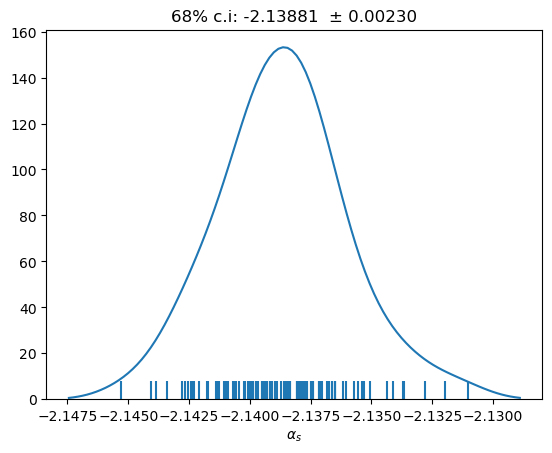

count    102.000000
mean      -2.142202
std        0.002906
min       -2.149217
16%       -2.145311
50%       -2.142095
84%       -2.139383
max       -2.135574
dtype: float64

cv±std = -2.14220 ± 0.00291 
1std interval:  -2.14511 to -2.13930 
68% c.i:        -2.14531 to -2.13938 


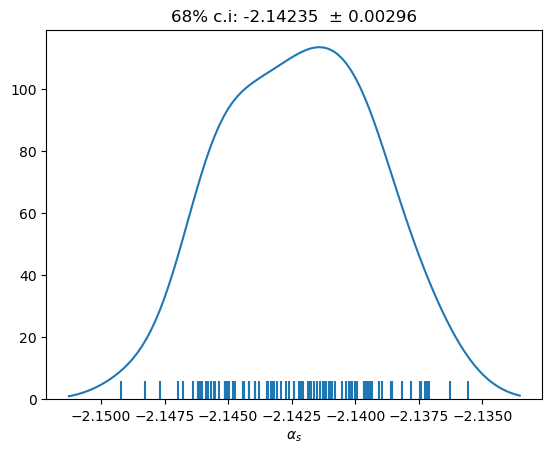

count    101.000000
mean      -2.139973
std        0.002961
min       -2.147143
16%       -2.142763
50%       -2.140088
84%       -2.137397
max       -2.132401
dtype: float64

cv±std = -2.13997 ± 0.00296 
1std interval:  -2.14293 to -2.13701 
68% c.i:        -2.14276 to -2.13740 


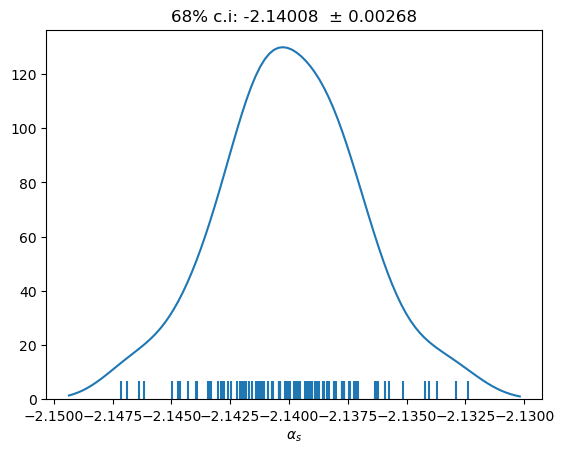

count    101.000000
mean      -2.139834
std        0.002660
min       -2.145972
16%       -2.142315
50%       -2.139449
84%       -2.137381
max       -2.133137
dtype: float64

cv±std = -2.13983 ± 0.00266 
1std interval:  -2.14249 to -2.13717 
68% c.i:        -2.14231 to -2.13738 


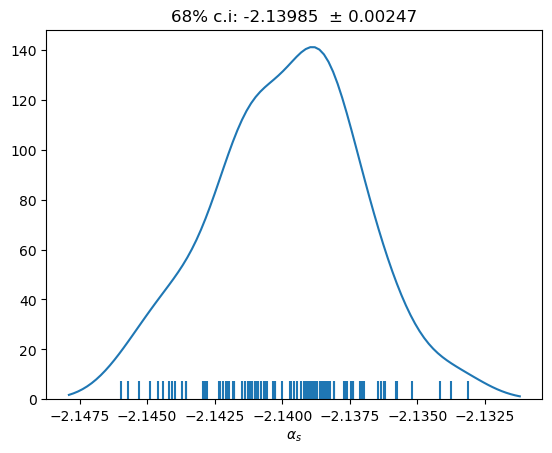

count    102.000000
mean      -2.145507
std        0.002609
min       -2.151698
16%       -2.148254
50%       -2.145613
84%       -2.142893
max       -2.139086
dtype: float64

cv±std = -2.14551 ± 0.00261 
1std interval:  -2.14812 to -2.14290 
68% c.i:        -2.14825 to -2.14289 


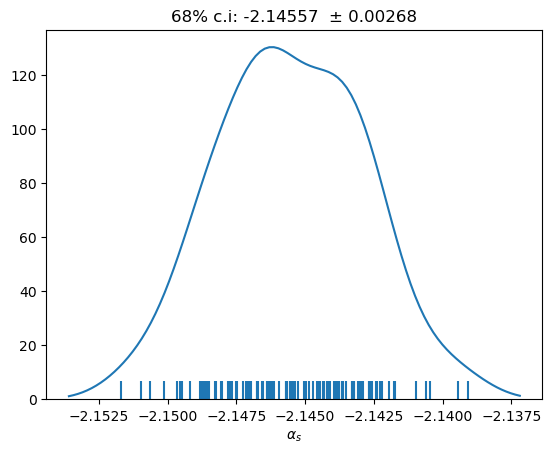

count    102.000000
mean      -2.140317
std        0.002735
min       -2.147385
16%       -2.143079
50%       -2.140375
84%       -2.137872
max       -2.132642
dtype: float64

cv±std = -2.14032 ± 0.00273 
1std interval:  -2.14305 to -2.13758 
68% c.i:        -2.14308 to -2.13787 


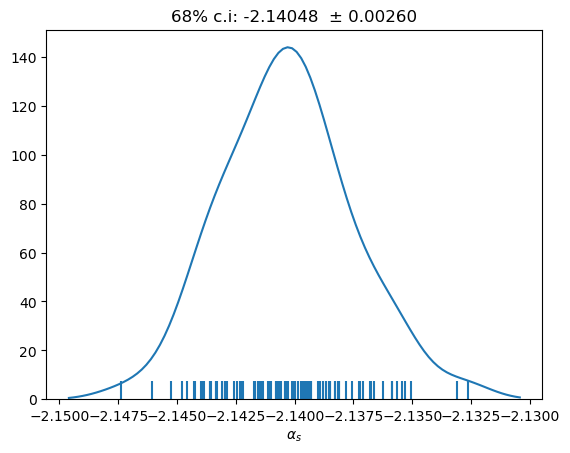

count    101.000000
mean      -2.141309
std        0.002594
min       -2.147235
16%       -2.144205
50%       -2.141390
84%       -2.138491
max       -2.135153
dtype: float64

cv±std = -2.14131 ± 0.00259 
1std interval:  -2.14390 to -2.13872 
68% c.i:        -2.14420 to -2.13849 


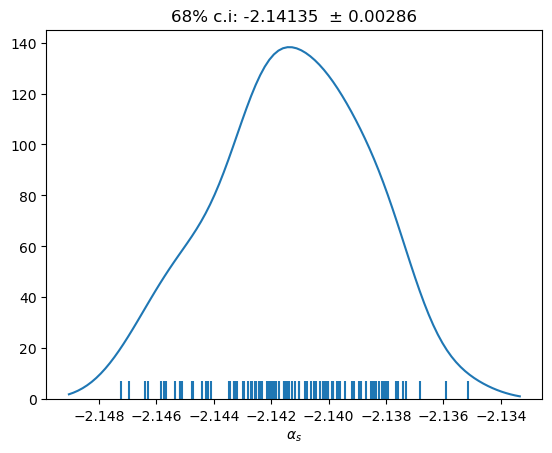

count    101.000000
mean      -2.140306
std        0.002797
min       -2.147232
16%       -2.143132
50%       -2.139969
84%       -2.137379
max       -2.133915
dtype: float64

cv±std = -2.14031 ± 0.00280 
1std interval:  -2.14310 to -2.13751 
68% c.i:        -2.14313 to -2.13738 


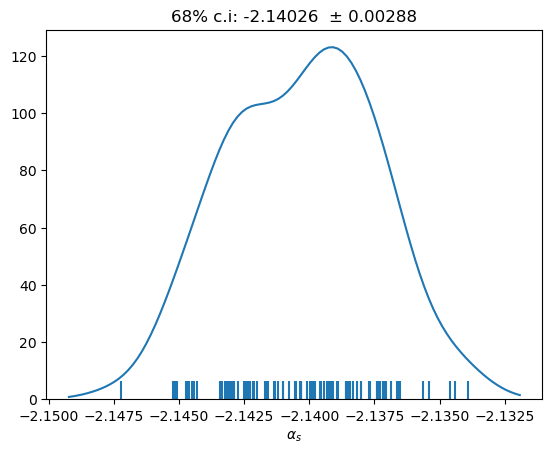

count    103.000000
mean      -2.139051
std        0.002791
min       -2.145702
16%       -2.141852
50%       -2.139130
84%       -2.136293
max       -2.132916
dtype: float64

cv±std = -2.13905 ± 0.00279 
1std interval:  -2.14184 to -2.13626 
68% c.i:        -2.14185 to -2.13629 


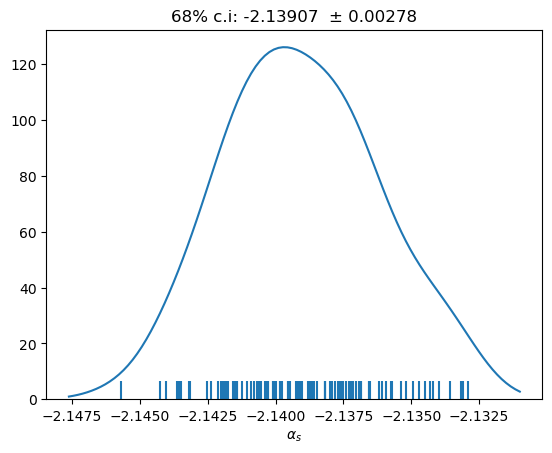

count    102.000000
mean      -2.141351
std        0.002308
min       -2.147100
16%       -2.143543
50%       -2.141407
84%       -2.138875
max       -2.133970
dtype: float64

cv±std = -2.14135 ± 0.00231 
1std interval:  -2.14366 to -2.13904 
68% c.i:        -2.14354 to -2.13887 


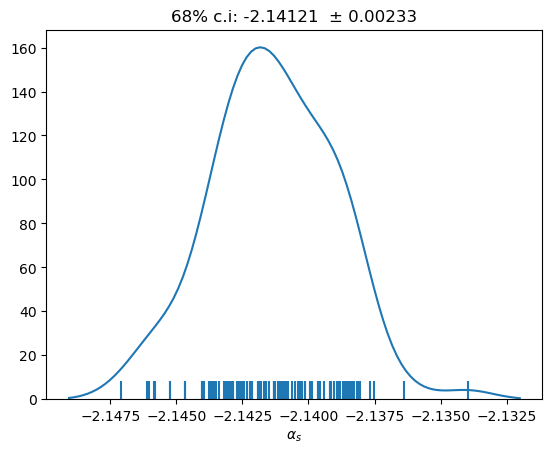

count    102.000000
mean      -2.137255
std        0.002889
min       -2.146570
16%       -2.140124
50%       -2.137430
84%       -2.134566
max       -2.130204
dtype: float64

cv±std = -2.13726 ± 0.00289 
1std interval:  -2.14014 to -2.13437 
68% c.i:        -2.14012 to -2.13457 


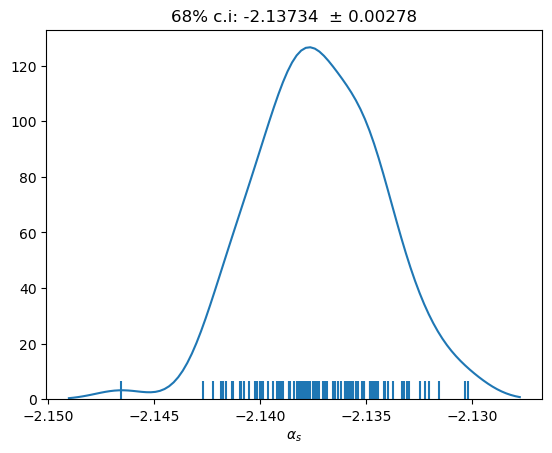

count    104.000000
mean      -2.138125
std        0.002890
min       -2.145193
16%       -2.141087
50%       -2.138183
84%       -2.135620
max       -2.131199
dtype: float64

cv±std = -2.13812 ± 0.00289 
1std interval:  -2.14101 to -2.13524 
68% c.i:        -2.14109 to -2.13562 


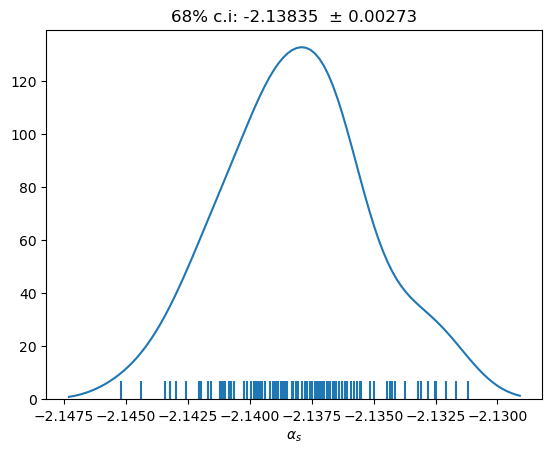

count    101.000000
mean      -2.138628
std        0.002862
min       -2.147232
16%       -2.141421
50%       -2.138742
84%       -2.135214
max       -2.132832
dtype: float64

cv±std = -2.13863 ± 0.00286 
1std interval:  -2.14149 to -2.13577 
68% c.i:        -2.14142 to -2.13521 


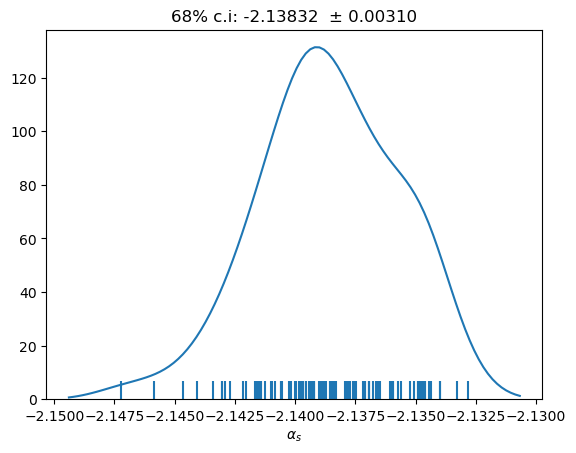

count    100.000000
mean      -2.140708
std        0.002996
min       -2.149733
16%       -2.143840
50%       -2.140278
84%       -2.137902
max       -2.133452
dtype: float64

cv±std = -2.14071 ± 0.00300 
1std interval:  -2.14370 to -2.13771 
68% c.i:        -2.14384 to -2.13790 


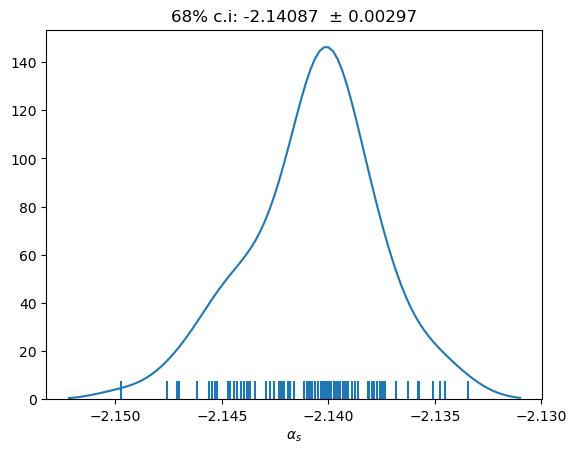

count    104.000000
mean      -2.139728
std        0.002942
min       -2.145514
16%       -2.143199
50%       -2.139880
84%       -2.136690
max       -2.132806
dtype: float64

cv±std = -2.13973 ± 0.00294 
1std interval:  -2.14267 to -2.13679 
68% c.i:        -2.14320 to -2.13669 


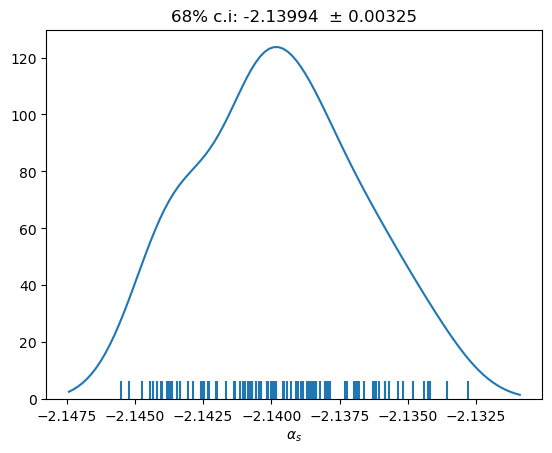

count    101.000000
mean      -2.136092
std        0.002694
min       -2.143334
16%       -2.138867
50%       -2.135739
84%       -2.133338
max       -2.131164
dtype: float64

cv±std = -2.13609 ± 0.00269 
1std interval:  -2.13879 to -2.13340 
68% c.i:        -2.13887 to -2.13334 


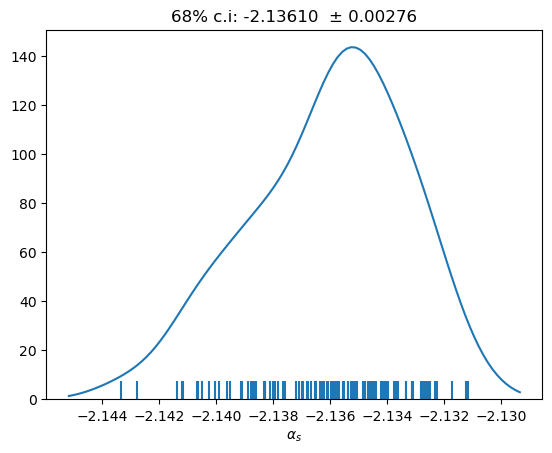

count    103.000000
mean      -2.137994
std        0.003148
min       -2.145224
16%       -2.140913
50%       -2.137909
84%       -2.134755
max       -2.130681
dtype: float64

cv±std = -2.13799 ± 0.00315 
1std interval:  -2.14114 to -2.13485 
68% c.i:        -2.14091 to -2.13475 


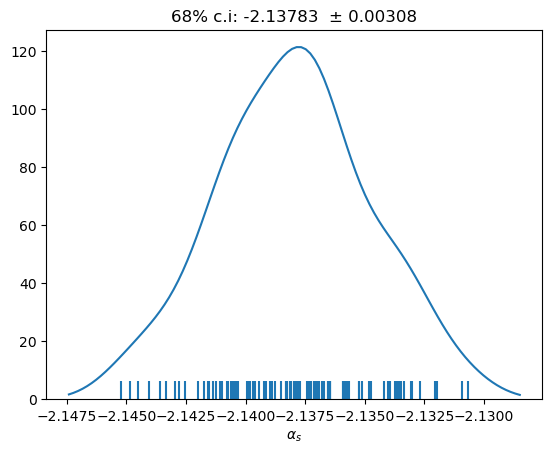

count    101.000000
mean      -2.136265
std        0.002802
min       -2.142502
16%       -2.139069
50%       -2.136126
84%       -2.133638
max       -2.127977
dtype: float64

cv±std = -2.13627 ± 0.00280 
1std interval:  -2.13907 to -2.13346 
68% c.i:        -2.13907 to -2.13364 


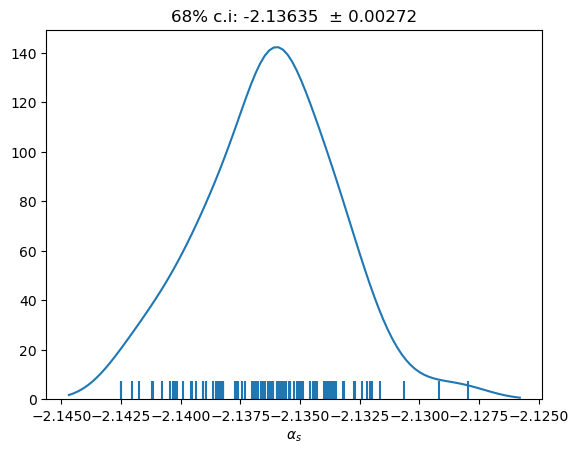

count    103.000000
mean      -2.138401
std        0.002978
min       -2.147345
16%       -2.141269
50%       -2.138522
84%       -2.135052
max       -2.132044
dtype: float64

cv±std = -2.13840 ± 0.00298 
1std interval:  -2.14138 to -2.13542 
68% c.i:        -2.14127 to -2.13505 


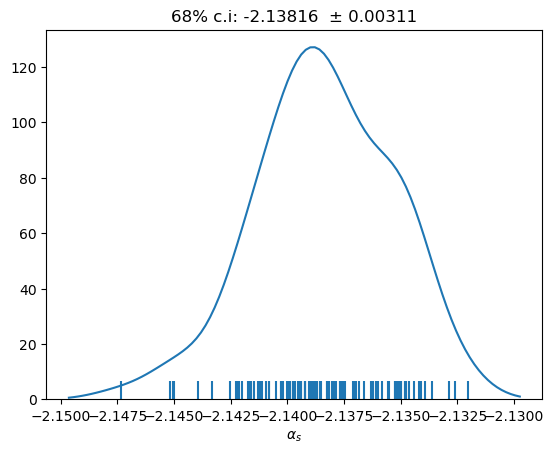

count    101.000000
mean      -2.139720
std        0.002766
min       -2.146361
16%       -2.142524
50%       -2.139448
84%       -2.137103
max       -2.133240
dtype: float64

cv±std = -2.13972 ± 0.00277 
1std interval:  -2.14249 to -2.13695 
68% c.i:        -2.14252 to -2.13710 


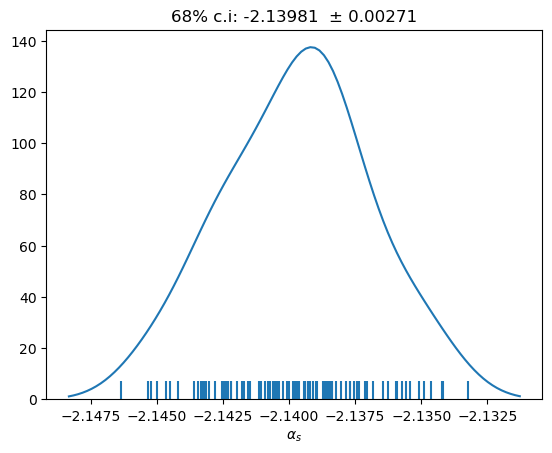

count    101.000000
mean      -2.141831
std        0.002915
min       -2.149399
16%       -2.144798
50%       -2.141989
84%       -2.138840
max       -2.134783
dtype: float64

cv±std = -2.14183 ± 0.00292 
1std interval:  -2.14475 to -2.13892 
68% c.i:        -2.14480 to -2.13884 


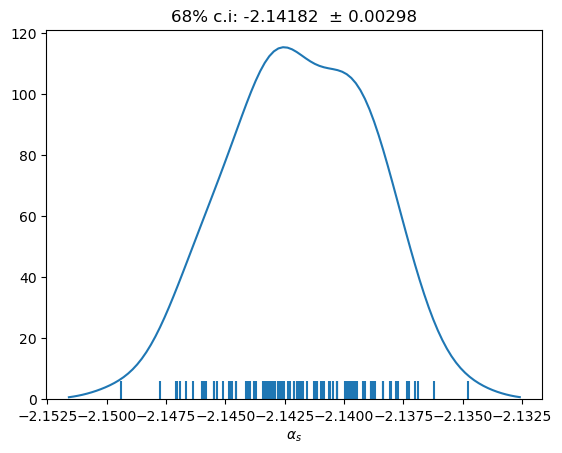

count    58.000000
mean     -2.137527
std       0.002850
min      -2.144223
16%      -2.140061
50%      -2.137288
84%      -2.135017
max      -2.130310
dtype: float64

cv±std = -2.13753 ± 0.00285 
1std interval:  -2.14038 to -2.13468 
68% c.i:        -2.14006 to -2.13502 


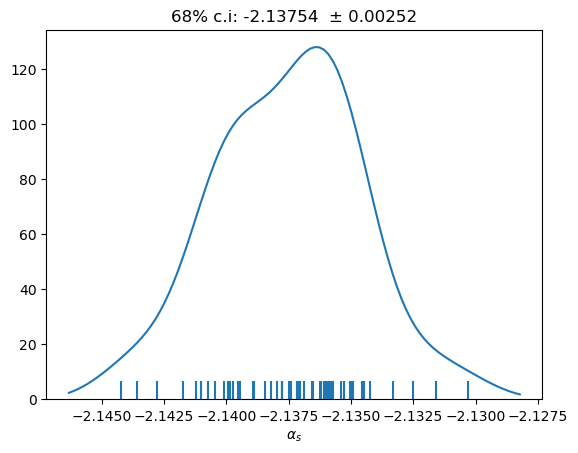

count    71.000000
mean     -2.137406
std       0.002886
min      -2.143564
16%      -2.140205
50%      -2.137409
84%      -2.134141
max      -2.131332
dtype: float64

cv±std = -2.13741 ± 0.00289 
1std interval:  -2.14029 to -2.13452 
68% c.i:        -2.14020 to -2.13414 


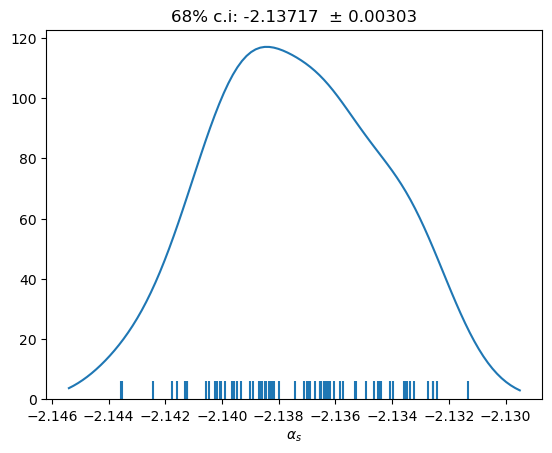

count    74.000000
mean     -2.137810
std       0.003144
min      -2.146673
16%      -2.141045
50%      -2.137506
84%      -2.134453
max      -2.131096
dtype: float64

cv±std = -2.13781 ± 0.00314 
1std interval:  -2.14095 to -2.13467 
68% c.i:        -2.14105 to -2.13445 


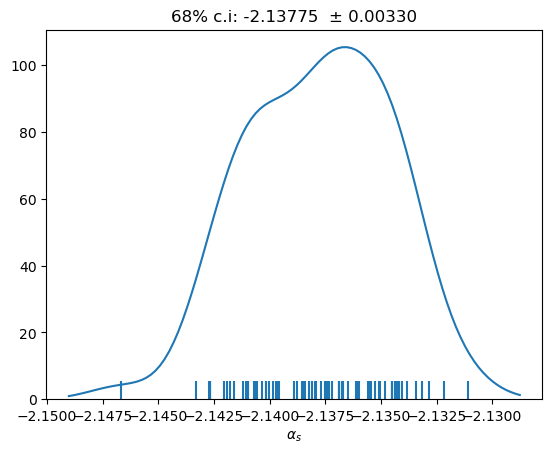

count    65.000000
mean     -2.135773
std       0.002965
min      -2.143520
16%      -2.138105
50%      -2.135693
84%      -2.132969
max      -2.129001
dtype: float64

cv±std = -2.13577 ± 0.00296 
1std interval:  -2.13874 to -2.13281 
68% c.i:        -2.13811 to -2.13297 


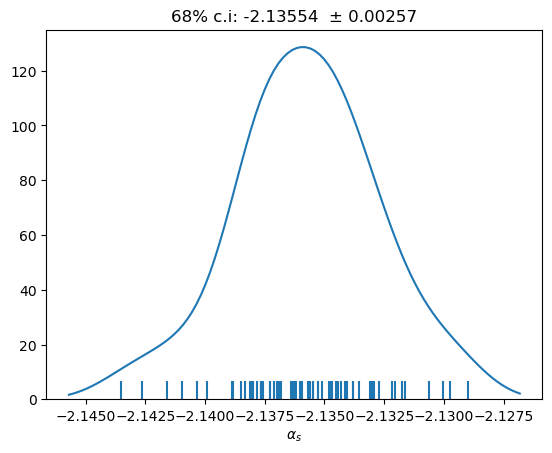

count    83.000000
mean     -2.136154
std       0.003440
min      -2.145541
16%      -2.139675
50%      -2.136367
84%      -2.132564
max      -2.127379
dtype: float64

cv±std = -2.13615 ± 0.00344 
1std interval:  -2.13959 to -2.13271 
68% c.i:        -2.13967 to -2.13256 


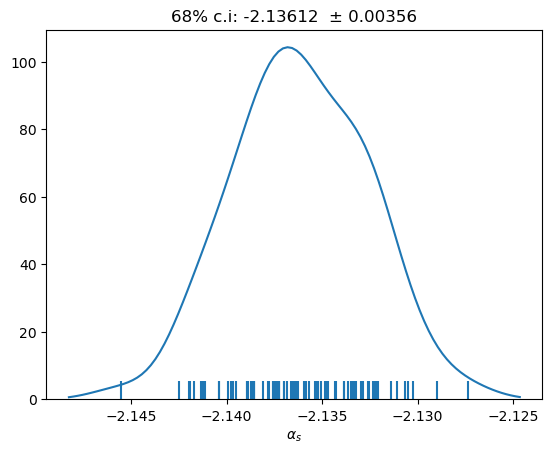

count    81.000000
mean     -2.135933
std       0.003150
min      -2.142570
16%      -2.139087
50%      -2.135851
84%      -2.132755
max      -2.129107
dtype: float64

cv±std = -2.13593 ± 0.00315 
1std interval:  -2.13908 to -2.13278 
68% c.i:        -2.13909 to -2.13275 


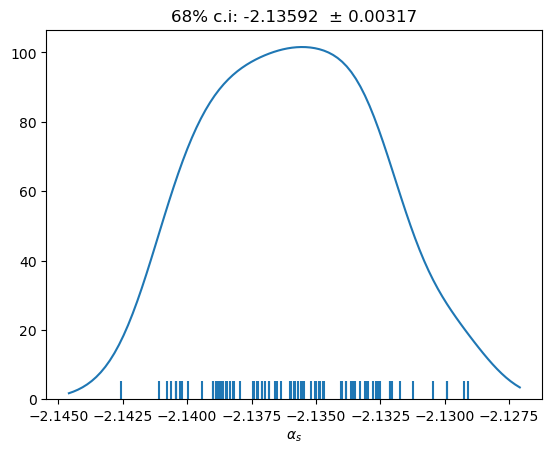

count    64.000000
mean     -2.138729
std       0.002947
min      -2.145287
16%      -2.141886
50%      -2.138251
84%      -2.135968
max      -2.133046
dtype: float64

cv±std = -2.13873 ± 0.00295 
1std interval:  -2.14168 to -2.13578 
68% c.i:        -2.14189 to -2.13597 


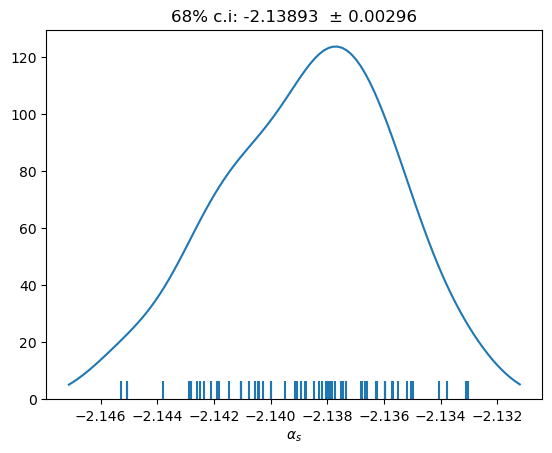

count    88.000000
mean     -2.138819
std       0.002933
min      -2.146060
16%      -2.141912
50%      -2.138901
84%      -2.135587
max      -2.132681
dtype: float64

cv±std = -2.13882 ± 0.00293 
1std interval:  -2.14175 to -2.13589 
68% c.i:        -2.14191 to -2.13559 


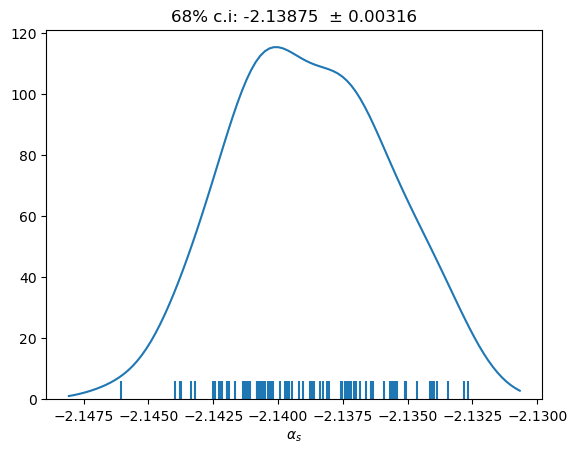

count    84.000000
mean     -2.138697
std       0.002857
min      -2.143540
16%      -2.141500
50%      -2.139020
84%      -2.136000
max      -2.130526
dtype: float64

cv±std = -2.13870 ± 0.00286 
1std interval:  -2.14155 to -2.13584 
68% c.i:        -2.14150 to -2.13600 


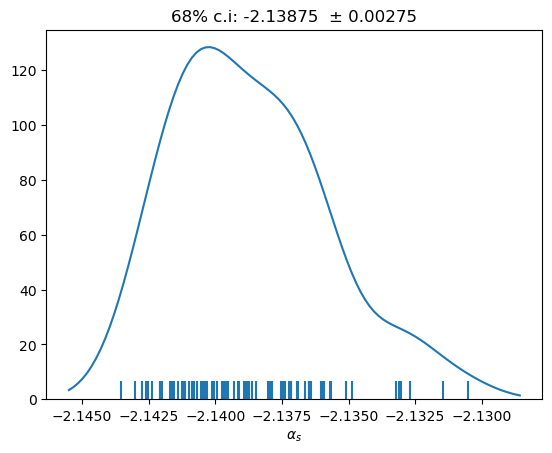

count    60.000000
mean     -2.136001
std       0.003495
min      -2.142991
16%      -2.139587
50%      -2.136299
84%      -2.132081
max      -2.128718
dtype: float64

cv±std = -2.13600 ± 0.00349 
1std interval:  -2.13950 to -2.13251 
68% c.i:        -2.13959 to -2.13208 


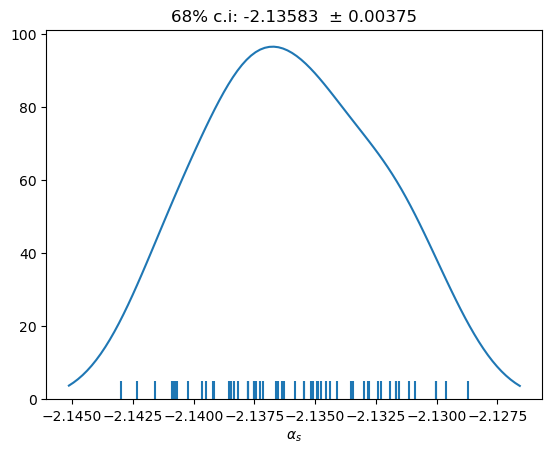

count    80.000000
mean     -2.136497
std       0.003330
min      -2.144137
16%      -2.139963
50%      -2.136068
84%      -2.133431
max      -2.127715
dtype: float64

cv±std = -2.13650 ± 0.00333 
1std interval:  -2.13983 to -2.13317 
68% c.i:        -2.13996 to -2.13343 


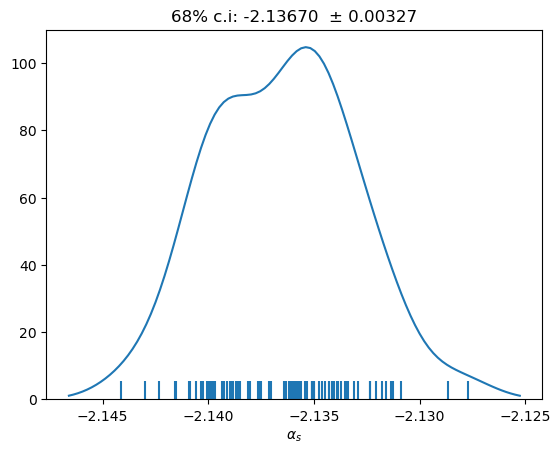

count    83.000000
mean     -2.136132
std       0.002953
min      -2.142679
16%      -2.139243
50%      -2.136063
84%      -2.132997
max      -2.128677
dtype: float64

cv±std = -2.13613 ± 0.00295 
1std interval:  -2.13908 to -2.13318 
68% c.i:        -2.13924 to -2.13300 


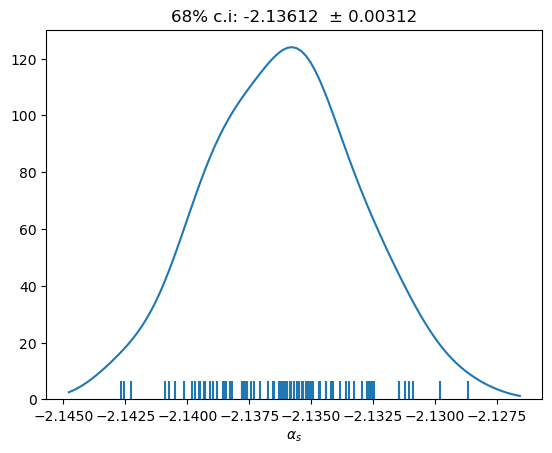

count    61.000000
mean     -2.138599
std       0.002515
min      -2.144366
16%      -2.140667
50%      -2.139013
84%      -2.136229
max      -2.131523
dtype: float64

cv±std = -2.13860 ± 0.00252 
1std interval:  -2.14111 to -2.13608 
68% c.i:        -2.14067 to -2.13623 


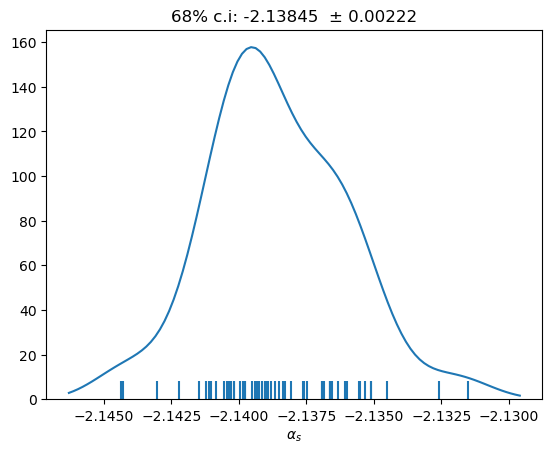

count    79.000000
mean     -2.139016
std       0.002814
min      -2.144148
16%      -2.142226
50%      -2.138905
84%      -2.136669
max      -2.130142
dtype: float64

cv±std = -2.13902 ± 0.00281 
1std interval:  -2.14183 to -2.13620 
68% c.i:        -2.14223 to -2.13667 


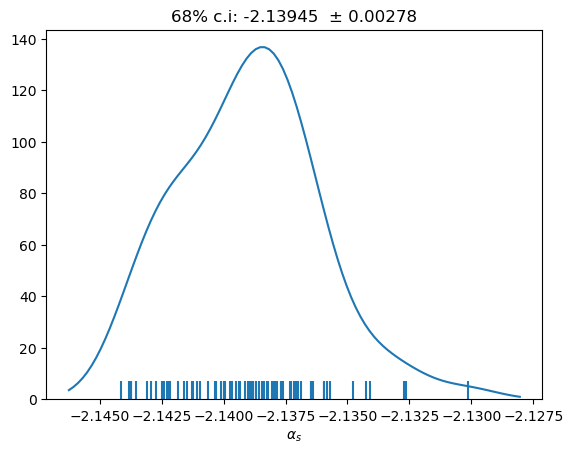

count    76.000000
mean     -2.138697
std       0.002620
min      -2.144649
16%      -2.140878
50%      -2.138863
84%      -2.136494
max      -2.132176
dtype: float64

cv±std = -2.13870 ± 0.00262 
1std interval:  -2.14132 to -2.13608 
68% c.i:        -2.14088 to -2.13649 


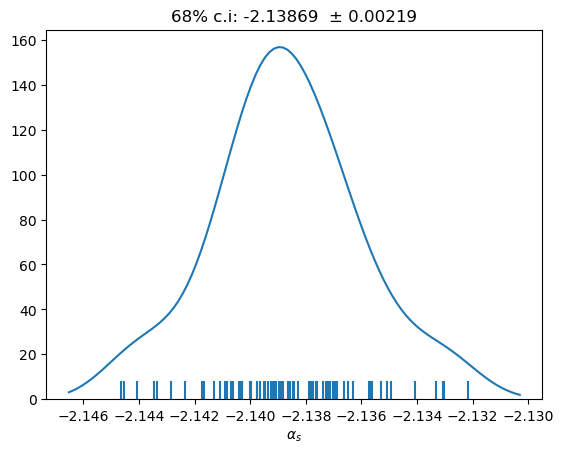

count    62.000000
mean     -2.142299
std       0.003100
min      -2.149177
16%      -2.145377
50%      -2.142255
84%      -2.139066
max      -2.136318
dtype: float64

cv±std = -2.14230 ± 0.00310 
1std interval:  -2.14540 to -2.13920 
68% c.i:        -2.14538 to -2.13907 


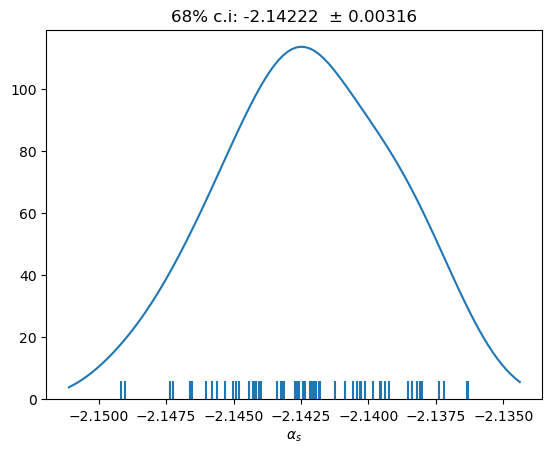

count    87.000000
mean     -2.142076
std       0.003215
min      -2.148238
16%      -2.145105
50%      -2.142410
84%      -2.138456
max      -2.135346
dtype: float64

cv±std = -2.14208 ± 0.00321 
1std interval:  -2.14529 to -2.13886 
68% c.i:        -2.14511 to -2.13846 


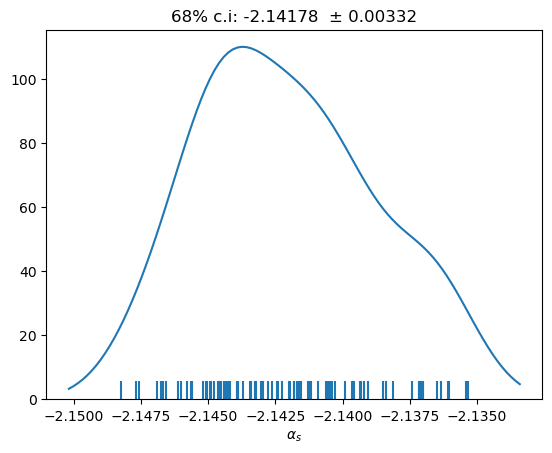

count    80.000000
mean     -2.142475
std       0.003045
min      -2.150367
16%      -2.145400
50%      -2.142265
84%      -2.139744
max      -2.135823
dtype: float64

cv±std = -2.14247 ± 0.00304 
1std interval:  -2.14552 to -2.13943 
68% c.i:        -2.14540 to -2.13974 


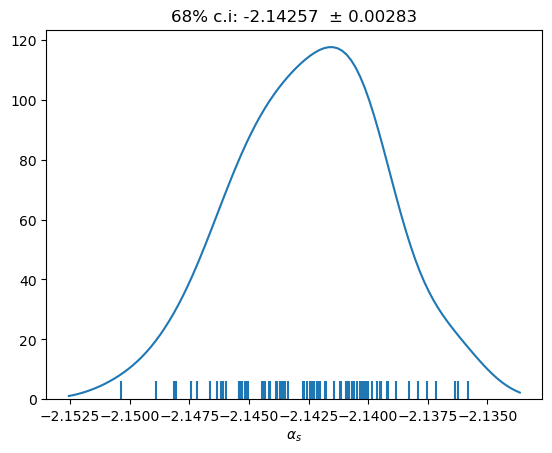

count    62.000000
mean     -2.139756
std       0.002790
min      -2.146470
16%      -2.142052
50%      -2.139824
84%      -2.137551
max      -2.133559
dtype: float64

cv±std = -2.13976 ± 0.00279 
1std interval:  -2.14255 to -2.13697 
68% c.i:        -2.14205 to -2.13755 


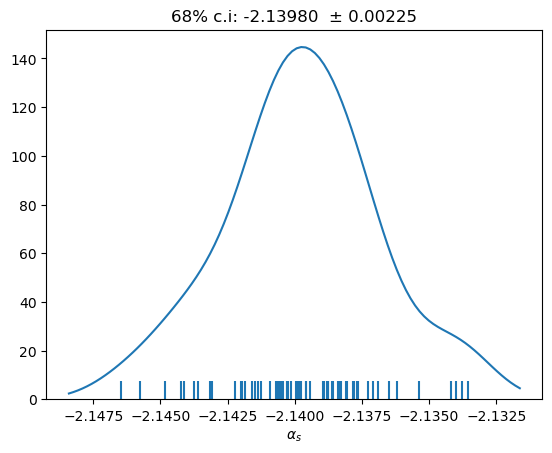

count    81.000000
mean     -2.140218
std       0.003284
min      -2.147617
16%      -2.142997
50%      -2.140086
84%      -2.137051
max      -2.131493
dtype: float64

cv±std = -2.14022 ± 0.00328 
1std interval:  -2.14350 to -2.13693 
68% c.i:        -2.14300 to -2.13705 


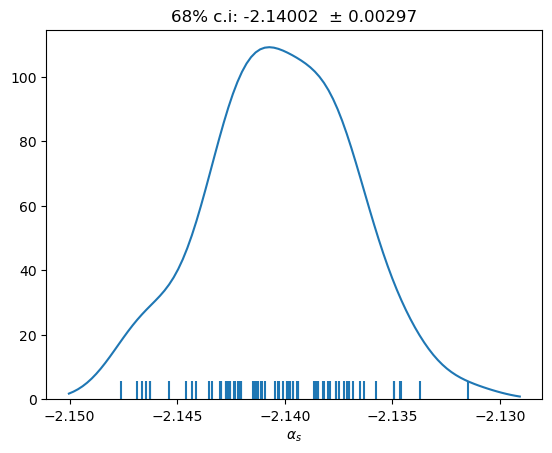

count    80.000000
mean     -2.139939
std       0.002873
min      -2.148660
16%      -2.142190
50%      -2.139554
84%      -2.137626
max      -2.133288
dtype: float64

cv±std = -2.13994 ± 0.00287 
1std interval:  -2.14281 to -2.13707 
68% c.i:        -2.14219 to -2.13763 


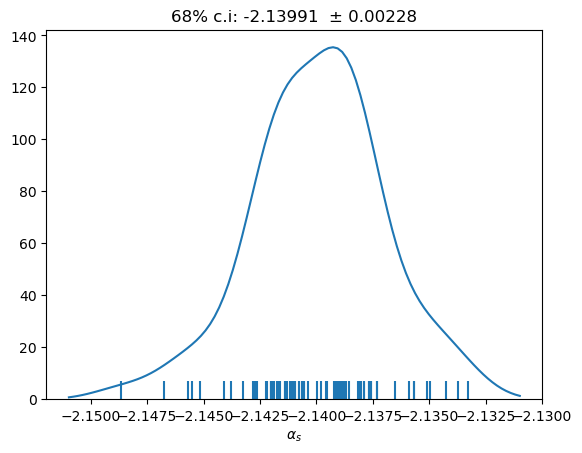

count    66.000000
mean     -2.139874
std       0.003028
min      -2.147287
16%      -2.143015
50%      -2.139886
84%      -2.136916
max      -2.133305
dtype: float64

cv±std = -2.13987 ± 0.00303 
1std interval:  -2.14290 to -2.13685 
68% c.i:        -2.14301 to -2.13692 


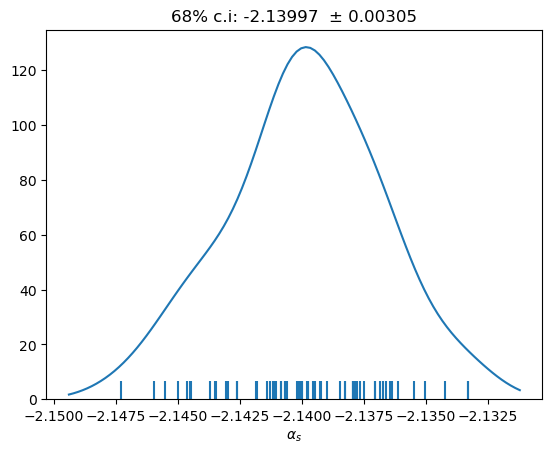

count    74.000000
mean     -2.140210
std       0.003141
min      -2.146910
16%      -2.143509
50%      -2.139841
84%      -2.137320
max      -2.133844
dtype: float64

cv±std = -2.14021 ± 0.00314 
1std interval:  -2.14335 to -2.13707 
68% c.i:        -2.14351 to -2.13732 


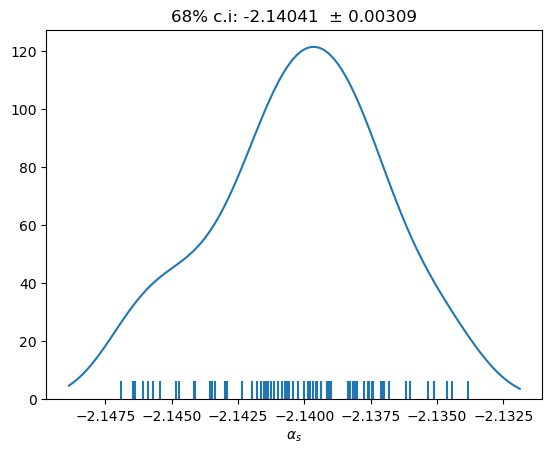

count    79.000000
mean     -2.139723
std       0.002811
min      -2.145730
16%      -2.142512
50%      -2.139751
84%      -2.137166
max      -2.132255
dtype: float64

cv±std = -2.13972 ± 0.00281 
1std interval:  -2.14253 to -2.13691 
68% c.i:        -2.14251 to -2.13717 


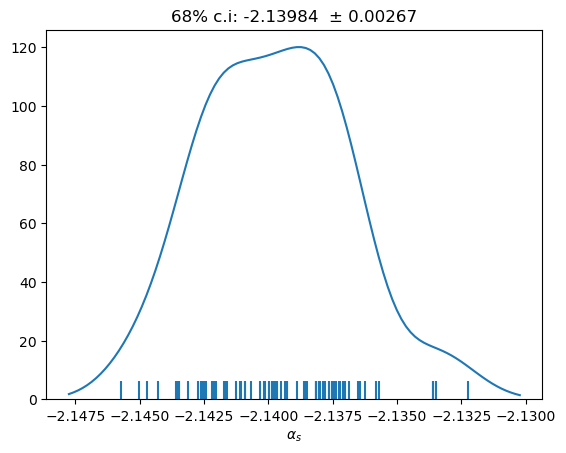

count    63.000000
mean     -2.145232
std       0.002945
min      -2.152966
16%      -2.148296
50%      -2.144798
84%      -2.142826
max      -2.138483
dtype: float64

cv±std = -2.14523 ± 0.00294 
1std interval:  -2.14818 to -2.14229 
68% c.i:        -2.14830 to -2.14283 


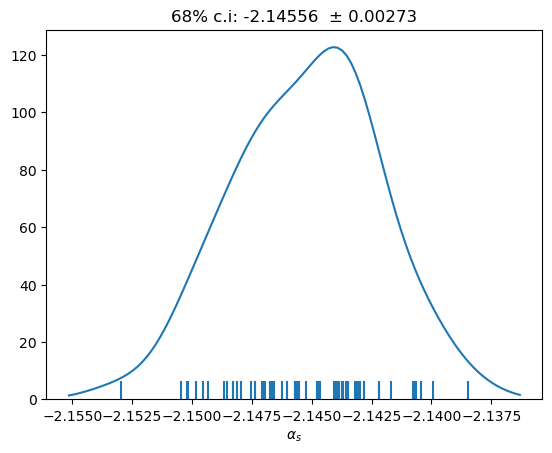

count    80.000000
mean     -2.145595
std       0.002923
min      -2.152113
16%      -2.148807
50%      -2.145209
84%      -2.142616
max      -2.138829
dtype: float64

cv±std = -2.14559 ± 0.00292 
1std interval:  -2.14852 to -2.14267 
68% c.i:        -2.14881 to -2.14262 


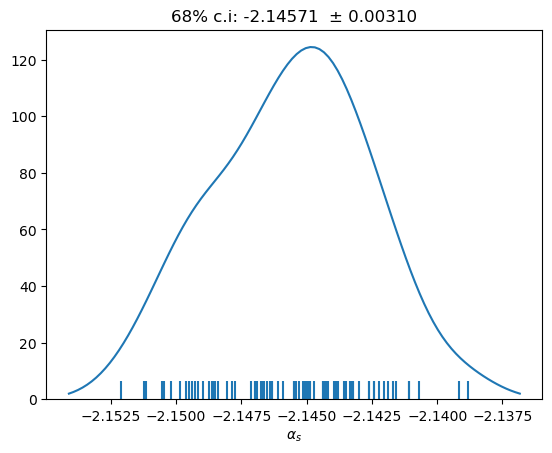

count    83.000000
mean     -2.145537
std       0.002841
min      -2.151507
16%      -2.148449
50%      -2.145977
84%      -2.142659
max      -2.137701
dtype: float64

cv±std = -2.14554 ± 0.00284 
1std interval:  -2.14838 to -2.14270 
68% c.i:        -2.14845 to -2.14266 


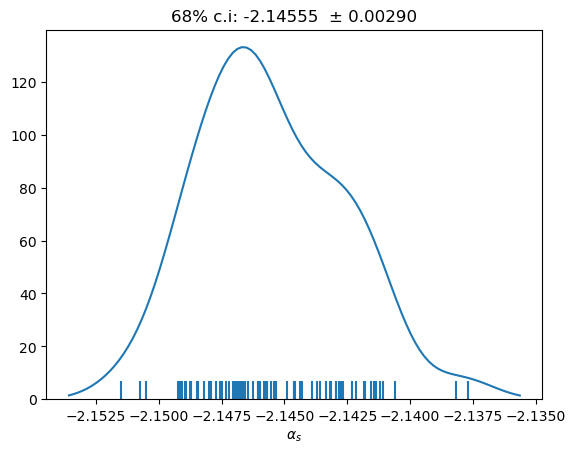

count    60.000000
mean     -2.140453
std       0.002623
min      -2.146908
16%      -2.143063
50%      -2.140432
84%      -2.137825
max      -2.135292
dtype: float64

cv±std = -2.14045 ± 0.00262 
1std interval:  -2.14308 to -2.13783 
68% c.i:        -2.14306 to -2.13782 


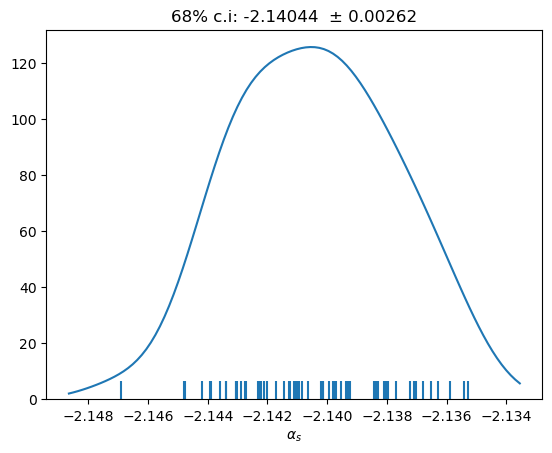

count    79.000000
mean     -2.140551
std       0.002733
min      -2.147153
16%      -2.143122
50%      -2.140771
84%      -2.138007
max      -2.133355
dtype: float64

cv±std = -2.14055 ± 0.00273 
1std interval:  -2.14328 to -2.13782 
68% c.i:        -2.14312 to -2.13801 


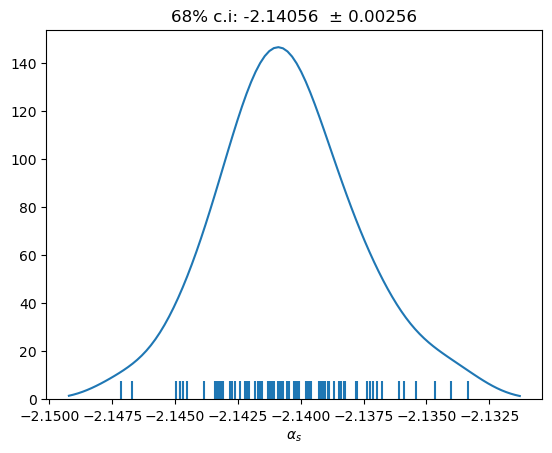

count    84.000000
mean     -2.140063
std       0.002982
min      -2.148412
16%      -2.142857
50%      -2.139880
84%      -2.137393
max      -2.132648
dtype: float64

cv±std = -2.14006 ± 0.00298 
1std interval:  -2.14304 to -2.13708 
68% c.i:        -2.14286 to -2.13739 


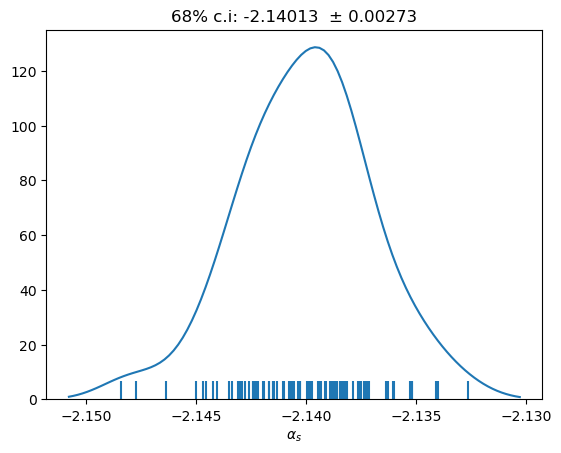

count    58.000000
mean     -2.141218
std       0.002766
min      -2.146968
16%      -2.144220
50%      -2.141453
84%      -2.138237
max      -2.135022
dtype: float64

cv±std = -2.14122 ± 0.00277 
1std interval:  -2.14398 to -2.13845 
68% c.i:        -2.14422 to -2.13824 


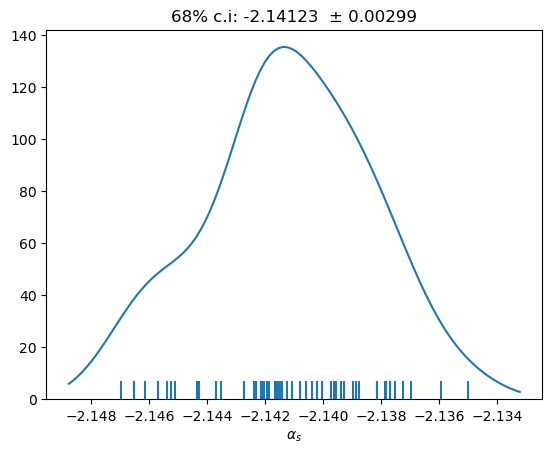

count    78.000000
mean     -2.141439
std       0.002783
min      -2.148658
16%      -2.144519
50%      -2.141209
84%      -2.138721
max      -2.136156
dtype: float64

cv±std = -2.14144 ± 0.00278 
1std interval:  -2.14422 to -2.13866 
68% c.i:        -2.14452 to -2.13872 


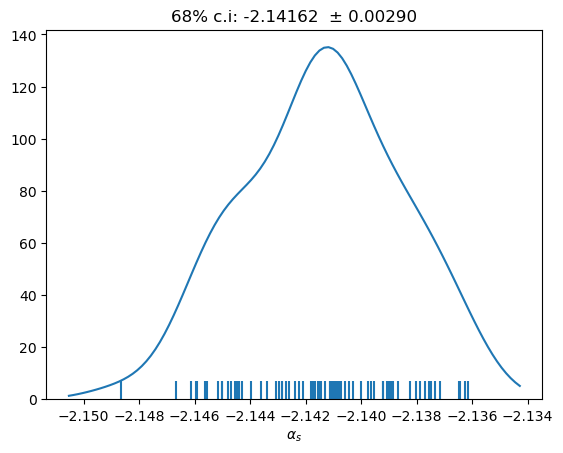

count    76.000000
mean     -2.141554
std       0.002993
min      -2.148086
16%      -2.144951
50%      -2.141684
84%      -2.138059
max      -2.134299
dtype: float64

cv±std = -2.14155 ± 0.00299 
1std interval:  -2.14455 to -2.13856 
68% c.i:        -2.14495 to -2.13806 


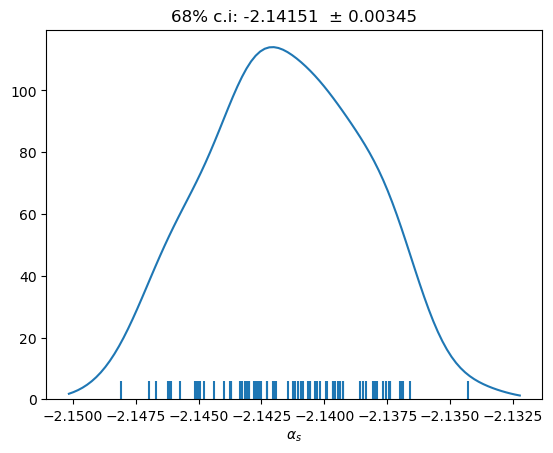

count    64.000000
mean     -2.140200
std       0.002799
min      -2.146388
16%      -2.143020
50%      -2.139583
84%      -2.137427
max      -2.134723
dtype: float64

cv±std = -2.14020 ± 0.00280 
1std interval:  -2.14300 to -2.13740 
68% c.i:        -2.14302 to -2.13743 


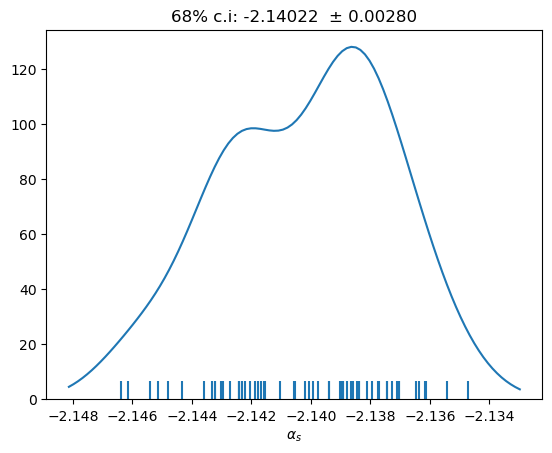

count    74.000000
mean     -2.140149
std       0.002825
min      -2.146824
16%      -2.142959
50%      -2.140193
84%      -2.137454
max      -2.132129
dtype: float64

cv±std = -2.14015 ± 0.00282 
1std interval:  -2.14297 to -2.13732 
68% c.i:        -2.14296 to -2.13745 


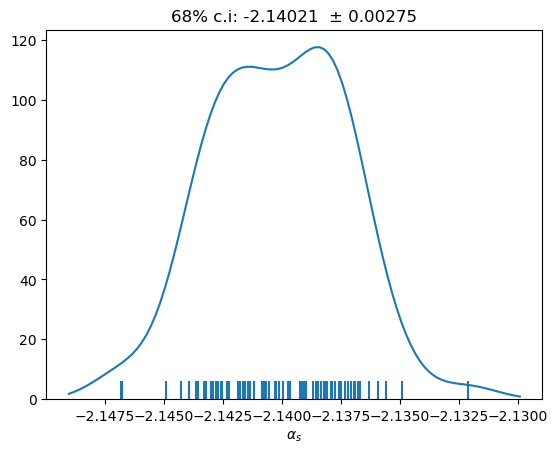

count    81.000000
mean     -2.140321
std       0.002919
min      -2.146272
16%      -2.143748
50%      -2.140103
84%      -2.137498
max      -2.133122
dtype: float64

cv±std = -2.14032 ± 0.00292 
1std interval:  -2.14324 to -2.13740 
68% c.i:        -2.14375 to -2.13750 


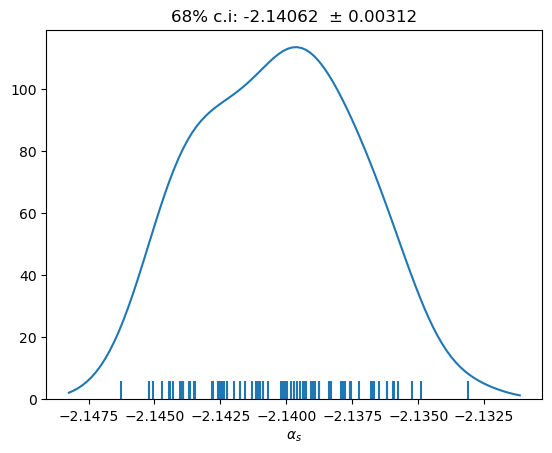

count    62.000000
mean     -2.138768
std       0.002756
min      -2.145818
16%      -2.141219
50%      -2.138974
84%      -2.135746
max      -2.133299
dtype: float64

cv±std = -2.13877 ± 0.00276 
1std interval:  -2.14152 to -2.13601 
68% c.i:        -2.14122 to -2.13575 


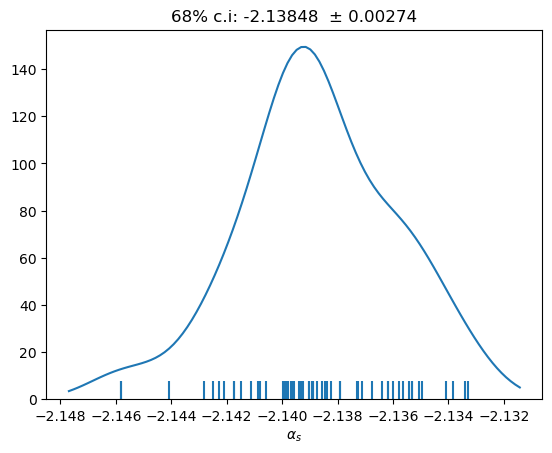

count    82.000000
mean     -2.139497
std       0.002987
min      -2.145316
16%      -2.142587
50%      -2.139459
84%      -2.136768
max      -2.131074
dtype: float64

cv±std = -2.13950 ± 0.00299 
1std interval:  -2.14248 to -2.13651 
68% c.i:        -2.14259 to -2.13677 


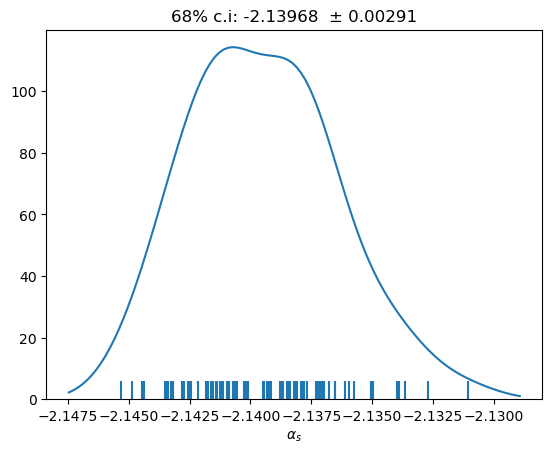

count    80.000000
mean     -2.139190
std       0.002777
min      -2.144460
16%      -2.142036
50%      -2.139757
84%      -2.136408
max      -2.132716
dtype: float64

cv±std = -2.13919 ± 0.00278 
1std interval:  -2.14197 to -2.13641 
68% c.i:        -2.14204 to -2.13641 


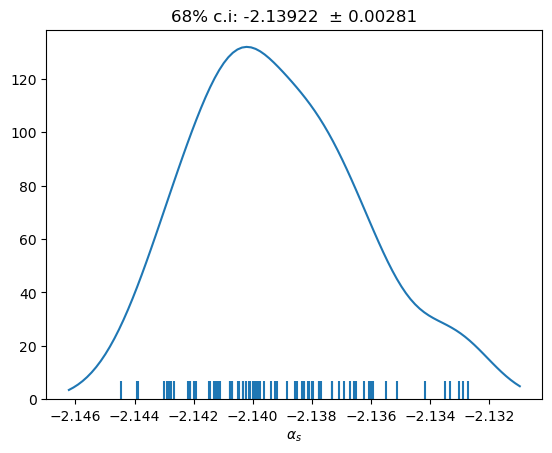

count    67.000000
mean     -2.141185
std       0.002730
min      -2.146956
16%      -2.143648
50%      -2.141247
84%      -2.138601
max      -2.133721
dtype: float64

cv±std = -2.14119 ± 0.00273 
1std interval:  -2.14392 to -2.13845 
68% c.i:        -2.14365 to -2.13860 


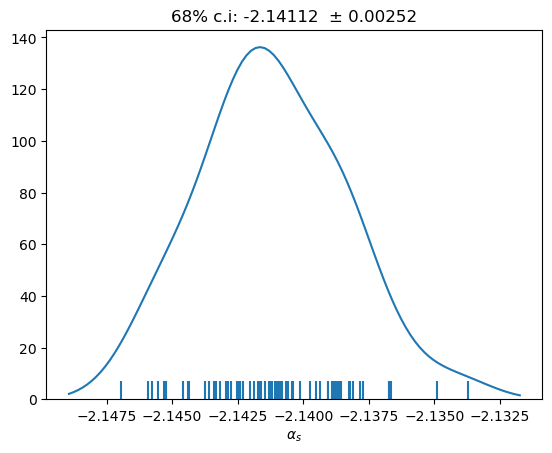

count    91.000000
mean     -2.141436
std       0.002375
min      -2.147186
16%      -2.143782
50%      -2.141313
84%      -2.139538
max      -2.134153
dtype: float64

cv±std = -2.14144 ± 0.00238 
1std interval:  -2.14381 to -2.13906 
68% c.i:        -2.14378 to -2.13954 


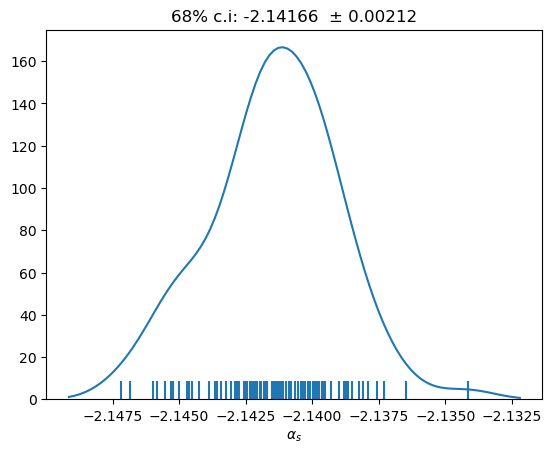

count    78.000000
mean     -2.141478
std       0.002575
min      -2.149433
16%      -2.143709
50%      -2.141654
84%      -2.138910
max      -2.134054
dtype: float64

cv±std = -2.14148 ± 0.00258 
1std interval:  -2.14405 to -2.13890 
68% c.i:        -2.14371 to -2.13891 


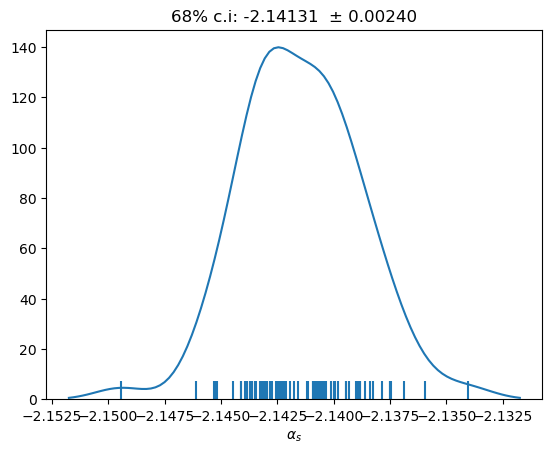

count    63.000000
mean     -2.136996
std       0.002977
min      -2.147437
16%      -2.139594
50%      -2.137344
84%      -2.134520
max      -2.129985
dtype: float64

cv±std = -2.13700 ± 0.00298 
1std interval:  -2.13997 to -2.13402 
68% c.i:        -2.13959 to -2.13452 


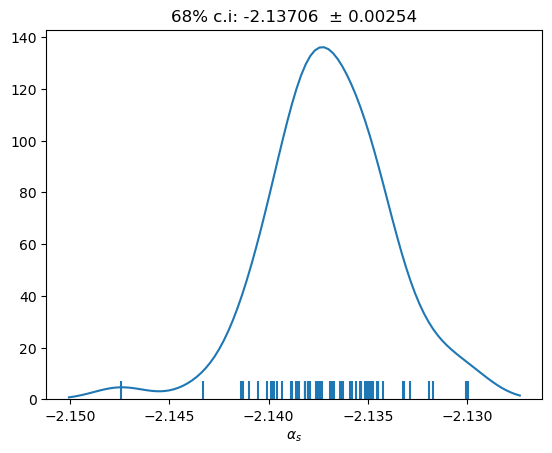

count    87.000000
mean     -2.137440
std       0.003138
min      -2.145837
16%      -2.140797
50%      -2.137223
84%      -2.134328
max      -2.130824
dtype: float64

cv±std = -2.13744 ± 0.00314 
1std interval:  -2.14058 to -2.13430 
68% c.i:        -2.14080 to -2.13433 


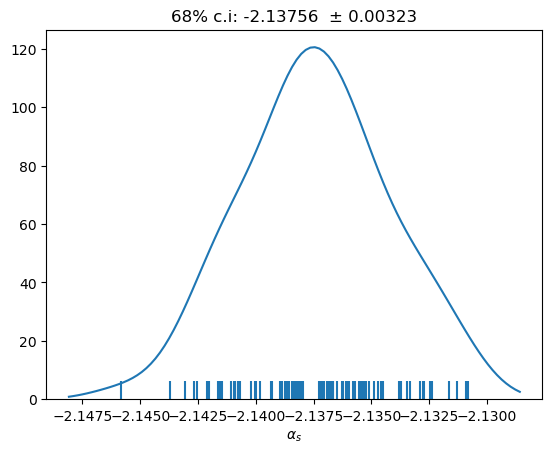

count    73.000000
mean     -2.137390
std       0.002983
min      -2.146408
16%      -2.140223
50%      -2.137478
84%      -2.134328
max      -2.129814
dtype: float64

cv±std = -2.13739 ± 0.00298 
1std interval:  -2.14037 to -2.13441 
68% c.i:        -2.14022 to -2.13433 


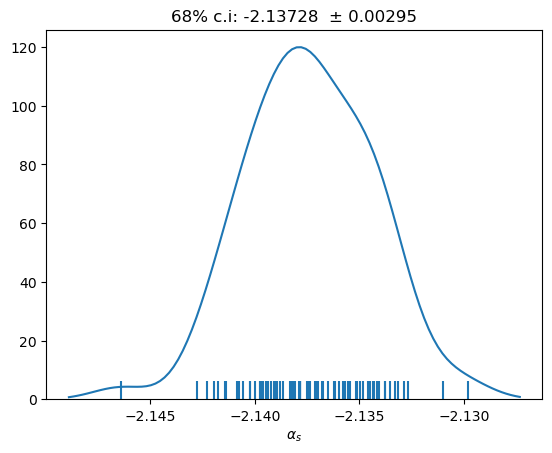

count    59.000000
mean     -2.138177
std       0.002905
min      -2.145018
16%      -2.140851
50%      -2.138380
84%      -2.135790
max      -2.130692
dtype: float64

cv±std = -2.13818 ± 0.00291 
1std interval:  -2.14108 to -2.13527 
68% c.i:        -2.14085 to -2.13579 


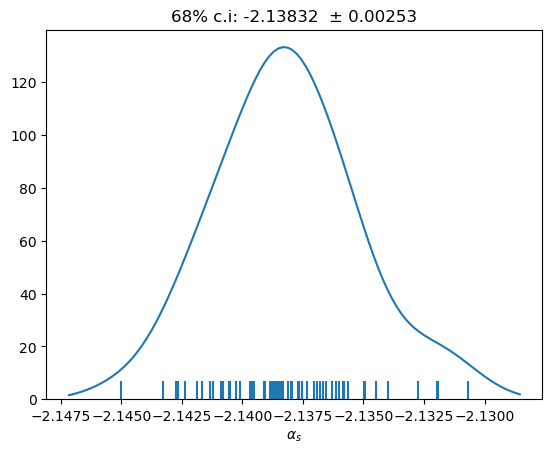

count    81.000000
mean     -2.138504
std       0.002931
min      -2.145520
16%      -2.141434
50%      -2.138733
84%      -2.135537
max      -2.131860
dtype: float64

cv±std = -2.13850 ± 0.00293 
1std interval:  -2.14143 to -2.13557 
68% c.i:        -2.14143 to -2.13554 


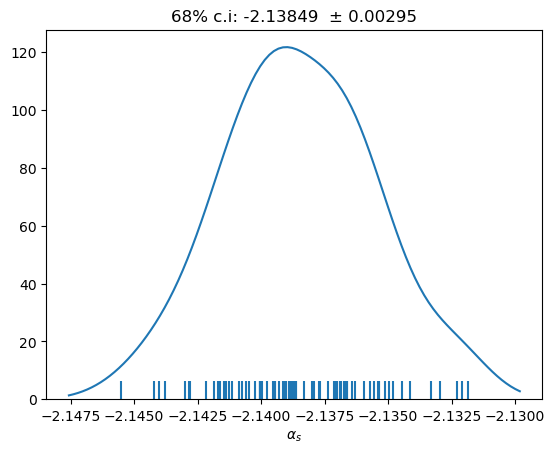

count    74.000000
mean     -2.138531
std       0.003182
min      -2.145984
16%      -2.141486
50%      -2.138500
84%      -2.135882
max      -2.131494
dtype: float64

cv±std = -2.13853 ± 0.00318 
1std interval:  -2.14171 to -2.13535 
68% c.i:        -2.14149 to -2.13588 


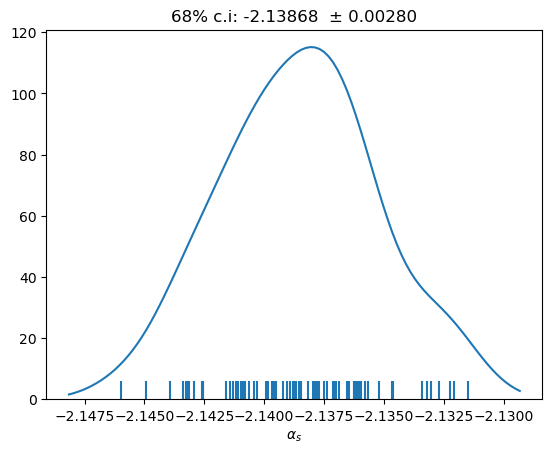

count    58.000000
mean     -2.138367
std       0.003158
min      -2.147158
16%      -2.141192
50%      -2.138574
84%      -2.135427
max      -2.132294
dtype: float64

cv±std = -2.13837 ± 0.00316 
1std interval:  -2.14153 to -2.13521 
68% c.i:        -2.14119 to -2.13543 


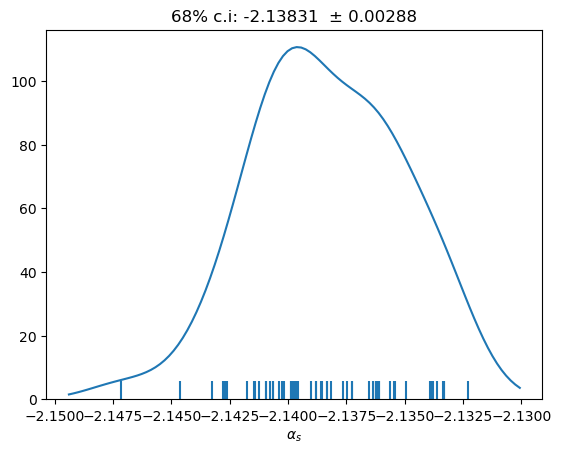

count    89.000000
mean     -2.138657
std       0.002818
min      -2.146062
16%      -2.141088
50%      -2.138573
84%      -2.135450
max      -2.132252
dtype: float64

cv±std = -2.13866 ± 0.00282 
1std interval:  -2.14148 to -2.13584 
68% c.i:        -2.14109 to -2.13545 


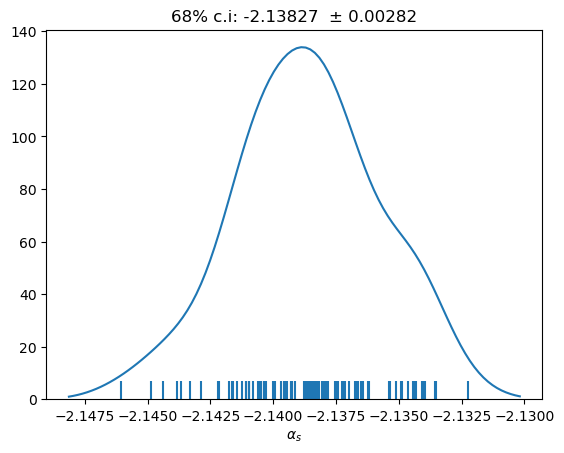

count    79.000000
mean     -2.138787
std       0.003165
min      -2.149163
16%      -2.141965
50%      -2.138607
84%      -2.135419
max      -2.132652
dtype: float64

cv±std = -2.13879 ± 0.00317 
1std interval:  -2.14195 to -2.13562 
68% c.i:        -2.14196 to -2.13542 


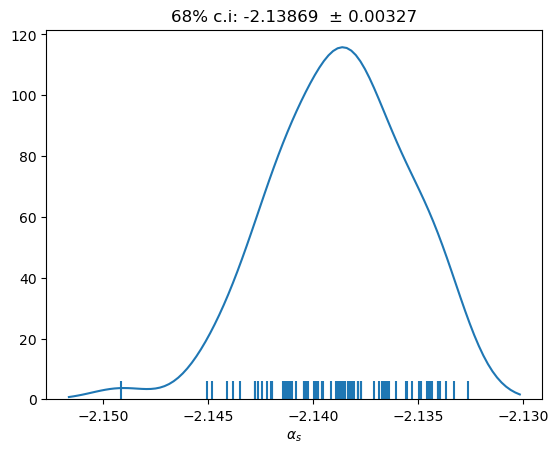

count    60.000000
mean     -2.140852
std       0.003164
min      -2.149214
16%      -2.143810
50%      -2.140309
84%      -2.137924
max      -2.134186
dtype: float64

cv±std = -2.14085 ± 0.00316 
1std interval:  -2.14402 to -2.13769 
68% c.i:        -2.14381 to -2.13792 


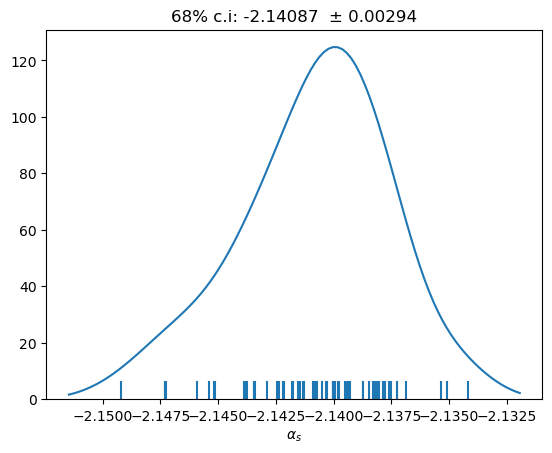

count    66.000000
mean     -2.140870
std       0.003220
min      -2.150153
16%      -2.143727
50%      -2.140935
84%      -2.137555
max      -2.133869
dtype: float64

cv±std = -2.14087 ± 0.00322 
1std interval:  -2.14409 to -2.13765 
68% c.i:        -2.14373 to -2.13756 


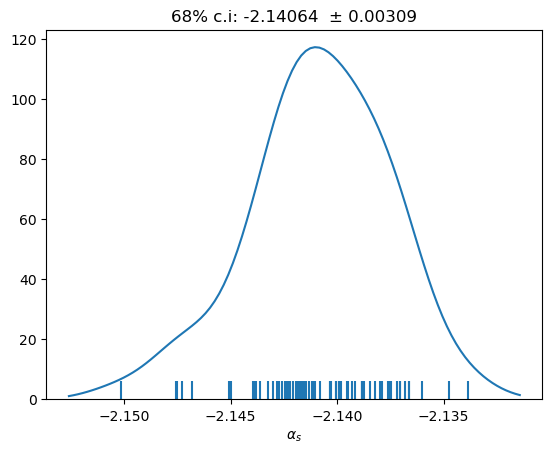

count    82.000000
mean     -2.140855
std       0.002997
min      -2.147260
16%      -2.144037
50%      -2.140422
84%      -2.138602
max      -2.133613
dtype: float64

cv±std = -2.14085 ± 0.00300 
1std interval:  -2.14385 to -2.13786 
68% c.i:        -2.14404 to -2.13860 


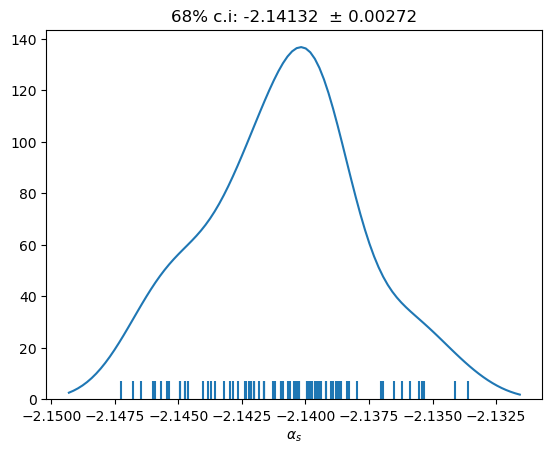

count    68.000000
mean     -2.139350
std       0.002918
min      -2.144314
16%      -2.142627
50%      -2.139753
84%      -2.136046
max      -2.132792
dtype: float64

cv±std = -2.13935 ± 0.00292 
1std interval:  -2.14227 to -2.13643 
68% c.i:        -2.14263 to -2.13605 


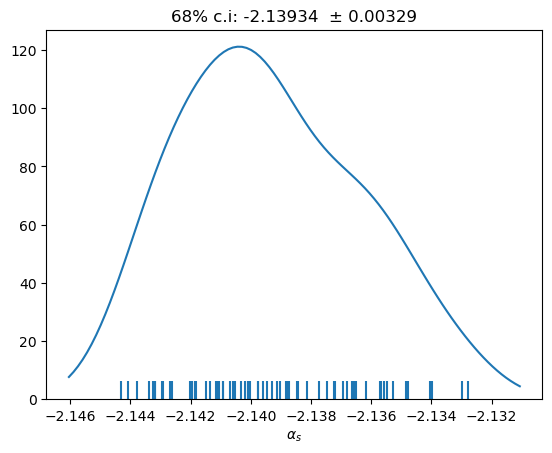

count    79.000000
mean     -2.139908
std       0.003035
min      -2.146695
16%      -2.142824
50%      -2.140059
84%      -2.136727
max      -2.132905
dtype: float64

cv±std = -2.13991 ± 0.00303 
1std interval:  -2.14294 to -2.13687 
68% c.i:        -2.14282 to -2.13673 


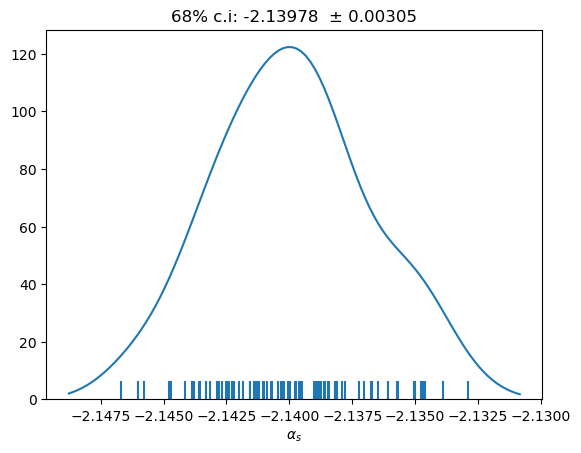

count    81.000000
mean     -2.140039
std       0.002868
min      -2.145624
16%      -2.143322
50%      -2.139815
84%      -2.137007
max      -2.133780
dtype: float64

cv±std = -2.14004 ± 0.00287 
1std interval:  -2.14291 to -2.13717 
68% c.i:        -2.14332 to -2.13701 


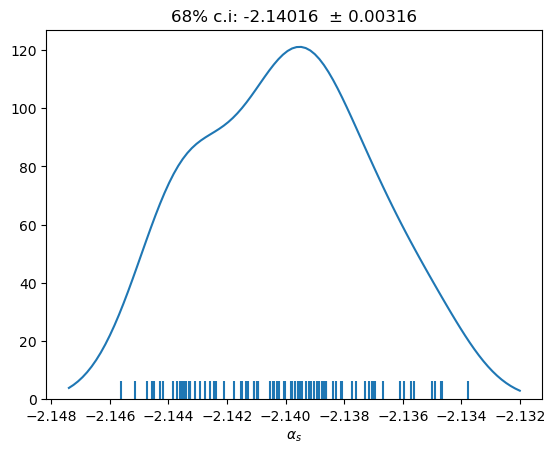

count    61.000000
mean     -2.135825
std       0.002903
min      -2.141701
16%      -2.138971
50%      -2.135548
84%      -2.133537
max      -2.128067
dtype: float64

cv±std = -2.13583 ± 0.00290 
1std interval:  -2.13873 to -2.13292 
68% c.i:        -2.13897 to -2.13354 


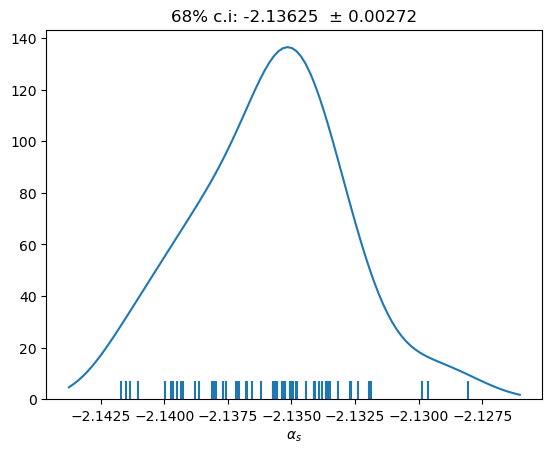

count    87.000000
mean     -2.136094
std       0.002973
min      -2.145059
16%      -2.138931
50%      -2.135735
84%      -2.133192
max      -2.130084
dtype: float64

cv±std = -2.13609 ± 0.00297 
1std interval:  -2.13907 to -2.13312 
68% c.i:        -2.13893 to -2.13319 


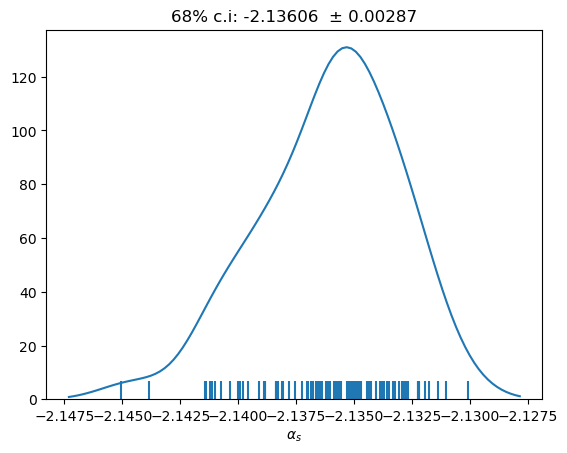

count    81.000000
mean     -2.136248
std       0.002684
min      -2.143155
16%      -2.139165
50%      -2.135639
84%      -2.133545
max      -2.131221
dtype: float64

cv±std = -2.13625 ± 0.00268 
1std interval:  -2.13893 to -2.13356 
68% c.i:        -2.13917 to -2.13354 


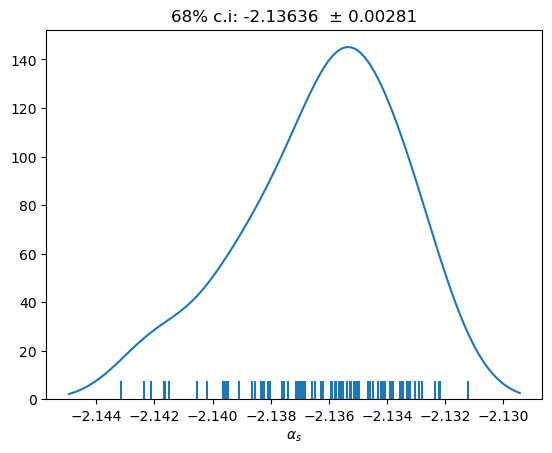

count    58.000000
mean     -2.137925
std       0.003056
min      -2.144744
16%      -2.141243
50%      -2.137665
84%      -2.134980
max      -2.131211
dtype: float64

cv±std = -2.13792 ± 0.00306 
1std interval:  -2.14098 to -2.13487 
68% c.i:        -2.14124 to -2.13498 


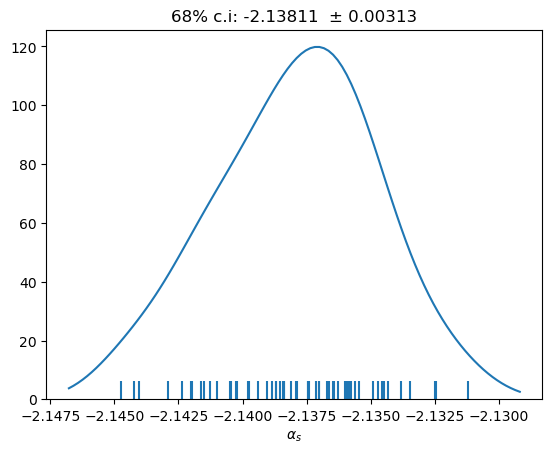

count    79.000000
mean     -2.138101
std       0.003634
min      -2.146343
16%      -2.141678
50%      -2.138140
84%      -2.134203
max      -2.129717
dtype: float64

cv±std = -2.13810 ± 0.00363 
1std interval:  -2.14174 to -2.13447 
68% c.i:        -2.14168 to -2.13420 


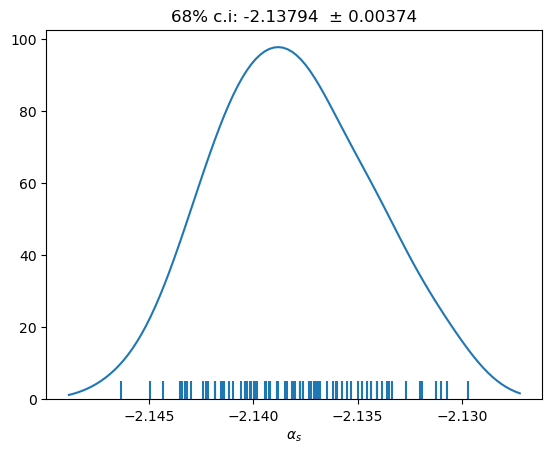

count    81.000000
mean     -2.137929
std       0.003278
min      -2.145878
16%      -2.140717
50%      -2.138002
84%      -2.134823
max      -2.129571
dtype: float64

cv±std = -2.13793 ± 0.00328 
1std interval:  -2.14121 to -2.13465 
68% c.i:        -2.14072 to -2.13482 


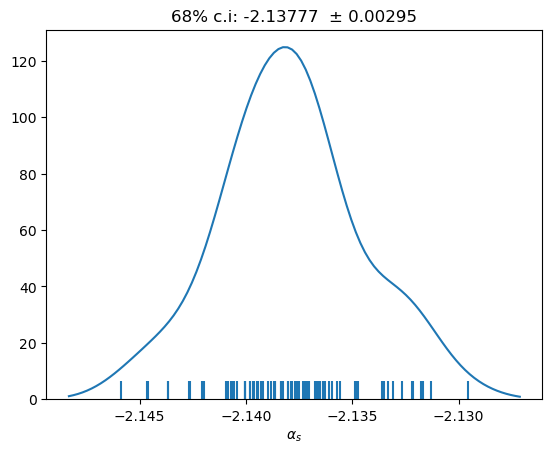

count    67.000000
mean     -2.136387
std       0.003005
min      -2.143274
16%      -2.138849
50%      -2.136346
84%      -2.133820
max      -2.128548
dtype: float64

cv±std = -2.13639 ± 0.00301 
1std interval:  -2.13939 to -2.13338 
68% c.i:        -2.13885 to -2.13382 


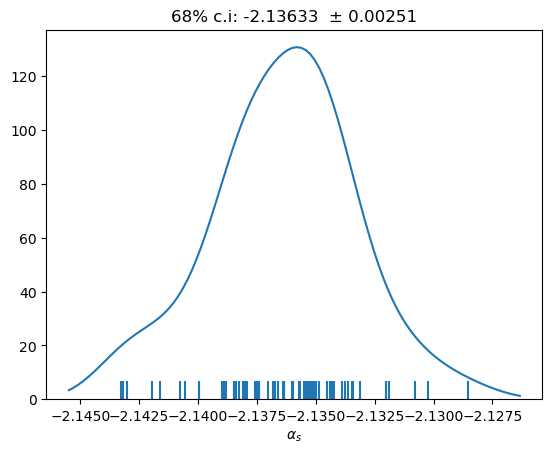

count    81.000000
mean     -2.136508
std       0.002988
min      -2.143154
16%      -2.140154
50%      -2.136179
84%      -2.133840
max      -2.129950
dtype: float64

cv±std = -2.13651 ± 0.00299 
1std interval:  -2.13950 to -2.13352 
68% c.i:        -2.14015 to -2.13384 


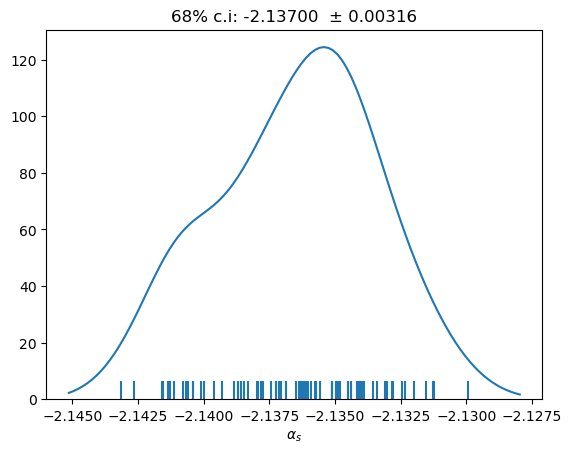

count    83.000000
mean     -2.136497
std       0.002718
min      -2.143339
16%      -2.139231
50%      -2.136595
84%      -2.133873
max      -2.128210
dtype: float64

cv±std = -2.13650 ± 0.00272 
1std interval:  -2.13921 to -2.13378 
68% c.i:        -2.13923 to -2.13387 


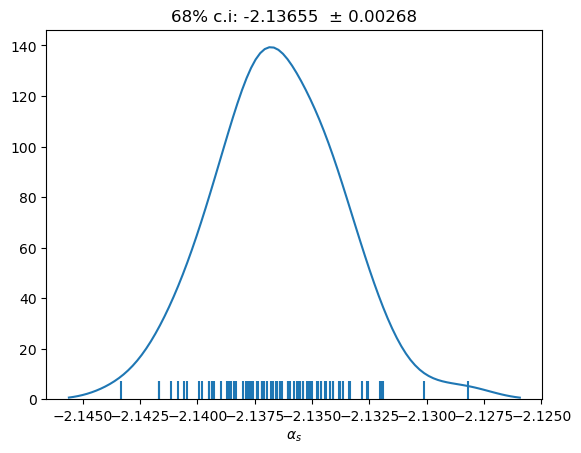

count    61.000000
mean     -2.138197
std       0.003292
min      -2.148037
16%      -2.141038
50%      -2.138034
84%      -2.134736
max      -2.130630
dtype: float64

cv±std = -2.13820 ± 0.00329 
1std interval:  -2.14149 to -2.13490 
68% c.i:        -2.14104 to -2.13474 


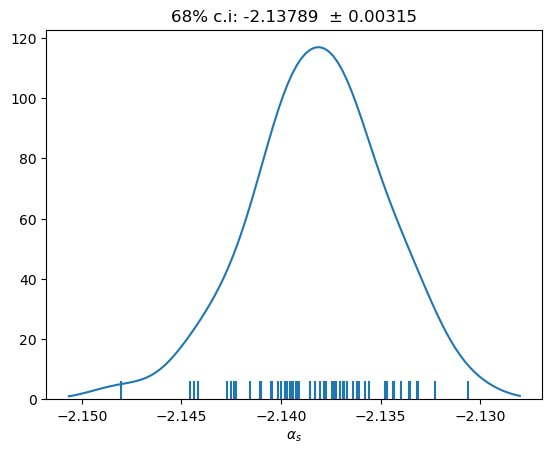

count    80.000000
mean     -2.138693
std       0.003070
min      -2.145254
16%      -2.141317
50%      -2.138887
84%      -2.135280
max      -2.132296
dtype: float64

cv±std = -2.13869 ± 0.00307 
1std interval:  -2.14176 to -2.13562 
68% c.i:        -2.14132 to -2.13528 


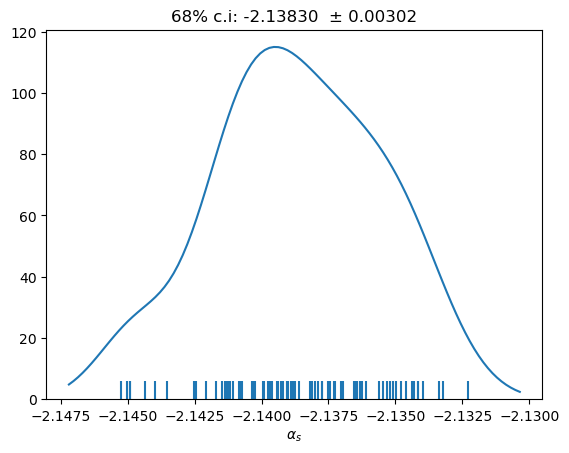

count    78.000000
mean     -2.138268
std       0.002802
min      -2.145710
16%      -2.140480
50%      -2.138599
84%      -2.135421
max      -2.131541
dtype: float64

cv±std = -2.13827 ± 0.00280 
1std interval:  -2.14107 to -2.13547 
68% c.i:        -2.14048 to -2.13542 


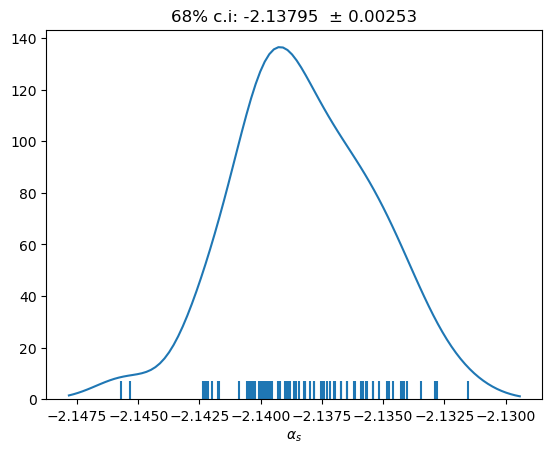

count    60.000000
mean     -2.139280
std       0.002908
min      -2.145937
16%      -2.142157
50%      -2.138998
84%      -2.136457
max      -2.132635
dtype: float64

cv±std = -2.13928 ± 0.00291 
1std interval:  -2.14219 to -2.13637 
68% c.i:        -2.14216 to -2.13646 


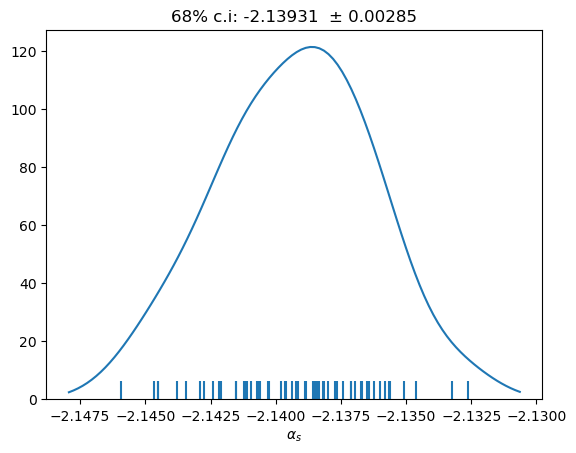

count    81.000000
mean     -2.139931
std       0.003076
min      -2.148081
16%      -2.143247
50%      -2.140041
84%      -2.137117
max      -2.133487
dtype: float64

cv±std = -2.13993 ± 0.00308 
1std interval:  -2.14301 to -2.13685 
68% c.i:        -2.14325 to -2.13712 


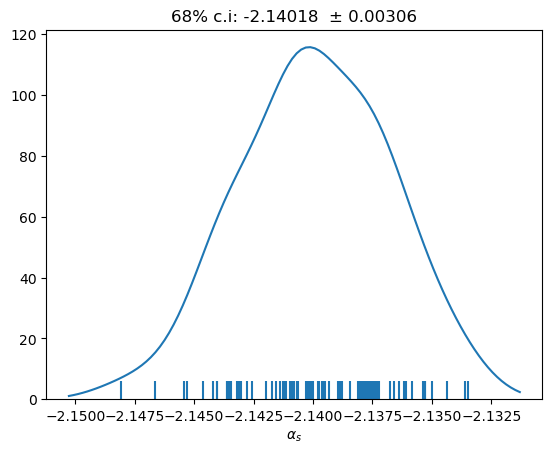

count    79.000000
mean     -2.139652
std       0.002806
min      -2.146445
16%      -2.142251
50%      -2.139672
84%      -2.137008
max      -2.133517
dtype: float64

cv±std = -2.13965 ± 0.00281 
1std interval:  -2.14246 to -2.13685 
68% c.i:        -2.14225 to -2.13701 


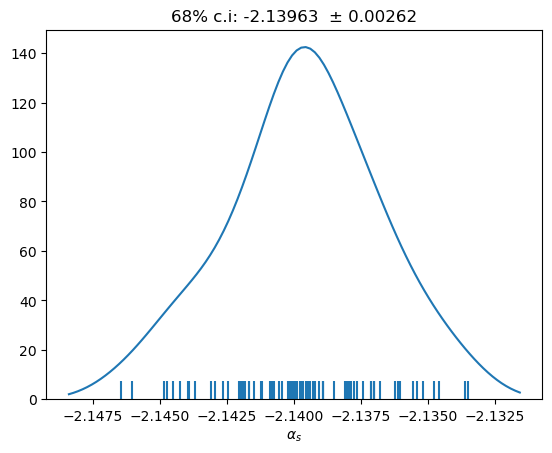

count    58.000000
mean     -2.141063
std       0.002646
min      -2.147441
16%      -2.143673
50%      -2.141070
84%      -2.138950
max      -2.134332
dtype: float64

cv±std = -2.14106 ± 0.00265 
1std interval:  -2.14371 to -2.13842 
68% c.i:        -2.14367 to -2.13895 


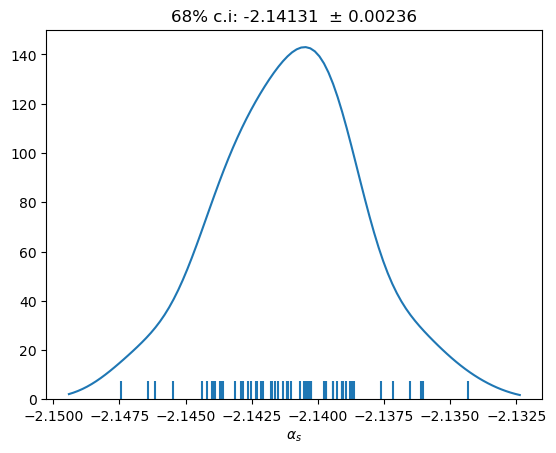

count    66.000000
mean     -2.142183
std       0.003146
min      -2.149608
16%      -2.145405
50%      -2.142363
84%      -2.139062
max      -2.135705
dtype: float64

cv±std = -2.14218 ± 0.00315 
1std interval:  -2.14533 to -2.13904 
68% c.i:        -2.14541 to -2.13906 


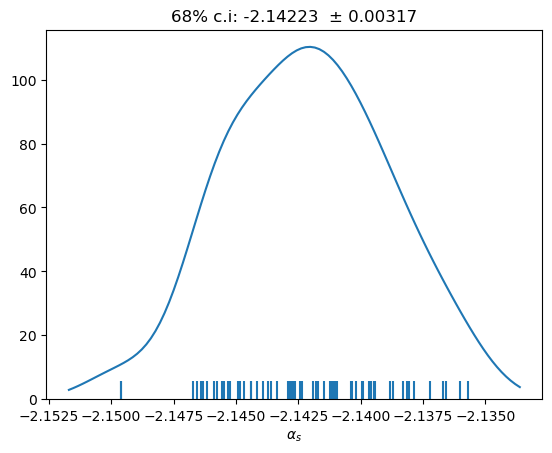

count    79.000000
mean     -2.142045
std       0.002869
min      -2.148142
16%      -2.145252
50%      -2.142176
84%      -2.138752
max      -2.136050
dtype: float64

cv±std = -2.14205 ± 0.00287 
1std interval:  -2.14491 to -2.13918 
68% c.i:        -2.14525 to -2.13875 


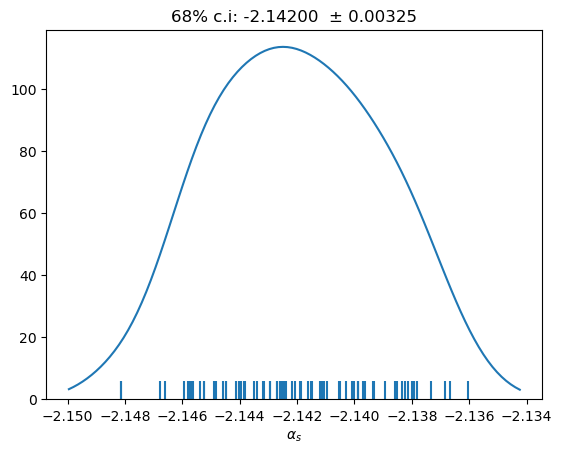

count    203.000000
mean      -2.137588
std        0.002963
min       -2.146673
16%       -2.140589
50%       -2.137432
84%       -2.134496
max       -2.130310
dtype: float64

cv±std = -2.13759 ± 0.00296 
1std interval:  -2.14055 to -2.13462 
68% c.i:        -2.14059 to -2.13450 


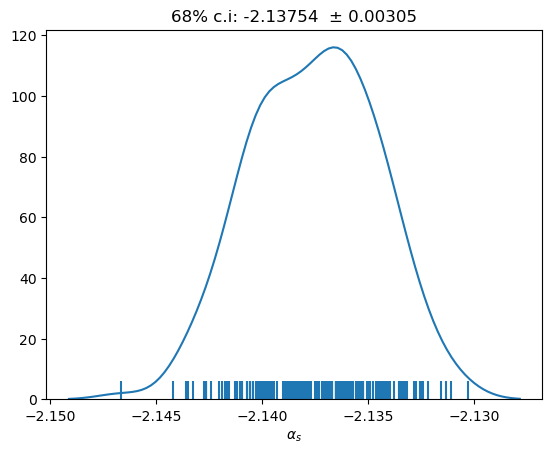

count    229.000000
mean      -2.135968
std        0.003199
min       -2.145541
16%       -2.138950
50%       -2.135980
84%       -2.132741
max       -2.127379
dtype: float64

cv±std = -2.13597 ± 0.00320 
1std interval:  -2.13917 to -2.13277 
68% c.i:        -2.13895 to -2.13274 


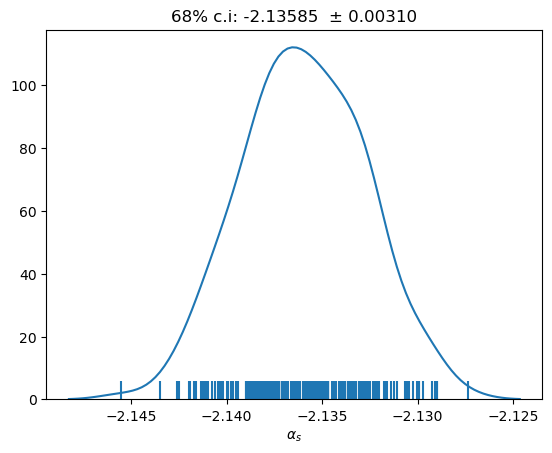

count    236.000000
mean      -2.138751
std        0.002898
min       -2.146060
16%       -2.141759
50%       -2.138785
84%       -2.135919
max       -2.130526
dtype: float64

cv±std = -2.13875 ± 0.00290 
1std interval:  -2.14165 to -2.13585 
68% c.i:        -2.14176 to -2.13592 


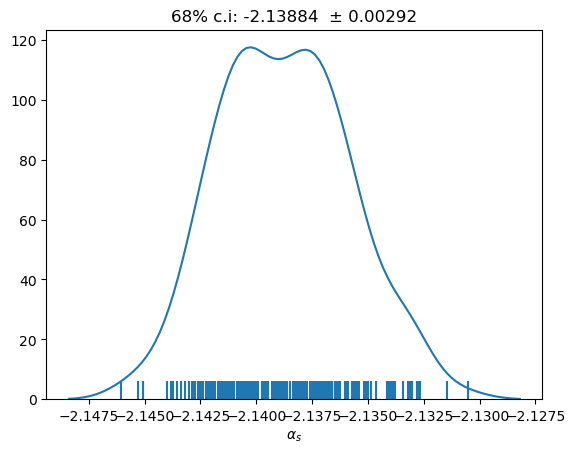

count    223.000000
mean      -2.136228
std        0.003234
min       -2.144137
16%       -2.139602
50%       -2.136095
84%       -2.132802
max       -2.127715
dtype: float64

cv±std = -2.13623 ± 0.00323 
1std interval:  -2.13946 to -2.13299 
68% c.i:        -2.13960 to -2.13280 


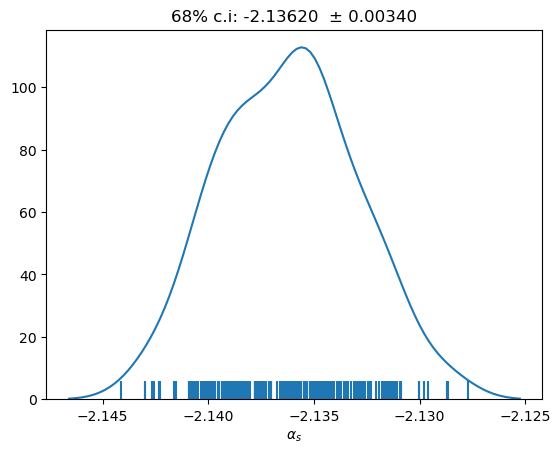

count    216.000000
mean      -2.138786
std        0.002658
min       -2.144649
16%       -2.141235
50%       -2.138915
84%       -2.136473
max       -2.130142
dtype: float64

cv±std = -2.13879 ± 0.00266 
1std interval:  -2.14144 to -2.13613 
68% c.i:        -2.14124 to -2.13647 


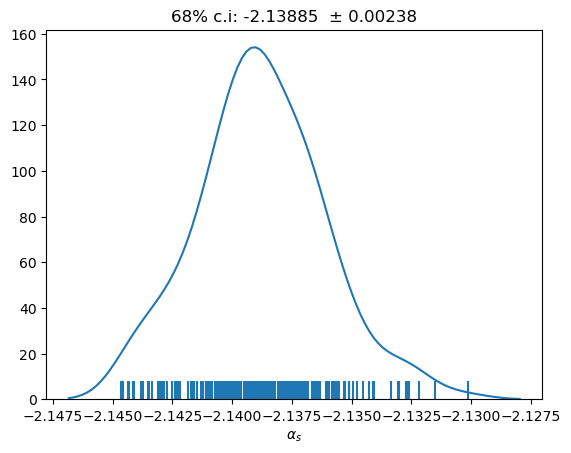

count    229.000000
mean      -2.142275
std        0.003116
min       -2.150367
16%       -2.145393
50%       -2.142271
84%       -2.139217
max       -2.135346
dtype: float64

cv±std = -2.14228 ± 0.00312 
1std interval:  -2.14539 to -2.13916 
68% c.i:        -2.14539 to -2.13922 


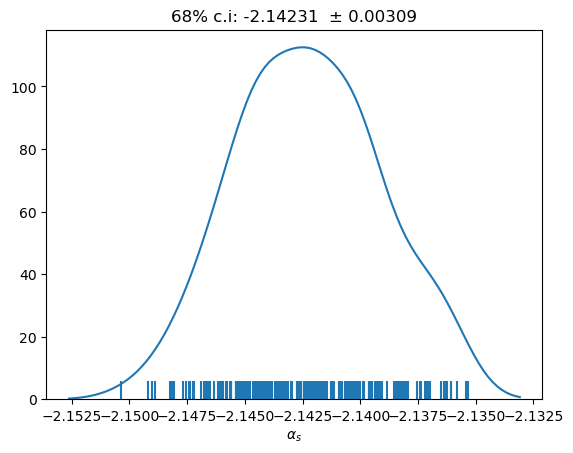

count    223.000000
mean      -2.139989
std        0.003000
min       -2.148660
16%       -2.142712
50%       -2.139861
84%       -2.137319
max       -2.131493
dtype: float64

cv±std = -2.13999 ± 0.00300 
1std interval:  -2.14299 to -2.13699 
68% c.i:        -2.14271 to -2.13732 


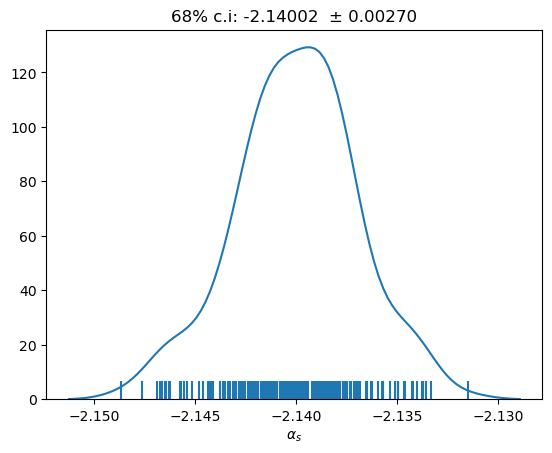

count    219.000000
mean      -2.139933
std        0.002984
min       -2.147287
16%       -2.142961
50%       -2.139813
84%       -2.137086
max       -2.132255
dtype: float64

cv±std = -2.13993 ± 0.00298 
1std interval:  -2.14292 to -2.13695 
68% c.i:        -2.14296 to -2.13709 


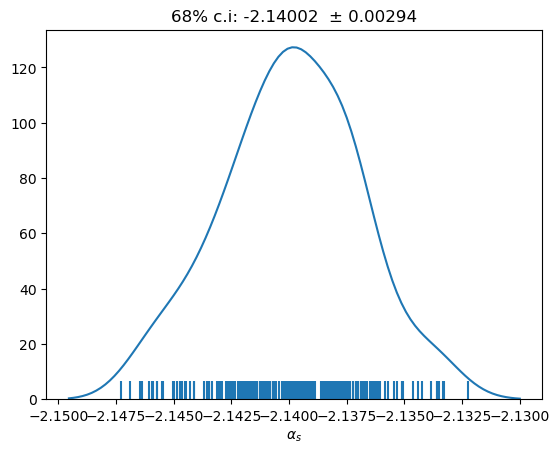

count    226.000000
mean      -2.145473
std        0.002890
min       -2.152966
16%       -2.148531
50%       -2.145519
84%       -2.142655
max       -2.137701
dtype: float64

cv±std = -2.14547 ± 0.00289 
1std interval:  -2.14836 to -2.14258 
68% c.i:        -2.14853 to -2.14266 


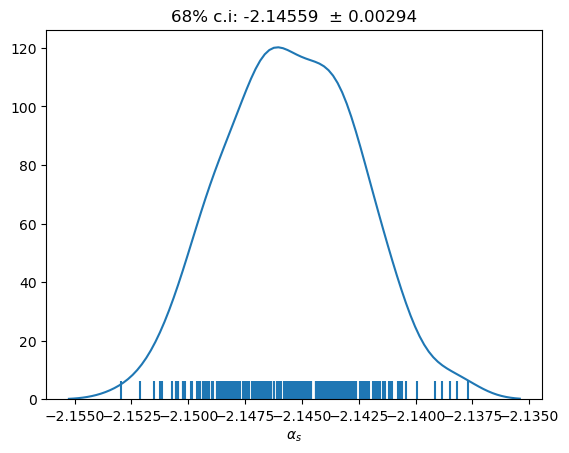

count    223.000000
mean      -2.140341
std        0.002797
min       -2.148412
16%       -2.143054
50%       -2.140288
84%       -2.137629
max       -2.132648
dtype: float64

cv±std = -2.14034 ± 0.00280 
1std interval:  -2.14314 to -2.13754 
68% c.i:        -2.14305 to -2.13763 


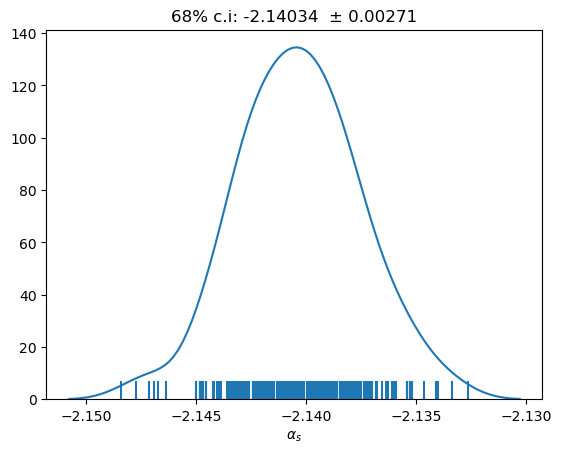

count    212.000000
mean      -2.141420
std        0.002845
min       -2.148658
16%       -2.144584
50%       -2.141422
84%       -2.138215
max       -2.134299
dtype: float64

cv±std = -2.14142 ± 0.00285 
1std interval:  -2.14427 to -2.13857 
68% c.i:        -2.14458 to -2.13822 


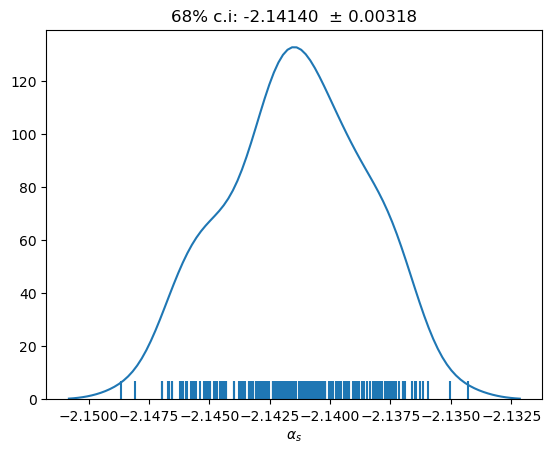

count    219.000000
mean      -2.140227
std        0.002840
min       -2.146824
16%       -2.143246
50%       -2.140070
84%       -2.137414
max       -2.132129
dtype: float64

cv±std = -2.14023 ± 0.00284 
1std interval:  -2.14307 to -2.13739 
68% c.i:        -2.14325 to -2.13741 


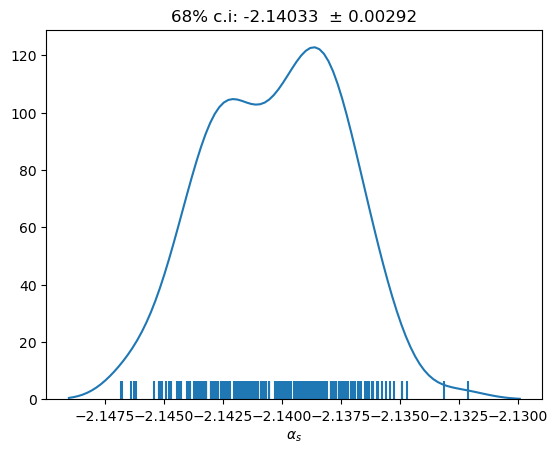

count    224.000000
mean      -2.139186
std        0.002852
min       -2.145818
16%       -2.142116
50%       -2.139342
84%       -2.136185
max       -2.131074
dtype: float64

cv±std = -2.13919 ± 0.00285 
1std interval:  -2.14204 to -2.13633 
68% c.i:        -2.14212 to -2.13618 


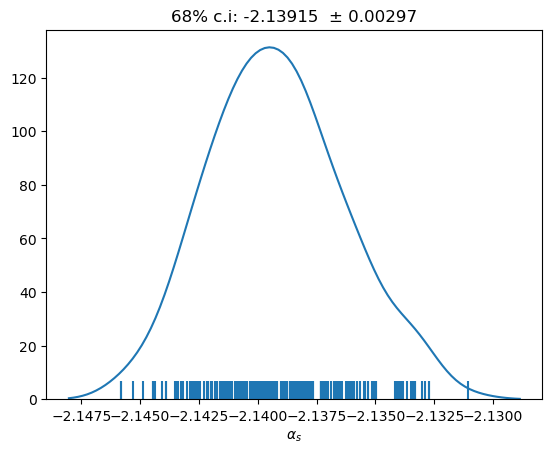

count    236.000000
mean      -2.141379
std        0.002538
min       -2.149433
16%       -2.143724
50%       -2.141310
84%       -2.138842
max       -2.133721
dtype: float64

cv±std = -2.14138 ± 0.00254 
1std interval:  -2.14392 to -2.13884 
68% c.i:        -2.14372 to -2.13884 


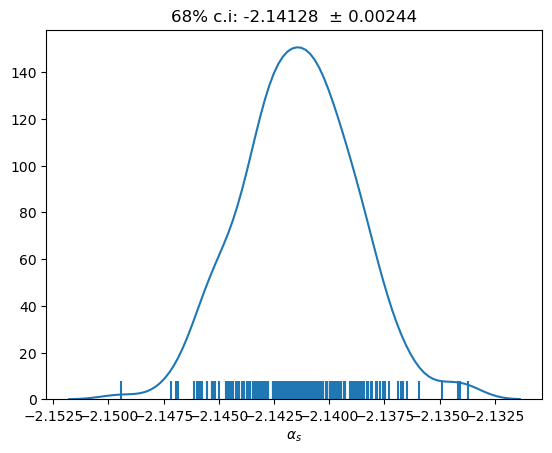

count    223.000000
mean      -2.137298
std        0.003035
min       -2.147437
16%       -2.140210
50%       -2.137369
84%       -2.134492
max       -2.129814
dtype: float64

cv±std = -2.13730 ± 0.00304 
1std interval:  -2.14033 to -2.13426 
68% c.i:        -2.14021 to -2.13449 


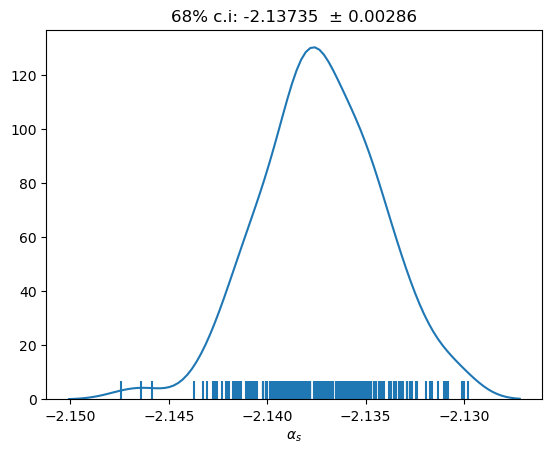

count    214.000000
mean      -2.138423
std        0.003003
min       -2.145984
16%       -2.141368
50%       -2.138530
84%       -2.135726
max       -2.130692
dtype: float64

cv±std = -2.13842 ± 0.00300 
1std interval:  -2.14143 to -2.13542 
68% c.i:        -2.14137 to -2.13573 


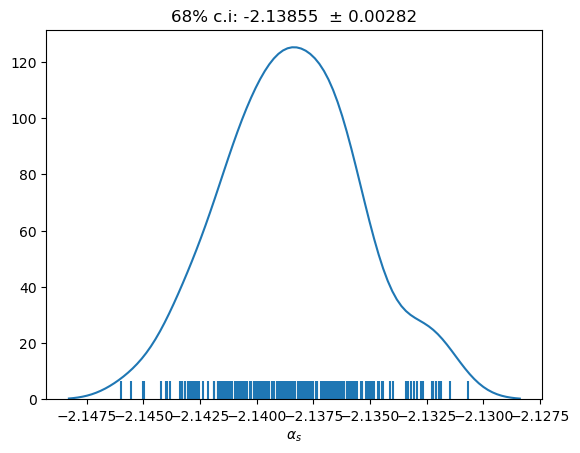

count    226.000000
mean      -2.138628
std        0.003022
min       -2.149163
16%       -2.141403
50%       -2.138586
84%       -2.135386
max       -2.132252
dtype: float64

cv±std = -2.13863 ± 0.00302 
1std interval:  -2.14165 to -2.13561 
68% c.i:        -2.14140 to -2.13539 


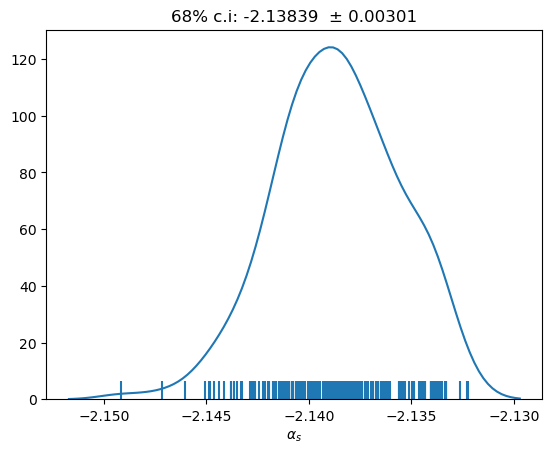

count    208.000000
mean      -2.140859
std        0.003102
min       -2.150153
16%       -2.143854
50%       -2.140422
84%       -2.137977
max       -2.133613
dtype: float64

cv±std = -2.14086 ± 0.00310 
1std interval:  -2.14396 to -2.13776 
68% c.i:        -2.14385 to -2.13798 


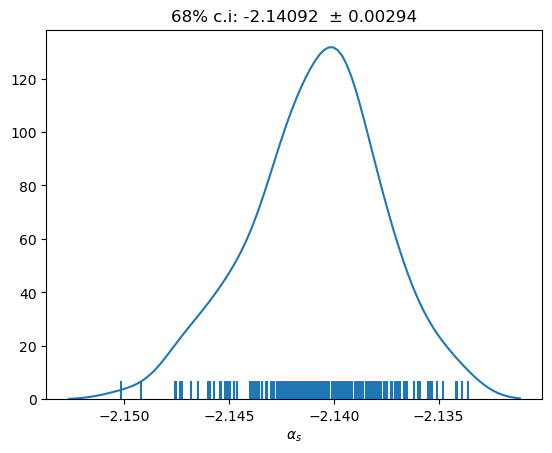

count    228.000000
mean      -2.139788
std        0.002943
min       -2.146695
16%       -2.142940
50%       -2.139885
84%       -2.136681
max       -2.132792
dtype: float64

cv±std = -2.13979 ± 0.00294 
1std interval:  -2.14273 to -2.13684 
68% c.i:        -2.14294 to -2.13668 


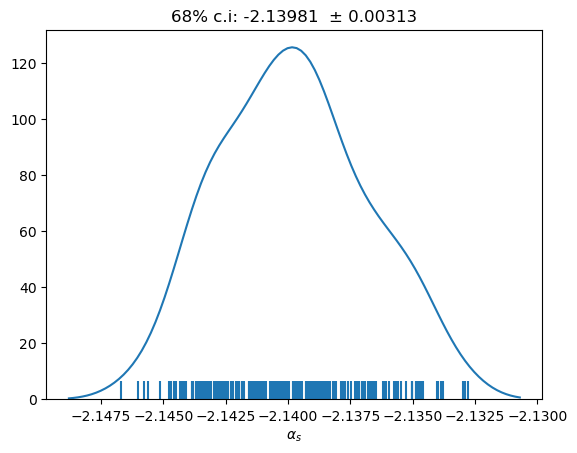

count    229.000000
mean      -2.136077
std        0.002847
min       -2.145059
16%       -2.139085
50%       -2.135663
84%       -2.133474
max       -2.128067
dtype: float64

cv±std = -2.13608 ± 0.00285 
1std interval:  -2.13892 to -2.13323 
68% c.i:        -2.13909 to -2.13347 


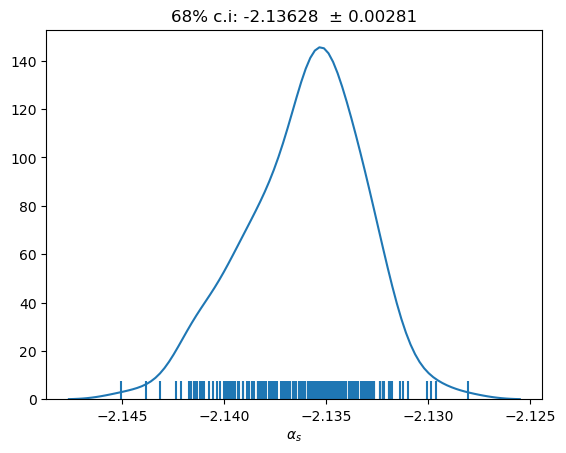

count    218.000000
mean      -2.137990
std        0.003342
min       -2.146343
16%       -2.141308
50%       -2.137993
84%       -2.134545
max       -2.129571
dtype: float64

cv±std = -2.13799 ± 0.00334 
1std interval:  -2.14133 to -2.13465 
68% c.i:        -2.14131 to -2.13455 


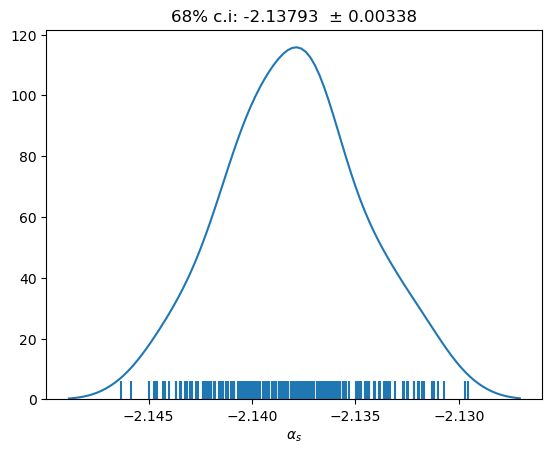

count    231.000000
mean      -2.136469
std        0.002887
min       -2.143339
16%       -2.139360
50%       -2.136351
84%       -2.133830
max       -2.128210
dtype: float64

cv±std = -2.13647 ± 0.00289 
1std interval:  -2.13936 to -2.13358 
68% c.i:        -2.13936 to -2.13383 


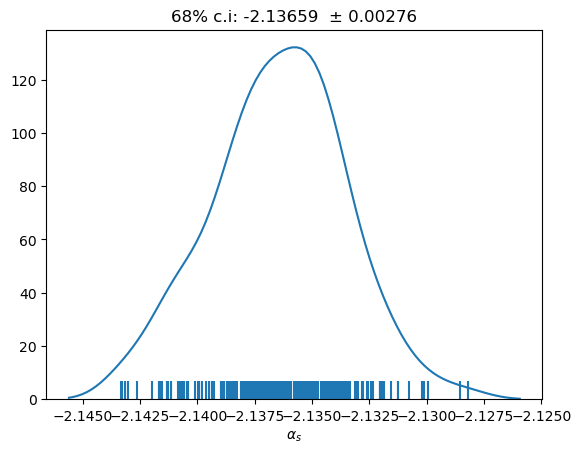

count    219.000000
mean      -2.138404
std        0.003036
min       -2.148037
16%       -2.141195
50%       -2.138570
84%       -2.135188
max       -2.130630
dtype: float64

cv±std = -2.13840 ± 0.00304 
1std interval:  -2.14144 to -2.13537 
68% c.i:        -2.14119 to -2.13519 


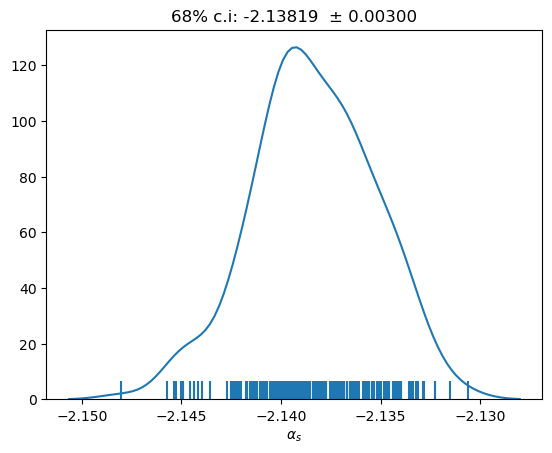

count    220.000000
mean      -2.139653
std        0.002933
min       -2.148081
16%       -2.142761
50%       -2.139628
84%       -2.136768
max       -2.132635
dtype: float64

cv±std = -2.13965 ± 0.00293 
1std interval:  -2.14259 to -2.13672 
68% c.i:        -2.14276 to -2.13677 


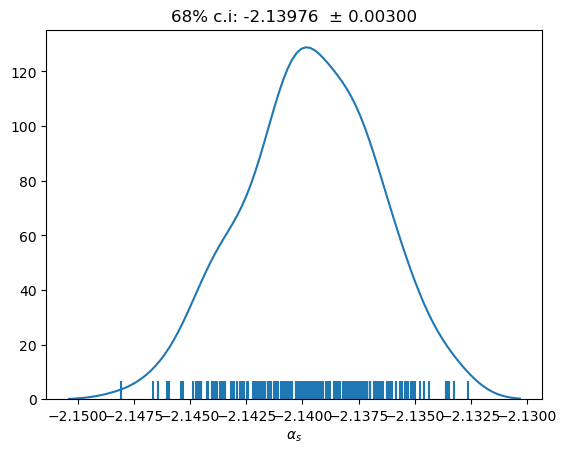

count    203.000000
mean      -2.141810
std        0.002927
min       -2.149608
16%       -2.144899
50%       -2.141736
84%       -2.138854
max       -2.134332
dtype: float64

cv±std = -2.14181 ± 0.00293 
1std interval:  -2.14474 to -2.13888 
68% c.i:        -2.14490 to -2.13885 


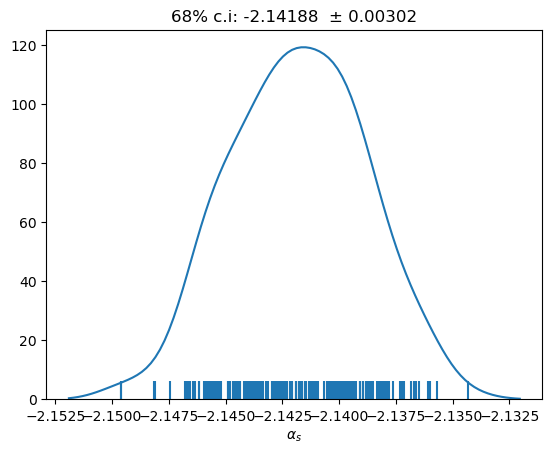

In [49]:
# Fitting parabolas
mins_crm_log = [fit_parabola(data, log=True) for data in data_crm_min]
mean_crm_log = [fit_parabola(data, log=True) for data in data_crm_mean]
mean_after_crm_log = [[fit_parabola(batch, log=True) for batch in data] for data in data_crm_all_batches]
# Describe results for each seed and collect alpha_s values and unc

alphas_crm_min_log = describe_and_collect(mins_crm_log)
alphas_crm_mean_log = describe_and_collect(mean_crm_log)
alphas_crm_mean_after_log = describe_and_collect(mean_after_crm_log, all_batches=True)
alphas_crm_mean_after_fullsample_log = describe_and_collect(mean_after_crm_log, all_batches=True, full_sample=True)

### Histograms for the log method

Result for CRM taking the MIN (fitting the log)


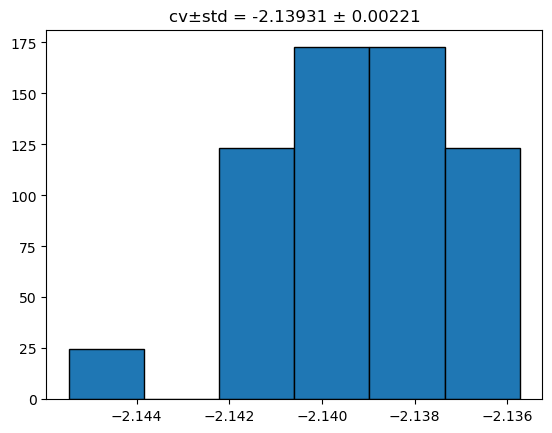

Result for CRM taking the MEAN (fitting the log)


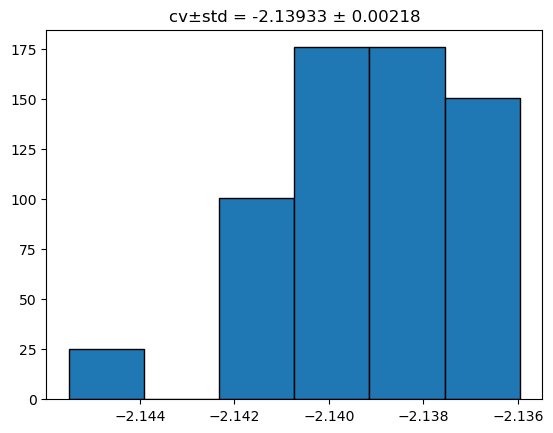

Result for CRM taking the MEAN of the alpha_s values (fitting the log)


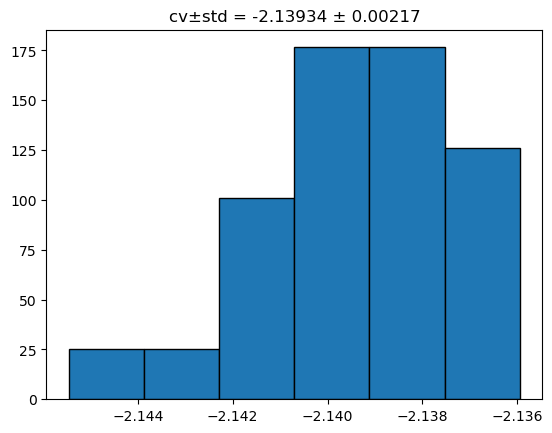

Result for CRM using the full sample (fitting the log)


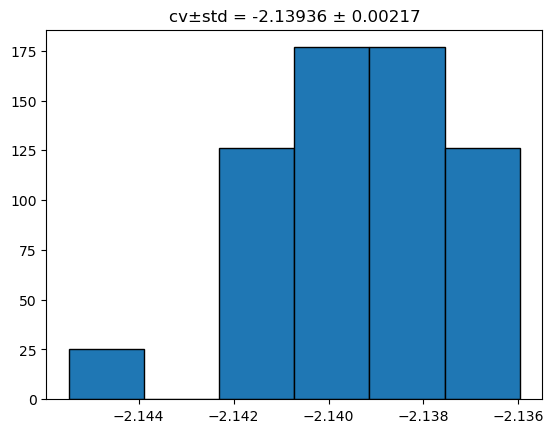

In [50]:
print("Result for CRM taking the MIN (fitting the log)")
final_alpha_crm_min_log = hist_multict_alphas(alphas_crm_min_log)
print("Result for CRM taking the MEAN (fitting the log)")
final_alpha_crm_mean_log = hist_multict_alphas(alphas_crm_mean_log)
print("Result for CRM taking the MEAN of the alpha_s values (fitting the log)")
final_alpha_crm_mean_after_log = hist_multict_alphas(alphas_crm_mean_after_log)
print("Result for CRM using the full sample (fitting the log)")
final_alpha_crm_mean_after_fullsample_log = hist_multict_alphas(alphas_crm_mean_after_fullsample_log)

In [53]:
print(f"{np.exp(-2.13931)} +- {np.exp(-2.13931)*0.00221}")

0.1177360528776425 +- 0.00026019667685958994


### Bias to variance ratio for the log method

In [24]:
ratio_crm_min_meth_boot_log = prop_unc_ratio(bootstrap_bias(alphas_crm_min_log))
print(f"R_bv for CRM taking the MIN (bootstrap) (fitting the log): {ratio_crm_min_meth_boot_log[0]} ± {ratio_crm_min_meth_boot_log[1]} ")

R_bv for CRM taking the MIN (bootstrap) (fitting the log): 0.8915310867403029 ± 0.10514902642427112 


## Experimental method

## Collect results

In [25]:
data_exp = []
for i_seed in range(25):
    data_exp.append(pd.read_csv(raw_data_path / f'{i_seed}_exp.csv', usecols=[i for i in range(1, 15)]))

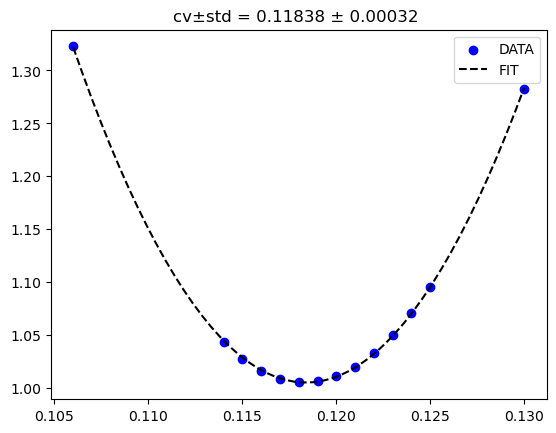

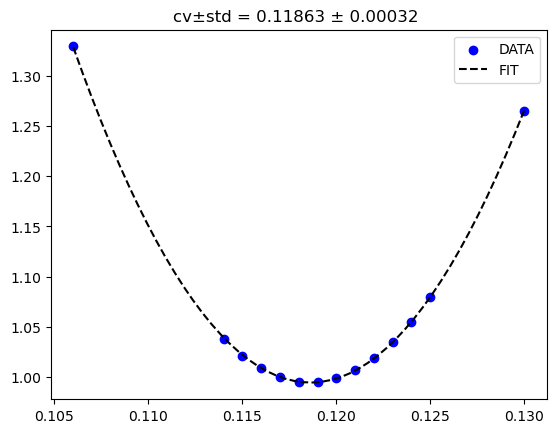

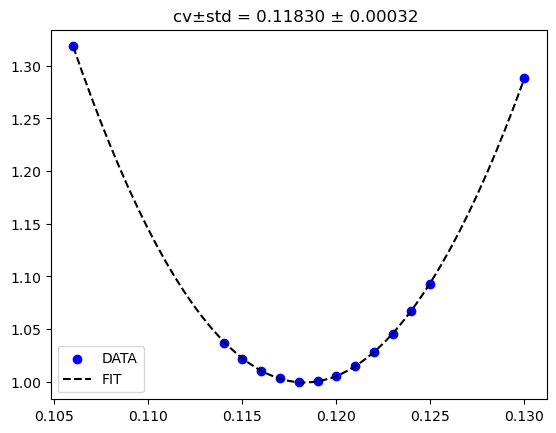

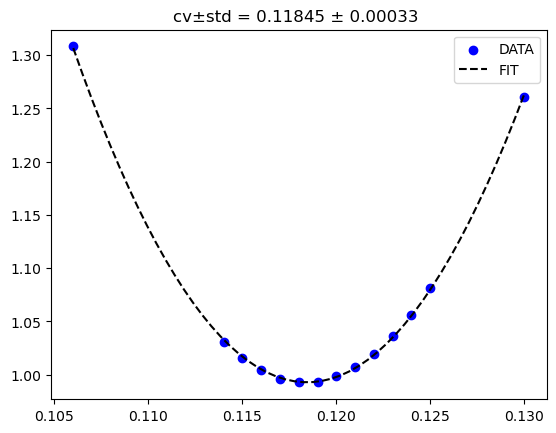

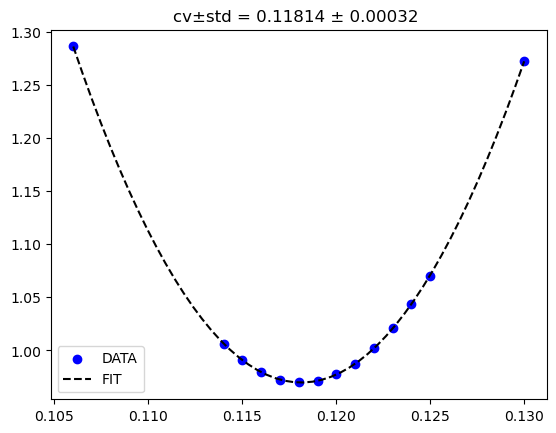

...

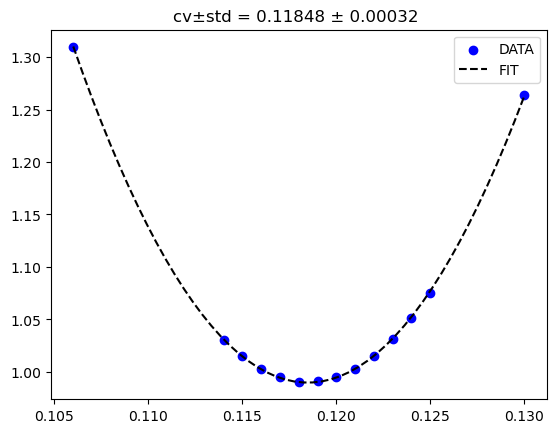

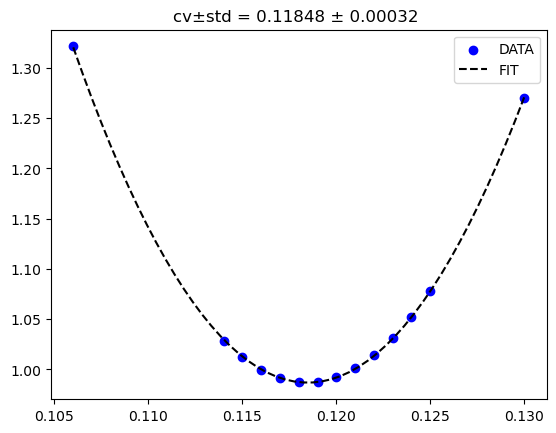

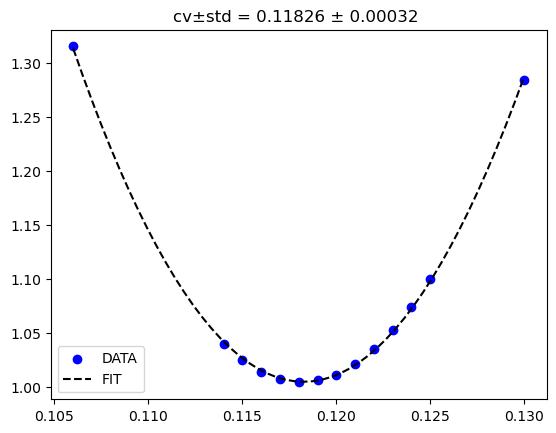

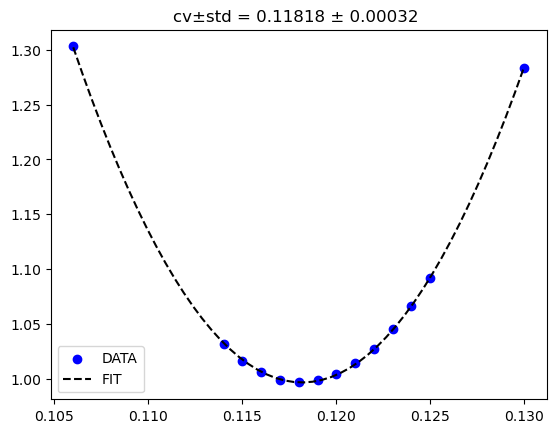

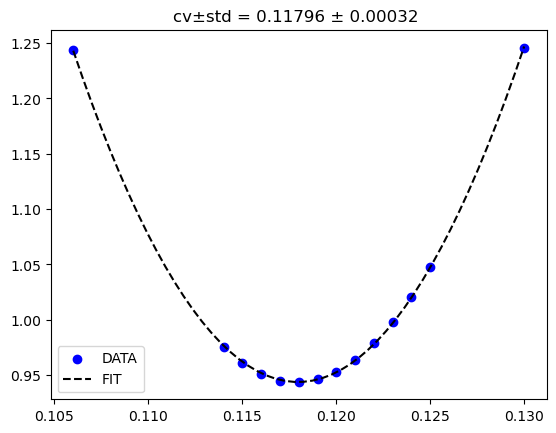

In [26]:
alphas_exp_meth = [fit_parabola(data, exp=True) for data in data_exp]
exp_alphas = []
for res in alphas_exp_meth:
    exp_alphas.append((res[0], res[1]))

## Histograms

Result for EXP method


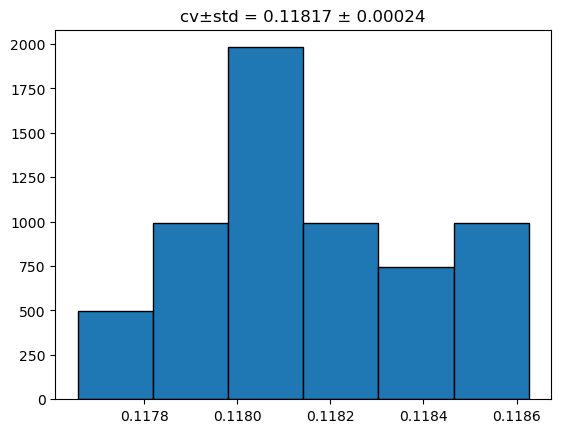

In [27]:
print("Result for EXP method")
final_alpha_exp = hist_multict_alphas(alphas_exp_meth)

## Bias to variance ratio

In [28]:
biases_exp_meth = []
for meas_val in alphas_exp_meth:
    biases_exp_meth.append(bias(meas_val, TRUE_VALUE))
ratio_exp_meth = np.sqrt(np.average(biases_exp_meth))
print(f"R_bv for experimental method: {ratio_exp_meth}")

R_bv for experimental method: 0.896493830250646


### Here we instead apply the bootstrap procedure

In [29]:
bias_exp_meth_boot = bootstrap_bias(alphas_exp_meth)
ratio_exp_meth_boot = prop_unc_ratio(bias_exp_meth_boot)
print(f"R_bv for experimenal method (bootstrap): {ratio_exp_meth_boot[0]} ± {ratio_exp_meth_boot[1]} ")

R_bv for experimenal method (bootstrap): 0.9123176198883935 ± 0.11178516177097032 


# Final comparison of the methodologies

╒══════════════════════╤═══════════╤═══════════════╤═══════════╤═════════════════════════╕
│                      │   alpha_s │   uncertainty │      R_bv │   Bootstrap uncertainty │
╞══════════════════════╪═══════════╪═══════════════╪═══════════╪═════════════════════════╡
│ CRM_min              │  0.118185 │   0.000258346 │  0.935555 │               0.115366  │
├──────────────────────┼───────────┼───────────────┼───────────┼─────────────────────────┤
│ CRM_singlebatch      │  0.118202 │   0.000253383 │  0.929082 │               0.0999007 │
├──────────────────────┼───────────┼───────────────┼───────────┼─────────────────────────┤
│ CRM_mean             │  0.118182 │   0.000254408 │  0.938962 │               0.101723  │
├──────────────────────┼───────────┼───────────────┼───────────┼─────────────────────────┤
│ CMR_mean_alpha       │  0.118127 │   0.000253924 │ 19.7011   │               4.31055   │
├──────────────────────┼───────────┼───────────────┼───────────┼─────────────────────────┤

/var/folders/25/4w83mpb16zv6m8pxz9w5b1qm0000gn/T/ipykernel_47819/3137060977.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x,normpdf,'k', color=col)


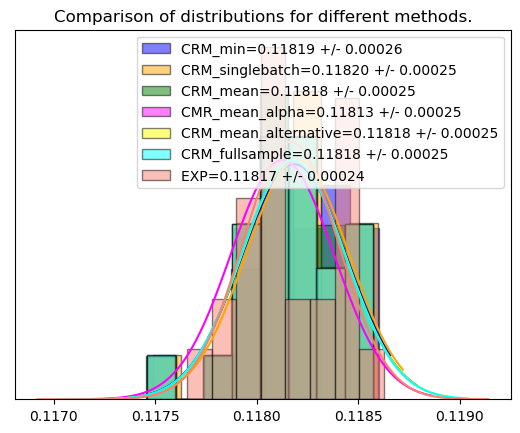

In [30]:
res_methodologies = {"CRM_min":(final_alpha_crm_min[0], final_alpha_crm_min[1], ratio_crm_min_meth_boot[0], ratio_crm_min_meth_boot[1]),"CRM_singlebatch":(final_alpha_crm_singlebatch[0], final_alpha_crm_singlebatch[1], ratio_crm_singlebatch_meth_boot[0], ratio_crm_singlebatch_meth_boot[1]), "CRM_mean":(final_alpha_crm_mean[0], final_alpha_crm_mean[1], ratio_crm_mean_meth_boot[0],ratio_crm_mean_meth_boot[1]), "CMR_mean_alpha":(final_alpha_crm_mean_after[0], final_alpha_crm_mean_after[1], ratio_crm_mean_after_meth_boot[0],ratio_crm_mean_after_meth_boot[1]),"CRM_mean_alternative":(final_alpha_crm_mean_after_alternative[0], final_alpha_crm_mean_after_alternative[1], ratio_crm_mean_after_alternative_meth_boot[0],ratio_crm_mean_after_alternative_meth_boot[1]),"CRM_fullsample":(final_alpha_crm_mean_after_fullsample[0], final_alpha_crm_mean_after_fullsample[1], ratio_crm_mean_after_fullsample_meth_boot[0],ratio_crm_mean_after_fullsample_meth_boot[1]), "EXP":(final_alpha_exp[0], final_alpha_exp[1], ratio_exp_meth_boot[0],ratio_exp_meth_boot[1]), }
compare_methodologies(res_methodologies,[alphas_crm_min, alphas_crm_singlebatch, alphas_crm_mean, alphas_crm_mean_after, alphas_crm_mean_after_alternative, alphas_crm_mean_after_joined, alphas_exp_meth])

In [47]:
## distance of the final result only
from tabulate import tabulate
def compute_distance(res, true_value):
    return (res[0]-true_value)/res[1]
distances = {}
for label, res in res_methodologies.items():
    distances[label] = compute_distance((res[0], res[1]), TRUE_VALUE)
for key, value in distances.items():
    print(f"\033[1m{key.capitalize()}: \033[0m{value}.")

Crm_min: 0.7162078549422357.
Crm_singlebatch: 0.796466623855023.
Crm_mean: 0.7165186595128895.
Cmr_mean_alpha: 0.4995052698715781.
Crm_mean_alternative: 0.7137664054965194.
Crm_fullsample: 0.7056398380394855.
Exp: 0.7092698622365973.
